In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import re

In [3]:
remainder_df = pd.read_csv('data/punt_returns.csv')

#### <a id='return_yardage'>Plot of Return Yardage</a>
[Jump to NGS Analysis](#ngs_analysis)

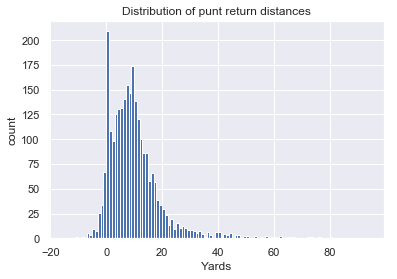

count    2600.000000
mean        9.268462
std         9.404971
min       -11.000000
25%         3.000000
50%         8.000000
75%        13.000000
max        80.000000
Name: yardage on play, dtype: float64


In [4]:
'''Plot of distribution of punt return distances'''
sns.set()
bins = [i for i in range(-15, 95, 1)]
plt.hist(remainder_df['yardage on play'], bins=bins)

plt.title('Distribution of punt return distances')
plt.xlabel('Yards')
plt.ylabel('count')
plt.show()

print(remainder_df['yardage on play'].describe())

- Punt returns really tapper off after 20 yards. Really should consider what is the 'value' of a return when considering implementing a particular rule.

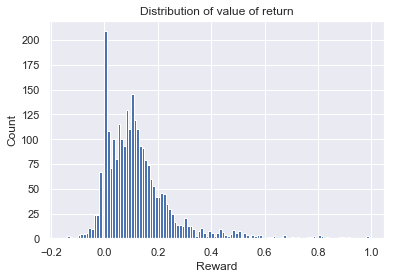

count    2600.000000
mean        0.122631
std         0.125854
min        -0.136364
25%         0.041524
50%         0.101449
75%         0.164427
max         0.986301
Name: reward, dtype: float64


In [5]:
'''Plot of distribution of value of return'''
bins = [i * 0.01 for i in range(-15, 100, 1)]
plt.hist(remainder_df['reward'], bins=bins)

plt.title('Distribution of value of return')
plt.xlabel('Reward')
plt.ylabel('Count')
plt.show()

print(remainder_df['reward'].describe())

- So there's alot you can garner from the 'PlayDescription' and play_information dataset. This workup and analysis is to extract information that maybe useful for understanding the impact of a rule change. I'll follow up this notebook with additional versions with more analysis that incorporates the NGS dataset. Cheers!

### PLAYER PUNT DATA
- <b>Player Punt Data</b>: Player level data that specifies the traditional football position for each player. Each player is identified using his GSISID.
- <b>GSISID</b>: unique id for each player
- This dataset is mostly useful for identifying particular players in the videos provided
- Note that some players are shown to have multiple jersey numbers associated with them

In [28]:
player_df = pd.read_csv('data/player_punt_data.csv')
print(player_df.shape)
print(player_df[player_df['GSISID'] == 28121])

# Clear up memory
del player_df

(3259, 3)
      GSISID Number Position
186    28121     22       RB
452    28121    31w       RB
1114   28121     28       RB
1353   28121      6       RB
2051   28121    31o       RB


### PLAY PLAYER ROLE DATA
- <b>Play Player Role Data</b>: Play and player level data that specifies a punt specific player role. This dataset will specify each player that played in each play. A player’s role in a play is uniquely defined by the Gamekey PlayID and GSISID.

In [29]:
play_player_role_df = pd.read_csv('data/play_player_role_data.csv')
print(play_player_role_df.shape)
play_player_role_df.tail(2)

(146573, 5)


,Season_Year,GameKey,PlayID,GSISID,Role
146571,2017,414,3425,33704,PRG
146572,2017,414,2210,33704,PRG


# NGS DATA
- <b>Next Gen Stats</b>:player level data that describes the movement of each player during a play. NGS data is processed by BIOCORE to produce relevant speed and direction data. The NGS data is identified using GameKey, PlayID, and GSISID. Player data for each play is provided as a function of time (Time) for the duration of the play.
- Players are recorded at every <b>10th of a second or 100 milliseconds</b>
- Field dimensions: 120 yards by 53.3 yards
- Speed can be calculated with Time and dis
- <b>'Event'</b> record events during the play such as a ball snap, the punt, when a punt is received, etc.

# <a id='ngs_analysis'>Analyze NGS play data</a>

[Plot Return Yardage](#return_yardage)
- We'll be taking our condensed set of games and natural joining with the NGS data for each year and then recombining data so we have a dataset of 'cleanish' punt returns. We'll use this data to get conditional statistics on returns given distance of closest punt player to punt receiver. We'll use the assumption that the furthest player from the punt at the 'event': 'punt_returned' is the one who actually is receiving the ball.
- Consider events, speed, and player proximities

In [30]:
# How many unique plays in play_player_role dataset?
print('# of unique plays according to play_player_role dataset:',
      len(play_player_role_df.groupby(['GameKey','PlayID']).size().reset_index().rename(columns={0:'count'})))

# How many roles are there?
print('# of roles in dataset:', len(play_player_role_df['Role'].value_counts()))

# Let's indicate what team the player is playing on based off player role
return_team_positions = ['PR', 'PDL1', 'PDL2', 'PDL3', 'PDL4', 'PDR1', 'PDR2', 'PDR3', 'PDR4', 'VL', 'VR', 
                         'PLL', 'PLR', 'VRo', 'VRi', 'VLi', 'VLo', 'PLM', 'PLR1', 'PLR2', 'PLL1', 'PLL2',
                         'PFB', 'PDL5', 'PDR5', 'PDL6', 'PLR3', 'PLL3', 'PDR6', 'PLM1', 'PDM']
punt_team_positions = ['P', 'PLS', 'PPR', 'PLG', 'PRG', 'PLT', 'PRT', 'PLW', 'PRW', 'GL', 'GR',
                       'GRo', 'GRi', 'GLi', 'GLo', 'PC', 'PPRo', 'PPRi', 'PPL', 'PPLi', 'PPLo']

# We need a list of (GameKey, PlayID) keys to properly iterate through NGS dataset in chunks
gamekey_playid_pair = play_player_role_df.groupby(['GameKey','PlayID']).size().reset_index().drop(columns=0)

# Add binary classification column for if play had a 'punt_received'
# Used to reduce processing in future analysis
gamekey_playid_pair['punt_received'] = 0

# of unique plays according to play_player_role dataset: 6670
# of roles in dataset: 52


- NGS data exists for 6666 punts 
- Play Information dataset has 6681 punts accounted for
- I just wanted to note that there is some missing data between the datasets

#### So what do I care about?
- We're going to look at how players are positioned given a particular play event. We'll look specifically at the event 'punt_received' to see how close the punt team players are to the punt receiver. I am interested in whether or not if there is much 'value' or 'reward' for returns in which an opposing player is relatively close (< 8 yards) to the punt receiver. This is done to better understand how much value would be lost if a rule in which a 'downed ball' would be called if punt team players are too close to the punt receiver before the ball is caught.
    - Reasons for having a restricted zone for the PR is to hopefully negate up to <b>18 of the concussions</b> that are in the concussion dataset. Just watch the film to see which ones this pertains too.
    - Having a restricted zone would help to slow down the punt play and allow the PR around a second to decide what to do after the catch. This could potentially temper player speeds as they approach the PR to prevent a penalty from occurring.

In [31]:
# Dataset was preprocessed in a separate notebook
condensed_ngs = pd.read_csv('data/NGS-punt_returns.csv')
condensed_ngs.head()

,GameKey,PlayID,PlayDescription,Poss_Team,YardLine,penalty on,punt distance,side ball lands,yardline received,yardage on play,reward,GSISID,Time,x,y,dis,o,dir,Event,Role
0,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651,31762.0,2016-08-11 23:50:54.300,40.450001,30.990000,0.01,343.500000,74.970001,NaN,PLG
1,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651,27539.0,2016-08-11 23:50:54.300,38.740002,27.600000,0.13,9.730000,242.610001,NaN,PPR
2,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651,32573.0,2016-08-11 23:50:54.300,40.320000,27.320000,0.02,23.820000,269.019989,NaN,PRT
3,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651,30458.0,2016-08-11 23:50:54.300,40.490002,32.279999,0.01,329.540009,45.400002,NaN,PLT
4,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651,27557.0,2016-08-11 23:50:54.300,41.200001,29.910000,0.01,10.250000,175.419998,NaN,PLS


In [113]:
def event_df_creation(df, event):
    '''Get a new dataframe with data pertinent to a particular event'''
    new_df = df[df['Event'] == event].reset_index(drop=True)
    unique_ids = new_df.groupby(['GameKey','PlayID']).size().reset_index().rename(columns={0:'count'})
    return new_df, unique_ids

In [114]:
# Look at 'punt_received' event
punt_received_df, PR_unique_ids = event_df_creation(condensed_ngs, 'punt_received')
print(punt_received_df.shape)
punt_received_df.head(1)

(56770, 20)


,GameKey,PlayID,PlayDescription,Poss_Team,YardLine,penalty on,punt distance,side ball lands,yardline received,yardage on play,reward,GSISID,Time,x,y,dis,o,dir,Event,Role
0,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651,31338.0,2016-08-11 23:51:08.400,64.199997,9.53,0.91,8.75,101.239998,punt_received,PRW


In [116]:
# Look at 'punt' event
punt_df, P_unique_ids = event_df_creation(condensed_ngs, 'punt')
print(punt_df.shape)
punt_df.head(1)

(56813, 20)


,GameKey,PlayID,PlayDescription,Poss_Team,YardLine,penalty on,punt distance,side ball lands,yardline received,yardage on play,reward,GSISID,Time,x,y,dis,o,dir,Event,Role
0,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651,24417.0,2016-08-11 23:51:04.000,31.67,29.41,0.18,346.529999,130.740005,punt,P


In [37]:
print('Number of plays with punt_received as an event:',
      punt_received_df.groupby(['GameKey','PlayID']).size().reset_index().drop(columns=0).shape[0],
     'vs', remainder_df.shape[0], 'from the remainder dataframe')
print('Number of plays with punt as an event:',
      punt_df.groupby(['GameKey','PlayID']).size().reset_index().drop(columns=0).shape[0],
     'vs', remainder_df.shape[0], 'from the remainder dataframe')

Number of plays with punt_received as an event: 2577 vs 2600 from the remainder dataframe
Number of plays with punt as an event: 2590 vs 2600 from the remainder dataframe


- I'll have to hunt down those 13 plays that have no punt returns and see whatsup later.
- So we're gonna calculate the proximity of players to the punt receiver when the ball is consider caught (event = punt_received). This will help to analyze how a plays outcome is affected by the proximity of punt team players to the PR. The <b>assumption</b> for this calculation is that the ball is always received by the PR.

In [192]:
def label_team(df):
    '''Label each player by the team they play on'''
    df['team'] = ''

    for i, role in enumerate(df['Role']):
        print(i, role)
        if role in return_team_positions:
            df.loc[i, 'team'] = 'return team'
        elif role in punt_team_positions:
            df.loc[i, 'team'] = 'punt team'
        else:
            df.loc[i, 'team'] = 'unknown'

In [251]:
# Label punt_received dataset
label_team(punt_received_df)

0 PRW
1 PRG
2 PDL2
3 PR
4 VLi
5 PDR1
6 PDL3
7 VRi
8 PDR2
9 PLM
10 VRo
11 PDL1
12 VLo
13 P
14 GL
15 GR
16 PLS
17 PLT
18 PRT
19 PPR
20 PLG
21 PLW
22 P
23 GL
24 GR
25 PLS
26 PRT
27 PPR
28 PLG
29 PLT
30 PLW
31 PRW
32 PRG
33 PR
34 VLi
35 PDL2
36 PDR3
37 PDR2
38 PLM
39 VLo
40 VRo
41 PDL1
42 PDR1
43 GL
44 PRG
45 PRT
46 GR
47 PPL
48 PLW
49 PLG
50 PLS
51 P
52 PRW
53 PLT
54 PDR4
55 PDR3
56 VL
57 PDR2
58 PDL4
59 PR
60 PDL1
61 PDR1
62 PDL3
63 VR
64 PDL2
65 PLG
66 PLT
67 PRG
68 PLW
69 PRW
70 GR
71 PRT
72 PLS
73 P
74 PPR
75 PDR3
76 PDR2
77 PDR1
78 PDL3
79 PR
80 nan
81 PDL2
82 VRi
83 PLL
84 VL
85 PDL1
86 PDL3
87 PDR5
88 PDL2
89 PDR1
90 PR
91 PDR3
92 PDL4
93 PDR2
94 PDL1
95 PDR4
96 PDL5
97 PLS
98 PLT
99 PRW
100 PRG
101 GL
102 P
103 PPR
104 PRT
105 GR
106 PLW
107 PLG
108 GR
109 PDR3
110 VRi
111 VLi
112 PLL
113 PR
114 VLo
115 PDL2
116 VRo
117 PDL1
118 PDR1
119 nan
120 P
121 PLS
122 PRW
123 PLW
124 PRG
125 PLT
126 GL
127 PPR
128 PLG
129 PRT
130 P
131 GR
132 PPR
133 PRT
134 PRW
135 PRG
136 PLS
137 PLT
138

1107 PLW
1108 PRG
1109 GL
1110 PLS
1111 PLG
1112 GL
1113 PRT
1114 PRW
1115 PLG
1116 PLT
1117 PRG
1118 P
1119 PLS
1120 PPL
1121 GR
1122 PLR
1123 PDL1
1124 PDR2
1125 VRi
1126 PDL2
1127 PDR1
1128 PR
1129 VLi
1130 VRo
1131 PDL3
1132 VLo
1133 PLW
1134 PLT
1135 PR
1136 PDL1
1137 VRi
1138 PDR2
1139 PDL2
1140 PDR1
1141 VLi
1142 VLo
1143 PLM
1144 PDL3
1145 VRo
1146 PLW
1147 PRG
1148 P
1149 PRW
1150 GR
1151 PPR
1152 PLS
1153 GL
1154 PRT
1155 PLG
1156 VLi
1157 VRi
1158 VRo
1159 PDR3
1160 VLo
1161 PDR1
1162 PLW
1163 PRG
1164 GL
1165 PPL
1166 PRT
1167 PRW
1168 GR
1169 P
1170 PLT
1171 PLS
1172 PLG
1173 PDL1
1174 PDR2
1175 PDL2
1176 PLL
1177 PR
1178 PRG
1179 PLW
1180 PLG
1181 PPL
1182 GR
1183 P
1184 PLS
1185 PRT
1186 GL
1187 PLT
1188 PRW
1189 VRi
1190 VLi
1191 PDR3
1192 VRo
1193 PDL3
1194 VLo
1195 PR
1196 PDL1
1197 PDL2
1198 PDR1
1199 PRG
1200 PLW
1201 PLG
1202 PPL
1203 GR
1204 P
1205 PLS
1206 PRT
1207 GL
1208 PLT
1209 PRW
1210 VRi
1211 VLi
1212 PDR3
1213 VRo
1214 PDL3
1215 VLo
1216 PR
1217 PDL1
1218

2104 PDL1
2105 VLi
2106 PDR1
2107 PDL3
2108 PRW
2109 GL
2110 PRG
2111 PLT
2112 PRT
2113 PLW
2114 GR
2115 PPL
2116 PLG
2117 PLS
2118 P
2119 PRW
2120 PLW
2121 P
2122 PLS
2123 PRT
2124 PLT
2125 PRG
2126 PLG
2127 GL
2128 PPR
2129 GR
2130 PR
2131 PDL2
2132 VRi
2133 VLi
2134 PDR3
2135 PLL
2136 PDL1
2137 VLo
2138 PDR2
2139 PDR1
2140 PDR3
2141 VLo
2142 PDR2
2143 VRi
2144 PDL2
2145 PDL1
2146 VLi
2147 VRo
2148 PDR1
2149 PDL3
2150 PR
2151 PRT
2152 PLW
2153 GR
2154 PPL
2155 PLG
2156 PRW
2157 GL
2158 PRG
2159 PLS
2160 P
2161 PLT
2162 VLo
2163 PDL1
2164 VLi
2165 PDL2
2166 PDR1
2167 PDR3
2168 PDR2
2169 VRi
2170 VRo
2171 PR
2172 PLL
2173 PLT
2174 PRW
2175 PLG
2176 PRT
2177 PLW
2178 PRG
2179 GL
2180 PLS
2181 P
2182 PPR
2183 PDR2
2184 VRi
2185 VRo
2186 PR
2187 PLL
2188 PLG
2189 PRW
2190 PRG
2191 GR
2192 GL
2193 PPR
2194 PLT
2195 PRT
2196 PLW
2197 PLS
2198 P
2199 VLo
2200 PDL1
2201 VLi
2202 PDL2
2203 PDR1
2204 PDR3
2205 VRi
2206 VL
2207 PFB
2208 PLM
2209 PDL2
2210 P
2211 PLT
2212 PRG
2213 PLW
2214 PLS
22

3120 PLR
3121 VLo
3122 PR
3123 PLG
3124 PRW
3125 P
3126 PPR
3127 GL
3128 PLT
3129 PRG
3130 GR
3131 PLS
3132 PRT
3133 PLW
3134 VRi
3135 PDL1
3136 PLR
3137 VLi
3138 VRo
3139 PR
3140 PDL3
3141 VLo
3142 PDR2
3143 PDL2
3144 PDR1
3145 VLi
3146 VLo
3147 PLR
3148 PR
3149 PDR2
3150 PDL1
3151 PDL3
3152 VRo
3153 VRi
3154 PDL2
3155 PDR1
3156 P
3157 PLS
3158 PRW
3159 PPR
3160 GL
3161 GR
3162 PRT
3163 PLG
3164 PRG
3165 PLT
3166 PLW
3167 VLi
3168 PLR
3169 PDL1
3170 VRi
3171 PDL3
3172 VLo
3173 PR
3174 VRo
3175 PDR2
3176 PDL2
3177 PDR1
3178 PLW
3179 P
3180 PLS
3181 PRG
3182 GL
3183 GR
3184 PPR
3185 PRT
3186 PRW
3187 PLG
3188 PLT
3189 PPL
3190 GL
3191 P
3192 PRG
3193 PRW
3194 PLW
3195 PRT
3196 PLT
3197 GR
3198 PLS
3199 PLG
3200 PDR1
3201 PDL1
3202 VLi
3203 PDR2
3204 VRo
3205 PDL3
3206 PR
3207 PDL2
3208 PDL4
3209 VLo
3210 VLi
3211 PDR2
3212 VRo
3213 PDR1
3214 PDL2
3215 PR
3216 PLW
3217 P
3218 PLS
3219 GR
3220 PRG
3221 PPR
3222 PRT
3223 PRW
3224 PLT
3225 PLG
3226 GL
3227 VLo
3228 PDL1
3229 PLR
3230 VRi
32

4080 GR
4081 PRG
4082 PRT
4083 PLS
4084 PLW
4085 PDR2
4086 PLR
4087 PR
4088 VLi
4089 PDL2
4090 VLo
4091 PDR1
4092 PDL1
4093 PDL3
4094 VRi
4095 VRo
4096 PRG
4097 PRW
4098 GL
4099 P
4100 PLS
4101 PLG
4102 GR
4103 PRT
4104 PLW
4105 PPR
4106 PLT
4107 PDL2
4108 PDL1
4109 PDR2
4110 PR
4111 VRi
4112 VLo
4113 PDR3
4114 VLi
4115 PDL3
4116 VRo
4117 PDR1
4118 PRW
4119 PLT
4120 PRG
4121 GL
4122 PPR
4123 PRT
4124 GR
4125 PLW
4126 PLG
4127 PLS
4128 P
4129 PPR
4130 PRW
4131 P
4132 PLT
4133 PDR2
4134 PDL3
4135 PDR1
4136 PDR3
4137 PLM
4138 PDL2
4139 PFB
4140 PDL1
4141 PR
4142 VL
4143 VR
4144 GL
4145 GR
4146 PRG
4147 PLS
4148 PRT
4149 PLG
4150 PLW
4151 VL
4152 PLR
4153 GR
4154 GL
4155 PRG
4156 PLG
4157 PRT
4158 PRW
4159 PLS
4160 P
4161 PLW
4162 PLT
4163 PPR
4164 PDR2
4165 PDR1
4166 PDL1
4167 PDL3
4168 PLL
4169 PDR3
4170 VR
4171 PDL2
4172 PR
4173 GR
4174 GL
4175 PRG
4176 PLG
4177 PRT
4178 PRW
4179 PLS
4180 P
4181 PLW
4182 PLT
4183 PPR
4184 PDR1
4185 PLR
4186 PDL3
4187 PFB
4188 PDL2
4189 PDR3
4190 VR
4191

5019 PLG
5020 VLo
5021 PDL1
5022 VRi
5023 PDL3
5024 PDR1
5025 PDR2
5026 VRo
5027 PLM
5028 VLi
5029 PR
5030 PDL2
5031 P
5032 PRT
5033 PPL
5034 PLW
5035 PLT
5036 PLS
5037 PR
5038 PDL1
5039 PDR3
5040 PDL3
5041 VR
5042 PDR1
5043 PDR4
5044 PDR2
5045 VL
5046 PFB
5047 PDL2
5048 GL
5049 GR
5050 PRW
5051 PRG
5052 PLG
5053 PPR
5054 PLG
5055 PLT
5056 PLS
5057 GR
5058 PRG
5059 P
5060 PRT
5061 PLW
5062 GL
5063 PRW
5064 VLi
5065 VLo
5066 PDR3
5067 PDL3
5068 PR
5069 PDR2
5070 PDR1
5071 VRo
5072 VRi
5073 PDL1
5074 PDL2
5075 PDR2
5076 PDR1
5077 PDR3
5078 VR
5079 PDL1
5080 PDL3
5081 PLL
5082 VL
5083 PFB
5084 PDL2
5085 GL
5086 PRG
5087 GR
5088 PRW
5089 PLW
5090 P
5091 PLG
5092 PRT
5093 PPR
5094 PLT
5095 PLS
5096 PR
5097 PRG
5098 PPR
5099 PLG
5100 PLT
5101 PLS
5102 GL
5103 PRW
5104 PRT
5105 P
5106 GR
5107 PLW
5108 PDL3
5109 VLi
5110 PDL2
5111 PR
5112 nan
5113 PDR2
5114 PDR3
5115 VRi
5116 PDR1
5117 PDL1
5118 VLo
5119 PR
5120 PDR2
5121 VL
5122 PDR1
5123 PDR3
5124 PDR2
5125 VR
5126 PDL1
5127 PDL3
5128 PLL
51

6016 PDL3
6017 VRo
6018 VLo
6019 PDR1
6020 PDL3
6021 VRi
6022 VLi
6023 VLo
6024 PDR2
6025 PR
6026 PDL2
6027 VRo
6028 PDR3
6029 PDL1
6030 GR
6031 PLG
6032 PPR
6033 PLS
6034 PRG
6035 PLW
6036 PRW
6037 PLT
6038 P
6039 PRT
6040 GL
6041 PRW
6042 PLT
6043 P
6044 GR
6045 PRT
6046 PDR2
6047 PDL2
6048 VLo
6049 PDR1
6050 PR
6051 PDL1
6052 PDR3
6053 VRi
6054 VRo
6055 PDL3
6056 VLi
6057 PLG
6058 PPR
6059 PLS
6060 PRG
6061 PLW
6062 GL
6063 PRT
6064 PLW
6065 GR
6066 PRW
6067 PRG
6068 PLG
6069 PPR
6070 P
6071 GL
6072 PLT
6073 PLS
6074 PDR1
6075 PDR2
6076 PR
6077 PDL1
6078 PDR3
6079 VRo
6080 VLo
6081 PLM
6082 VRi
6083 PDL2
6084 VLi
6085 PRT
6086 PLW
6087 PRG
6088 GR
6089 PRW
6090 PPR
6091 PLG
6092 GL
6093 P
6094 PLT
6095 PLS
6096 PDR2
6097 PDL1
6098 PDR1
6099 PR
6100 PDR3
6101 VR
6102 VLo
6103 PDL3
6104 PDL2
6105 VLi
6106 VLo
6107 VRi
6108 PR
6109 PDR2
6110 PDL3
6111 PDR3
6112 PDR1
6113 VLi
6114 PDL1
6115 VRo
6116 PDL2
6117 P
6118 PRT
6119 PLW
6120 PPL
6121 PRG
6122 PRW
6123 PLG
6124 GR
6125 PLS
6126 

6953 VRo
6954 PR
6955 PDR1
6956 VLo
6957 PDL2
6958 VLi
6959 PDR2
6960 PDL3
6961 GR
6962 PLS
6963 PLW
6964 GL
6965 PPR
6966 PRG
6967 PRT
6968 PLT
6969 PLG
6970 PRW
6971 P
6972 PDL3
6973 PDR3
6974 PDL1
6975 VRo
6976 VRi
6977 PDR2
6978 PR
6979 PDR1
6980 VLo
6981 PDL2
6982 VLi
6983 PLS
6984 PRG
6985 PPR
6986 GR
6987 PLT
6988 GL
6989 PRT
6990 PRW
6991 PLW
6992 PLG
6993 P
6994 PDR1
6995 PDL2
6996 PDL1
6997 PLL
6998 VRi
6999 VRo
7000 PDR3
7001 PR
7002 VLo
7003 VLi
7004 PDR2
7005 PDR3
7006 PDL1
7007 VRi
7008 VRo
7009 VLo
7010 PDL2
7011 PR
7012 PDL3
7013 VLi
7014 PDR1
7015 PDR2
7016 PLG
7017 PRW
7018 PPR
7019 PLS
7020 PLW
7021 P
7022 PLT
7023 GR
7024 PRG
7025 GL
7026 PRG
7027 PDL3
7028 PDL1
7029 VRi
7030 VRo
7031 VLo
7032 PDL2
7033 PR
7034 PDR3
7035 VLi
7036 PDR1
7037 PDR2
7038 PLG
7039 PRW
7040 PLS
7041 PLW
7042 P
7043 PLT
7044 PPR
7045 GR
7046 PRT
7047 GL
7048 PRG
7049 PLS
7050 PLW
7051 GL
7052 PLT
7053 PRW
7054 PLG
7055 PDL3
7056 PR
7057 VRo
7058 VRi
7059 PDL2
7060 VLi
7061 PDL1
7062 PLR
706

8091 PDL1
8092 PR
8093 VLi
8094 VLo
8095 PDR1
8096 PDR2
8097 PLL2
8098 PDL2
8099 VR
8100 PRW
8101 GR
8102 PLW
8103 PLT
8104 GL
8105 P
8106 PLG
8107 GL
8108 PRW
8109 PLT
8110 PLW
8111 GR
8112 PRG
8113 PRT
8114 PLG
8115 PPL
8116 P
8117 PLS
8118 PDR1
8119 PDR2
8120 PDL2
8121 PR
8122 VLi
8123 PLR
8124 PDL1
8125 VRo
8126 VRi
8127 VLo
8128 PDL3
8129 PRW
8130 PRG
8131 PLT
8132 GR
8133 P
8134 PRT
8135 GL
8136 PPL
8137 PLW
8138 PLG
8139 PLS
8140 VRi
8141 VRo
8142 PDL3
8143 PDL2
8144 PDR3
8145 PR
8146 PDR1
8147 PDR2
8148 PDL1
8149 VL
8150 PLR
8151 GR
8152 P
8153 PRT
8154 GL
8155 PPR
8156 PLW
8157 PLG
8158 PRW
8159 PRG
8160 PLS
8161 PLT
8162 VRi
8163 VRo
8164 PDL3
8165 PDL1
8166 PDR3
8167 PR
8168 PDR1
8169 PDR2
8170 PDL2
8171 VL
8172 PLL
8173 GR
8174 P
8175 PRT
8176 GL
8177 PPL
8178 PLW
8179 PLG
8180 PRW
8181 PLS
8182 PRG
8183 PLT
8184 PDR1
8185 VR
8186 PDR4
8187 PDL1
8188 PDL4
8189 PR
8190 PDR2
8191 PDR3
8192 PDL3
8193 VL
8194 PDL2
8195 GL
8196 P
8197 PRT
8198 GR
8199 PPL
8200 PLW
8201 PLG
8202 

9089 PRG
9090 PLG
9091 PLS
9092 GR
9093 PRT
9094 PRW
9095 PLW
9096 P
9097 PRW
9098 PPR
9099 GL
9100 GR
9101 PLT
9102 PRG
9103 PLG
9104 PLS
9105 PRT
9106 VR
9107 PDR1
9108 PLL
9109 PDL2
9110 PDL3
9111 PDR2
9112 PDR4
9113 PDR3
9114 PR
9115 VL
9116 PDL1
9117 nan
9118 PR
9119 PDL2
9120 PDR2
9121 PDR1
9122 PLR
9123 GL
9124 P
9125 PPR
9126 PLT
9127 PLW
9128 PRG
9129 PLG
9130 PLS
9131 GR
9132 PRT
9133 PRW
9134 VRi
9135 VRo
9136 PDL1
9137 PDR3
9138 VL
9139 PLL
9140 PLW
9141 P
9142 PRW
9143 PPR
9144 GL
9145 GR
9146 PLT
9147 PRG
9148 PLG
9149 PLS
9150 PRT
9151 VRo
9152 VRi
9153 PLM
9154 PDL2
9155 PDL3
9156 PDR1
9157 PDL4
9158 PDR2
9159 PR
9160 VL
9161 PDL1
9162 VR
9163 PDR1
9164 PDL1
9165 PLL2
9166 VL
9167 PDR4
9168 PR
9169 PDL2
9170 PDR3
9171 PDR2
9172 PLL1
9173 GL
9174 P
9175 PLT
9176 PLW
9177 PRG
9178 PLG
9179 PLS
9180 PPL
9181 PRT
9182 GR
9183 PRW
9184 PRW
9185 PPR
9186 PLW
9187 PRT
9188 PLG
9189 GL
9190 P
9191 PLS
9192 GR
9193 PLT
9194 PRG
9195 PDL2
9196 PDR2
9197 PDL1
9198 PDR3
9199 PR
920

10034 PPR
10035 GL
10036 GR
10037 PRT
10038 PLG
10039 P
10040 PLL
10041 PDR1
10042 VR
10043 PDL2
10044 PDL3
10045 PDR1
10046 VL
10047 PDL1
10048 PDR3
10049 PLW
10050 GL
10051 PRW
10052 PLT
10053 GR
10054 PRG
10055 PRT
10056 PPL
10057 P
10058 PLS
10059 PLG
10060 PR
10061 PFB
10062 PLL
10063 PDR2
10064 PDR1
10065 VLi
10066 PDL3
10067 PDL1
10068 PDR2
10069 PDR3
10070 VLo
10071 PLL
10072 PDL2
10073 VR
10074 PR
10075 PLS
10076 PPR
10077 PRG
10078 GR
10079 PLG
10080 P
10081 PLT
10082 PRT
10083 PLW
10084 GL
10085 PRW
10086 PDL1
10087 VR
10088 PDR4
10089 PLR
10090 PR
10091 VL
10092 PDR2
10093 PLL
10094 PDR1
10095 PDR3
10096 PDL2
10097 PLG
10098 GL
10099 PPR
10100 PRT
10101 PLW
10102 GR
10103 PLT
10104 PLS
10105 PRG
10106 PRW
10107 nan
10108 P
10109 PRG
10110 PPR
10111 GR
10112 GL
10113 PRT
10114 PLW
10115 PLG
10116 PLT
10117 PDL4
10118 PR
10119 PDL1
10120 PDL3
10121 PDR4
10122 PDR1
10123 VL
10124 VR
10125 PDR3
10126 PDR2
10127 PDL2
10128 PRW
10129 PLS
10130 P
10131 PDL3
10132 PLR
10133 PDL1
10

10982 nan
10983 nan
10984 PLG
10985 PLW
10986 GR
10987 PLS
10988 PLT
10989 GL
10990 PPR
10991 PRT
10992 P
10993 PDL3
10994 PDL1
10995 PLR
10996 PDR1
10997 PRG
10998 PRW
10999 VRi
11000 nan
11001 nan
11002 PR
11003 PDL1
11004 PDR3
11005 VRi
11006 PLM
11007 PDR1
11008 VRo
11009 VLo
11010 VLi
11011 nan
11012 PRW
11013 nan
11014 nan
11015 nan
11016 PLS
11017 nan
11018 nan
11019 nan
11020 nan
11021 GR
11022 PLW
11023 PPL
11024 PLT
11025 PRT
11026 PDL2
11027 PR
11028 PDL3
11029 PLR
11030 VR
11031 VLi
11032 PDR3
11033 PDL1
11034 PDR2
11035 PRW
11036 PLW
11037 PPL
11038 PLT
11039 GR
11040 PRG
11041 PRT
11042 PLS
11043 PLG
11044 GL
11045 P
11046 PDR1
11047 VLo
11048 PDL2
11049 PDL3
11050 VR
11051 PDL2
11052 PDL1
11053 PDL4
11054 PDR2
11055 PR
11056 PDR1
11057 VL
11058 PDR3
11059 PDR4
11060 PLW
11061 PRT
11062 PRG
11063 GL
11064 PLS
11065 PLT
11066 PLG
11067 GR
11068 P
11069 PPR
11070 PRW
11071 GR
11072 PRW
11073 PLW
11074 PPL
11075 PLT
11076 PRG
11077 PRT
11078 PLS
11079 PLG
11080 GL
11081 P
11

11833 PRT
11834 PPR
11835 P
11836 PLG
11837 PLS
11838 PRW
11839 PRG
11840 PLT
11841 GL
11842 PR
11843 PLM
11844 PDL1
11845 VLi
11846 PDR1
11847 PDR2
11848 PDL2
11849 VR
11850 PFB
11851 VLo
11852 PDL3
11853 PLW
11854 GR
11855 PRT
11856 PPR
11857 P
11858 PLG
11859 PLS
11860 PRW
11861 PRG
11862 PLT
11863 GL
11864 PLW
11865 GR
11866 PRW
11867 PDL4
11868 VR
11869 PDL1
11870 VLo
11871 PDL2
11872 PDR1
11873 PLR
11874 PDL3
11875 PDR2
11876 PR
11877 VLi
11878 PLS
11879 PRG
11880 GL
11881 PPR
11882 PLG
11883 P
11884 PLT
11885 PRT
11886 GL
11887 PLG
11888 GR
11889 PPL
11890 PRG
11891 PLW
11892 P
11893 PRT
11894 PRW
11895 PLT
11896 PLS
11897 PDL3
11898 PR
11899 PLM
11900 PDR2
11901 PLL
11902 VR
11903 PDL2
11904 PDL4
11905 PDR1
11906 PDL1
11907 VL
11908 GR
11909 PLG
11910 PRW
11911 GL
11912 PRG
11913 P
11914 PRT
11915 PPL
11916 PLW
11917 PLT
11918 PLS
11919 PDR2
11920 PDR3
11921 PR
11922 PLR
11923 PDR1
11924 PLL
11925 VR
11926 PDL1
11927 PDL2
11928 VLi
11929 VLo
11930 PDR3
11931 PR
11932 VRi
11933 

12700 VRo
12701 PDL4
12702 PLR
12703 VL
12704 PDR2
12705 PR
12706 PDL3
12707 PDR3
12708 PDL2
12709 VR
12710 PDR1
12711 PDL1
12712 P
12713 PRT
12714 PRG
12715 GR
12716 PLG
12717 GL
12718 PRW
12719 PLS
12720 PLT
12721 PPR
12722 PLW
12723 PPL
12724 PLT
12725 P
12726 PRW
12727 GR
12728 PLW
12729 GL
12730 PRG
12731 PLG
12732 PLS
12733 PRT
12734 PLR2
12735 PDL2
12736 PDR1
12737 PDR2
12738 PR
12739 PDL1
12740 VLi
12741 VLo
12742 PDL3
12743 PLR1
12744 VR
12745 VRi
12746 PFB
12747 PDR2
12748 PDL2
12749 VRo
12750 PDL1
12751 VL
12752 PR
12753 PDL3
12754 PDR1
12755 nan
12756 PDR3
12757 P
12758 PRT
12759 PRG
12760 PLG
12761 GR
12762 PRW
12763 GL
12764 PLS
12765 PLT
12766 PPR
12767 PLW
12768 PDL3
12769 PR
12770 PLR
12771 VL
12772 PDR2
12773 PLL
12774 PDR3
12775 PDL2
12776 VR
12777 PDR1
12778 PDL1
12779 PRW
12780 P
12781 PRT
12782 GL
12783 PRG
12784 PLS
12785 PLT
12786 PPR
12787 PLG
12788 PLW
12789 GR
12790 PRW
12791 PLW
12792 PRG
12793 PPL
12794 PLS
12795 GL
12796 PLT
12797 GR
12798 PLG
12799 PRT
12

13536 VLi
13537 VRo
13538 PR
13539 PRW
13540 PRG
13541 GL
13542 GR
13543 PRT
13544 PLT
13545 PLG
13546 PPL
13547 P
13548 PLS
13549 PLW
13550 VRo
13551 PDL1
13552 PDR2
13553 PDL2
13554 PDR3
13555 PR
13556 VRi
13557 VLo
13558 PDR1
13559 VLi
13560 PLL
13561 PDL1
13562 PLL
13563 VRo
13564 PR
13565 VRi
13566 PDR1
13567 PDR2
13568 PDL2
13569 PLR
13570 PDR3
13571 VL
13572 PPL
13573 PRW
13574 PLG
13575 PLW
13576 PRG
13577 P
13578 PLS
13579 PLT
13580 GR
13581 PRT
13582 GL
13583 VR
13584 PDR3
13585 PR
13586 PLM
13587 PRW
13588 PRG
13589 GL
13590 GR
13591 PRT
13592 PLT
13593 PLG
13594 PPR
13595 P
13596 PLS
13597 PLW
13598 PDL3
13599 PDL1
13600 PDR2
13601 PDL2
13602 VLo
13603 PDR1
13604 VLi
13605 PLR1
13606 PLL
13607 PRW
13608 PRG
13609 GL
13610 GR
13611 PRT
13612 PLT
13613 PLG
13614 PPL
13615 P
13616 PLS
13617 PLW
13618 PLR2
13619 PDL1
13620 PDR2
13621 PDL2
13622 VR
13623 PDR1
13624 VL
13625 PDL3
13626 PR
13627 PDL3
13628 PDL1
13629 PDR2
13630 PR
13631 PDL2
13632 VRi
13633 VRo
13634 PDR1
13635 PL

14430 PLW
14431 PLG
14432 PRT
14433 P
14434 PDR2
14435 PDL2
14436 PR
14437 VRo
14438 PDL1
14439 VL
14440 PDR4
14441 PDR1
14442 PLL
14443 PDR3
14444 VRi
14445 PLR
14446 PDL2
14447 VLi
14448 PRW
14449 GL
14450 PPR
14451 PRG
14452 PLS
14453 PLT
14454 GR
14455 PLW
14456 PLG
14457 PRT
14458 P
14459 PDL1
14460 PDR2
14461 PR
14462 VLo
14463 PLL1
14464 VR
14465 PLL2
14466 PDR1
14467 GR
14468 PLG
14469 GL
14470 PLW
14471 PRG
14472 PPL
14473 P
14474 PRT
14475 PRW
14476 PLT
14477 PLS
14478 PLR1
14479 PDR2
14480 VR
14481 PDR3
14482 VL
14483 PDR1
14484 PLL
14485 PDL2
14486 PR
14487 PDL1
14488 PLR2
14489 PDL3
14490 PR
14491 VRi
14492 PFB
14493 PDR3
14494 VRo
14495 PDL2
14496 PDL1
14497 PDR1
14498 PDR2
14499 VL
14500 PLW
14501 PLS
14502 PRT
14503 PLG
14504 PLT
14505 PRG
14506 GR
14507 P
14508 GL
14509 PRW
14510 PPR
14511 GR
14512 PRW
14513 GL
14514 PRG
14515 PLG
14516 PLW
14517 P
14518 PRT
14519 PPR
14520 PLT
14521 PLS
14522 PLL1
14523 PDR2
14524 VL
14525 PLR
14526 PDR1
14527 PDL2
14528 PR
14529 PDL1

15325 VR
15326 PDR3
15327 PLR
15328 PDL1
15329 PR
15330 PDL4
15331 PDL3
15332 PDR2
15333 PDR1
15334 VL
15335 PLW
15336 PPL
15337 PLS
15338 PRW
15339 PRT
15340 P
15341 GL
15342 PLG
15343 PRG
15344 PLT
15345 GR
15346 PDL1
15347 PR
15348 PDL3
15349 PDL2
15350 PDR2
15351 PDR1
15352 PLW
15353 PPR
15354 PLS
15355 PRW
15356 PRT
15357 P
15358 GL
15359 PLG
15360 PRG
15361 PLT
15362 GR
15363 PLL
15364 PDR3
15365 VL
15366 VR
15367 PLR
15368 VL
15369 PLR2
15370 VR
15371 PDR2
15372 PLL
15373 PR
15374 PDL3
15375 PDL2
15376 PDR1
15377 PDL1
15378 PLR1
15379 PLW
15380 PPL
15381 PLS
15382 PRW
15383 PRT
15384 P
15385 GL
15386 PLG
15387 PRG
15388 PLT
15389 GR
15390 PLW
15391 PRG
15392 P
15393 PLS
15394 PPL
15395 GR
15396 PRW
15397 GL
15398 PRT
15399 PLG
15400 PLT
15401 PDR3
15402 PDR2
15403 PDL3
15404 PDL1
15405 VLi
15406 PR
15407 VLo
15408 PDL2
15409 PDR4
15410 PDR5
15411 PDR1
15412 PR
15413 PLR
15414 PDL4
15415 VR
15416 PDL3
15417 PDL1
15418 PDR2
15419 VL
15420 PFB
15421 PDL2
15422 PDR1
15423 PPL
15424 

16207 PDR4
16208 VL
16209 PDR2
16210 PFB
16211 PDL1
16212 PDL3
16213 PDR3
16214 PPR
16215 P
16216 PLW
16217 PLG
16218 PLS
16219 GR
16220 PRW
16221 PRT
16222 PRG
16223 PLT
16224 GL
16225 PDR1
16226 PR
16227 VR
16228 PDL3
16229 PDL2
16230 VL
16231 PDR3
16232 PLL
16233 PDL1
16234 PLR
16235 PDR2
16236 PPR
16237 GR
16238 P
16239 PLW
16240 PLG
16241 PLS
16242 PRW
16243 PRT
16244 PRG
16245 PLT
16246 GL
16247 PDR1
16248 PR
16249 VR
16250 PDL3
16251 PDR3
16252 VL
16253 PDR2
16254 PFB
16255 PDL1
16256 PDL2
16257 PDL4
16258 PPR
16259 P
16260 PLW
16261 PLG
16262 PLS
16263 PRW
16264 PRT
16265 GR
16266 PRG
16267 PLT
16268 GL
16269 PDR1
16270 PR
16271 VR
16272 PDL2
16273 PDR4
16274 VL
16275 PDR2
16276 PFB
16277 PDL1
16278 PLL
16279 PDR3
16280 PPR
16281 P
16282 PLW
16283 PLG
16284 PLS
16285 PRW
16286 PRT
16287 GR
16288 PRG
16289 PLT
16290 GL
16291 PLS
16292 PLW
16293 GR
16294 PRG
16295 PPR
16296 PLG
16297 P
16298 PLT
16299 PRT
16300 GL
16301 PRW
16302 PDL1
16303 PDL4
16304 PLL
16305 VR
16306 PDL3
1630

17071 PLT
17072 PDL2
17073 PDR1
17074 PDL3
17075 VRi
17076 VL
17077 PDR4
17078 PDL1
17079 VRo
17080 PR
17081 PDR2
17082 PDR3
17083 VLo
17084 PLG
17085 PLS
17086 PRT
17087 P
17088 PPR
17089 GR
17090 GL
17091 PRG
17092 PLW
17093 PRW
17094 PLT
17095 PDL1
17096 PDR1
17097 PDL2
17098 VRi
17099 PDR4
17100 VLi
17101 VRo
17102 PR
17103 PDR2
17104 PDR3
17105 PLG
17106 PLS
17107 PRT
17108 P
17109 PPR
17110 GR
17111 GL
17112 PRG
17113 PLW
17114 PRW
17115 PLT
17116 PDR1
17117 PDL1
17118 PDR2
17119 PLR
17120 VLo
17121 PDR3
17122 VLi
17123 VR
17124 PR
17125 PDL2
17126 PDL3
17127 PLW
17128 PLT
17129 PLS
17130 PRT
17131 PLG
17132 PRG
17133 GR
17134 P
17135 GL
17136 PRW
17137 PPR
17138 VLi
17139 PDL2
17140 PDL4
17141 VR
17142 PR
17143 VLo
17144 PDR2
17145 PDL1
17146 PDR3
17147 PDR1
17148 PDL3
17149 PLW
17150 GR
17151 PLT
17152 PLS
17153 PLG
17154 PRW
17155 PRT
17156 PRG
17157 P
17158 GL
17159 PPR
17160 PLR
17161 PDL2
17162 PDL4
17163 VR
17164 PR
17165 VL
17166 PDR2
17167 PDL1
17168 PDR3
17169 PDR1
1717

17983 GL
17984 PLW
17985 P
17986 PR
17987 VLi
17988 VRo
17989 VRi
17990 PDL2
17991 VLo
17992 PDR3
17993 PDL1
17994 PLM
17995 PDR1
17996 PDR2
17997 PLS
17998 GL
17999 PRG
18000 PRW
18001 PLT
18002 PLG
18003 PRT
18004 PPR
18005 GR
18006 PLW
18007 P
18008 PR
18009 VLi
18010 VRo
18011 VRo
18012 PDL2
18013 VLo
18014 PDL3
18015 PDL1
18016 PLM
18017 PDR1
18018 PDR2
18019 GL
18020 PRG
18021 GR
18022 PLT
18023 PLG
18024 PPR
18025 PLS
18026 PRW
18027 PRT
18028 PLW
18029 P
18030 PLL
18031 PDL1
18032 PDR1
18033 PLR
18034 PDL3
18035 VRo
18036 PDR2
18037 VL
18038 VRi
18039 GR
18040 PRW
18041 GL
18042 PRG
18043 PLG
18044 PLW
18045 P
18046 PRT
18047 PPL
18048 PLT
18049 PLS
18050 PR
18051 PDL2
18052 PR
18053 VLi
18054 VRo
18055 VRi
18056 PDL2
18057 VLo
18058 PDR3
18059 PDL1
18060 PLM
18061 PDR1
18062 PDR2
18063 GR
18064 PRG
18065 PLT
18066 PLG
18067 PPL
18068 PLS
18069 PRW
18070 PRT
18071 GL
18072 PLW
18073 P
18074 GR
18075 PRW
18076 GL
18077 PRG
18078 PLG
18079 PLW
18080 P
18081 PRT
18082 PPL
18083 PL

18818 PDL2
18819 PR
18820 PRW
18821 PRG
18822 GL
18823 GR
18824 PRT
18825 PLT
18826 PLG
18827 PPL
18828 P
18829 PLS
18830 PLW
18831 PLL
18832 PDR3
18833 VL
18834 VRo
18835 PDR2
18836 VRi
18837 PDR1
18838 PDL1
18839 PDL2
18840 PR
18841 PDL3
18842 PRW
18843 GL
18844 PLT
18845 PRT
18846 PLG
18847 PPL
18848 PRG
18849 P
18850 PLS
18851 PLW
18852 GR
18853 PLL
18854 PDL3
18855 VL
18856 VR
18857 PDR2
18858 PLR
18859 PDR1
18860 PDL1
18861 PDL2
18862 PR
18863 PDR3
18864 VLi
18865 PDL2
18866 PDR2
18867 VLo
18868 PRT
18869 GR
18870 PPR
18871 P
18872 PLT
18873 PRG
18874 PLW
18875 PLG
18876 PRW
18877 GL
18878 PLS
18879 PR
18880 PLM
18881 PDL3
18882 VR
18883 PDR1
18884 PDR3
18885 PDL1
18886 GL
18887 PLS
18888 PLW
18889 PPL
18890 PRT
18891 PRW
18892 GR
18893 P
18894 PLG
18895 PLT
18896 PRG
18897 PDL3
18898 PDL1
18899 VLi
18900 VLo
18901 PR
18902 PDR2
18903 PDR1
18904 PLR
18905 VRi
18906 PDL2
18907 VRo
18908 PDR4
18909 PDR1
18910 VL
18911 PR
18912 PDL2
18913 PDL1
18914 PDR3
18915 PDL3
18916 PDR2
18917 

19780 PDR3
19781 VRo
19782 PDL3
19783 PDL2
19784 PDR1
19785 PDL1
19786 PDR2
19787 VRi
19788 PDR1
19789 PDR2
19790 PDR3
19791 PR
19792 VRo
19793 PLL1
19794 PDL1
19795 PDL2
19796 VL
19797 PLL2
19798 PLW
19799 PPR
19800 PLS
19801 PRW
19802 PRT
19803 P
19804 GL
19805 PRG
19806 PLT
19807 PLG
19808 GR
19809 GR
19810 PLW
19811 PRT
19812 PRW
19813 PLT
19814 GL
19815 PLG
19816 PRG
19817 PPL
19818 P
19819 PLS
19820 PLL
19821 PDL1
19822 PDR1
19823 PDL3
19824 PDR2
19825 PR
19826 VL
19827 PDL2
19828 PDR3
19829 PDR4
19830 VR
19831 GR
19832 PLW
19833 PRT
19834 PRW
19835 PLT
19836 GL
19837 PLG
19838 PRG
19839 PPL
19840 P
19841 PLS
19842 PLL
19843 PDL1
19844 PDR1
19845 PDL3
19846 PDR2
19847 PR
19848 VR
19849 VL
19850 PDL2
19851 PDR3
19852 PDR4
19853 VR
19854 PR
19855 PDL1
19856 PDL2
19857 PDR2
19858 PLR2
19859 PLL
19860 PDR1
19861 PLR1
19862 VL
19863 PDL3
19864 PLW
19865 PPR
19866 PLS
19867 PRW
19868 PRT
19869 P
19870 GL
19871 PRG
19872 PLT
19873 PLG
19874 GR
19875 GR
19876 PLW
19877 PRT
19878 PRW
1987

20664 GL
20665 PLS
20666 PLW
20667 PPR
20668 PRG
20669 PLS
20670 PRW
20671 PRT
20672 P
20673 GL
20674 PLT
20675 PLG
20676 GR
20677 PDL2
20678 PDR3
20679 VR
20680 PDR1
20681 PDL1
20682 VLo
20683 PDL3
20684 VLi
20685 PDR2
20686 PR
20687 PLM
20688 PLW
20689 PPL
20690 PRG
20691 PLS
20692 PRW
20693 PRT
20694 P
20695 GL
20696 PLT
20697 PLG
20698 GR
20699 PDR3
20700 PLL1
20701 VRo
20702 PDR1
20703 PDL1
20704 VL
20705 PDR2
20706 VRi
20707 PDL2
20708 PR
20709 PLL2
20710 PDR2
20711 PDL2
20712 PDR5
20713 PDR4
20714 PDL3
20715 PR
20716 PDR1
20717 VR
20718 PDR3
20719 PDL1
20720 VL
20721 PRG
20722 PPR
20723 PRW
20724 P
20725 PLW
20726 PLG
20727 PLS
20728 PRT
20729 GR
20730 PLT
20731 GL
20732 PPR
20733 PLG
20734 P
20735 PLT
20736 PRT
20737 PLW
20738 GR
20739 PLS
20740 GL
20741 PRW
20742 PRG
20743 VRi
20744 VRo
20745 PDR3
20746 PLL
20747 PR
20748 PDR2
20749 VLo
20750 PDL1
20751 VLi
20752 PDL2
20753 PDR1
20754 PPL
20755 PLG
20756 P
20757 PLT
20758 PRT
20759 PLW
20760 GL
20761 GR
20762 VRo
20763 PLR
207

21490 PFB
21491 PLW
21492 GL
21493 PRW
21494 PRT
21495 PLG
21496 PLS
21497 PLT
21498 PRG
21499 P
21500 GR
21501 PPR
21502 PDL2
21503 PDR1
21504 PLL
21505 VL
21506 PDR2
21507 PDL1
21508 VR
21509 PFB
21510 PDL3
21511 GL
21512 PRW
21513 PRT
21514 PLW
21515 PLG
21516 PLS
21517 PLT
21518 PRG
21519 P
21520 GR
21521 PPR
21522 PR
21523 PLR
21524 PLS
21525 PRW
21526 PRG
21527 GR
21528 PPR
21529 PLG
21530 P
21531 PLW
21532 PLT
21533 PRT
21534 GL
21535 PDR1
21536 PDR2
21537 PDL2
21538 VL
21539 PDR3
21540 PDL4
21541 VR
21542 PLR
21543 PDL1
21544 PR
21545 PDL3
21546 PLS
21547 PRW
21548 PRG
21549 GR
21550 PPL
21551 PLG
21552 P
21553 PLW
21554 PLT
21555 PRT
21556 GL
21557 PDR1
21558 PDR2
21559 PDL2
21560 VLo
21561 PDL3
21562 PDR3
21563 VR
21564 VLi
21565 PDL1
21566 PR
21567 PLR
21568 VLo
21569 VRi
21570 VLi
21571 PDR2
21572 PDR3
21573 VRo
21574 PDR1
21575 PR
21576 PLM
21577 PDL1
21578 PDL2
21579 PPL
21580 PLW
21581 PLG
21582 GL
21583 PRG
21584 P
21585 PLS
21586 PLT
21587 GR
21588 PRW
21589 PRT
21590 

22310 PLG
22311 PRW
22312 PLT
22313 PLW
22314 P
22315 PDL3
22316 PR
22317 PLS
22318 PRG
22319 GL
22320 PPL
22321 PRT
22322 GR
22323 PLG
22324 PRW
22325 PLT
22326 PLW
22327 P
22328 PDR1
22329 VR
22330 PLR
22331 PDR3
22332 PDR2
22333 VLi
22334 PR
22335 VLo
22336 PDL3
22337 PDL2
22338 PDL1
22339 PR
22340 PLR
22341 PDR2
22342 PDR3
22343 VRi
22344 VRo
22345 PDL1
22346 PDR1
22347 PDL3
22348 PDL2
22349 VL
22350 PRW
22351 PLS
22352 GL
22353 PRT
22354 GR
22355 PLG
22356 P
22357 PRG
22358 PPR
22359 PLW
22360 PLT
22361 VL
22362 PRW
22363 PLS
22364 GL
22365 PRT
22366 PLG
22367 P
22368 PRG
22369 PPR
22370 PLW
22371 GR
22372 PLT
22373 PR
22374 PLL
22375 PDR2
22376 PDR3
22377 VRi
22378 VRo
22379 PDL1
22380 PDR1
22381 PDL3
22382 PDL2
22383 PRT
22384 PRW
22385 P
22386 PLS
22387 PLG
22388 PLW
22389 GR
22390 PPL
22391 GL
22392 PRG
22393 PLT
22394 PDL1
22395 PDL2
22396 VLo
22397 PDL3
22398 VRo
22399 VLi
22400 PDR3
22401 PDR1
22402 VRi
22403 PDR2
22404 PR
22405 PRT
22406 PRW
22407 P
22408 PLS
22409 PLG
224

23309 PRW
23310 GL
23311 PLG
23312 PRG
23313 PPL
23314 PRT
23315 PLW
23316 PLS
23317 GR
23318 PDR2
23319 VL
23320 PR
23321 PLR
23322 PDL2
23323 PDR1
23324 PDL1
23325 PLL
23326 PDR3
23327 VR
23328 PDL3
23329 PDL1
23330 PR
23331 VL
23332 PDR1
23333 PDR2
23334 PDR3
23335 PDL2
23336 VRi
23337 PLR
23338 PDL3
23339 VRo
23340 GR
23341 PPL
23342 PLG
23343 PLW
23344 PRG
23345 P
23346 PLS
23347 PRW
23348 PRT
23349 PLT
23350 GL
23351 P
23352 GR
23353 PRG
23354 GL
23355 PLT
23356 PRW
23357 PLW
23358 PLS
23359 PRT
23360 PPL
23361 PLG
23362 VR
23363 PDR3
23364 PDR4
23365 PDL1
23366 PDR1
23367 PR
23368 PFB
23369 PDR2
23370 PDL2
23371 PLL
23372 VL
23373 GR
23374 PLG
23375 PPL
23376 PRW
23377 GL
23378 PRT
23379 PLW
23380 PLT
23381 PRG
23382 P
23383 PLS
23384 PLR1
23385 PDL2
23386 PDR1
23387 PLR2
23388 PDR2
23389 PDR3
23390 PR
23391 VR
23392 PLL
23393 PDL1
23394 VL
23395 GR
23396 PLG
23397 PRW
23398 GL
23399 PRT
23400 PRG
23401 P
23402 PPR
23403 PLW
23404 PLT
23405 PLS
23406 PLR
23407 PDL2
23408 PDR1
23

24234 VL
24235 PFB
24236 PDL1
24237 PLL
24238 PDL2
24239 PDR3
24240 PRW
24241 PLS
24242 GL
24243 GR
24244 PRT
24245 PLG
24246 P
24247 PRG
24248 PPR
24249 PLW
24250 PLT
24251 nan
24252 nan
24253 PDL3
24254 PFB
24255 VL
24256 PDL1
24257 PLL
24258 PDL2
24259 PDR3
24260 PRW
24261 PLS
24262 GL
24263 GR
24264 PRT
24265 PLG
24266 P
24267 PRG
24268 PPR
24269 PLW
24270 PLT
24271 PDR1
24272 PR
24273 VR
24274 PDR2
24275 GL
24276 PLG
24277 GR
24278 PRG
24279 PLS
24280 PRT
24281 PLW
24282 PPR
24283 PRW
24284 P
24285 PLT
24286 PLL
24287 VR
24288 PDR1
24289 PDL3
24290 PDR3
24291 VL
24292 PDL2
24293 PDR2
24294 PLR
24295 PDL1
24296 PR
24297 PRW
24298 GL
24299 GR
24300 PLW
24301 PRT
24302 PLT
24303 PLG
24304 P
24305 PLS
24306 PRG
24307 PPL
24308 PLL
24309 VR
24310 PLR
24311 PDR1
24312 PDR2
24313 VLi
24314 PR
24315 VLo
24316 PDL1
24317 PDL3
24318 PDL2
24319 PLL
24320 PDR3
24321 VLo
24322 PLT
24323 P
24324 GL
24325 PRW
24326 PRT
24327 GR
24328 PRG
24329 PLS
24330 PLG
24331 PPR
24332 PLW
24333 PDL1
24334 P

25056 VL
25057 PR
25058 PDR1
25059 VRi
25060 PLL
25061 PLR
25062 PDL2
25063 VRo
25064 PDR2
25065 PDL1
25066 PLL
25067 PDR2
25068 PLR2
25069 PDL2
25070 PDL1
25071 VLi
25072 PLR1
25073 VLo
25074 VR
25075 PR
25076 PDR1
25077 GR
25078 GL
25079 PPL
25080 PLS
25081 PLW
25082 PRW
25083 PLG
25084 PLT
25085 PRG
25086 PRT
25087 P
25088 PLS
25089 PLW
25090 PRW
25091 PLG
25092 PLT
25093 PRG
25094 PRT
25095 P
25096 PDL2
25097 PDR2
25098 PLR
25099 PDL3
25100 PDL1
25101 PR
25102 VRo
25103 VRi
25104 VL
25105 PLL
25106 PDR1
25107 GR
25108 GL
25109 PPL
25110 PRT
25111 PLW
25112 PRW
25113 P
25114 PLT
25115 PRG
25116 GR
25117 PLG
25118 PPR
25119 PLS
25120 PDR3
25121 VRo
25122 PDR1
25123 VL
25124 PDL1
25125 PDR4
25126 PDR2
25127 VRi
25128 PDL2
25129 PR
25130 PLR
25131 GL
25132 GL
25133 PRT
25134 PLW
25135 PRW
25136 P
25137 PLT
25138 PRG
25139 GR
25140 PLG
25141 PPR
25142 PLS
25143 PDR3
25144 VR
25145 PDR1
25146 VLo
25147 PDL1
25148 PDR4
25149 PDR2
25150 VLi
25151 PDL2
25152 PR
25153 PLL
25154 PDL1
25155 PD

26021 PLW
26022 PRW
26023 PLT
26024 PDR2
26025 PDL2
26026 PDL1
26027 VRi
26028 PDR1
26029 VL
26030 PDL3
26031 PR
26032 PLM
26033 VRo
26034 PLS
26035 PLG
26036 P
26037 PRT
26038 PPR
26039 GL
26040 GR
26041 PRG
26042 PLW
26043 PRW
26044 PLT
26045 PDR3
26046 VLi
26047 VLo
26048 PR
26049 PLM
26050 VR
26051 PDL2
26052 PDR1
26053 PDL1
26054 PDR4
26055 PDR2
26056 GL
26057 PLS
26058 PLG
26059 P
26060 PRT
26061 PPR
26062 GR
26063 PRG
26064 PLW
26065 PRW
26066 PLT
26067 PDL2
26068 PDR3
26069 PDR1
26070 VLi
26071 PDL1
26072 PDR4
26073 VR
26074 PDR2
26075 PR
26076 PLR
26077 VLo
26078 GL
26079 PLS
26080 PLG
26081 PRT
26082 P
26083 PPR
26084 GR
26085 PRG
26086 PLW
26087 PRW
26088 PLT
26089 PDL2
26090 VLi
26091 PR
26092 PLR
26093 PDR3
26094 VLo
26095 PDR1
26096 PDL1
26097 PDR4
26098 VR
26099 PDR2
26100 PRG
26101 PRW
26102 PLW
26103 PLT
26104 GR
26105 PRT
26106 GL
26107 PLS
26108 PLG
26109 PPR
26110 P
26111 PDR1
26112 VL
26113 PDR2
26114 PDL3
26115 PDR4
26116 PLL
26117 PDL2
26118 PDL1
26119 VR
26120 P

27052 PDR1
27053 PDL3
27054 PDR3
27055 VL
27056 PDL2
27057 PFB
27058 PDL1
27059 PDR2
27060 GL
27061 PPL
27062 PLG
27063 GR
27064 PRG
27065 PLS
27066 PRT
27067 PLW
27068 PRW
27069 P
27070 PLT
27071 PDL2
27072 VL
27073 PLM
27074 PLR
27075 VR
27076 PR
27077 PDR1
27078 PDL1
27079 PDL3
27080 PDR3
27081 PDR2
27082 GL
27083 PPL
27084 PLG
27085 PRG
27086 PLS
27087 PRT
27088 PLW
27089 GR
27090 PRW
27091 P
27092 PLT
27093 PDR3
27094 PDL2
27095 VR
27096 PR
27097 PLL
27098 PDR1
27099 PLR
27100 PDR2
27101 VL
27102 PDL1
27103 PDL3
27104 PLW
27105 GR
27106 PPL
27107 PLG
27108 GL
27109 PRG
27110 PLS
27111 PRT
27112 PRW
27113 P
27114 PLT
27115 PLT
27116 PLS
27117 GR
27118 PLW
27119 PRW
27120 PRG
27121 PPL
27122 PLG
27123 P
27124 PRT
27125 GL
27126 PDR1
27127 PR
27128 PDR2
27129 VR
27130 PDL2
27131 PDR4
27132 VL
27133 PDR3
27134 PDL1
27135 PDL3
27136 PDL4
27137 PDR1
27138 VRi
27139 PR
27140 VLi
27141 VRo
27142 PDR2
27143 PDL3
27144 VLo
27145 PLM
27146 PDL1
27147 PDL2
27148 PLW
27149 P
27150 PPR
27151 PR

27931 VLi
27932 PR
27933 PLM
27934 PDL2
27935 PDL3
27936 PDL1
27937 VR
27938 PRT
27939 PLW
27940 PLT
27941 PLS
27942 PRW
27943 PPR
27944 PRG
27945 PLG
27946 GL
27947 GR
27948 P
27949 PDR2
27950 PDL2
27951 PDL1
27952 PDR1
27953 PDL4
27954 PR
27955 VL
27956 PDR3
27957 PDR4
27958 VR
27959 PDL3
27960 PRT
27961 PLS
27962 PLW
27963 PPL
27964 PLG
27965 PRW
27966 PLT
27967 GL
27968 GR
27969 PRG
27970 P
27971 PLG
27972 PLW
27973 PRG
27974 P
27975 PLS
27976 PLT
27977 GR
27978 PPL
27979 PRW
27980 PRT
27981 GL
27982 PDR4
27983 PR
27984 VR
27985 PDL3
27986 VL
27987 PDL1
27988 PDR1
27989 PDR2
27990 PDL4
27991 PDR3
27992 PDL2
27993 VLi
27994 PDL1
27995 PDL2
27996 VLo
27997 PDR4
27998 PDR1
27999 PDL3
28000 PDR2
28001 PR
28002 VR
28003 PDR3
28004 PPL
28005 PLG
28006 PLW
28007 PRG
28008 P
28009 PLS
28010 PLT
28011 GR
28012 PRW
28013 PRT
28014 GL
28015 PLG
28016 PPR
28017 P
28018 PLW
28019 PLT
28020 PLS
28021 PRW
28022 PRT
28023 GR
28024 GL
28025 PRG
28026 PDL2
28027 PDL1
28028 VLo
28029 PDR2
28030 VLi
2

28809 GR
28810 PRW
28811 PPL
28812 PRT
28813 P
28814 PLS
28815 VR
28816 PDL1
28817 PDR3
28818 PDL3
28819 PR
28820 PDR4
28821 PDR1
28822 PDL4
28823 VL
28824 PRG
28825 PPR
28826 PLS
28827 P
28828 PRT
28829 PLT
28830 GL
28831 PLW
28832 PRW
28833 PLG
28834 GR
28835 PLL
28836 PDR2
28837 PR
28838 PDL2
28839 PDL1
28840 VRo
28841 VLo
28842 VRi
28843 VLi
28844 PDR1
28845 PDR3
28846 GL
28847 PRG
28848 PLS
28849 P
28850 PLT
28851 GR
28852 PRT
28853 PPR
28854 PLW
28855 PRW
28856 PLG
28857 PLM
28858 PDR2
28859 PDL2
28860 PDL1
28861 VRo
28862 VLo
28863 VRi
28864 VLi
28865 PDR1
28866 PR
28867 PDL3
28868 PRG
28869 PPR
28870 PLS
28871 P
28872 GL
28873 PLT
28874 PRT
28875 PLW
28876 PRW
28877 GR
28878 PLG
28879 PLM
28880 PDL1
28881 PDL2
28882 VLi
28883 PDR2
28884 VRo
28885 VLo
28886 VRi
28887 PDR1
28888 PR
28889 PDL3
28890 PDR3
28891 PDR1
28892 PDL3
28893 PDL2
28894 PR
28895 PDL4
28896 VR
28897 PDL1
28898 VL
28899 PDR4
28900 PDR2
28901 PPL
28902 GR
28903 PLS
28904 PLW
28905 GL
28906 PRG
28907 PLT
28908 P

29734 PDL3
29735 PDR2
29736 PDR1
29737 PDR3
29738 VRo
29739 PDL2
29740 PR
29741 VLo
29742 PDL1
29743 PDL3
29744 PDL2
29745 PR
29746 VRi
29747 VLi
29748 VLo
29749 PDR1
29750 PDL1
29751 PDR3
29752 PDR2
29753 VRo
29754 PLG
29755 GL
29756 PLW
29757 PLT
29758 PRW
29759 PPR
29760 GR
29761 P
29762 PLS
29763 PRT
29764 PRG
29765 PRW
29766 PRG
29767 PLS
29768 PLT
29769 PLG
29770 GL
29771 PLW
29772 PRT
29773 P
29774 PPL
29775 GR
29776 VLi
29777 VRi
29778 PDL3
29779 PDR2
29780 PDR1
29781 PDR3
29782 VRo
29783 PDL2
29784 PR
29785 VLo
29786 PDL1
29787 PDR1
29788 VLo
29789 VLi
29790 PDL1
29791 VRo
29792 PDL3
29793 PDR2
29794 PR
29795 PDL2
29796 VRi
29797 PRG
29798 GL
29799 PLG
29800 PLS
29801 PRW
29802 PLW
29803 PRT
29804 GR
29805 P
29806 PLW
29807 PPR
29808 PRW
29809 PLS
29810 PLW
29811 GL
29812 PPR
29813 PLG
29814 GR
29815 PRT
29816 PLT
29817 P
29818 PRG
29819 PDL2
29820 VLi
29821 PDR3
29822 VRo
29823 PDR2
29824 VRi
29825 PR
29826 VLo
29827 PDR1
29828 PDL3
29829 PDL1
29830 PDR1
29831 PDL1
29832 PDL2

KeyboardInterrupt: 

In [194]:
def calculate_player_proximity(role_x, role_y, player_x, player_y):
    '''Calculate distance of a player to a particular role'''
    leg_x = (role_x - player_x) ** 2
    leg_y = (role_y - player_y) ** 2
    hypotenuse = np.sqrt(leg_x + leg_y)
    return hypotenuse

In [195]:
def calculate_proximity_for_play(df, role):
    '''Calculate proximity of players to a particular player role for a particular event'''
    # Create feature for player proximity
    df['proximity_to_' + role] = 0
    
    for i in range(len(df)):
        print(i)
        
        # Play Information
        game_key = df.loc[i, 'GameKey']
        play_id = df.loc[i, 'PlayID']
        
        # Get one unique set of data points related to a single (GameKey, PlayID) pair
        where_condition = ((df['GameKey'] == game_key) &\
                           (df['PlayID'] == play_id))
        just_view = df[where_condition].reset_index()
        
        if any(just_view['Role'] == role):
            # Get coordinates of a player with a particular role
            role_x = just_view.loc[just_view['Role'] == role, 'x'].values[0]
            role_y = just_view.loc[just_view['Role'] == role, 'y'].values[0]

            # Current Player coordinates
            position_x = df.loc[i, 'x']
            position_y = df.loc[i, 'y']

            # Calculate proximity
            proximity = calculate_player_proximity(role_x, role_y, position_x, position_y)
            df.loc[i, 'proximity_to_' + role] = proximity

        # Plays that don't actually have the particular role represented
        else:
            continue

In [196]:
# Calculate proximity to punt receiver for each player
calculate_proximity_for_play(punt_received_df, 'PR')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072


3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768


5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465


6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7118
7119
7120


8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8750
8751
8752
8753
8754
8755
8756
8757
8758
8759


10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
10216
10217
10218
10219
10220
10221
10222
10223
10224
10225
10226
10227
10228
10229
10230
10231
10232
10233
10234
10235
10236
10237
10238
10239
10240
10241
10242
10243
10244
10245
10246
10247
10248
10249
10250
10251
10252
10253
10254
10255
10256
10257
10258
10259
10260
10261
10262
10263
10264
10265
10266
10267
10268
10269
10270
10271
10272
10273
10274
10275
10276
10277
10278
10279
10280
10281
10282
10283
10284
10285
10286
10287
10288
10289
10290
10291
10292
10293
10294
10295
10296
10297
10298
10299
10300
10301
10302
10303
10304
10305
10306
10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
10320
10321
10322
10323
10324
10325
10326
10327
10328
10329
10330
10331
10332
10333
10334
10335
10336
10337
10338
10339
10340
10341
10342
10343
10344
10345
10346
10347
10348
10349
10350
10351
10352
10353
10354
10355
10356
10357
10358
10359
10360
10361
1036

11581
11582
11583
11584
11585
11586
11587
11588
11589
11590
11591
11592
11593
11594
11595
11596
11597
11598
11599
11600
11601
11602
11603
11604
11605
11606
11607
11608
11609
11610
11611
11612
11613
11614
11615
11616
11617
11618
11619
11620
11621
11622
11623
11624
11625
11626
11627
11628
11629
11630
11631
11632
11633
11634
11635
11636
11637
11638
11639
11640
11641
11642
11643
11644
11645
11646
11647
11648
11649
11650
11651
11652
11653
11654
11655
11656
11657
11658
11659
11660
11661
11662
11663
11664
11665
11666
11667
11668
11669
11670
11671
11672
11673
11674
11675
11676
11677
11678
11679
11680
11681
11682
11683
11684
11685
11686
11687
11688
11689
11690
11691
11692
11693
11694
11695
11696
11697
11698
11699
11700
11701
11702
11703
11704
11705
11706
11707
11708
11709
11710
11711
11712
11713
11714
11715
11716
11717
11718
11719
11720
11721
11722
11723
11724
11725
11726
11727
11728
11729
11730
11731
11732
11733
11734
11735
11736
11737
11738
11739
11740
11741
11742
11743
11744
11745
11746
1174

12959
12960
12961
12962
12963
12964
12965
12966
12967
12968
12969
12970
12971
12972
12973
12974
12975
12976
12977
12978
12979
12980
12981
12982
12983
12984
12985
12986
12987
12988
12989
12990
12991
12992
12993
12994
12995
12996
12997
12998
12999
13000
13001
13002
13003
13004
13005
13006
13007
13008
13009
13010
13011
13012
13013
13014
13015
13016
13017
13018
13019
13020
13021
13022
13023
13024
13025
13026
13027
13028
13029
13030
13031
13032
13033
13034
13035
13036
13037
13038
13039
13040
13041
13042
13043
13044
13045
13046
13047
13048
13049
13050
13051
13052
13053
13054
13055
13056
13057
13058
13059
13060
13061
13062
13063
13064
13065
13066
13067
13068
13069
13070
13071
13072
13073
13074
13075
13076
13077
13078
13079
13080
13081
13082
13083
13084
13085
13086
13087
13088
13089
13090
13091
13092
13093
13094
13095
13096
13097
13098
13099
13100
13101
13102
13103
13104
13105
13106
13107
13108
13109
13110
13111
13112
13113
13114
13115
13116
13117
13118
13119
13120
13121
13122
13123
13124
1312

14342
14343
14344
14345
14346
14347
14348
14349
14350
14351
14352
14353
14354
14355
14356
14357
14358
14359
14360
14361
14362
14363
14364
14365
14366
14367
14368
14369
14370
14371
14372
14373
14374
14375
14376
14377
14378
14379
14380
14381
14382
14383
14384
14385
14386
14387
14388
14389
14390
14391
14392
14393
14394
14395
14396
14397
14398
14399
14400
14401
14402
14403
14404
14405
14406
14407
14408
14409
14410
14411
14412
14413
14414
14415
14416
14417
14418
14419
14420
14421
14422
14423
14424
14425
14426
14427
14428
14429
14430
14431
14432
14433
14434
14435
14436
14437
14438
14439
14440
14441
14442
14443
14444
14445
14446
14447
14448
14449
14450
14451
14452
14453
14454
14455
14456
14457
14458
14459
14460
14461
14462
14463
14464
14465
14466
14467
14468
14469
14470
14471
14472
14473
14474
14475
14476
14477
14478
14479
14480
14481
14482
14483
14484
14485
14486
14487
14488
14489
14490
14491
14492
14493
14494
14495
14496
14497
14498
14499
14500
14501
14502
14503
14504
14505
14506
14507
1450

15736
15737
15738
15739
15740
15741
15742
15743
15744
15745
15746
15747
15748
15749
15750
15751
15752
15753
15754
15755
15756
15757
15758
15759
15760
15761
15762
15763
15764
15765
15766
15767
15768
15769
15770
15771
15772
15773
15774
15775
15776
15777
15778
15779
15780
15781
15782
15783
15784
15785
15786
15787
15788
15789
15790
15791
15792
15793
15794
15795
15796
15797
15798
15799
15800
15801
15802
15803
15804
15805
15806
15807
15808
15809
15810
15811
15812
15813
15814
15815
15816
15817
15818
15819
15820
15821
15822
15823
15824
15825
15826
15827
15828
15829
15830
15831
15832
15833
15834
15835
15836
15837
15838
15839
15840
15841
15842
15843
15844
15845
15846
15847
15848
15849
15850
15851
15852
15853
15854
15855
15856
15857
15858
15859
15860
15861
15862
15863
15864
15865
15866
15867
15868
15869
15870
15871
15872
15873
15874
15875
15876
15877
15878
15879
15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
1590

17116
17117
17118
17119
17120
17121
17122
17123
17124
17125
17126
17127
17128
17129
17130
17131
17132
17133
17134
17135
17136
17137
17138
17139
17140
17141
17142
17143
17144
17145
17146
17147
17148
17149
17150
17151
17152
17153
17154
17155
17156
17157
17158
17159
17160
17161
17162
17163
17164
17165
17166
17167
17168
17169
17170
17171
17172
17173
17174
17175
17176
17177
17178
17179
17180
17181
17182
17183
17184
17185
17186
17187
17188
17189
17190
17191
17192
17193
17194
17195
17196
17197
17198
17199
17200
17201
17202
17203
17204
17205
17206
17207
17208
17209
17210
17211
17212
17213
17214
17215
17216
17217
17218
17219
17220
17221
17222
17223
17224
17225
17226
17227
17228
17229
17230
17231
17232
17233
17234
17235
17236
17237
17238
17239
17240
17241
17242
17243
17244
17245
17246
17247
17248
17249
17250
17251
17252
17253
17254
17255
17256
17257
17258
17259
17260
17261
17262
17263
17264
17265
17266
17267
17268
17269
17270
17271
17272
17273
17274
17275
17276
17277
17278
17279
17280
17281
1728

18506
18507
18508
18509
18510
18511
18512
18513
18514
18515
18516
18517
18518
18519
18520
18521
18522
18523
18524
18525
18526
18527
18528
18529
18530
18531
18532
18533
18534
18535
18536
18537
18538
18539
18540
18541
18542
18543
18544
18545
18546
18547
18548
18549
18550
18551
18552
18553
18554
18555
18556
18557
18558
18559
18560
18561
18562
18563
18564
18565
18566
18567
18568
18569
18570
18571
18572
18573
18574
18575
18576
18577
18578
18579
18580
18581
18582
18583
18584
18585
18586
18587
18588
18589
18590
18591
18592
18593
18594
18595
18596
18597
18598
18599
18600
18601
18602
18603
18604
18605
18606
18607
18608
18609
18610
18611
18612
18613
18614
18615
18616
18617
18618
18619
18620
18621
18622
18623
18624
18625
18626
18627
18628
18629
18630
18631
18632
18633
18634
18635
18636
18637
18638
18639
18640
18641
18642
18643
18644
18645
18646
18647
18648
18649
18650
18651
18652
18653
18654
18655
18656
18657
18658
18659
18660
18661
18662
18663
18664
18665
18666
18667
18668
18669
18670
18671
1867

19885
19886
19887
19888
19889
19890
19891
19892
19893
19894
19895
19896
19897
19898
19899
19900
19901
19902
19903
19904
19905
19906
19907
19908
19909
19910
19911
19912
19913
19914
19915
19916
19917
19918
19919
19920
19921
19922
19923
19924
19925
19926
19927
19928
19929
19930
19931
19932
19933
19934
19935
19936
19937
19938
19939
19940
19941
19942
19943
19944
19945
19946
19947
19948
19949
19950
19951
19952
19953
19954
19955
19956
19957
19958
19959
19960
19961
19962
19963
19964
19965
19966
19967
19968
19969
19970
19971
19972
19973
19974
19975
19976
19977
19978
19979
19980
19981
19982
19983
19984
19985
19986
19987
19988
19989
19990
19991
19992
19993
19994
19995
19996
19997
19998
19999
20000
20001
20002
20003
20004
20005
20006
20007
20008
20009
20010
20011
20012
20013
20014
20015
20016
20017
20018
20019
20020
20021
20022
20023
20024
20025
20026
20027
20028
20029
20030
20031
20032
20033
20034
20035
20036
20037
20038
20039
20040
20041
20042
20043
20044
20045
20046
20047
20048
20049
20050
2005

21268
21269
21270
21271
21272
21273
21274
21275
21276
21277
21278
21279
21280
21281
21282
21283
21284
21285
21286
21287
21288
21289
21290
21291
21292
21293
21294
21295
21296
21297
21298
21299
21300
21301
21302
21303
21304
21305
21306
21307
21308
21309
21310
21311
21312
21313
21314
21315
21316
21317
21318
21319
21320
21321
21322
21323
21324
21325
21326
21327
21328
21329
21330
21331
21332
21333
21334
21335
21336
21337
21338
21339
21340
21341
21342
21343
21344
21345
21346
21347
21348
21349
21350
21351
21352
21353
21354
21355
21356
21357
21358
21359
21360
21361
21362
21363
21364
21365
21366
21367
21368
21369
21370
21371
21372
21373
21374
21375
21376
21377
21378
21379
21380
21381
21382
21383
21384
21385
21386
21387
21388
21389
21390
21391
21392
21393
21394
21395
21396
21397
21398
21399
21400
21401
21402
21403
21404
21405
21406
21407
21408
21409
21410
21411
21412
21413
21414
21415
21416
21417
21418
21419
21420
21421
21422
21423
21424
21425
21426
21427
21428
21429
21430
21431
21432
21433
2143

22644
22645
22646
22647
22648
22649
22650
22651
22652
22653
22654
22655
22656
22657
22658
22659
22660
22661
22662
22663
22664
22665
22666
22667
22668
22669
22670
22671
22672
22673
22674
22675
22676
22677
22678
22679
22680
22681
22682
22683
22684
22685
22686
22687
22688
22689
22690
22691
22692
22693
22694
22695
22696
22697
22698
22699
22700
22701
22702
22703
22704
22705
22706
22707
22708
22709
22710
22711
22712
22713
22714
22715
22716
22717
22718
22719
22720
22721
22722
22723
22724
22725
22726
22727
22728
22729
22730
22731
22732
22733
22734
22735
22736
22737
22738
22739
22740
22741
22742
22743
22744
22745
22746
22747
22748
22749
22750
22751
22752
22753
22754
22755
22756
22757
22758
22759
22760
22761
22762
22763
22764
22765
22766
22767
22768
22769
22770
22771
22772
22773
22774
22775
22776
22777
22778
22779
22780
22781
22782
22783
22784
22785
22786
22787
22788
22789
22790
22791
22792
22793
22794
22795
22796
22797
22798
22799
22800
22801
22802
22803
22804
22805
22806
22807
22808
22809
2281

24028
24029
24030
24031
24032
24033
24034
24035
24036
24037
24038
24039
24040
24041
24042
24043
24044
24045
24046
24047
24048
24049
24050
24051
24052
24053
24054
24055
24056
24057
24058
24059
24060
24061
24062
24063
24064
24065
24066
24067
24068
24069
24070
24071
24072
24073
24074
24075
24076
24077
24078
24079
24080
24081
24082
24083
24084
24085
24086
24087
24088
24089
24090
24091
24092
24093
24094
24095
24096
24097
24098
24099
24100
24101
24102
24103
24104
24105
24106
24107
24108
24109
24110
24111
24112
24113
24114
24115
24116
24117
24118
24119
24120
24121
24122
24123
24124
24125
24126
24127
24128
24129
24130
24131
24132
24133
24134
24135
24136
24137
24138
24139
24140
24141
24142
24143
24144
24145
24146
24147
24148
24149
24150
24151
24152
24153
24154
24155
24156
24157
24158
24159
24160
24161
24162
24163
24164
24165
24166
24167
24168
24169
24170
24171
24172
24173
24174
24175
24176
24177
24178
24179
24180
24181
24182
24183
24184
24185
24186
24187
24188
24189
24190
24191
24192
24193
2419

25404
25405
25406
25407
25408
25409
25410
25411
25412
25413
25414
25415
25416
25417
25418
25419
25420
25421
25422
25423
25424
25425
25426
25427
25428
25429
25430
25431
25432
25433
25434
25435
25436
25437
25438
25439
25440
25441
25442
25443
25444
25445
25446
25447
25448
25449
25450
25451
25452
25453
25454
25455
25456
25457
25458
25459
25460
25461
25462
25463
25464
25465
25466
25467
25468
25469
25470
25471
25472
25473
25474
25475
25476
25477
25478
25479
25480
25481
25482
25483
25484
25485
25486
25487
25488
25489
25490
25491
25492
25493
25494
25495
25496
25497
25498
25499
25500
25501
25502
25503
25504
25505
25506
25507
25508
25509
25510
25511
25512
25513
25514
25515
25516
25517
25518
25519
25520
25521
25522
25523
25524
25525
25526
25527
25528
25529
25530
25531
25532
25533
25534
25535
25536
25537
25538
25539
25540
25541
25542
25543
25544
25545
25546
25547
25548
25549
25550
25551
25552
25553
25554
25555
25556
25557
25558
25559
25560
25561
25562
25563
25564
25565
25566
25567
25568
25569
2557

26792
26793
26794
26795
26796
26797
26798
26799
26800
26801
26802
26803
26804
26805
26806
26807
26808
26809
26810
26811
26812
26813
26814
26815
26816
26817
26818
26819
26820
26821
26822
26823
26824
26825
26826
26827
26828
26829
26830
26831
26832
26833
26834
26835
26836
26837
26838
26839
26840
26841
26842
26843
26844
26845
26846
26847
26848
26849
26850
26851
26852
26853
26854
26855
26856
26857
26858
26859
26860
26861
26862
26863
26864
26865
26866
26867
26868
26869
26870
26871
26872
26873
26874
26875
26876
26877
26878
26879
26880
26881
26882
26883
26884
26885
26886
26887
26888
26889
26890
26891
26892
26893
26894
26895
26896
26897
26898
26899
26900
26901
26902
26903
26904
26905
26906
26907
26908
26909
26910
26911
26912
26913
26914
26915
26916
26917
26918
26919
26920
26921
26922
26923
26924
26925
26926
26927
26928
26929
26930
26931
26932
26933
26934
26935
26936
26937
26938
26939
26940
26941
26942
26943
26944
26945
26946
26947
26948
26949
26950
26951
26952
26953
26954
26955
26956
26957
2695

28181
28182
28183
28184
28185
28186
28187
28188
28189
28190
28191
28192
28193
28194
28195
28196
28197
28198
28199
28200
28201
28202
28203
28204
28205
28206
28207
28208
28209
28210
28211
28212
28213
28214
28215
28216
28217
28218
28219
28220
28221
28222
28223
28224
28225
28226
28227
28228
28229
28230
28231
28232
28233
28234
28235
28236
28237
28238
28239
28240
28241
28242
28243
28244
28245
28246
28247
28248
28249
28250
28251
28252
28253
28254
28255
28256
28257
28258
28259
28260
28261
28262
28263
28264
28265
28266
28267
28268
28269
28270
28271
28272
28273
28274
28275
28276
28277
28278
28279
28280
28281
28282
28283
28284
28285
28286
28287
28288
28289
28290
28291
28292
28293
28294
28295
28296
28297
28298
28299
28300
28301
28302
28303
28304
28305
28306
28307
28308
28309
28310
28311
28312
28313
28314
28315
28316
28317
28318
28319
28320
28321
28322
28323
28324
28325
28326
28327
28328
28329
28330
28331
28332
28333
28334
28335
28336
28337
28338
28339
28340
28341
28342
28343
28344
28345
28346
2834

29572
29573
29574
29575
29576
29577
29578
29579
29580
29581
29582
29583
29584
29585
29586
29587
29588
29589
29590
29591
29592
29593
29594
29595
29596
29597
29598
29599
29600
29601
29602
29603
29604
29605
29606
29607
29608
29609
29610
29611
29612
29613
29614
29615
29616
29617
29618
29619
29620
29621
29622
29623
29624
29625
29626
29627
29628
29629
29630
29631
29632
29633
29634
29635
29636
29637
29638
29639
29640
29641
29642
29643
29644
29645
29646
29647
29648
29649
29650
29651
29652
29653
29654
29655
29656
29657
29658
29659
29660
29661
29662
29663
29664
29665
29666
29667
29668
29669
29670
29671
29672
29673
29674
29675
29676
29677
29678
29679
29680
29681
29682
29683
29684
29685
29686
29687
29688
29689
29690
29691
29692
29693
29694
29695
29696
29697
29698
29699
29700
29701
29702
29703
29704
29705
29706
29707
29708
29709
29710
29711
29712
29713
29714
29715
29716
29717
29718
29719
29720
29721
29722
29723
29724
29725
29726
29727
29728
29729
29730
29731
29732
29733
29734
29735
29736
29737
2973

30966
30967
30968
30969
30970
30971
30972
30973
30974
30975
30976
30977
30978
30979
30980
30981
30982
30983
30984
30985
30986
30987
30988
30989
30990
30991
30992
30993
30994
30995
30996
30997
30998
30999
31000
31001
31002
31003
31004
31005
31006
31007
31008
31009
31010
31011
31012
31013
31014
31015
31016
31017
31018
31019
31020
31021
31022
31023
31024
31025
31026
31027
31028
31029
31030
31031
31032
31033
31034
31035
31036
31037
31038
31039
31040
31041
31042
31043
31044
31045
31046
31047
31048
31049
31050
31051
31052
31053
31054
31055
31056
31057
31058
31059
31060
31061
31062
31063
31064
31065
31066
31067
31068
31069
31070
31071
31072
31073
31074
31075
31076
31077
31078
31079
31080
31081
31082
31083
31084
31085
31086
31087
31088
31089
31090
31091
31092
31093
31094
31095
31096
31097
31098
31099
31100
31101
31102
31103
31104
31105
31106
31107
31108
31109
31110
31111
31112
31113
31114
31115
31116
31117
31118
31119
31120
31121
31122
31123
31124
31125
31126
31127
31128
31129
31130
31131
3113

32359
32360
32361
32362
32363
32364
32365
32366
32367
32368
32369
32370
32371
32372
32373
32374
32375
32376
32377
32378
32379
32380
32381
32382
32383
32384
32385
32386
32387
32388
32389
32390
32391
32392
32393
32394
32395
32396
32397
32398
32399
32400
32401
32402
32403
32404
32405
32406
32407
32408
32409
32410
32411
32412
32413
32414
32415
32416
32417
32418
32419
32420
32421
32422
32423
32424
32425
32426
32427
32428
32429
32430
32431
32432
32433
32434
32435
32436
32437
32438
32439
32440
32441
32442
32443
32444
32445
32446
32447
32448
32449
32450
32451
32452
32453
32454
32455
32456
32457
32458
32459
32460
32461
32462
32463
32464
32465
32466
32467
32468
32469
32470
32471
32472
32473
32474
32475
32476
32477
32478
32479
32480
32481
32482
32483
32484
32485
32486
32487
32488
32489
32490
32491
32492
32493
32494
32495
32496
32497
32498
32499
32500
32501
32502
32503
32504
32505
32506
32507
32508
32509
32510
32511
32512
32513
32514
32515
32516
32517
32518
32519
32520
32521
32522
32523
32524
3252

33758
33759
33760
33761
33762
33763
33764
33765
33766
33767
33768
33769
33770
33771
33772
33773
33774
33775
33776
33777
33778
33779
33780
33781
33782
33783
33784
33785
33786
33787
33788
33789
33790
33791
33792
33793
33794
33795
33796
33797
33798
33799
33800
33801
33802
33803
33804
33805
33806
33807
33808
33809
33810
33811
33812
33813
33814
33815
33816
33817
33818
33819
33820
33821
33822
33823
33824
33825
33826
33827
33828
33829
33830
33831
33832
33833
33834
33835
33836
33837
33838
33839
33840
33841
33842
33843
33844
33845
33846
33847
33848
33849
33850
33851
33852
33853
33854
33855
33856
33857
33858
33859
33860
33861
33862
33863
33864
33865
33866
33867
33868
33869
33870
33871
33872
33873
33874
33875
33876
33877
33878
33879
33880
33881
33882
33883
33884
33885
33886
33887
33888
33889
33890
33891
33892
33893
33894
33895
33896
33897
33898
33899
33900
33901
33902
33903
33904
33905
33906
33907
33908
33909
33910
33911
33912
33913
33914
33915
33916
33917
33918
33919
33920
33921
33922
33923
3392

35147
35148
35149
35150
35151
35152
35153
35154
35155
35156
35157
35158
35159
35160
35161
35162
35163
35164
35165
35166
35167
35168
35169
35170
35171
35172
35173
35174
35175
35176
35177
35178
35179
35180
35181
35182
35183
35184
35185
35186
35187
35188
35189
35190
35191
35192
35193
35194
35195
35196
35197
35198
35199
35200
35201
35202
35203
35204
35205
35206
35207
35208
35209
35210
35211
35212
35213
35214
35215
35216
35217
35218
35219
35220
35221
35222
35223
35224
35225
35226
35227
35228
35229
35230
35231
35232
35233
35234
35235
35236
35237
35238
35239
35240
35241
35242
35243
35244
35245
35246
35247
35248
35249
35250
35251
35252
35253
35254
35255
35256
35257
35258
35259
35260
35261
35262
35263
35264
35265
35266
35267
35268
35269
35270
35271
35272
35273
35274
35275
35276
35277
35278
35279
35280
35281
35282
35283
35284
35285
35286
35287
35288
35289
35290
35291
35292
35293
35294
35295
35296
35297
35298
35299
35300
35301
35302
35303
35304
35305
35306
35307
35308
35309
35310
35311
35312
3531

36561
36562
36563
36564
36565
36566
36567
36568
36569
36570
36571
36572
36573
36574
36575
36576
36577
36578
36579
36580
36581
36582
36583
36584
36585
36586
36587
36588
36589
36590
36591
36592
36593
36594
36595
36596
36597
36598
36599
36600
36601
36602
36603
36604
36605
36606
36607
36608
36609
36610
36611
36612
36613
36614
36615
36616
36617
36618
36619
36620
36621
36622
36623
36624
36625
36626
36627
36628
36629
36630
36631
36632
36633
36634
36635
36636
36637
36638
36639
36640
36641
36642
36643
36644
36645
36646
36647
36648
36649
36650
36651
36652
36653
36654
36655
36656
36657
36658
36659
36660
36661
36662
36663
36664
36665
36666
36667
36668
36669
36670
36671
36672
36673
36674
36675
36676
36677
36678
36679
36680
36681
36682
36683
36684
36685
36686
36687
36688
36689
36690
36691
36692
36693
36694
36695
36696
36697
36698
36699
36700
36701
36702
36703
36704
36705
36706
36707
36708
36709
36710
36711
36712
36713
36714
36715
36716
36717
36718
36719
36720
36721
36722
36723
36724
36725
36726
3672

37950
37951
37952
37953
37954
37955
37956
37957
37958
37959
37960
37961
37962
37963
37964
37965
37966
37967
37968
37969
37970
37971
37972
37973
37974
37975
37976
37977
37978
37979
37980
37981
37982
37983
37984
37985
37986
37987
37988
37989
37990
37991
37992
37993
37994
37995
37996
37997
37998
37999
38000
38001
38002
38003
38004
38005
38006
38007
38008
38009
38010
38011
38012
38013
38014
38015
38016
38017
38018
38019
38020
38021
38022
38023
38024
38025
38026
38027
38028
38029
38030
38031
38032
38033
38034
38035
38036
38037
38038
38039
38040
38041
38042
38043
38044
38045
38046
38047
38048
38049
38050
38051
38052
38053
38054
38055
38056
38057
38058
38059
38060
38061
38062
38063
38064
38065
38066
38067
38068
38069
38070
38071
38072
38073
38074
38075
38076
38077
38078
38079
38080
38081
38082
38083
38084
38085
38086
38087
38088
38089
38090
38091
38092
38093
38094
38095
38096
38097
38098
38099
38100
38101
38102
38103
38104
38105
38106
38107
38108
38109
38110
38111
38112
38113
38114
38115
3811

39317
39318
39319
39320
39321
39322
39323
39324
39325
39326
39327
39328
39329
39330
39331
39332
39333
39334
39335
39336
39337
39338
39339
39340
39341
39342
39343
39344
39345
39346
39347
39348
39349
39350
39351
39352
39353
39354
39355
39356
39357
39358
39359
39360
39361
39362
39363
39364
39365
39366
39367
39368
39369
39370
39371
39372
39373
39374
39375
39376
39377
39378
39379
39380
39381
39382
39383
39384
39385
39386
39387
39388
39389
39390
39391
39392
39393
39394
39395
39396
39397
39398
39399
39400
39401
39402
39403
39404
39405
39406
39407
39408
39409
39410
39411
39412
39413
39414
39415
39416
39417
39418
39419
39420
39421
39422
39423
39424
39425
39426
39427
39428
39429
39430
39431
39432
39433
39434
39435
39436
39437
39438
39439
39440
39441
39442
39443
39444
39445
39446
39447
39448
39449
39450
39451
39452
39453
39454
39455
39456
39457
39458
39459
39460
39461
39462
39463
39464
39465
39466
39467
39468
39469
39470
39471
39472
39473
39474
39475
39476
39477
39478
39479
39480
39481
39482
3948

40715
40716
40717
40718
40719
40720
40721
40722
40723
40724
40725
40726
40727
40728
40729
40730
40731
40732
40733
40734
40735
40736
40737
40738
40739
40740
40741
40742
40743
40744
40745
40746
40747
40748
40749
40750
40751
40752
40753
40754
40755
40756
40757
40758
40759
40760
40761
40762
40763
40764
40765
40766
40767
40768
40769
40770
40771
40772
40773
40774
40775
40776
40777
40778
40779
40780
40781
40782
40783
40784
40785
40786
40787
40788
40789
40790
40791
40792
40793
40794
40795
40796
40797
40798
40799
40800
40801
40802
40803
40804
40805
40806
40807
40808
40809
40810
40811
40812
40813
40814
40815
40816
40817
40818
40819
40820
40821
40822
40823
40824
40825
40826
40827
40828
40829
40830
40831
40832
40833
40834
40835
40836
40837
40838
40839
40840
40841
40842
40843
40844
40845
40846
40847
40848
40849
40850
40851
40852
40853
40854
40855
40856
40857
40858
40859
40860
40861
40862
40863
40864
40865
40866
40867
40868
40869
40870
40871
40872
40873
40874
40875
40876
40877
40878
40879
40880
4088

42096
42097
42098
42099
42100
42101
42102
42103
42104
42105
42106
42107
42108
42109
42110
42111
42112
42113
42114
42115
42116
42117
42118
42119
42120
42121
42122
42123
42124
42125
42126
42127
42128
42129
42130
42131
42132
42133
42134
42135
42136
42137
42138
42139
42140
42141
42142
42143
42144
42145
42146
42147
42148
42149
42150
42151
42152
42153
42154
42155
42156
42157
42158
42159
42160
42161
42162
42163
42164
42165
42166
42167
42168
42169
42170
42171
42172
42173
42174
42175
42176
42177
42178
42179
42180
42181
42182
42183
42184
42185
42186
42187
42188
42189
42190
42191
42192
42193
42194
42195
42196
42197
42198
42199
42200
42201
42202
42203
42204
42205
42206
42207
42208
42209
42210
42211
42212
42213
42214
42215
42216
42217
42218
42219
42220
42221
42222
42223
42224
42225
42226
42227
42228
42229
42230
42231
42232
42233
42234
42235
42236
42237
42238
42239
42240
42241
42242
42243
42244
42245
42246
42247
42248
42249
42250
42251
42252
42253
42254
42255
42256
42257
42258
42259
42260
42261
4226

43500
43501
43502
43503
43504
43505
43506
43507
43508
43509
43510
43511
43512
43513
43514
43515
43516
43517
43518
43519
43520
43521
43522
43523
43524
43525
43526
43527
43528
43529
43530
43531
43532
43533
43534
43535
43536
43537
43538
43539
43540
43541
43542
43543
43544
43545
43546
43547
43548
43549
43550
43551
43552
43553
43554
43555
43556
43557
43558
43559
43560
43561
43562
43563
43564
43565
43566
43567
43568
43569
43570
43571
43572
43573
43574
43575
43576
43577
43578
43579
43580
43581
43582
43583
43584
43585
43586
43587
43588
43589
43590
43591
43592
43593
43594
43595
43596
43597
43598
43599
43600
43601
43602
43603
43604
43605
43606
43607
43608
43609
43610
43611
43612
43613
43614
43615
43616
43617
43618
43619
43620
43621
43622
43623
43624
43625
43626
43627
43628
43629
43630
43631
43632
43633
43634
43635
43636
43637
43638
43639
43640
43641
43642
43643
43644
43645
43646
43647
43648
43649
43650
43651
43652
43653
43654
43655
43656
43657
43658
43659
43660
43661
43662
43663
43664
43665
4366

44902
44903
44904
44905
44906
44907
44908
44909
44910
44911
44912
44913
44914
44915
44916
44917
44918
44919
44920
44921
44922
44923
44924
44925
44926
44927
44928
44929
44930
44931
44932
44933
44934
44935
44936
44937
44938
44939
44940
44941
44942
44943
44944
44945
44946
44947
44948
44949
44950
44951
44952
44953
44954
44955
44956
44957
44958
44959
44960
44961
44962
44963
44964
44965
44966
44967
44968
44969
44970
44971
44972
44973
44974
44975
44976
44977
44978
44979
44980
44981
44982
44983
44984
44985
44986
44987
44988
44989
44990
44991
44992
44993
44994
44995
44996
44997
44998
44999
45000
45001
45002
45003
45004
45005
45006
45007
45008
45009
45010
45011
45012
45013
45014
45015
45016
45017
45018
45019
45020
45021
45022
45023
45024
45025
45026
45027
45028
45029
45030
45031
45032
45033
45034
45035
45036
45037
45038
45039
45040
45041
45042
45043
45044
45045
45046
45047
45048
45049
45050
45051
45052
45053
45054
45055
45056
45057
45058
45059
45060
45061
45062
45063
45064
45065
45066
45067
4506

46282
46283
46284
46285
46286
46287
46288
46289
46290
46291
46292
46293
46294
46295
46296
46297
46298
46299
46300
46301
46302
46303
46304
46305
46306
46307
46308
46309
46310
46311
46312
46313
46314
46315
46316
46317
46318
46319
46320
46321
46322
46323
46324
46325
46326
46327
46328
46329
46330
46331
46332
46333
46334
46335
46336
46337
46338
46339
46340
46341
46342
46343
46344
46345
46346
46347
46348
46349
46350
46351
46352
46353
46354
46355
46356
46357
46358
46359
46360
46361
46362
46363
46364
46365
46366
46367
46368
46369
46370
46371
46372
46373
46374
46375
46376
46377
46378
46379
46380
46381
46382
46383
46384
46385
46386
46387
46388
46389
46390
46391
46392
46393
46394
46395
46396
46397
46398
46399
46400
46401
46402
46403
46404
46405
46406
46407
46408
46409
46410
46411
46412
46413
46414
46415
46416
46417
46418
46419
46420
46421
46422
46423
46424
46425
46426
46427
46428
46429
46430
46431
46432
46433
46434
46435
46436
46437
46438
46439
46440
46441
46442
46443
46444
46445
46446
46447
4644

47657
47658
47659
47660
47661
47662
47663
47664
47665
47666
47667
47668
47669
47670
47671
47672
47673
47674
47675
47676
47677
47678
47679
47680
47681
47682
47683
47684
47685
47686
47687
47688
47689
47690
47691
47692
47693
47694
47695
47696
47697
47698
47699
47700
47701
47702
47703
47704
47705
47706
47707
47708
47709
47710
47711
47712
47713
47714
47715
47716
47717
47718
47719
47720
47721
47722
47723
47724
47725
47726
47727
47728
47729
47730
47731
47732
47733
47734
47735
47736
47737
47738
47739
47740
47741
47742
47743
47744
47745
47746
47747
47748
47749
47750
47751
47752
47753
47754
47755
47756
47757
47758
47759
47760
47761
47762
47763
47764
47765
47766
47767
47768
47769
47770
47771
47772
47773
47774
47775
47776
47777
47778
47779
47780
47781
47782
47783
47784
47785
47786
47787
47788
47789
47790
47791
47792
47793
47794
47795
47796
47797
47798
47799
47800
47801
47802
47803
47804
47805
47806
47807
47808
47809
47810
47811
47812
47813
47814
47815
47816
47817
47818
47819
47820
47821
47822
4782

49031
49032
49033
49034
49035
49036
49037
49038
49039
49040
49041
49042
49043
49044
49045
49046
49047
49048
49049
49050
49051
49052
49053
49054
49055
49056
49057
49058
49059
49060
49061
49062
49063
49064
49065
49066
49067
49068
49069
49070
49071
49072
49073
49074
49075
49076
49077
49078
49079
49080
49081
49082
49083
49084
49085
49086
49087
49088
49089
49090
49091
49092
49093
49094
49095
49096
49097
49098
49099
49100
49101
49102
49103
49104
49105
49106
49107
49108
49109
49110
49111
49112
49113
49114
49115
49116
49117
49118
49119
49120
49121
49122
49123
49124
49125
49126
49127
49128
49129
49130
49131
49132
49133
49134
49135
49136
49137
49138
49139
49140
49141
49142
49143
49144
49145
49146
49147
49148
49149
49150
49151
49152
49153
49154
49155
49156
49157
49158
49159
49160
49161
49162
49163
49164
49165
49166
49167
49168
49169
49170
49171
49172
49173
49174
49175
49176
49177
49178
49179
49180
49181
49182
49183
49184
49185
49186
49187
49188
49189
49190
49191
49192
49193
49194
49195
49196
4919

50403
50404
50405
50406
50407
50408
50409
50410
50411
50412
50413
50414
50415
50416
50417
50418
50419
50420
50421
50422
50423
50424
50425
50426
50427
50428
50429
50430
50431
50432
50433
50434
50435
50436
50437
50438
50439
50440
50441
50442
50443
50444
50445
50446
50447
50448
50449
50450
50451
50452
50453
50454
50455
50456
50457
50458
50459
50460
50461
50462
50463
50464
50465
50466
50467
50468
50469
50470
50471
50472
50473
50474
50475
50476
50477
50478
50479
50480
50481
50482
50483
50484
50485
50486
50487
50488
50489
50490
50491
50492
50493
50494
50495
50496
50497
50498
50499
50500
50501
50502
50503
50504
50505
50506
50507
50508
50509
50510
50511
50512
50513
50514
50515
50516
50517
50518
50519
50520
50521
50522
50523
50524
50525
50526
50527
50528
50529
50530
50531
50532
50533
50534
50535
50536
50537
50538
50539
50540
50541
50542
50543
50544
50545
50546
50547
50548
50549
50550
50551
50552
50553
50554
50555
50556
50557
50558
50559
50560
50561
50562
50563
50564
50565
50566
50567
50568
5056

51776
51777
51778
51779
51780
51781
51782
51783
51784
51785
51786
51787
51788
51789
51790
51791
51792
51793
51794
51795
51796
51797
51798
51799
51800
51801
51802
51803
51804
51805
51806
51807
51808
51809
51810
51811
51812
51813
51814
51815
51816
51817
51818
51819
51820
51821
51822
51823
51824
51825
51826
51827
51828
51829
51830
51831
51832
51833
51834
51835
51836
51837
51838
51839
51840
51841
51842
51843
51844
51845
51846
51847
51848
51849
51850
51851
51852
51853
51854
51855
51856
51857
51858
51859
51860
51861
51862
51863
51864
51865
51866
51867
51868
51869
51870
51871
51872
51873
51874
51875
51876
51877
51878
51879
51880
51881
51882
51883
51884
51885
51886
51887
51888
51889
51890
51891
51892
51893
51894
51895
51896
51897
51898
51899
51900
51901
51902
51903
51904
51905
51906
51907
51908
51909
51910
51911
51912
51913
51914
51915
51916
51917
51918
51919
51920
51921
51922
51923
51924
51925
51926
51927
51928
51929
51930
51931
51932
51933
51934
51935
51936
51937
51938
51939
51940
51941
5194

53149
53150
53151
53152
53153
53154
53155
53156
53157
53158
53159
53160
53161
53162
53163
53164
53165
53166
53167
53168
53169
53170
53171
53172
53173
53174
53175
53176
53177
53178
53179
53180
53181
53182
53183
53184
53185
53186
53187
53188
53189
53190
53191
53192
53193
53194
53195
53196
53197
53198
53199
53200
53201
53202
53203
53204
53205
53206
53207
53208
53209
53210
53211
53212
53213
53214
53215
53216
53217
53218
53219
53220
53221
53222
53223
53224
53225
53226
53227
53228
53229
53230
53231
53232
53233
53234
53235
53236
53237
53238
53239
53240
53241
53242
53243
53244
53245
53246
53247
53248
53249
53250
53251
53252
53253
53254
53255
53256
53257
53258
53259
53260
53261
53262
53263
53264
53265
53266
53267
53268
53269
53270
53271
53272
53273
53274
53275
53276
53277
53278
53279
53280
53281
53282
53283
53284
53285
53286
53287
53288
53289
53290
53291
53292
53293
53294
53295
53296
53297
53298
53299
53300
53301
53302
53303
53304
53305
53306
53307
53308
53309
53310
53311
53312
53313
53314
5331

54519
54520
54521
54522
54523
54524
54525
54526
54527
54528
54529
54530
54531
54532
54533
54534
54535
54536
54537
54538
54539
54540
54541
54542
54543
54544
54545
54546
54547
54548
54549
54550
54551
54552
54553
54554
54555
54556
54557
54558
54559
54560
54561
54562
54563
54564
54565
54566
54567
54568
54569
54570
54571
54572
54573
54574
54575
54576
54577
54578
54579
54580
54581
54582
54583
54584
54585
54586
54587
54588
54589
54590
54591
54592
54593
54594
54595
54596
54597
54598
54599
54600
54601
54602
54603
54604
54605
54606
54607
54608
54609
54610
54611
54612
54613
54614
54615
54616
54617
54618
54619
54620
54621
54622
54623
54624
54625
54626
54627
54628
54629
54630
54631
54632
54633
54634
54635
54636
54637
54638
54639
54640
54641
54642
54643
54644
54645
54646
54647
54648
54649
54650
54651
54652
54653
54654
54655
54656
54657
54658
54659
54660
54661
54662
54663
54664
54665
54666
54667
54668
54669
54670
54671
54672
54673
54674
54675
54676
54677
54678
54679
54680
54681
54682
54683
54684
5468

55928
55929
55930
55931
55932
55933
55934
55935
55936
55937
55938
55939
55940
55941
55942
55943
55944
55945
55946
55947
55948
55949
55950
55951
55952
55953
55954
55955
55956
55957
55958
55959
55960
55961
55962
55963
55964
55965
55966
55967
55968
55969
55970
55971
55972
55973
55974
55975
55976
55977
55978
55979
55980
55981
55982
55983
55984
55985
55986
55987
55988
55989
55990
55991
55992
55993
55994
55995
55996
55997
55998
55999
56000
56001
56002
56003
56004
56005
56006
56007
56008
56009
56010
56011
56012
56013
56014
56015
56016
56017
56018
56019
56020
56021
56022
56023
56024
56025
56026
56027
56028
56029
56030
56031
56032
56033
56034
56035
56036
56037
56038
56039
56040
56041
56042
56043
56044
56045
56046
56047
56048
56049
56050
56051
56052
56053
56054
56055
56056
56057
56058
56059
56060
56061
56062
56063
56064
56065
56066
56067
56068
56069
56070
56071
56072
56073
56074
56075
56076
56077
56078
56079
56080
56081
56082
56083
56084
56085
56086
56087
56088
56089
56090
56091
56092
56093
5609

In [197]:
# We'll drop punts that have no PR designated and the data point of the PR (proximity_to_PR == 0)
pr_proximities = punt_received_df[~(punt_received_df['proximity_to_PR'] == 0)].reset_index(drop=True).copy()

In [198]:
def plot_punt_events(df, unique_ids):
    '''
    Function to either plot out plays where a given event has occured
    df: NGS dataframe that has already been filtered by some event
    unique_ids: unique (gamekey,playID) pairs built from NGS dataframe of an event
    '''
    # Iterate through unique (GameKey, PlayID)
    for i in range(len(unique_ids)):
        print(i)

        # Play information
        game_key = unique_ids.loc[i, 'GameKey']
        play_id = unique_ids.loc[i, 'PlayID']

        # Get one unique set of data points related to a single (GameKey, PlayID) pair
        where_condition = ((df['GameKey'] == game_key) &\
                           (df['PlayID'] == play_id))
        just_view = df[where_condition].reset_index()
        print('Play Description:', just_view.loc[0, 'PlayDescription'])
        
        # Prepare figure of players positions when punt is received
        fig, ax = plt.subplots()
        sns.set()
        for j in range(len(just_view)):
            # Player information
            team = just_view.loc[j, 'team']
            position_x = just_view.loc[j, 'x']
            position_y = just_view.loc[j, 'y']

            # Label based on offense or defense and map player position
            if team == 'return team':
                ax.scatter(position_x, position_y, alpha=0.8, color='red')
            elif team == 'punt team':
                ax.scatter(position_x, position_y, alpha=0.8, color='blue')
            else:
                ax.scatter(position_x, position_y, alpha=0.8, color='green')

        # Normal length of field is 120 yards
        plt.xlim(-10, 130)
        plt.xticks(np.arange(0, 130, step=10),
                   ['End', 'GL', '10', '20', '30', '40', '50', '40', '30', '20', '10', 'GL', 'End'])
        # Normal width is 53.3 yards
        plt.ylim(-10, 65)
        plt.yticks(np.arange(0, 65, 53.3), ['Sideline', 'Sideline'])
        plt.title('Playing Field')
        plt.xlabel('yardline')
        plt.ylabel('width of field')
        red_patch = mpatches.Patch(color='red', label='return team')
        blue_patch = mpatches.Patch(color='blue', label='punt team')
        green_patch = mpatches.Patch(color='green', label='unknown')
        plt.legend(handles=[red_patch, blue_patch, green_patch])
        plt.show()

0
Play Description: (6:44) (Punt formation) S.Koch punts 54 yards to CAR 14, Center-M.Cox. D.Byrd to CAR 23 for 9 yards (B.Beyer).


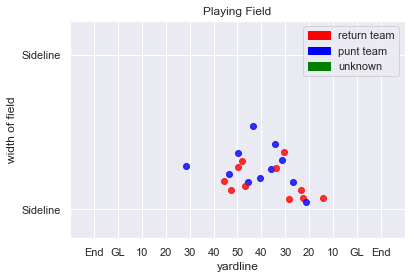

1
Play Description: (2:54) (Punt formation) S.Koch punts 45 yards to CAR 21, Center-M.Cox. D.Byrd to CAR 20 for -1 yards (T.Young). PENALTY on CAR-Z.Sanchez, Illegal Block Above the Waist, 10 yards, enforced at CAR 20.


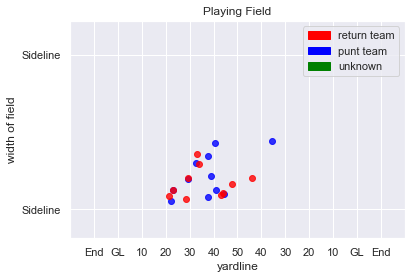

2
Play Description: (1:53) A.Lee punts 40 yards to GB 27, Center-C.Hughlett. J.Abbrederis to GB 28 for 1 yard (B.Mingo).


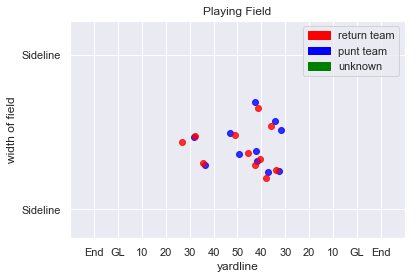

3
Play Description: (2:48) A.Lee punts 66 yards to GB 15, Center-C.Hughlett. J.Abbrederis to GB 20 for 5 yards (R.Mostert; D.Kindred).


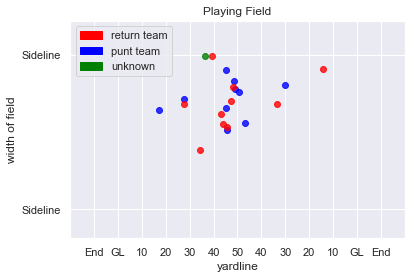

4
Play Description: (3:29) T.Masthay punts 43 yards to GB 44, Center-R.Lovato. R.Mostert pushed ob at GB 20 for 24 yards (D.Goodson). PENALTY on GB-D.Goodson, Unnecessary Roughness, 10 yards, enforced at GB 20.


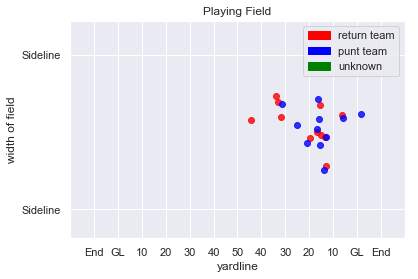

5
Play Description: (8:38) P.Mortell punts 62 yards to CLV 14, Center-R.Lovato. R.Mostert to CLV 18 for 4 yards (K.Brice).


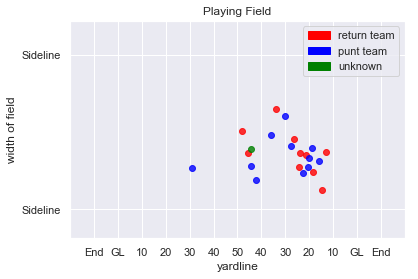

6
Play Description: (3:23) (Punt formation) P.O'Donnell punts 46 yards to DEN 20, Center-A.Brewer. K.Raymond to DEN 28 for 8 yards (C.Jones; D.Bush).


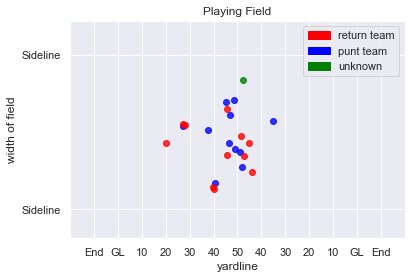

7
Play Description: (1:51) (Punt formation) B.Colquitt punts 51 yards to CHI 18, Center-C.Kreiter. M.Mariani to CHI 30 for 12 yards (A.Janovich). PENALTY on CHI-J.Rodgers, Offensive Holding, 9 yards, enforced at CHI 18.


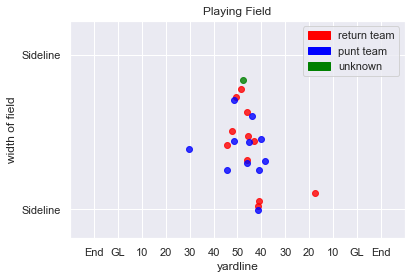

8
Play Description: (:06) (Punt formation) P.O'Donnell punts 54 yards to DEN 34, Center-A.Brewer. K.Raymond to 50 for 16 yards (L.Barrow).


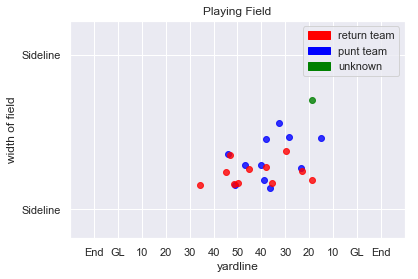

9
Play Description: (11:40) (Punt formation) P.O'Donnell punts 52 yards to DEN 28, Center-A.Brewer. K.Raymond to DEN 36 for 8 yards (S.McManis; J.Rodgers).


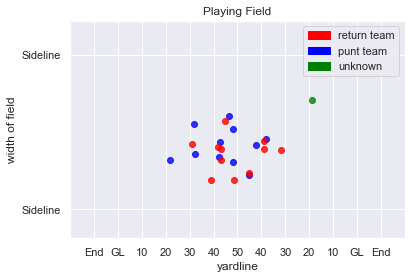

10
Play Description: (13:24) (Punt formation) P.O'Donnell punts 42 yards to DEN 30, Center-P.Scales. B.Addison to DEN 43 for 13 yards (S.Perry).


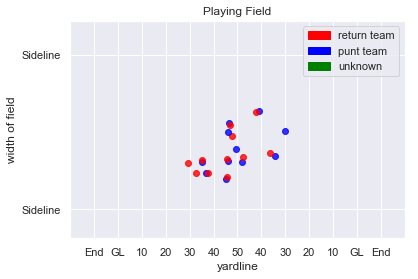

11
Play Description: (11:14) (Punt formation) B.Colquitt punts 45 yards to CHI 10, Center-C.Kreiter. D.Braverman to CHI 10 for no gain (S.Sulleyman).


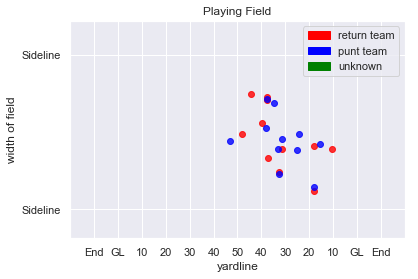

12
Play Description: (3:44) (Punt formation) P.O'Donnell punts 58 yards to DEN 11, Center-P.Scales. B.Addison to DEN 25 for 14 yards (K.Carey). PENALTY on DEN-S.Sulleyman, Illegal Block Above the Waist, 10 yards, enforced at DEN 25.


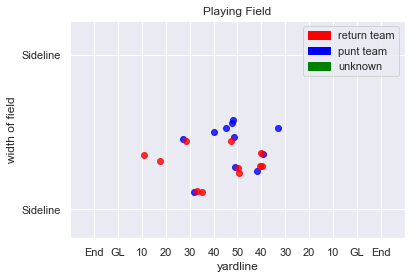

13
Play Description: (:16) (Punt formation) R.Dixon punts 41 yards to CHI 15, Center-C.Kreiter. D.Braverman to CHI 15 for no gain (H.Krieger Coble).


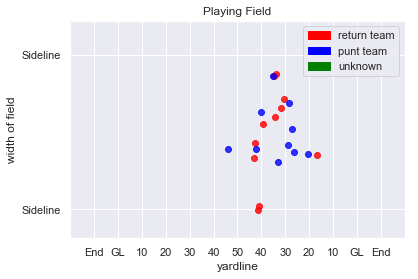

14
Play Description: (13:00) (Punt formation) J.Berry punts 61 yards to DET 20, Center-G.Warren. A.Roberts to DET 39 for 19 yards (A.Chickillo). PENALTY on DET-J.Bynes, Illegal Use of Hands, 10 yards, enforced at DET 20.


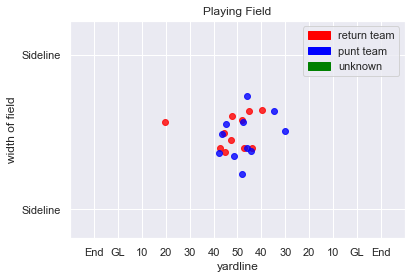

15
Play Description: (5:07) (Punt formation) J.Berry punts 61 yards to DET 13, Center-G.Warren. J.Kerley to DET 23 for 10 yards (M.Tucker). PENALTY on DET-K.Greene, Illegal Block Above the Waist, 10 yards, enforced at DET 23.


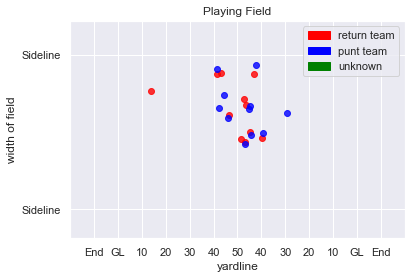

16
Play Description: (15:00) (Punt formation) J.Berry punts 57 yards to DET 28, Center-G.Warren. A.Roberts ran ob at DET 28 for no gain.


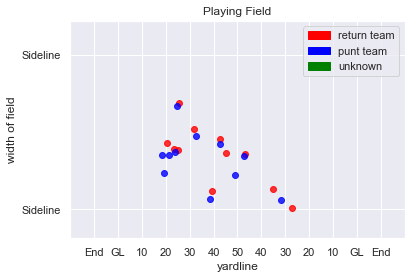

17
Play Description: (9:04) (Punt formation) W.Monday punts 36 yards to PIT 46, Center-M.Dooley. J.Billingsley to PIT 33 for 13 yards (X.Grimble).


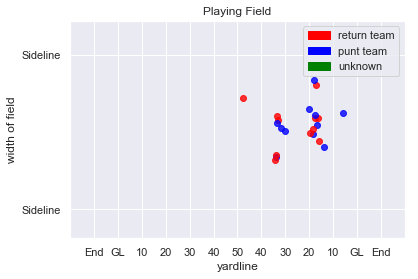

18
Play Description: (12:04) (Punt formation) W.Monday punts 48 yards to DET 21, Center-M.Dooley. J.Billingsley to DET 26 for 5 yards (L.Fort).


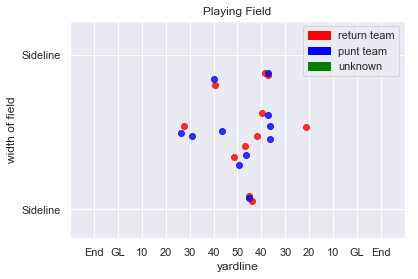

19
Play Description: (3:57) (Punt formation) W.Monday punts 48 yards to DET 25, Center-M.Dooley. J.Billingsley to DET 48 for 23 yards (F.Toussaint; X.Grimble).


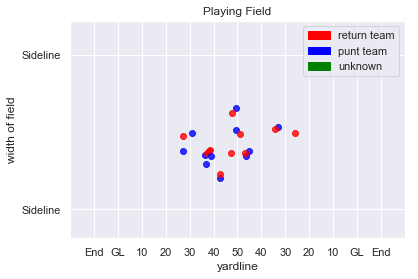

20
Play Description: (2:12) (Punt formation) D.Bell punts 44 yards to PIT 25, Center-J.Landes. D.Ayers to PIT 27 for 2 yards (K.Greene). PENALTY on PIT-A.Shabazz, Illegal Block Above the Waist, 10 yards, enforced at PIT 23.


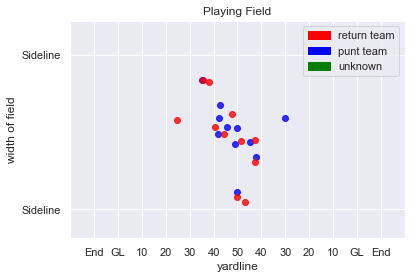

21
Play Description: (1:09) B.Pinion punts 50 yards to HST 14, Center-K.Nelson. W.Fuller to HST 14 for no gain (D.Johnson).


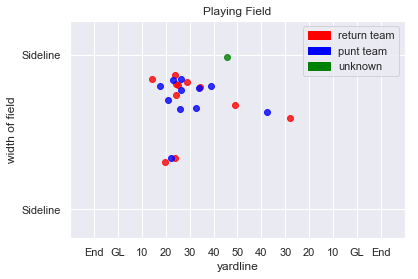

22
Play Description: (13:38) S.Lechler punts 48 yards to SF 24, Center-J.Weeks. B.Treggs pushed ob at SF 24 for no gain (J.Grimes).


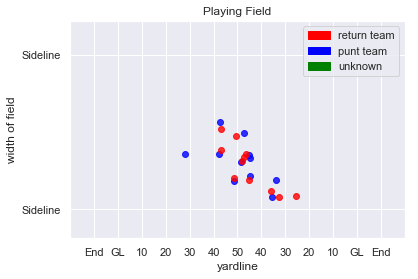

23
Play Description: (:18) S.Lechler punts 47 yards to SF 24, Center-J.Weeks. B.Treggs to SF 24 for no gain (R.Nelson).


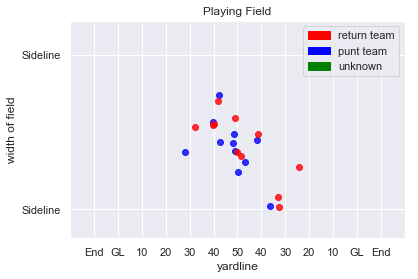

24
Play Description: (3:51) S.Lechler punts 54 yards to SF 9, Center-J.Weeks. D.White to SF 17 for 8 yards (S.Rashad).


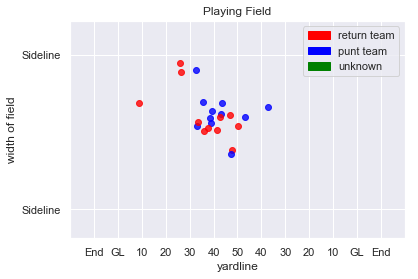

25
Play Description: (3:24) B.Pinion punts 40 yards to HST 41, Center-K.Nelson. W.Williams to SF 49 for 10 yards (W.McManis).


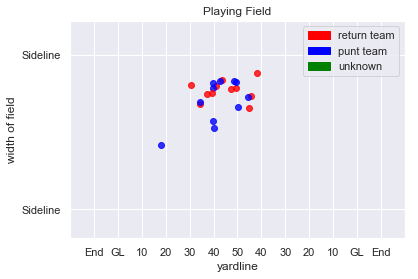

26
Play Description: (12:08) P.McAfee punts 47 yards to BUF 19, Center-M.Overton. R.Bush ran ob at BUF 22 for 3 yards.


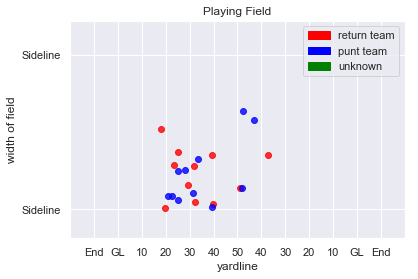

27
Play Description: (:35) C.Schmidt punts 61 yards to IND 24, Center-R.Ferguson. Q.Bray to IND 23 for -1 yards (L.Alexander). PENALTY on IND-J.McNary, Illegal Block Above the Waist, 10 yards, enforced at IND 23.


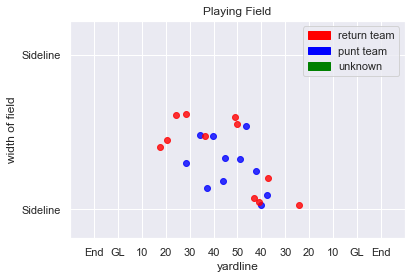

28
Play Description: (14:13) P.McAfee punts 67 yards to BUF 13, Center-M.Overton. W.Powell to BUF 29 for 16 yards (A.Morrison). PENALTY on BUF-N.Robey-Coleman, Offensive Holding, 10 yards, enforced at BUF 29.


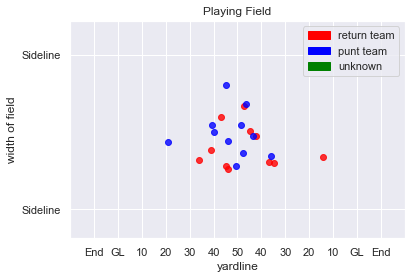

29
Play Description: (12:05) C.Schmidt punts 54 yards to IND 18, Center-G.Sanborn. Q.Bray pushed ob at IND 32 for 14 yards (L.Alexander).


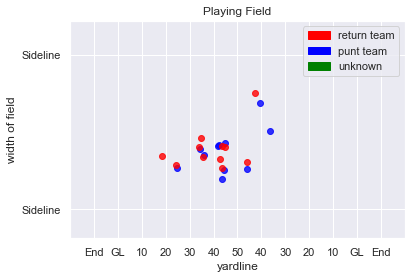

30
Play Description: (11:04) P.McAfee punts 51 yards to BUF 15, Center-M.Overton. W.Powell to BUF 16 for 1 yard (E.Jackson).


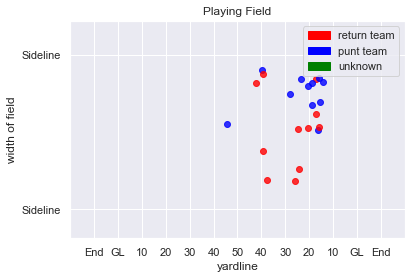

31
Play Description: (4:10) C.Schmidt punts 59 yards to IND 17, Center-G.Sanborn. Q.Bray to IND 27 for 10 yards (J.Dowling).


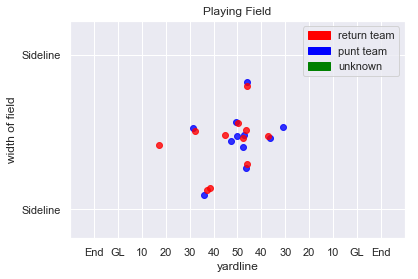

32
Play Description: (1:01) C.Schmidt punts 46 yards to IND 38, Center-R.Ferguson. Q.Bray to IND 39 for 1 yard (L.Alexander).


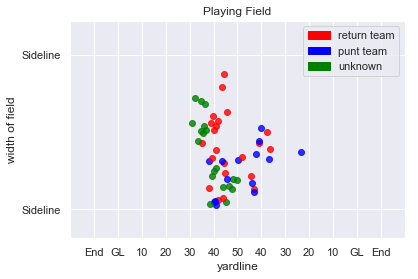

33
Play Description: (9:20) M.Palardy punts 50 yards to BUF 20, Center-M.Overton. W.Powell pushed ob at BUF 28 for 8 yards (S.McClure).


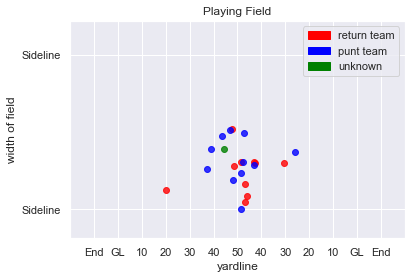

34
Play Description: (8:11) C.Schmidt punts 38 yards to IND 26, Center-R.Ferguson. A.Debose to IND 32 for 6 yards (G.Gronkowski). PENALTY on BUF-G.Little, Player Out of Bounds on Punt, 5 yards, enforced at IND 32.


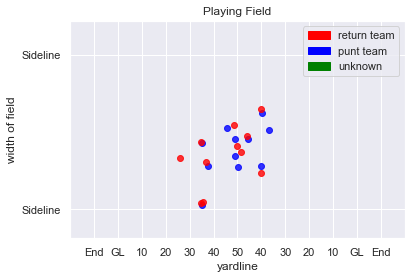

35
Play Description: (8:24) L.Edwards punts 48 yards to JAX 33, Center-T.Purdum. R.Greene to JAX 32 for -1 yards (M.Williams).


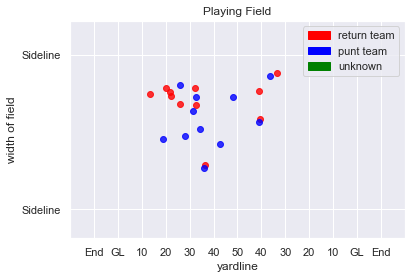

36
Play Description: (6:59) R.Quigley punts 51 yards to NYJ 16, Center-C.Tinker. J.Marshall to NYJ 16 for no gain (T.Armbrister).


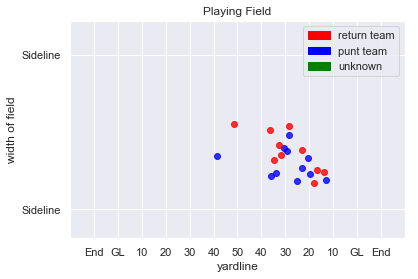

37
Play Description: (8:25) R.Quigley punts 40 yards to NYJ 27, Center-C.Tinker. R.Morris to NYJ 31 for 4 yards (T.Holmes).


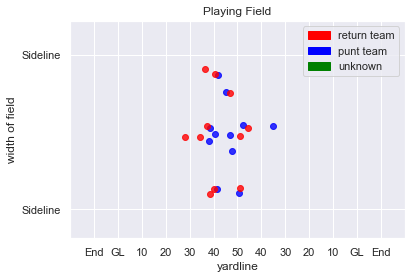

38
Play Description: (2:24) R.Quigley punts 45 yards to NYJ 27, Center-C.Tinker. C.Worthy to NYJ 27 for no gain (T.Holmes).


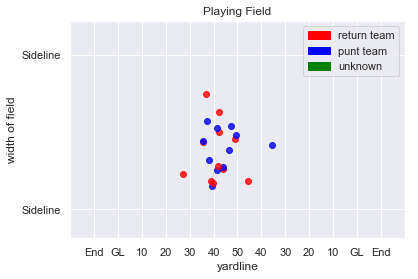

39
Play Description: (1:48) L.Edwards punts 50 yards to JAX 17, Center-T.Purdum. N.Marshall to JAX 22 for 5 yards (J.Martin).


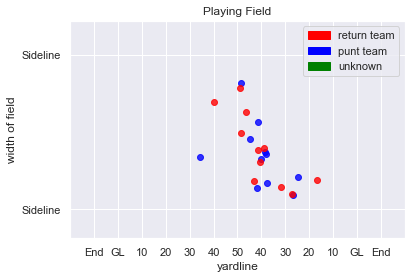

40
Play Description: (2:57) B.Wing punts 46 yards to MIA 8, Center-Z.DeOssie. J.Grant pushed ob at MIA 16 for 8 yards (O.Darkwa).


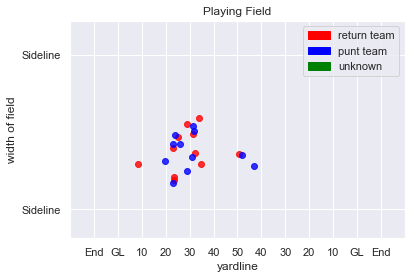

41
Play Description: (14:04) M.Darr punts 50 yards to NYG 32, Center-J.Denney. B.Rainey to NYG 33 for 1 yard (M.Hull, J.Lucas). PENALTY on NYG-L.McFadden, Offensive Holding, 10 yards, enforced at NYG 33.


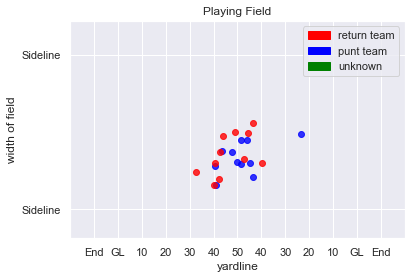

42
Play Description: (12:02) B.Wing punts 39 yards to MIA 24, Center-T.Ott. J.Grant to MIA 36 for 12 yards (B.Jackson, B.Wing).


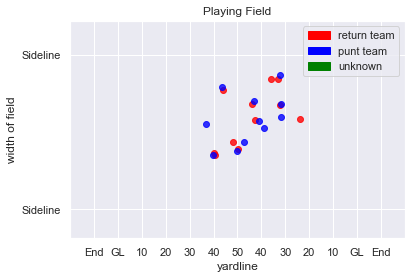

43
Play Description: (10:38) M.Darr punts 49 yards to NYG 10, Center-J.Denney. B.Rainey to NYG 18 for 8 yards (M.Hull, D.Jones).


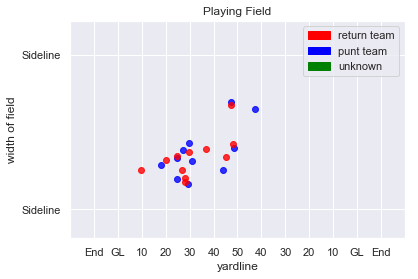

44
Play Description: (8:40) B.Wing punts 65 yards to MIA 15, Center-Z.DeOssie. J.Grant to MIA 27 for 12 yards (M.LaCosse, Z.DeOssie).


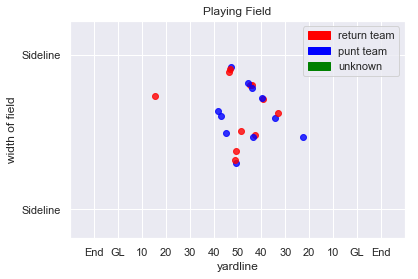

45
Play Description: (:38) B.Wing punts 48 yards to MIA 25, Center-Z.DeOssie. J.Grant to NYG 47 for 28 yards (I.Williams, C.Taylor).


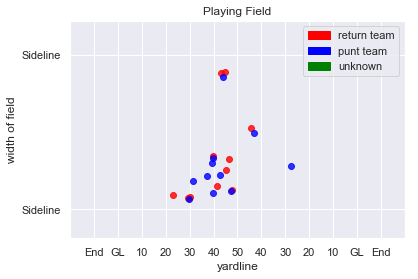

46
Play Description: (5:08) M.Darr punts 46 yards to NYG 16, Center-R.DiSalvo. K.Maye pushed ob at NYG 31 for 15 yards (R.DiSalvo). PENALTY on NYG-C.Taylor, Unnecessary Roughness, 15 yards, enforced at NYG 31.


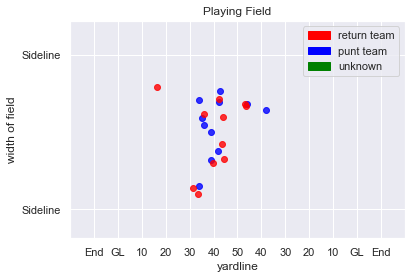

47
Play Description: (3:35) B.Wing punts 53 yards to MIA 24, Center-T.Ott. A.Cruz to MIA 34 for 10 yards (N.Whitlock).


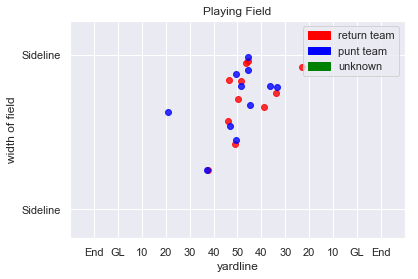

48
Play Description: (9:59) J.Locke punts 53 yards to CIN 8, Center-K.McDermott. T.Boyd to CIN 22 for 14 yards (T.Roberson). PENALTY on CIN-C.Core, Offensive Holding, 7 yards, enforced at CIN 14. {Boyd credited with 6 yard return due to the penalty}


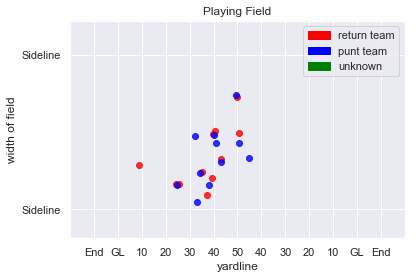

49
Play Description: (4:34) K.Huber punts 50 yards to MIN 17, Center-C.Harris. T.Stoudermire to MIN 27 for 10 yards (C.Peerman; D.Smith).


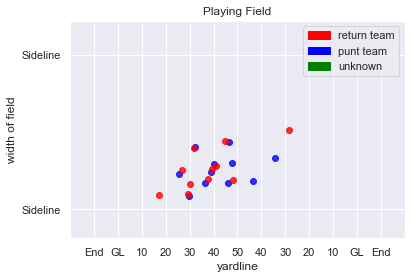

50
Play Description: (2:27) J.Locke punts 47 yards to CIN 22, Center-K.McDermott. M.Alford to CIN 31 for 9 yards (M.Pruitt). PENALTY on MIN-M.Pruitt, Horse Collar Tackle, 15 yards, enforced at CIN 31.


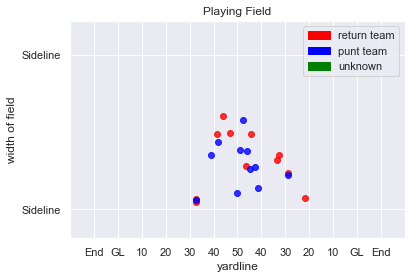

51
Play Description: (7:42) K.Huber punts 40 yards to MIN 24, Center-C.Harris. T.Stoudermire to MIN 26 for 2 yards (P.Dawson).


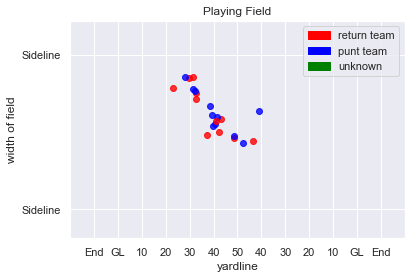

52
Play Description: (12:19) R.Allen punts 40 yards to NO 32, Center-J.Cardona. M.Murphy to NO 37 for 5 yards (J.Richards; K.Grugier-Hill).


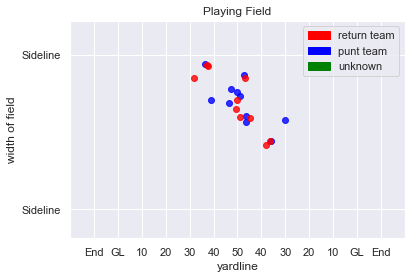

53
Play Description: (3:05) R.Allen punts 40 yards to NO 12, Center-J.Cardona. M.Murphy pushed ob at NO 20 for 8 yards (T.Flowers).


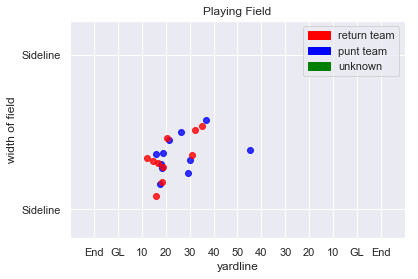

54
Play Description: (11:42) T.Morstead punts 51 yards to NE 32, Center-C.Highland. C.Jones to NE 34 for 2 yards (N.Stupar). NO-B.Dixon was injured during the play. 


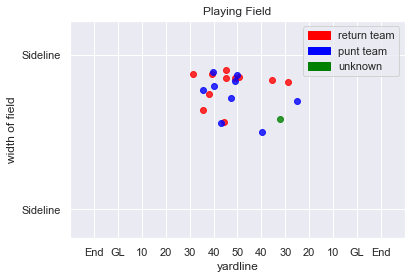

55
Play Description: (13:08) R.Allen punts 45 yards to NO 10, Center-J.Cardona. T.Cadet to NO 29 for 19 yards (E.Roberts). PENALTY on NO-D.Lee, Illegal Block Above the Waist, 10 yards, enforced at NO 27.


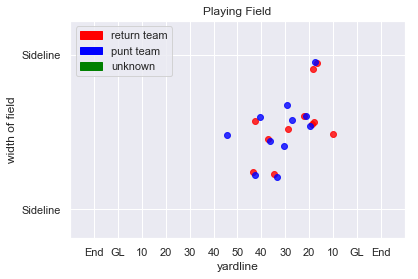

56
Play Description: (4:19) R.Allen punts 45 yards to NO 11, Center-J.Cardona. T.Cadet to NO 17 for 6 yards (A.Derby; K.Grugier-Hill).


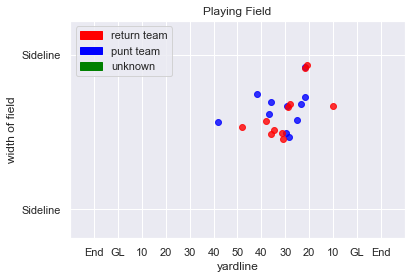

57
Play Description: (12:35) R.Allen punts 50 yards to NO 26, Center-J.Cardona. T.Cadet to NO 36 for 10 yards (C.Thompson). PENALTY on NO-J.Pruitt, Illegal Block Above the Waist, 10 yards, enforced at NO 32.


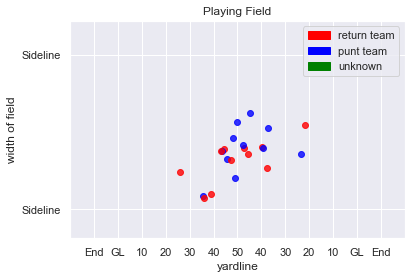

58
Play Description: (:40) R.Allen punts 47 yards to NO 23, Center-J.Cardona. T.Lewis pushed ob at NO 42 for 19 yards (S.Scheu).


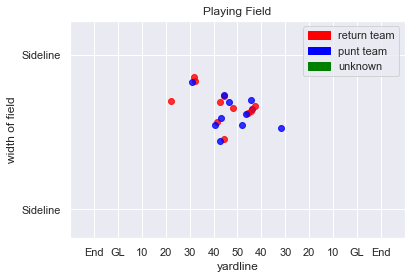

59
Play Description: (9:46) D.Butler punts 46 yards to OAK 30, Center-K.Canaday. J.Mickens pushed ob at ARZ 48 for 22 yards (K.Williams). PENALTY on OAK-De.McDonald, Offensive Holding, 10 yards, enforced at OAK 45.


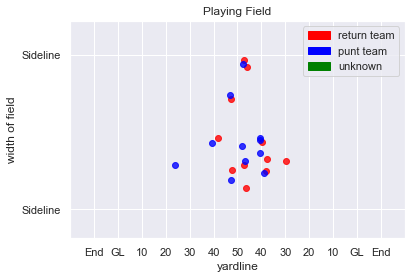

60
Play Description: (2:02) M.King punts 57 yards to ARZ 15, Center-J.Condo. J.Nelson ran ob at ARZ 25 for 10 yards (N.Allen).


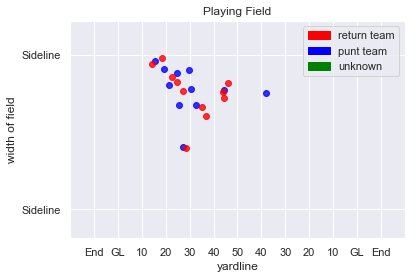

61
Play Description: (8:21) G.Swanson punts 51 yards to OAK 28, Center-D.Dillon. M.Hall to OAK 34 for 6 yards (M.Farley). PENALTY on ARZ-I.Momah, Ineligible Downfield Kick, 5 yards, enforced at OAK 34.


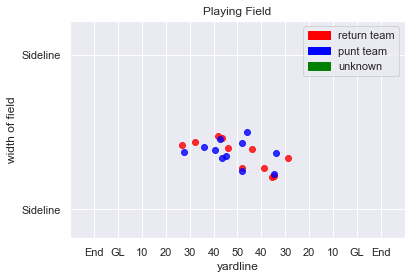

62
Play Description: (6:51) M.King punts 59 yards to ARZ 8, Center-A.East. C.Hubert to ARZ 19 for 11 yards (De.McDonald).


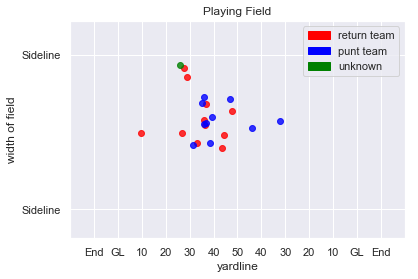

63
Play Description: (13:28) (Punt formation) D.Kaser punts 49 yards to TEN 21, Center-M.Windt. T.McBride pushed ob at TEN 37 for 16 yards (D.Watt).


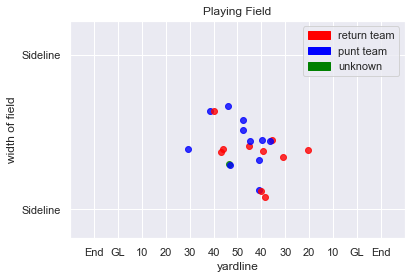

64
Play Description: (:50) (Punt formation) D.Kaser punts 48 yards to TEN 43, Center-M.Windt. T.McBride to TEN 40 for -3 yards (D.McCoil).


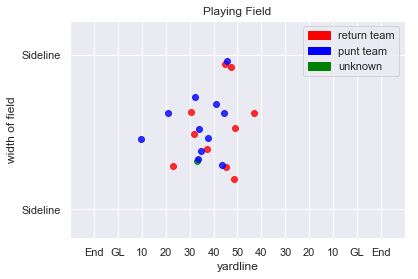

65
Play Description: (7:44) (Punt formation) B.Kern punts 45 yards to SD 25, Center-B.Brinkley. I.Burse to SD 22 for -3 yards (J.Staples). PENALTY on SD-D.McCoil, Illegal Block Above the Waist, 10 yards, enforced at SD 22.


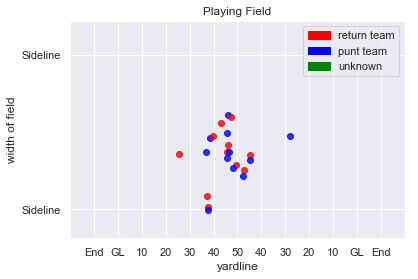

66
Play Description: (3:53) (Punt formation) D.Kaser punts 54 yards to TEN 18, Center-M.Windt. T.McBride to TEN 22 for 4 yards (R.Crawford; A.McDonald).


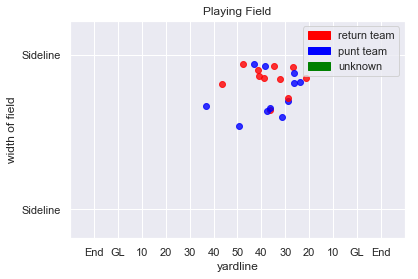

67
Play Description: (4:45) D.Colquitt punts 52 yards to SEA 30, Center-J.Winchester. T.Lockett pushed ob at SEA 47 for 17 yards (J.Winchester).


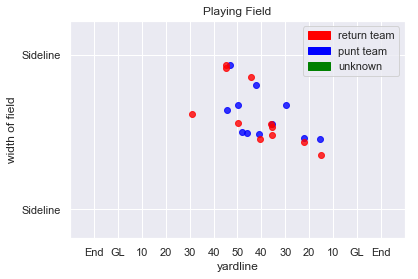

68
Play Description: (8:22) J.Ryan punts 60 yards to KC 26, Center-N.Frese. F.Hammond to KC 44 for 18 yards (C.Marsh; N.Frese).


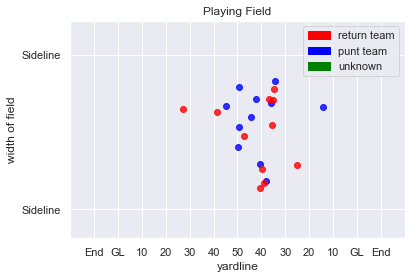

69
Play Description: (4:51) J.Ryan punts 61 yards to KC 13, Center-N.Frese. T.Hill to KC 17 for 4 yards (C.Marsh).


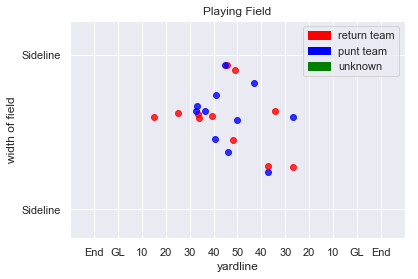

70
Play Description: (12:56) J.Ryan punts 45 yards to KC 13, Center-N.Frese. D.Thomas to KC 16 for 3 yards (R.Robinson; K.Coleman).


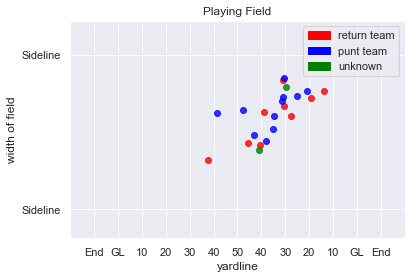

71
Play Description: (7:55) J.Ryan punts 45 yards to KC 6, Center-N.Frese. D.Robinson to KC 10 for 4 yards (N.Frese).


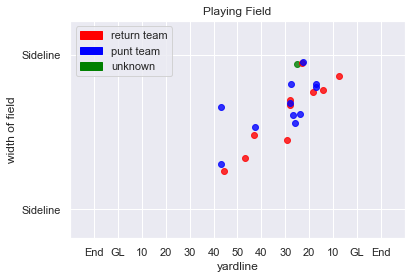

72
Play Description: (5:49) D.Colquitt punts 48 yards to SEA 13, Center-J.Winchester. T.Reed to SEA 29 for 16 yards (A.Mulumba).


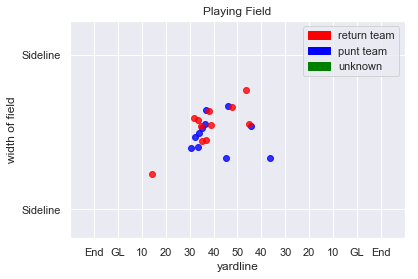

73
Play Description: (14:56) D.Jones punts 62 yards to TB 32, Center-J.DePalma. A.Humphries to TB 42 for 10 yards (C.Maragos). PENALTY on PHI-E.Rowe, Player Out of Bounds on Punt, 5 yards, enforced at TB 42.


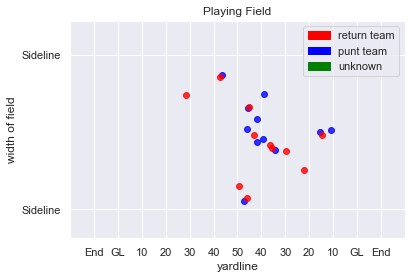

74
Play Description: (14:05) J.Schum punts 44 yards to PHI 12, Center-A.DePaola. K.Barner to PHI 15 for 3 yards (A.Glanton).


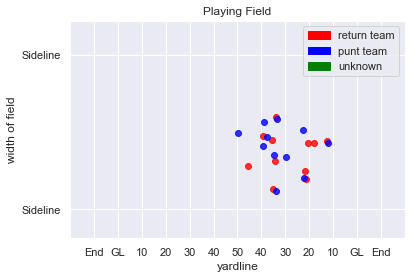

75
Play Description: (9:44) B.Anger punts 48 yards to PHI 19, Center-A.DePaola. K.Barner ran ob at PHI 22 for 3 yards (K.Tandy).


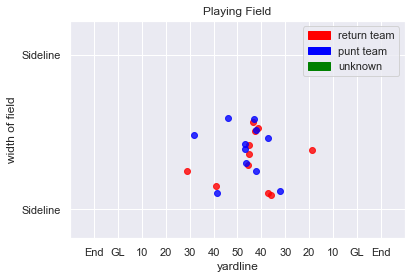

76
Play Description: (7:24) D.Jones punts 54 yards to TB 23, Center-J.DePalma. A.Humphries ran ob at TB 28 for 5 yards (T.Graham).


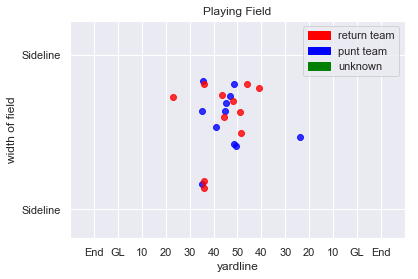

77
Play Description: (3:25) D.Jones punts 59 yards to TB 17, Center-J.DePalma. A.Humphries to TB 27 for 10 yards (T.Graham).


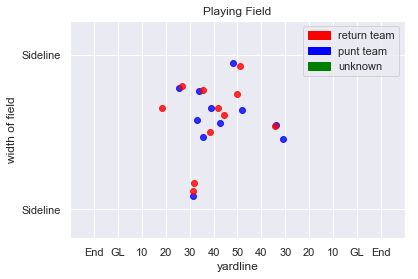

78
Play Description: (2:41) B.Anger punts 51 yards to PHI 20, Center-A.DePaola. K.Barner to PHI 33 for 13 yards (J.Keyes).


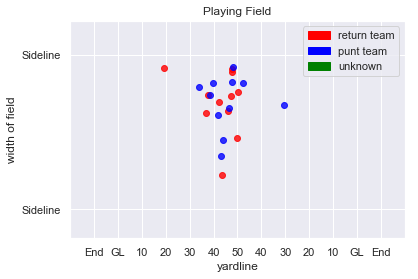

79
Play Description: (3:05) D.Jones punts 58 yards to TB 13, Center-J.DePalma. J.Krause ran ob at TB 36 for 23 yards (D.Skinner). PENALTY on TB-R.Smith, Offensive Holding, 10 yards, enforced at TB 34.


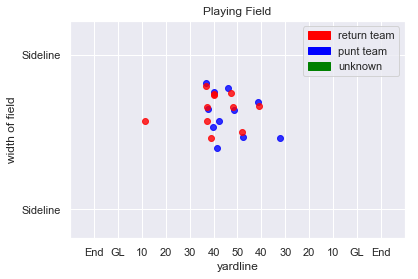

80
Play Description: (9:00) M.Bosher punts 53 yards to WAS 43, Center-J.Harris. W.Blackmon to WAS 44 for 1 yard (B.Poole). PENALTY on ATL-L.Reynolds, Face Mask (15 Yards), 15 yards, enforced at WAS 44.


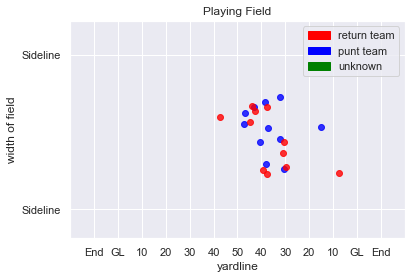

81
Play Description: (5:30) M.Bosher punts 56 yards to WAS 20, Center-J.Harris. R.Ross to WAS 28 for 8 yards (D.Campbell; P.DiMarco).


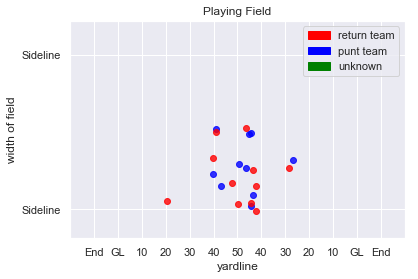

82
Play Description: (3:08) T.Way punts 54 yards to ATL 9, Center-N.Sundberg. J.Hardy to ATL 18 for 9 yards (S.Cravens).


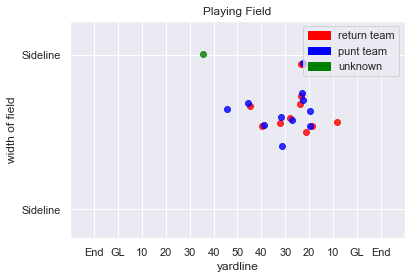

83
Play Description: (9:15) T.Way punts 44 yards to ATL 19, Center-N.Sundberg. D.Fuller to ATL 23 for 4 yards (C.Fields). PENALTY on WAS, Illegal Formation, 5 yards, enforced at ATL 23.


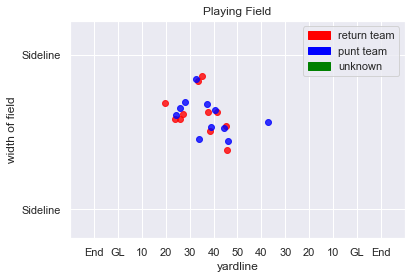

84
Play Description: (5:45) T.Way punts 51 yards to ATL 13, Center-N.Sundberg. D.Fuller to ATL 17 for 4 yards (C.Fields).


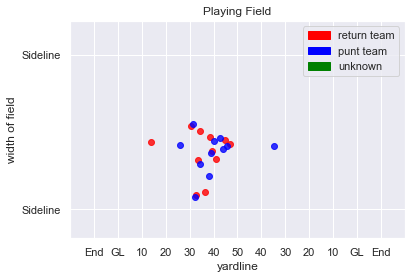

85
Play Description: (11:36) T.Way punts 68 yards to ATL 8, Center-N.Sundberg. D.Fuller to ATL 15 for 7 yards (M.Spaight; K.Fuller).


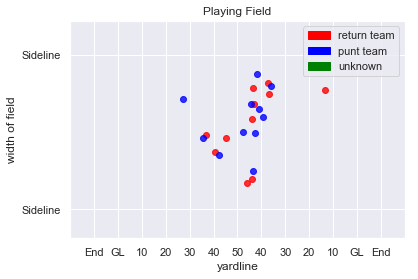

86
Play Description: (7:24) M.Bosher punts 53 yards to WAS 10, Center-J.Harris. T.Thorpe to WAS 15 for 5 yards (C.Goodwin; J.Perkins). PENALTY on WAS-D.Stewart, Illegal Block Above the Waist, 7 yards, enforced at WAS 14.


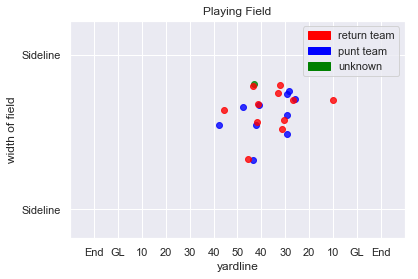

87
Play Description: (4:58) T.Way punts 64 yards to ATL 27, Center-N.Sundberg. J.McKissic to ATL 41 for 14 yards (J.Harris).


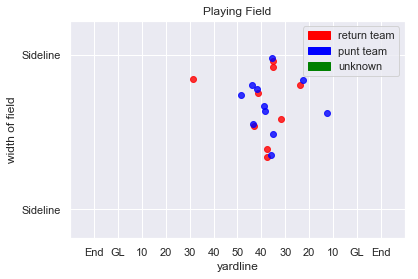

88
Play Description: (14:09) D.Butler punts 42 yards to SD 35, Center-D.Dillon. T.Benjamin to SD 35 for no gain (C.Brooks).


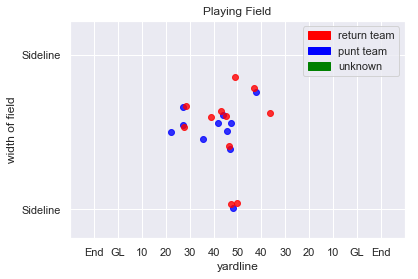

89
Play Description: (7:40) D.Butler punts 56 yards to SD 10, Center-D.Dillon. T.Benjamin ran ob at SD 17 for 7 yards (T.Jefferson).


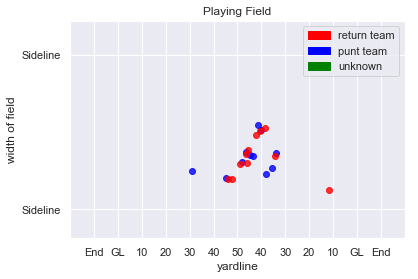

90
Play Description: (4:52) D.Kaser punts 52 yards to ARZ 17, Center-M.Windt. A.Ellington to ARZ 25 for 8 yards (T.Williams, D.Stuckey).


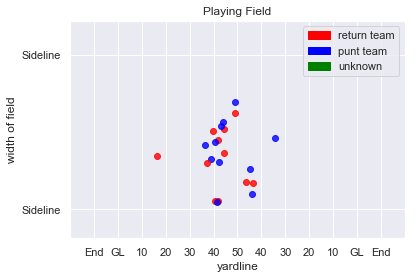

91
Play Description: (14:15) D.Butler punts 47 yards to SD 22, Center-D.Dillon. I.Burse to SD 22 for no gain (C.Brooks).


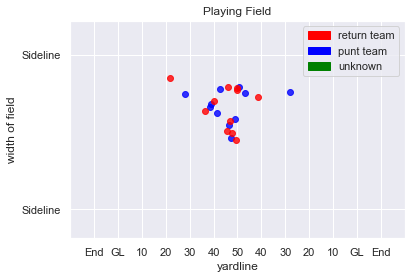

92
Play Description: (1:38) D.Kaser punts 55 yards to ARZ 3, Center-M.Windt. C.Hubert to ARZ 10 for 7 yards (J.Perry).


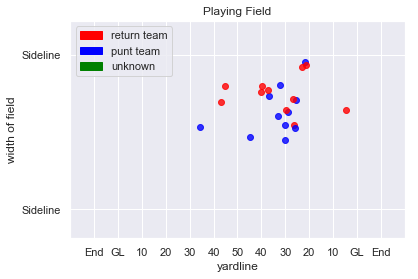

93
Play Description: (14:29) G.Swanson punts 52 yards to SD 22, Center-K.Canaday. I.Burse to SD 22 for no gain (S.Taylor). PENALTY on SD-Tr.Williams, Offensive Holding, 10 yards, enforced at SD 22.


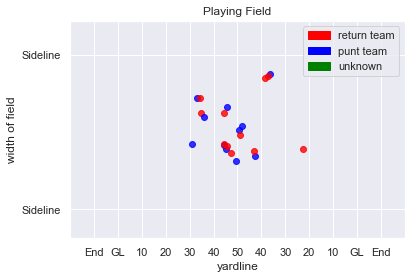

94
Play Description: (14:09) A.Lee punts 61 yards to ATL 29, Center-C.Hughlett. J.Hardy to ATL 39 for 10 yards (C.Kirksey). PENALTY on ATL-N.Williams, Offensive Holding, 10 yards, enforced at ATL 39.


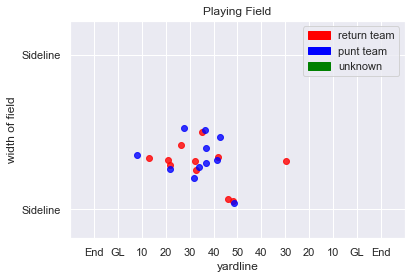

95
Play Description: (5:44) M.Bosher punts 58 yards to CLV 3, Center-J.Harris. T.Gabriel to CLV 18 for 15 yards (P.Worrilow). ATL-M.Bosher was injured during the play. His return is Probable. CLV-T.Gabriel was injured during the play. His return is Probable. 


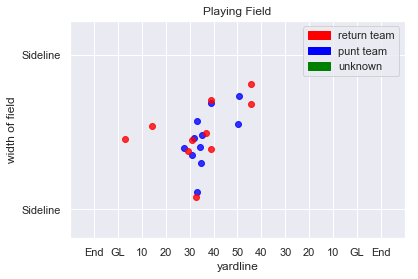

96
Play Description: (7:13) (Punt formation) A.Lee punts 53 yards to ATL 10, Center-C.Hughlett. D.Fuller to ATL 13 for 3 yards (T.Carder).


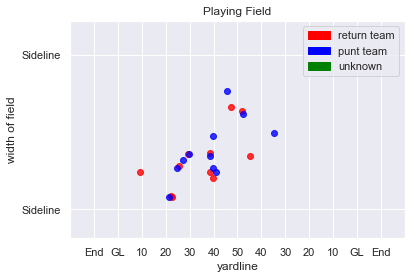

97
Play Description: (8:21) (Punt formation) A.Lee punts 56 yards to ATL 12, Center-C.Hughlett. D.Fuller to ATL 22 for 10 yards (S.Baker). PENALTY on ATL-D.Parms, Illegal Block Above the Waist, 10 yards, enforced at ATL 22.


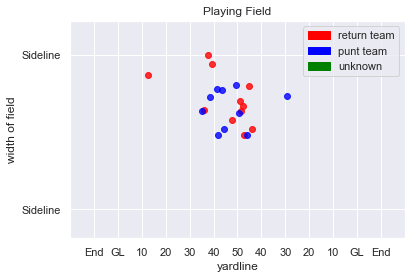

98
Play Description: (4:18) (Punt formation) A.Lee punts 50 yards to ATL 11, Center-C.Hughlett. D.Fuller to ATL 20 for 9 yards (C.Hughlett).


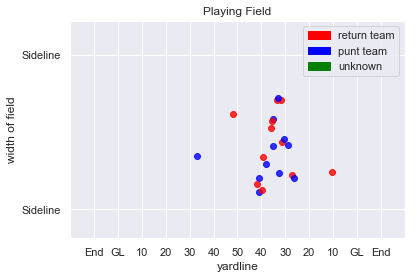

99
Play Description: (4:45) S.Koch punts 57 yards to IND 23, Center-M.Cox. C.Rogers to BLT 34 for 43 yards. PENALTY on IND-N.Irving, Offensive Holding, 10 yards, enforced at IND 49.


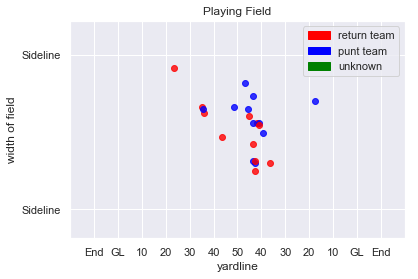

100
Play Description: (4:35) S.Koch punts 54 yards to IND 14, Center-M.Cox. C.Rogers to IND 21 for 7 yards (K.Reynolds).


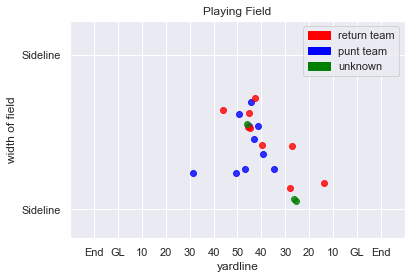

101
Play Description: (2:24) P.McAfee punts 59 yards to BLT 28, Center-M.Overton. M.Campanaro to BLT 49 for 21 yards (C.Coffman; A.Morrison).


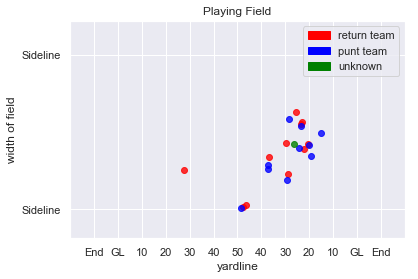

102
Play Description: (8:33) S.Koch punts 45 yards to IND 26, Center-M.Cox. J.Stangby to IND 36 for 10 yards (K.Conner; K.Reynolds).


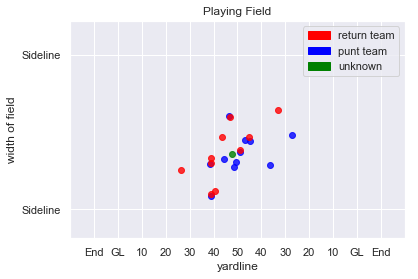

103
Play Description: (1:11) S.Koch punts 54 yards to IND 12, Center-M.Cox. J.Stangby to IND 12 for no gain (C.Jacobs).


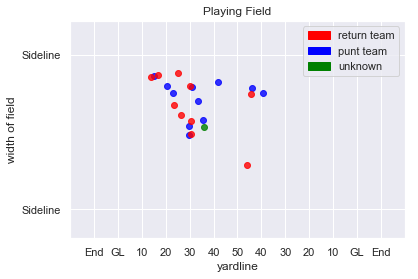

104
Play Description: (5:40) (Punt formation) K.Redfern punts 41 yards to TEN 15, Center-J.Jansen. D.McCluster to TEN 23 for 8 yards (A.Klein).


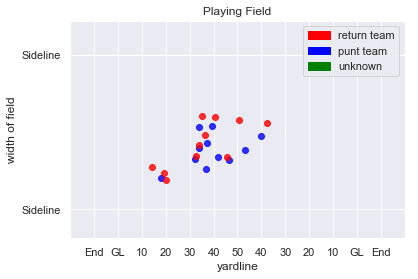

105
Play Description: (3:36) (Punt formation) B.Kern punts 59 yards to CAR 16, Center-B.Brinkley. D.Byrd to CAR 28 for 12 yards (B.Brinkley).


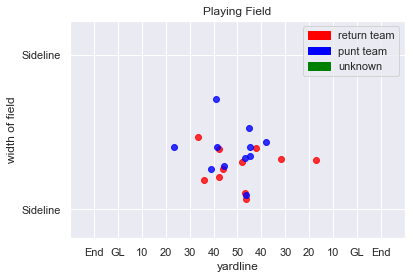

106
Play Description: (6:29) (Punt formation) B.Kern punts 45 yards to CAR 26, Center-B.Brinkley. D.Byrd pushed ob at CAR 30 for 4 yards (B.Brinkley).


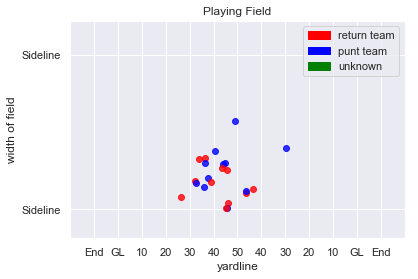

107
Play Description: (15:00) (Punt formation) K.Redfern punts 54 yards to TEN 17, Center-J.Jansen. K.Byard to TEN 26 for 9 yards (L.Young; J.Jansen).


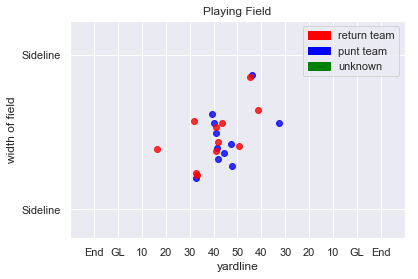

108
Play Description: (7:44) R.Allen punts 53 yards to CHI 24, Center-J.Cardona. M.Mariani to CHI 36 for 12 yards (G.Grissom).


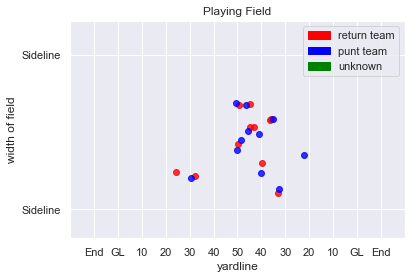

109
Play Description: (9:18) P.O'Donnell punts 52 yards to NE 42, Center-P.Scales. C.Jones to NE 48 for 6 yards (J.Rodgers).


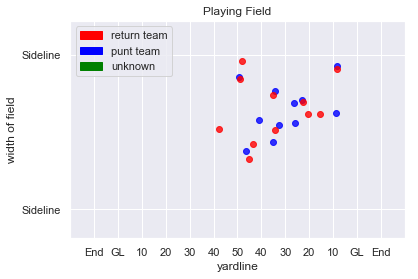

110
Play Description: (1:55) P.O'Donnell punts 48 yards to NE 27, Center-P.Scales. C.Jones to NE 43 for 16 yards (C.Prosinski).


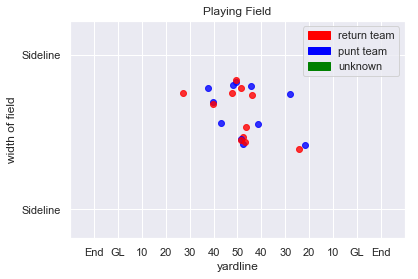

111
Play Description: (2:13) P.O'Donnell punts 55 yards to NE 26, Center-A.Brewer. C.Harper to NE 39 for 13 yards (D.Houston-Carson).


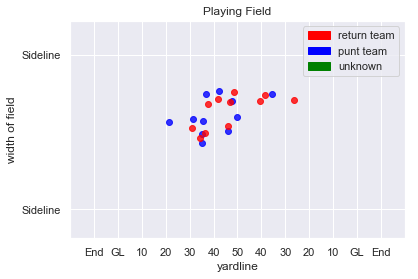

112
Play Description: (:43) R.Allen punts 46 yards to CHI 19, Center-J.Cardona. D.Braverman to CHI 16 for -3 yards (V.Sunseri).


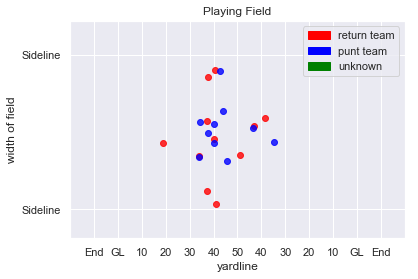

113
Play Description: (9:13) R.Allen punts 42 yards to CHI 49, Center-J.Cardona. K.Duncan to CHI 48 for -1 yards (V.Sunseri; G.Grissom). PENALTY on NE-K.Grugier-Hill, Player Out of Bounds on Punt, 5 yards, enforced at CHI 48.


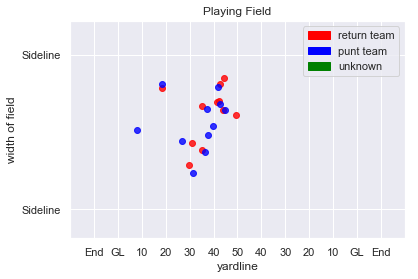

114
Play Description: (2:37) R.Allen punts 37 yards to CHI 6, Center-J.Cardona. K.Duncan pushed ob at CHI 12 for 6 yards (V.Sunseri).


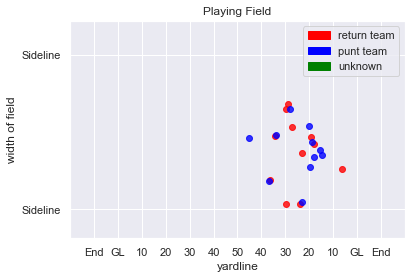

115
Play Description: (3:04) S.Martin punts 57 yards to CIN 5, Center-D.Muhlbach. T.Boyd to CIN 29 for 24 yards (J.Bademosi).


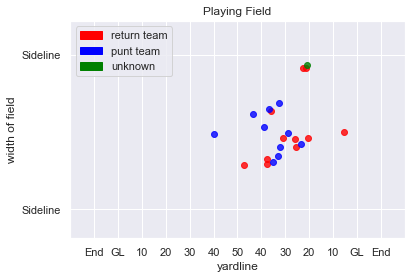

116
Play Description: (1:37) K.Huber punts 47 yards to DET 15, Center-C.Harris. A.Roberts to DET 25 for 10 yards (N.Vigil).


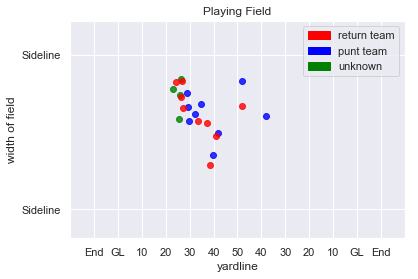

117
Play Description: (12:54) K.Huber punts 46 yards to DET 33, Center-C.Harris. J.Kerley to DET 39 for 6 yards (C.Lewis-Harris).


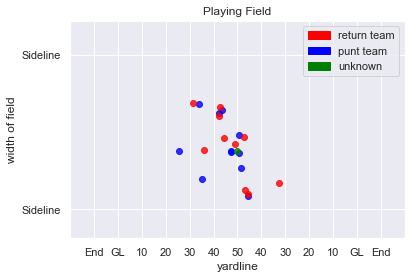

118
Play Description: (15:00) K.Huber punts 49 yards to DET 7, Center-C.Harris. A.Roberts ran ob at DET 12 for 5 yards (F.Raven).


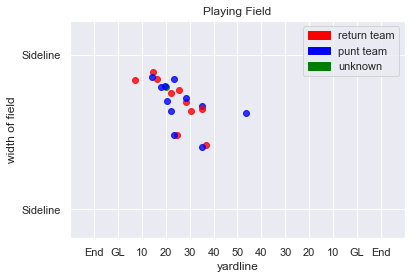

119
Play Description: (9:43) D.Bell punts 45 yards to CIN 39, Center-J.Landes. A.Erickson to DET 31 for 30 yards (I.Johnson; D.Bell).


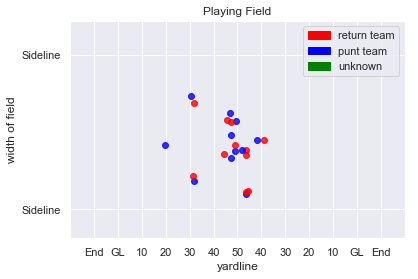

120
Play Description: (3:33) D.Colquitt punts 48 yards to LA 22, Center-J.Winchester. P.Cooper to LA 21 for -1 yards (J.March-Lillard; C.Conley).


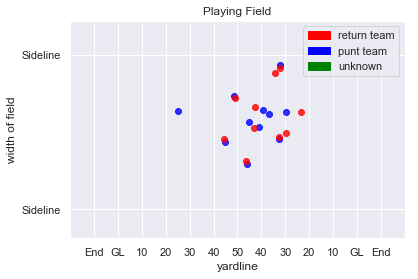

121
Play Description: (13:39) J.Hekker punts 53 yards to KC 22, Center-J.McQuaide. T.Hill to KC 22 for no gain (J.Cunningham; J.Lomax).


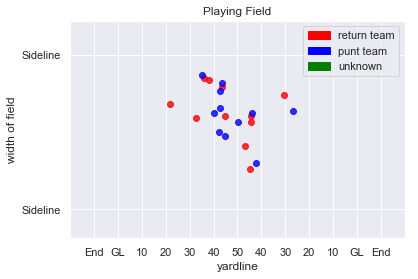

122
Play Description: (6:04) D.Colquitt punts 40 yards to LA 14, Center-J.Winchester. P.McRoberts to LA 14 for no gain (D.Robinson). PENALTY on LA-M.Jordan, Illegal Block Above the Waist, 7 yards, enforced at LA 14.


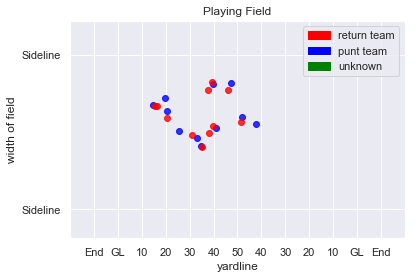

123
Play Description: (3:47) J.Hekker punts 44 yards to KC 35, Center-J.Overbaugh. D.Thomas pushed ob at KC 42 for 7 yards (J.Lomax).


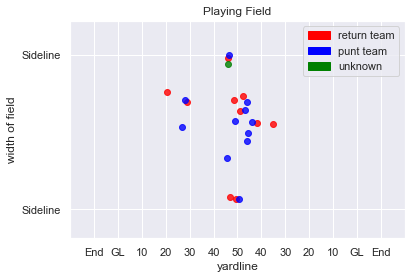

124
Play Description: (1:31) J.Hekker punts 50 yards to KC 20, Center-J.Overbaugh. D.Thomas pushed ob at KC 31 for 11 yards (J.Kovacs).


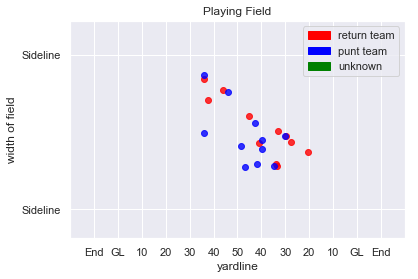

125
Play Description: (12:07) (Punt formation) C.Jones punts 43 yards to MIA 30, Center-L.Ladouceur. J.Grant to MIA 40 for 10 yards (K.Wilber; D.Wilson). PENALTY on MIA-S.Gary, Illegal Block Above the Waist, 10 yards, enforced at MIA 40.


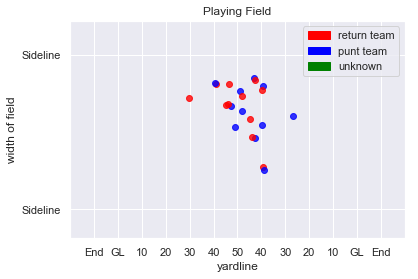

126
Play Description: (9:56) (Punt formation) M.Darr punts 55 yards to DAL 12, Center-R.DiSalvo. L.Whitehead to DAL 28 for 16 yards (M.Hull).


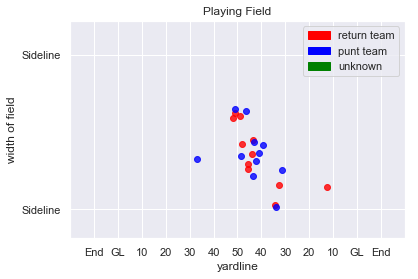

127
Play Description: (12:52) (Punt formation) M.Darr punts 55 yards to DAL 14, Center-R.DiSalvo. D.Swanson to DAL 41 for 27 yards (M.Gray).


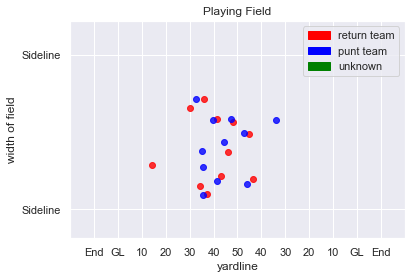

128
Play Description: (9:13) (Punt formation) M.Darr punts 10 yards to MIA 18, Center-R.DiSalvo. A.Traylor to MIA 15 for 3 yards (T.Duarte). Mayle of Dallas got a hand on the punt.


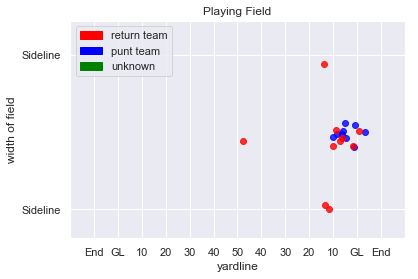

129
Play Description: (3:48) (Punt formation) M.Wile punts 38 yards to MIA 16, Center-Z.Wood. J.Grant to MIA 15 for -1 yards (A.Jones).


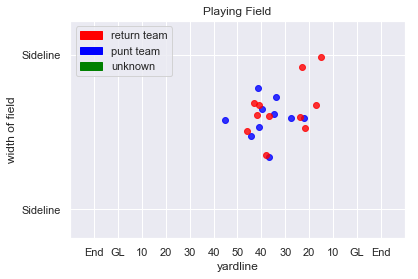

130
Play Description: (6:54) (Punt formation) M.Wile punts 41 yards to MIA 15, Center-Z.Wood. G.Whalen to MIA 24 for 9 yards (A.Traylor).


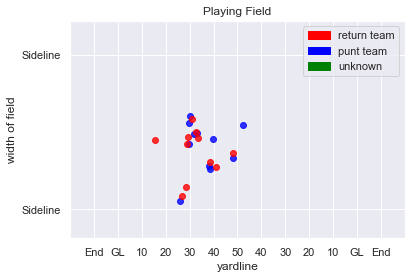

131
Play Description: (3:47) (Punt formation) M.Darr punts 46 yards to DAL 9, Center-R.DiSalvo. R.Mullaney to DAL 15 for 6 yards (R.DiSalvo).


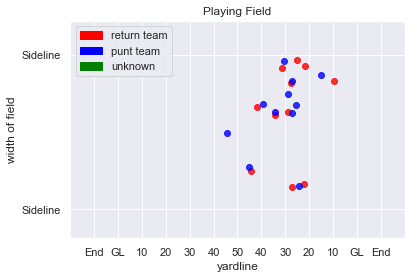

132
Play Description: (2:00) (Punt formation) M.Wile punts 44 yards to MIA 34, Center-Z.Wood. A.Cruz to MIA 40 for 6 yards (J.Morris).


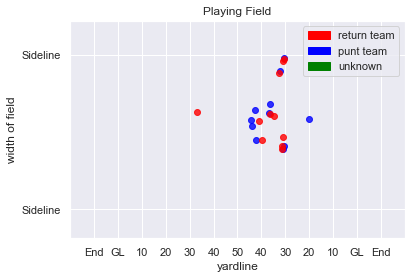

133
Play Description: (:39) J.Ryan punts 66 yards to MIN 11, Center-N.Frese. M.Sherels to MIN 25 for 14 yards (K.Pierre-Louis; C.Marsh).


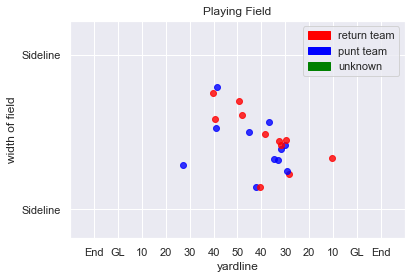

134
Play Description: (8:12) J.Locke punts 36 yards to SEA 16, Center-K.McDermott. T.Lockett ran ob at SEA 43 for 27 yards (K.McDermott). PENALTY on SEA-J.Lane, Offensive Holding, 8 yards, enforced at SEA 16.


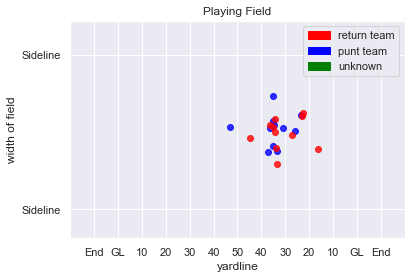

135
Play Description: (6:39) J.Ryan punts 51 yards to MIN 33, Center-N.Frese. T.Stoudermire to SEA 48 for 19 yards (E.Pinkins). PENALTY on MIN-A.Thielen, Illegal Block Above the Waist, 10 yards, enforced at MIN 33. Penalty on MIN-T.Stoudermire, Delay of Game, declined.


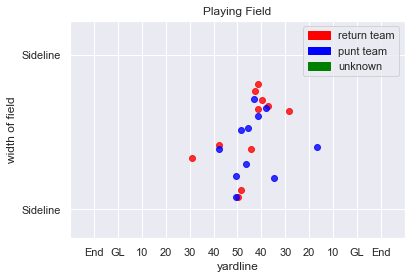

136
Play Description: (1:21) J.Ryan punts 53 yards to MIN 24, Center-N.Frese. T.Stoudermire to MIN 22 for -2 yards (M.Burley).


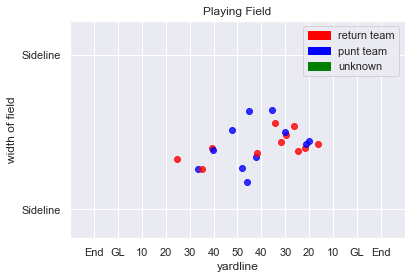

137
Play Description: (9:33) J.Locke punts 39 yards to SEA 9, Center-K.McDermott. M.Hunter to SEA 20 for 11 yards (K.Brothers; M.Michel).


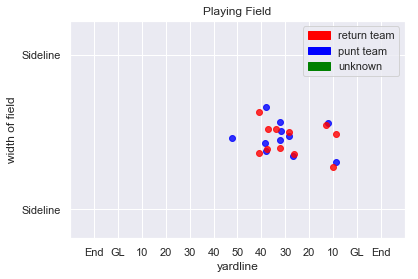

138
Play Description: (4:02) J.Locke punts 45 yards to SEA 33, Center-K.McDermott. M.Hunter to SEA 33 for no gain (K.Brothers). PENALTY on SEA-K.Coleman, Offensive Holding, 10 yards, enforced at SEA 33.


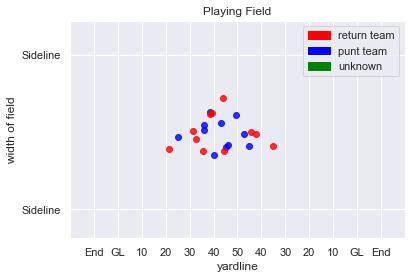

139
Play Description: (2:43) J.Ryan punts 60 yards to MIN 23, Center-N.Frese. T.Stoudermire to MIN 39 for 16 yards (T.Smith). PENALTY on MIN-I.Fruechte, Offensive Holding, 10 yards, enforced at MIN 39.


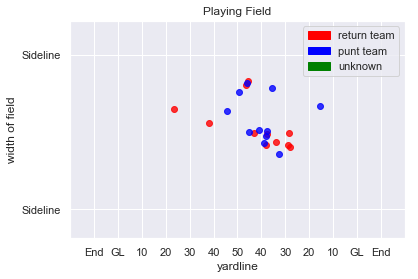

140
Play Description: (12:41) T.Morstead punts 49 yards to HST 45, Center-C.Highland. T.Ervin pushed ob at NO 49 for 6 yards (C.Robertson).


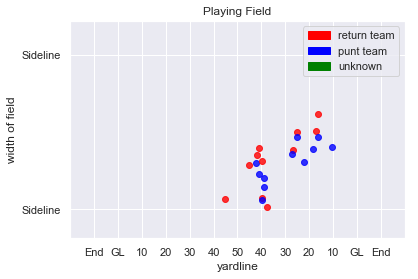

141
Play Description: (4:13) S.Lechler punts 50 yards to NO 22, Center-J.Weeks. T.Lewis to NO 25 for 3 yards (M.Bullough).


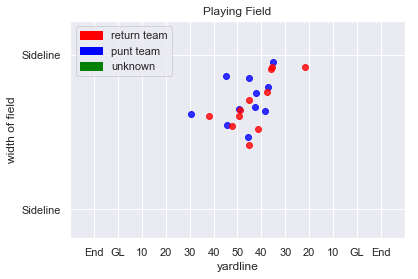

142
Play Description: (1:34) T.Morstead punts 47 yards to HST 17, Center-C.Highland. T.Ervin to HST 16 for -1 yards (E.Harris).


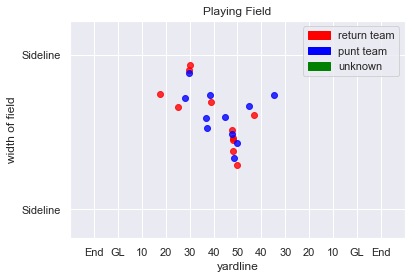

143
Play Description: (13:10) T.Morstead punts 53 yards to HST 24, Center-C.Highland. T.Ervin to HST 28 for 4 yards (D.Lasco).


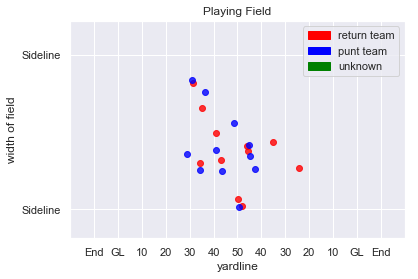

144
Play Description: (1:50) S.Lechler punts 54 yards to NO 24, Center-J.Weeks. M.Murphy pushed ob at NO 35 for 11 yards (A.Hunt). Punt Hang Time Was 4.38 seconds


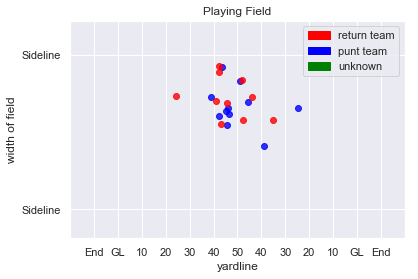

145
Play Description: (5:37) T.Morstead punts 57 yards to HST 34, Center-C.Highland. W.Williams to HST 45 for 11 yards (T.Cadet).


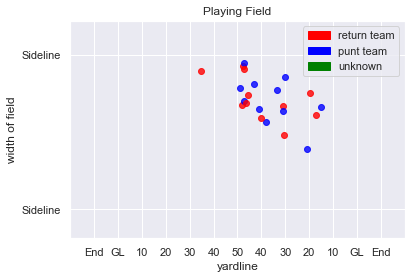

146
Play Description: (13:14) C.Schmidt punts 47 yards to NYG 33, Center-G.Sanborn. D.Harris to NYG 37 for 4 yards (K.Biermann).


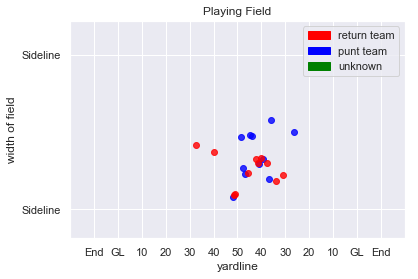

147
Play Description: (4:24) B.Wing punts 49 yards to BUF 29, Center-Z.DeOssie. R.Bush to BUF 32 for 3 yards (M.Herzlich).


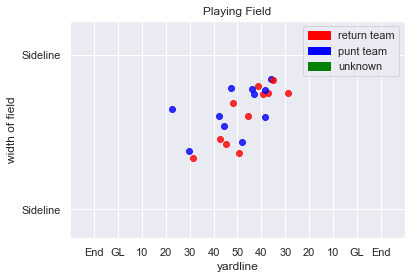

148
Play Description: (:45) B.Wing punts 48 yards to BUF 37, Center-Z.DeOssie. R.Bush pushed ob at BUF 48 for 11 yards (J.Casillas).


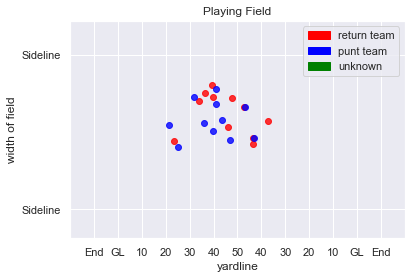

149
Play Description: (10:56) C.Schmidt punts 52 yards to NYG 38, Center-G.Sanborn. D.Harris pushed ob at BUF 48 for 14 yards (G.Sanborn).


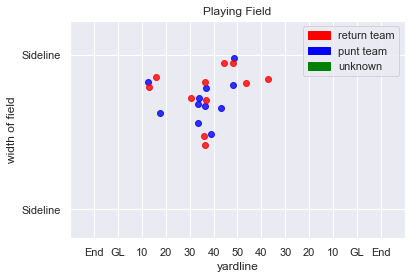

150
Play Description: (4:36) B.Wing punts 51 yards to BUF 24, Center-T.Ott. W.Powell to BUF 35 for 11 yards (D.Thompson; M.Herzlich).


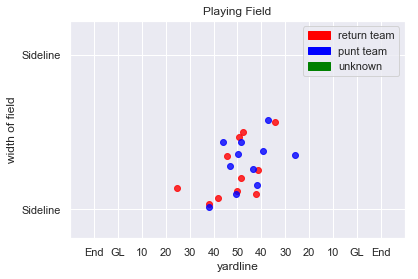

151
Play Description: (7:34) B.Wing punts 55 yards to BUF 35, Center-Z.DeOssie. W.Powell to BUF 36 for 1 yard (J.Adams, D.Powe).


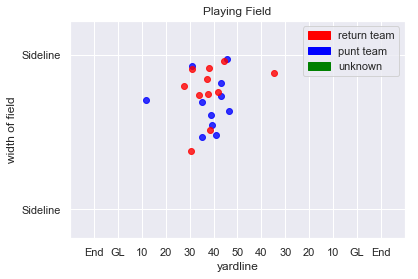

152
Play Description: (5:12) C.Schmidt punts 52 yards to NYG 11, Center-G.Sanborn. B.Rainey to NYG 11 for no gain (J.Boykin). PENALTY on NYG-J.Powell, Unnecessary Roughness, 5 yards, enforced at NYG 11.


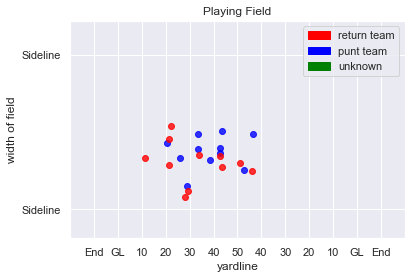

153
Play Description: (2:05) C.Schmidt punts 47 yards to NYG 32, Center-G.Sanborn. B.Rainey pushed ob at BUF 43 for 25 yards (B.Albright).


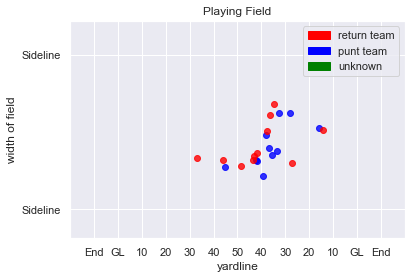

154
Play Description: (3:12) C.Schmidt punts 44 yards to NYG 24, Center-G.Sanborn. B.Rainey pushed ob at NYG 35 for 11 yards (St.Moore).


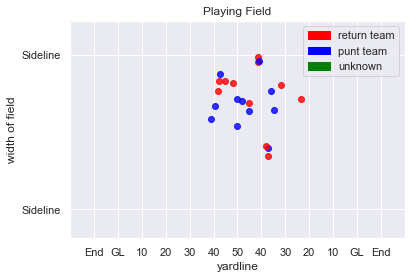

155
Play Description: (7:44) L.Edwards punts 53 yards to WAS 10, Center-T.Purdum. J.Crowder pushed ob at WAS 19 for 9 yards (T.Purdum). PENALTY on WAS, Offensive Holding, 5 yards, enforced at WAS 10.


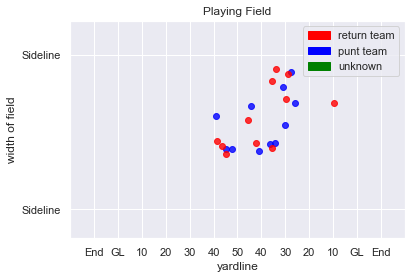

156
Play Description: (6:18) L.Edwards punts 41 yards to NYJ 48, Center-T.Purdum. R.Ross to WAS 47 for -5 yards (R.Miles; D.Morris).


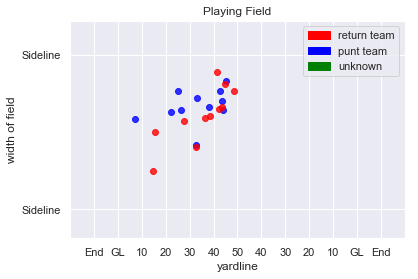

157
Play Description: (13:19) L.Edwards punts 46 yards to WAS 27, Center-T.Purdum. T.Thorpe to WAS 37 for 10 yards (J.Martin).


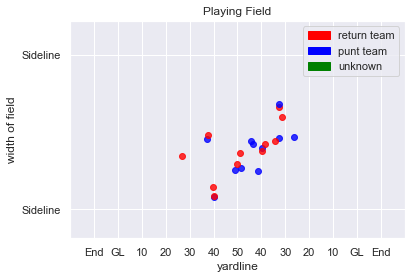

158
Play Description: (10:24) T.Way punts 36 yards to NYJ 11, Center-N.Sundberg. J.Marshall to NYJ 15 for 4 yards (L.Trail). PENALTY on WAS-M.Brown, Offensive Holding, 10 yards, enforced at NYJ 15.


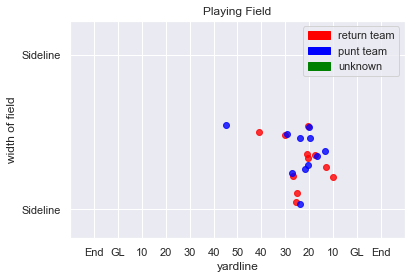

159
Play Description: (8:44) L.Edwards punts 55 yards to WAS 25, Center-T.Purdum. T.Thorpe to WAS 32 for 7 yards (A.Smith).


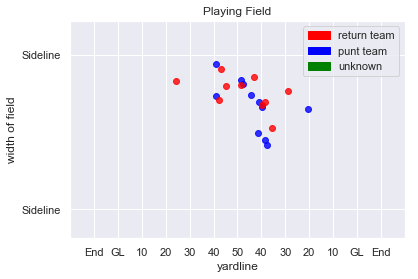

160
Play Description: (11:28) T.Way punts 45 yards to NYJ 32, Center-N.Sundberg. K.Williams to NYJ 36 for 4 yards (D.Everett).


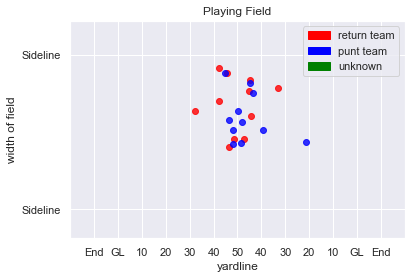

161
Play Description: (7:30) T.Way punts 55 yards to NYJ 30, Center-N.Sundberg. K.Williams pushed ob at NYJ 33 for 3 yards (D.Everett).


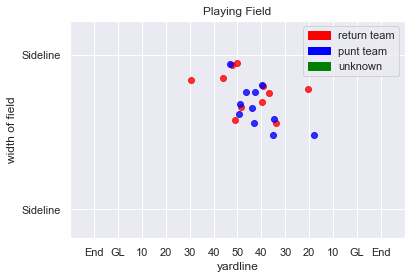

162
Play Description: (4:13) T.Way punts 40 yards to WAS 45, Center-N.Sundberg. K.Williams to WAS 42 for 3 yards (W.Jefferson).


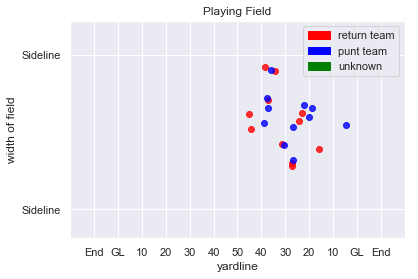

163
Play Description: (:43) T.Masthay punts 36 yards to OAK 33, Center-R.Lovato. D.Washington to OAK 46 for 13 yards (C.Banjo).


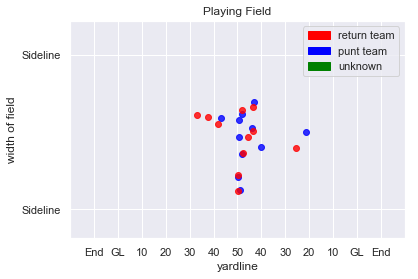

164
Play Description: (2:47) M.King punts 43 yards to GB 26, Center-J.Condo. J.Abbrederis pushed ob at GB 35 for 9 yards (D.Bates).


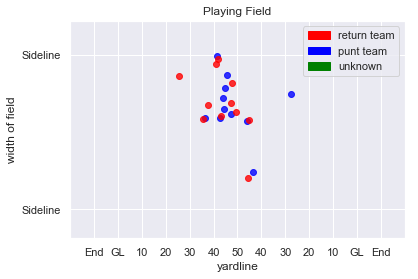

165
Play Description: (14:12) M.King punts 49 yards to GB 25, Center-A.East. J.Abbrederis pushed ob at GB 30 for 5 yards (K.McGill). PENALTY on GB-D.Goodson, Offensive Holding, 10 yards, enforced at GB 30.


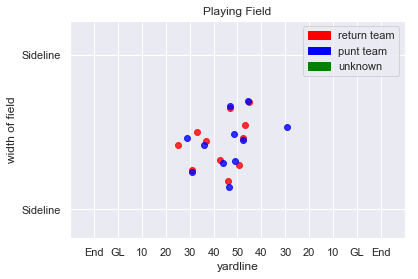

166
Play Description: (6:54) M.King punts 38 yards to GB 35, Center-A.East. T.Davis to OAK 44 for 21 yards (De.McDonald).


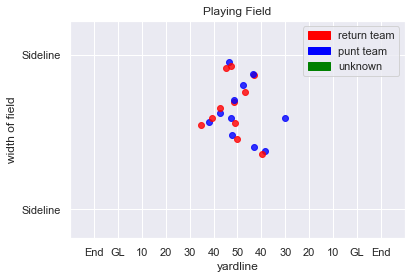

167
Play Description: (9:53) T.Masthay punts 50 yards to OAK 33, Center-R.Lovato. D.Washington to 50 for 17 yards (R.Gilbert; J.Hawkins). PENALTY on OAK-D.McDonald, Offensive Holding, 10 yards, enforced at OAK 45.


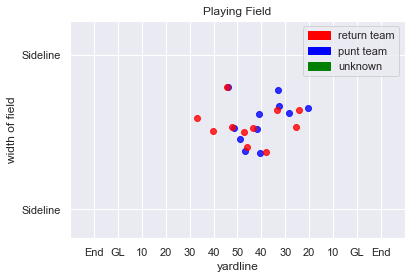

168
Play Description: (4:48) M.King punts 66 yards to GB 7, Center-A.East. T.Davis to GB 16 for 9 yards (A.Hamilton). PENALTY on OAK-A.Hamilton, Illegal Block Above the Waist, 10 yards, enforced at GB 16.


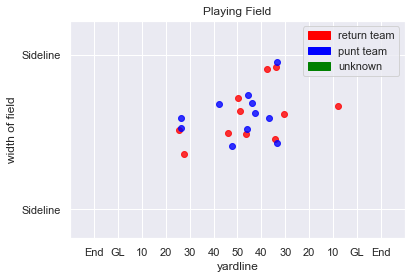

169
Play Description: (11:54) (Punt formation) J.Berry punts 51 yards to PHI 9, Center-G.Warren. K.Barner to PIT 47 for 44 yards (T.Matakevich). PENALTY on PHI-B.Countess, Illegal Block Above the Waist, 5 yards, enforced at PHI 10.


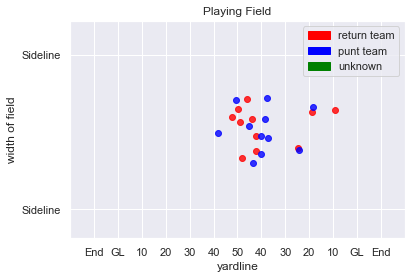

170
Play Description: (9:41) (Punt formation) D.Jones punts 62 yards to PIT 26, Center-J.Dorenbos. E.Rogers to PIT 32 for 6 yards (R.Brooks).


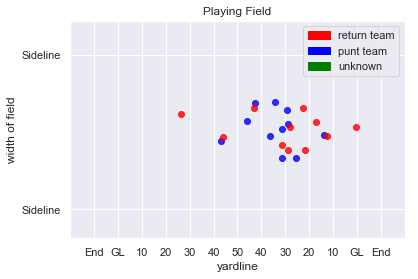

171
Play Description: (1:08) (Punt formation) D.Jones punts 46 yards to PIT 10, Center-J.Dorenbos. E.Rogers ran ob at PIT 27 for 17 yards.


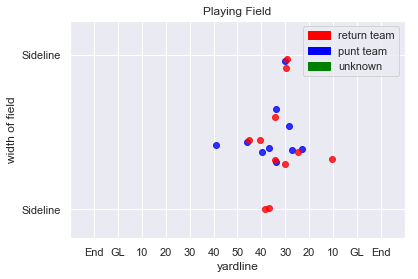

172
Play Description: (6:23) (Punt formation) W.Monday punts 48 yards to PHI 29, Center-G.Warren. K.Barner to PHI 32 for 3 yards (P.Lang). PENALTY on PHI-D.Skinner, Offensive Holding, 10 yards, enforced at PHI 32.


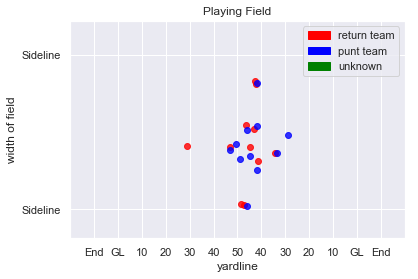

173
Play Description: (3:25) (Punt formation) D.Jones punts 53 yards to PIT 11, Center-J.Dorenbos. D.Ayers to PIT 13 for 2 yards (D.Cherry). PENALTY on PIT-T.Matakevich, Illegal Block Above the Waist, 6 yards, enforced at PIT 13.


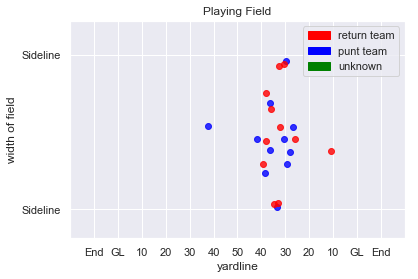

174
Play Description: (14:50) (Punt formation) W.Monday punts 42 yards to PHI 42, Center-G.Warren. K.Barner to PIT 45 for 13 yards (D.Richardson, S.Johnson). PENALTY on PHI-D.Rice, Offensive Holding, 10 yards, enforced at PHI 42.


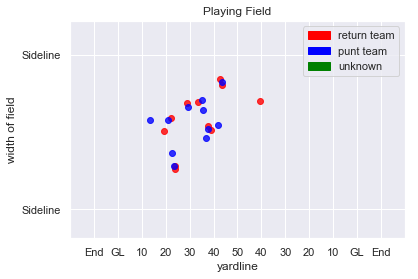

175
Play Description: (6:34) (Punt formation) W.Monday punts 44 yards to PHI 24, Center-G.Warren. K.Barner to PHI 26 for 2 yards (M.Reilly).


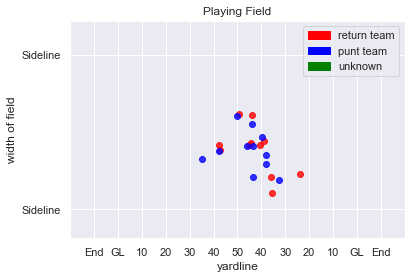

176
Play Description: (5:42) (Punt formation) D.Jones punts 43 yards to PIT 32, Center-J.DePalma. D.Ayers to PIT 36 for 4 yards (D.Cherry).


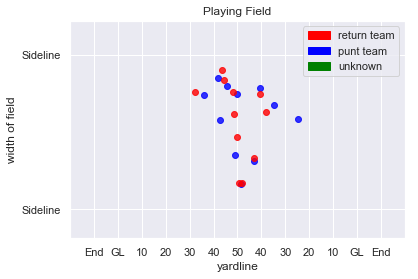

177
Play Description: (8:45) B.Pinion punts 43 yards to DEN 37, Center-K.Nelson. K.Raymond to DEN 35 for -2 yards (M.Cromartie).


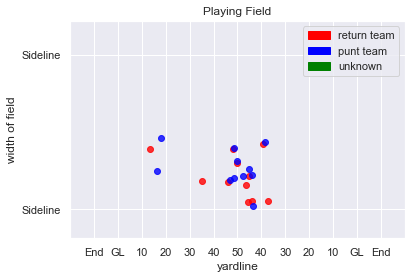

178
Play Description: (1:47) B.Pinion punts 42 yards to DEN 15, Center-K.Nelson. B.Addison to DEN 21 for 6 yards (N.Bellore).


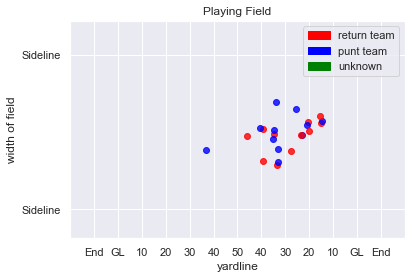

179
Play Description: (12:09) B.Pinion punts 53 yards to DEN 33, Center-K.Nelson. K.Raymond ran ob at DEN 33 for no gain.


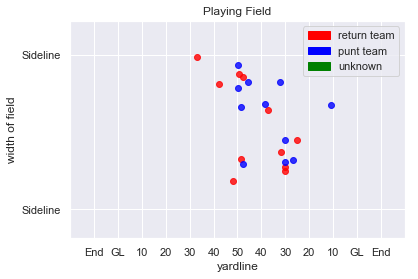

180
Play Description: (8:48) R.Dixon punts 51 yards to SF 19, Center-C.Kreiter. D.White to SF 17 for -2 yards (J.Thompson).


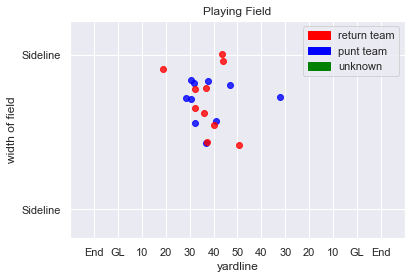

181
Play Description: (9:47) B.Nortman punts 64 yards to TB 25, Center-C.Tinker. A.Humphries to TB 39 for 14 yards (J.Cyprien; Y.Ngakoue). PENALTY on TB-J.George, Illegal Block Above the Waist, 10 yards, enforced at TB 39.


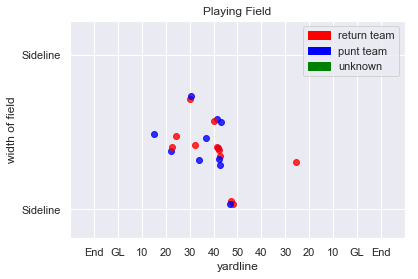

182
Play Description: (3:05) B.Nortman punts 58 yards to TB 24, Center-C.Tinker. A.Humphries to TB 41 for 17 yards (N.Sterling).


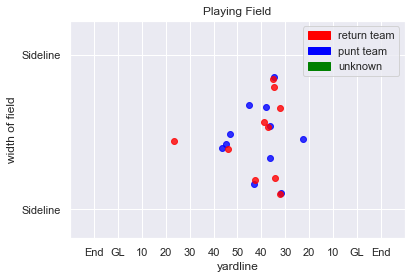

183
Play Description: (12:29) J.Schum punts 41 yards to JAX 35, Center-A.DePaola. B.Walters to JAX 37 for 2 yards (R.Hansbrough).


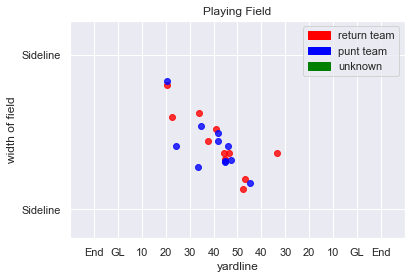

184
Play Description: (7:25) B.Anger punts 49 yards to JAX 20, Center-A.DePaola. B.Walters to JAX 22 for 2 yards (R.Hansbrough).


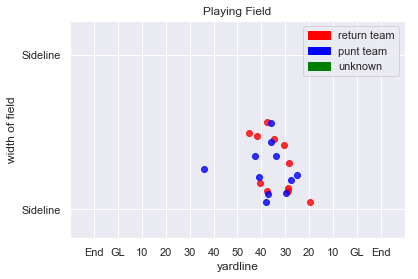

185
Play Description: (14:01) (Punt formation) R.Quigley punts 58 yards to TB 24, Center-C.Tinker. J.Krause to TB 42 for 18 yards (J.Robinson; J.Evans).


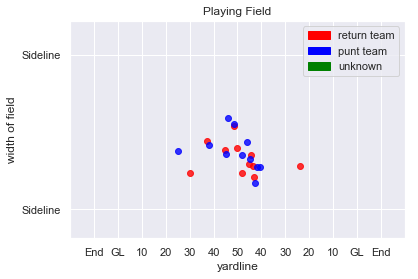

186
Play Description: (6:32) J.Schum punts 41 yards to JAX 38, Center-A.DePaola. S.Wynn ran ob at JAX 39 for 1 yard.


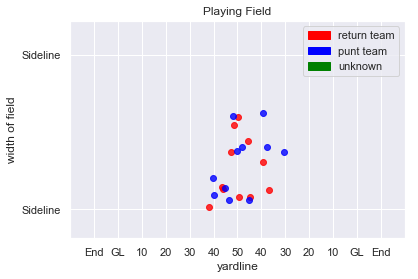

187
Play Description: (2:03) M.King punts 69 yards to TEN 16, Center-J.Condo. D.McCluster to TEN 29 for 13 yards (N.Allen).


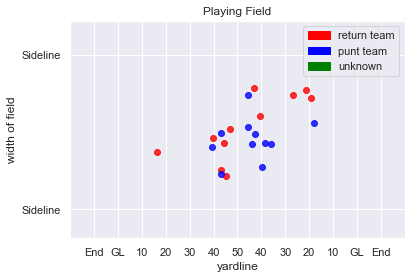

188
Play Description: (4:40) B.Kern punts 35 yards to OAK 10, Center-B.Brinkley. A.Hamilton to OAK 10 for no gain (M.Huff).


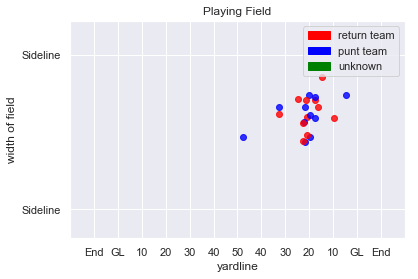

189
Play Description: (1:16) B.Kern punts 50 yards to OAK 21, Center-B.Brinkley. J.Mickens to OAK 30 for 9 yards (D.Cobb). Penalty on OAK-J.Lotulelei, Running Into the Kicker, declined.


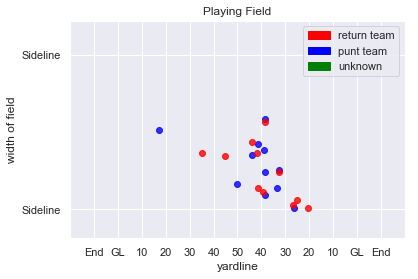

190
Play Description: (10:30) (Punt formation) D.Kaser punts 59 yards to MIN 6, Center-M.Windt. T.Stoudermire to MIN 16 for 10 yards (T.Williams).


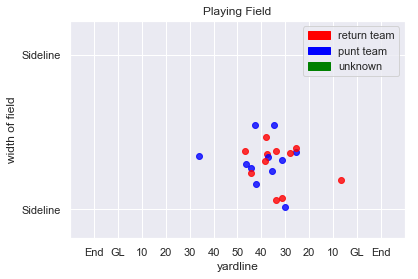

191
Play Description: (7:45) (Punt formation) J.Locke punts 53 yards to SD 36, Center-K.McDermott. I.Burse to SD 45 for 9 yards (T.Plummer). PENALTY on SD-D.Watt, Illegal Block Above the Waist, 10 yards, enforced at SD 45.


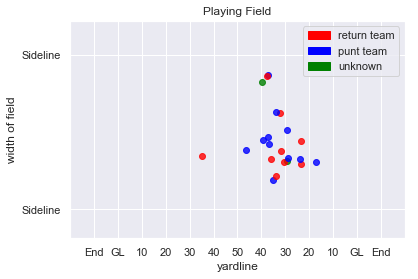

192
Play Description: (8:35) S.Lechler punts 52 yards to ARZ 25, Center-J.Weeks. A.Ellington to ARZ 28 for 3 yards (B.McKinney).


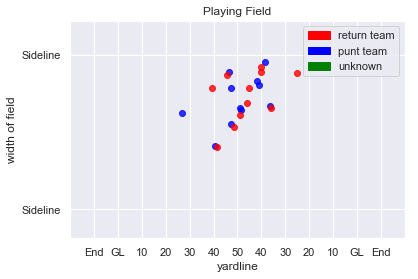

193
Play Description: (11:53) S.Lechler punts 60 yards to ARZ 8, Center-J.Weeks. J.Nelson to ARZ 19 for 11 yards (A.Dent; B.Scarlett).


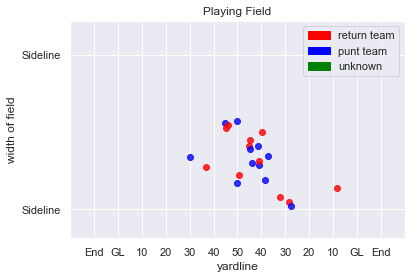

194
Play Description: (3:11) S.Lechler punts 54 yards to ARZ 16, Center-J.Weeks. J.Nelson ran ob at ARZ 20 for 4 yards (E.Pleasant).


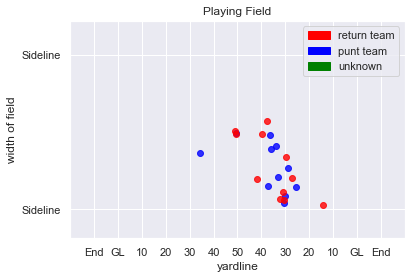

195
Play Description: (7:30) S.Lechler punts 47 yards to ARZ 40, Center-J.Weeks. J.Shipley to ARZ 47 for 7 yards (R.Cliett).


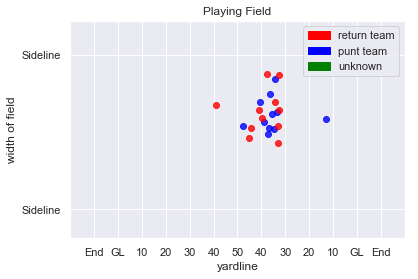

196
Play Description: (5:28) G.Swanson punts 43 yards to HST 12, Center-D.Dillon. W.Williams to HST 11 for -1 yards (L.Louis).


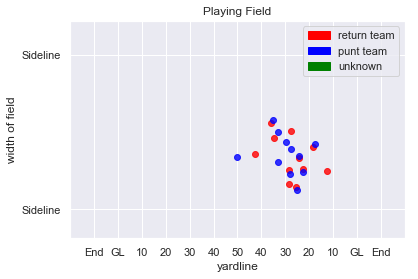

197
Play Description: (3:11) S.Lechler punts 60 yards to ARZ 16, Center-J.Weeks. C.Hubert to ARZ 29 for 13 yards (B.Peters). PENALTY on ARZ-M.Farley, Illegal Block Above the Waist, 10 yards, enforced at ARZ 21. Penalty on ARZ-H.Miller, Offensive Holding, declined.


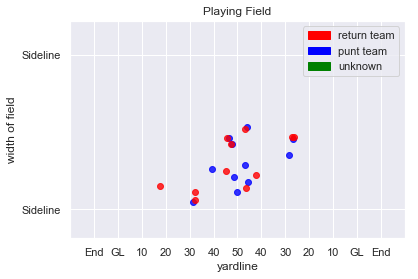

198
Play Description: (10:50) R.Quigley punts 45 yards to CIN 27, Center-C.Tinker. A.Erickson to CIN 45 for 18 yards (H.Pullard).


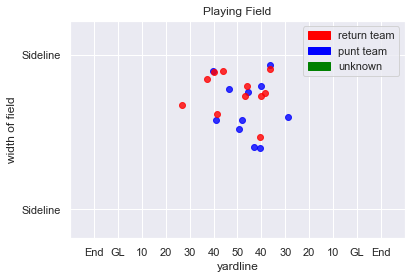

199
Play Description: (:36) K.Huber punts 39 yards to JAX 18, Center-C.Harris. M.Lee pushed ob at JAX 32 for 14 yards (J.Wright).


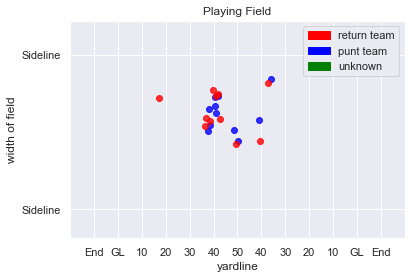

200
Play Description: (12:37) R.Quigley punts 56 yards to CIN 19, Center-C.Tinker. B.Tate ran ob at CIN 25 for 6 yards (T.Washington).


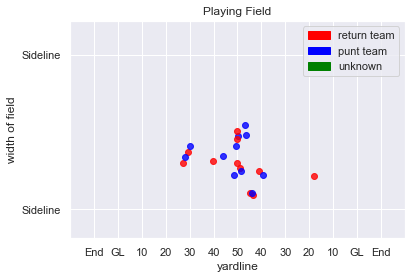

201
Play Description: (10:33) K.Huber punts 49 yards to JAX 31, Center-C.Harris. J.Johnson to JAX 38 for 7 yards (J.Luc).


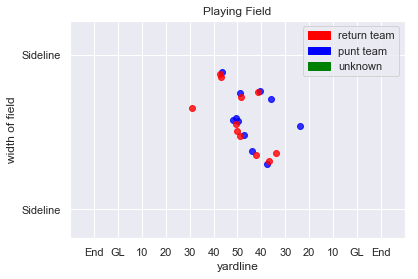

202
Play Description: (9:15) K.Huber punts 56 yards to JAX 16, Center-C.Harris. S.Wynn ran ob at JAX 36 for 20 yards (C.Harris).


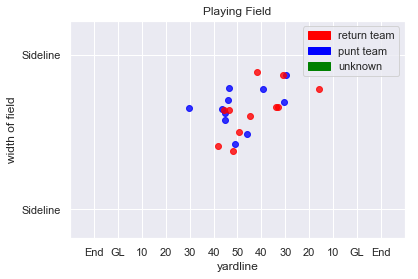

203
Play Description: (8:48) R.Quigley punts 41 yards to CIN 23, Center-C.Tinker. A.Erickson to JAX 38 for 39 yards (C.Grant).


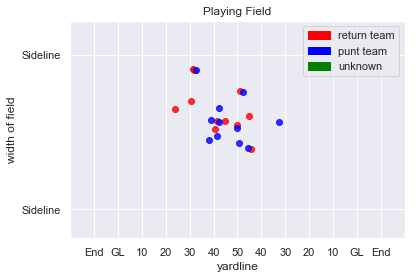

204
Play Description: (3:53) R.Quigley punts 42 yards to CIN 46, Center-C.Tinker. B.Tate to JAX 44 for 10 yards (N.Jacobs).


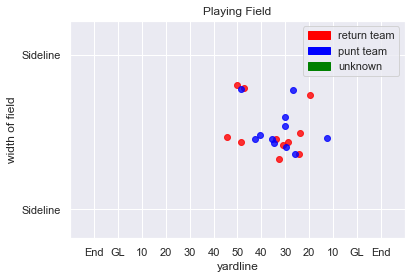

205
Play Description: (6:33) C.Schmidt punts 54 yards to WAS 20, Center-R.Ferguson. R.Ross ran ob at WAS 31 for 11 yards (J.Wilder). BUF-J.Dowling was injured during the play. He is Out. BUF-R.Ferguson was injured during the play.  Dowling injured his knee on the play


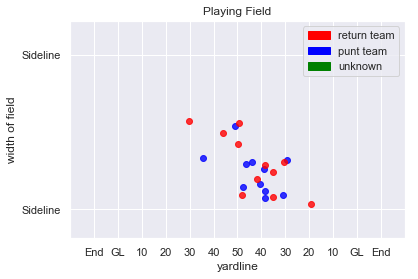

206
Play Description: (13:05) T.Way punts 63 yards to BUF 18, Center-N.Sundberg. W.Powell pushed ob at WAS 46 for 36 yards (C.Fields).


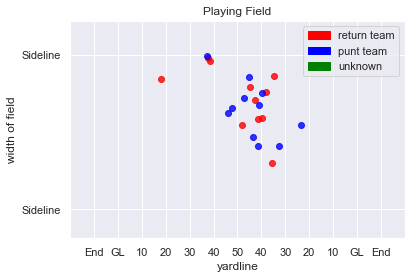

207
Play Description: (12:54) T.Way punts 44 yards to BUF 17, Center-N.Sundberg. W.Powell to BUF 22 for 5 yards (T.Thorpe).


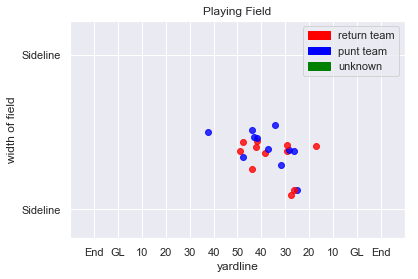

208
Play Description: (6:42) T.Way punts 51 yards to BUF 24, Center-N.Sundberg. W.Powell pushed ob at BUF 40 for 16 yards (R.Kelley).


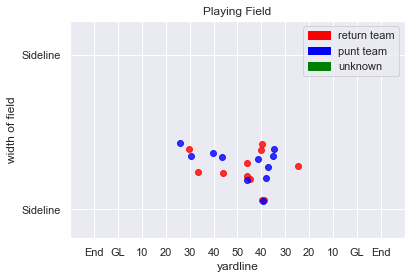

209
Play Description: (8:48) J.Ryan punts 65 yards to DAL 10, Center-N.Frese. L.Whitehead to DAL 19 for 9 yards (J.Lane; B.Williams).


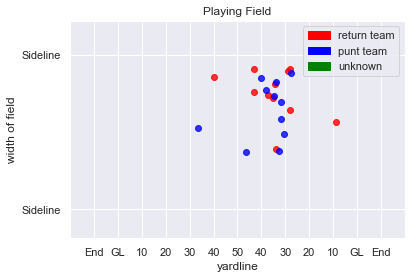

210
Play Description: (11:31) C.Jones punts 45 yards to SEA 19, Center-L.Ladouceur. T.Lockett to SEA 21 for 2 yards (J.Wilcox; A.Hitchens). PENALTY on SEA-B.Browner, Illegal Block Above the Waist, 9 yards, enforced at SEA 19.


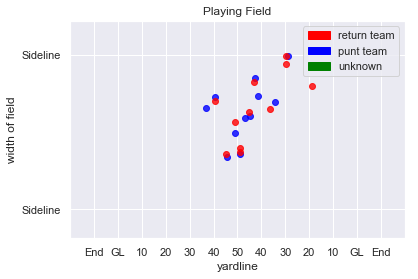

211
Play Description: (9:12) J.Ryan punts 58 yards to DAL 32, Center-N.Frese. L.Whitehead to DAL 41 for 9 yards (D.Shead; B.Williams).


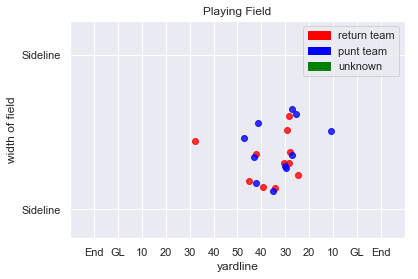

212
Play Description: (14:49) M.Wile punts 65 yards to SEA 13, Center-Z.Wood. D.Foxx to SEA 22 for 9 yards (K.Smith).


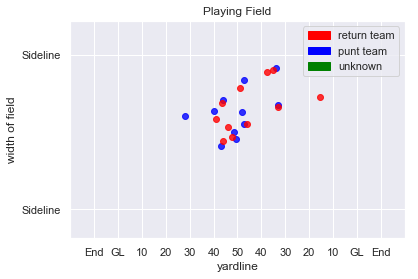

213
Play Description: (7:17) J.Ryan punts 38 yards to DAL 34, Center-N.Frese. D.Swanson to DAL 47 for 13 yards (T.Smith; K.Lambert).


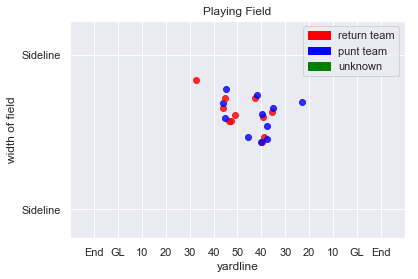

214
Play Description: (:55) J.Ryan punts 62 yards to DAL 7, Center-N.Frese. D.Swanson to DAL 8 for 1 yard (J.Shirley). PENALTY on DAL-A.Colquhoun, Offensive Holding, 4 yards, enforced at DAL 8.


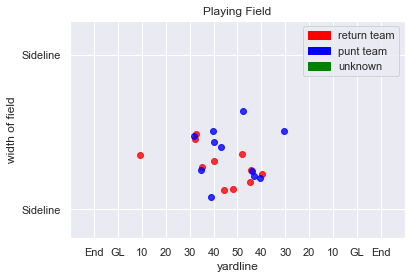

215
Play Description: (7:13) (Punt formation) S.Martin punts 55 yards to BLT 27, Center-J.Landes. M.Campanaro to BLT 42 for 15 yards (D.Washington).


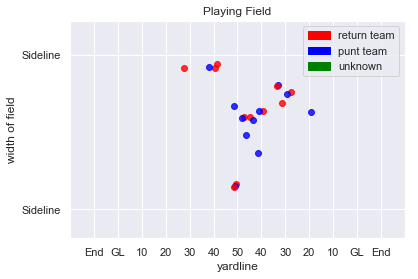

216
Play Description: (5:28) (Punt formation) S.Koch punts 43 yards to DET 33, Center-M.Cox. J.Billingsley to DET 34 for 1 yard (C.Byndom).


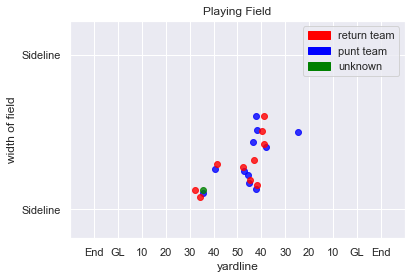

217
Play Description: (4:35) (Punt formation) D.Bell punts 38 yards to BLT 26, Center-J.Landes. K.Reynolds to BLT 38 for 12 yards (A.Barnes).


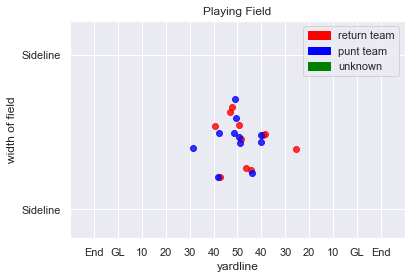

218
Play Description: (9:59) P.Mortell punts 42 yards to SF 30, Center-R.Lovato. B.Ellington pushed ob at SF 47 for 17 yards (J.Perillo).


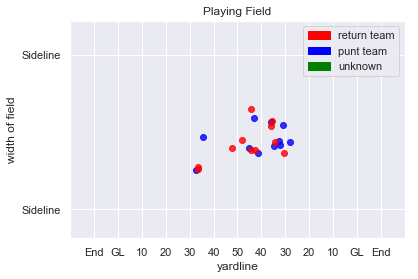

219
Play Description: (11:04) P.Mortell punts 40 yards to SF 25, Center-R.Lovato. B.Ellington to SF 29 for 4 yards (S.Barrington).


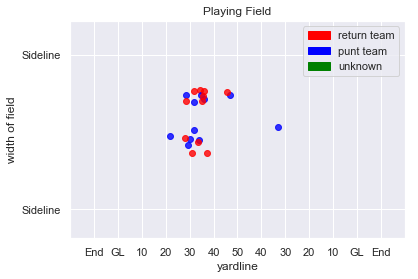

220
Play Description: (9:37) B.Pinion punts 43 yards to GB 21, Center-K.Nelson. M.Hyde to GB 26 for 5 yards (D.Johnson).


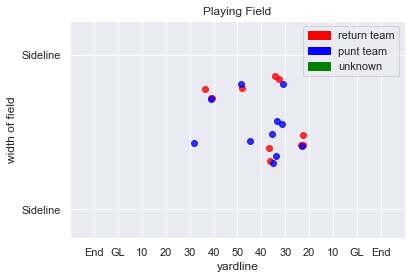

221
Play Description: (5:16) B.Pinion punts 54 yards to GB 17, Center-K.Nelson. T.Davis to GB 22 for 5 yards (B.Bell).


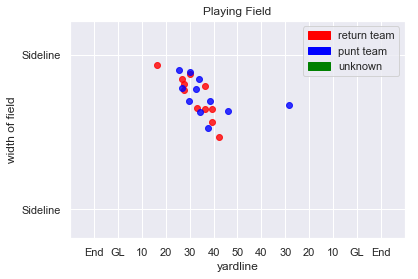

222
Play Description: (2:53) P.Mortell punts 49 yards to SF 35, Center-R.Lovato. D.White to SF 40 for 5 yards (K.Fackrell).


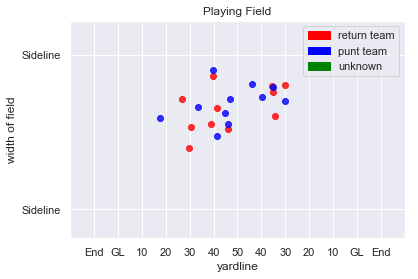

223
Play Description: (5:52) (Punt formation) P.O'Donnell punts 49 yards to KC 18, Center-P.Scales. T.Hill pushed ob at KC 36 for 18 yards (C.Jones).


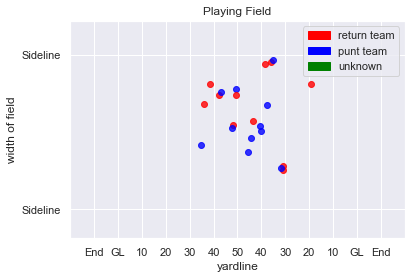

224
Play Description: (12:12) (Punt formation) P.O'Donnell punts 44 yards to KC 35, Center-A.Brewer. T.Hill pushed ob at 50 for 15 yards (S.Acho).


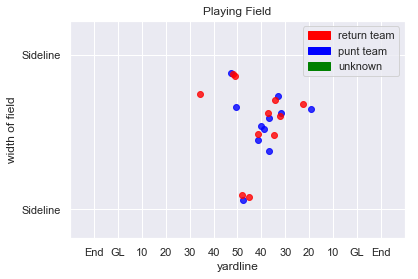

225
Play Description: (9:15) (Punt formation) P.O'Donnell punts 52 yards to KC 27, Center-A.Brewer. F.Hammond to KC 36 for 9 yards (S.McManis).


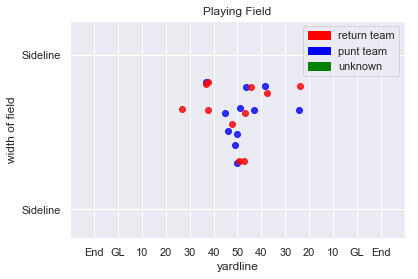

226
Play Description: (4:01) (Punt formation) P.O'Donnell punts 61 yards to KC 18, Center-A.Brewer. F.Hammond to KC 30 for 12 yards (J.Timu).


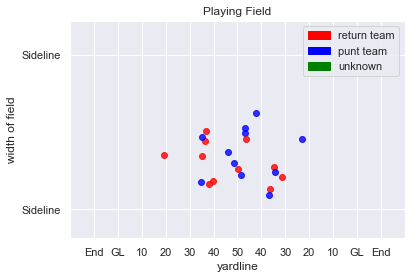

227
Play Description: (5:31) (Punt formation) P.O'Donnell punts 47 yards to KC 25, Center-P.Scales. D.Thomas pushed ob at CHI 44 for 31 yards (P.O'Donnell).


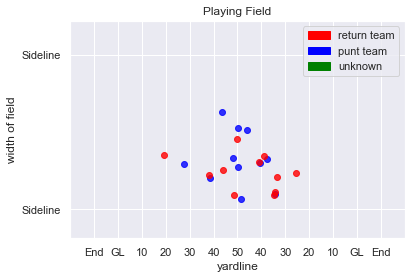

228
Play Description: (13:06) J.Hekker punts 46 yards to DEN 41, Center-J.McQuaide. J.Norwood to DEN 43 for 2 yards (C.Reynolds).


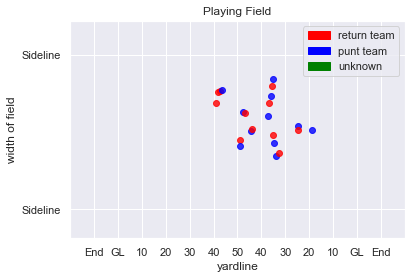

229
Play Description: (5:38) R.Dixon punts 51 yards to LA 42, Center-C.Kreiter. P.Cooper to LA 43 for 1 yard (S.Barrett). PENALTY on LA-L.Joyner, Offensive Holding, 10 yards, enforced at LA 43.


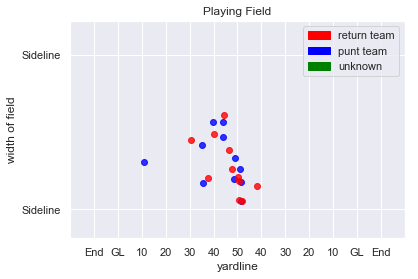

230
Play Description: (7:56) J.Hekker punts 54 yards to DEN 33, Center-J.McQuaide. J.Norwood ran ob at DEN 33 for no gain.


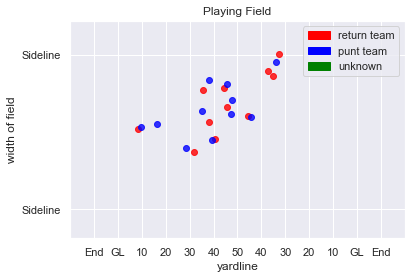

231
Play Description: (13:16) R.Dixon punts 43 yards to LA 24, Center-C.Kreiter. P.McRoberts to LA 27 for 3 yards (W.Parks). PENALTY on LA-C.Bryant, Offensive Holding, 10 yards, enforced at LA 24.


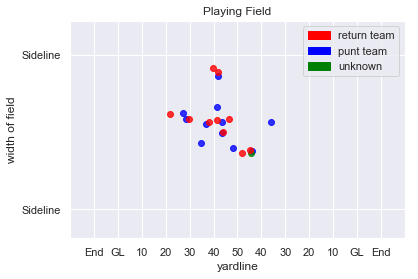

232
Play Description: (11:44) J.Hekker punts 42 yards to LA 49, Center-J.McQuaide. K.Raymond to LA 41 for 8 yards (P.McRoberts).


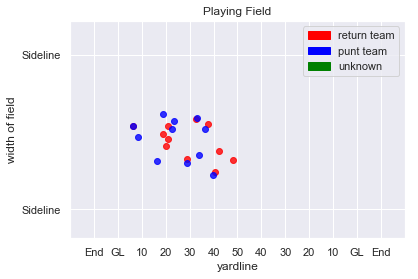

233
Play Description: (:22) R.Dixon punts 48 yards to LA 25, Center-C.Kreiter. P.McRoberts to LA 41 for 16 yards (B.Ross). PENALTY on LA-J.Washington, Offensive Holding, 10 yards, enforced at LA 34.


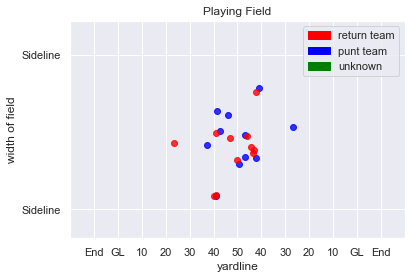

234
Play Description: (9:22) R.Dixon punts 56 yards to LA 19, Center-C.Kreiter. P.McRoberts ran ob at LA 21 for 2 yards.


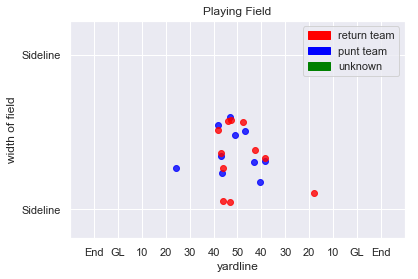

235
Play Description: (7:58) J.Hekker punts 42 yards to DEN 31, Center-J.Overbaugh. K.Raymond to DEN 34 for 3 yards (M.Thomas).


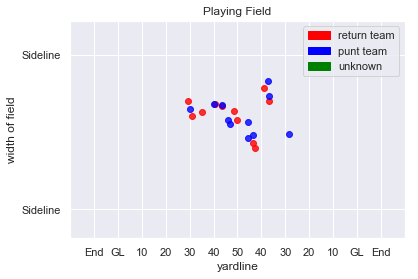

236
Play Description: (9:34) K.Redfern punts 61 yards to NE 30, Center-J.Jansen. C.Jones to NE 35 for 5 yards (M.Addison).


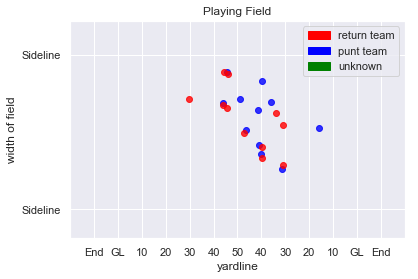

237
Play Description: (7:49) R.Allen punts 53 yards to CAR 19, Center-J.Cardona. T.Ginn to CAR 28 for 9 yards (B.King; J.Freeny).


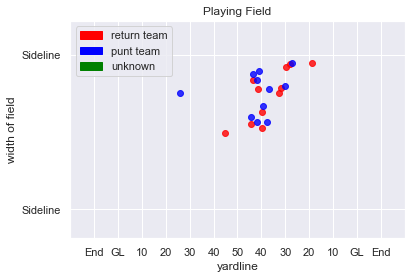

238
Play Description: (4:54) R.Allen punts 50 yards to CAR 22, Center-J.Cardona. T.Ginn pushed ob at CAR 25 for 3 yards (B.Bolden). PENALTY on CAR-J.Bradberry, Illegal Block Above the Waist, 9 yards, enforced at CAR 18.


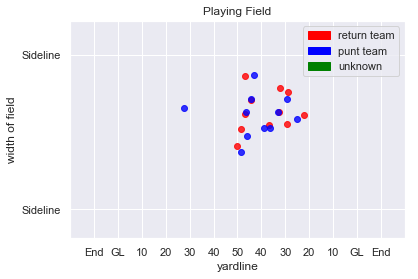

239
Play Description: (8:43) K.Redfern punts 45 yards to NE 23, Center-J.Jansen. C.Jones to NE 43 for 20 yards (C.Jones).


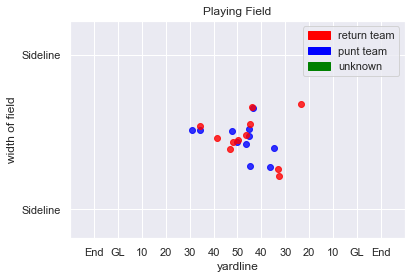

240
Play Description: (7:01) R.Allen punts 46 yards to CAR 29, Center-J.Cardona. D.Byrd to CAR 29 for no gain (J.Jones). PENALTY on CAR-K.Garrett, Offensive Holding, 10 yards, enforced at CAR 29.


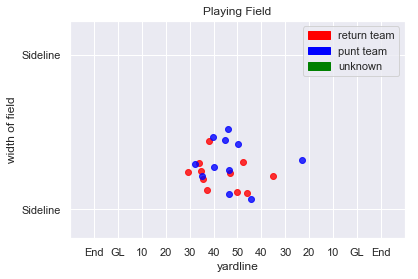

241
Play Description: (4:09) K.Redfern punts 61 yards to NE 10, Center-J.Jansen. C.Jones to CAR 30 for 60 yards (K.Redfern).


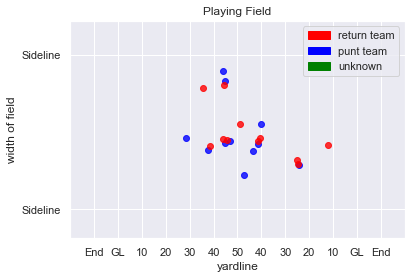

242
Play Description: (10:03) K.Redfern punts 53 yards to NE 30, Center-J.Jansen. D.Foster pushed ob at NE 46 for 16 yards (J.Norris).


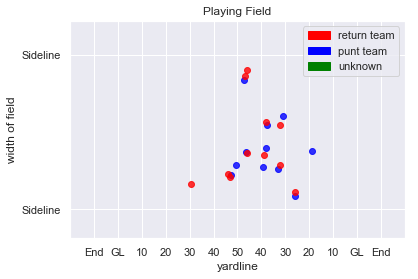

243
Play Description: (:31) L.Edwards punts 39 yards to NYG 18, Center-T.Purdum. D.Harris to NYG 28 for 10 yards (R.Miles).


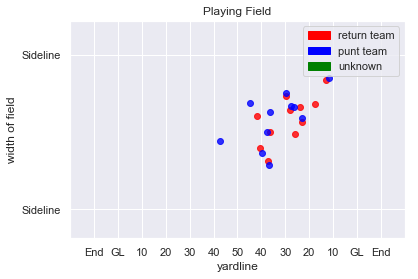

244
Play Description: (12:52) B.Wing punts 45 yards to NYJ 12, Center-Z.DeOssie. J.Marshall to NYJ 13 for 1 yard (D.Harris).


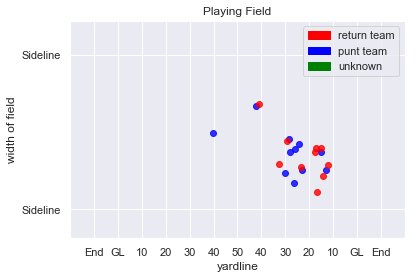

245
Play Description: (10:32) L.Edwards punts 45 yards to NYG 38, Center-J.Stanford. D.Harris to NYG 42 for 4 yards (J.Stanford).


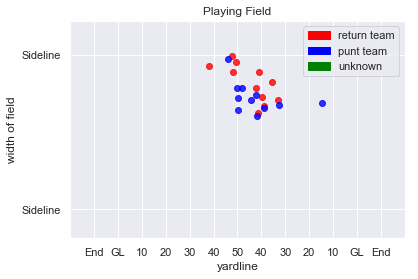

246
Play Description: (8:29) B.Wing punts 44 yards to NYJ 10, Center-T.Ott. J.Ross to NYJ 38 for 28 yards (O.Darkwa; B.Goodson).


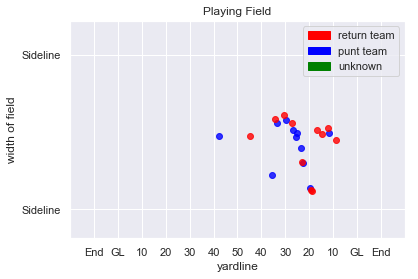

247
Play Description: (7:55) L.Edwards punts 48 yards to NYG 7, Center-T.Purdum. D.Harris to NYG 36 for 29 yards (J.Martin).


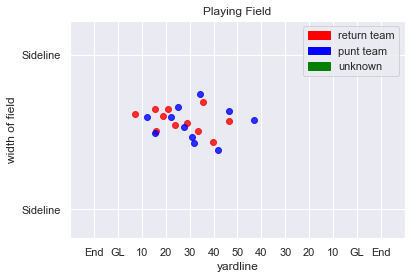

248
Play Description: (:51) L.Edwards punts 56 yards to NYG 19, Center-T.Purdum. D.Harris to NYG 25 for 6 yards (R.Miles).


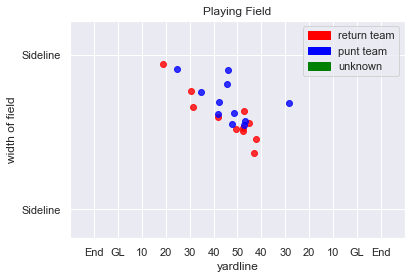

249
Play Description: (:09) B.Wing punts 48 yards to NYJ 20, Center-T.Ott. J.Marshall to NYJ 26 for 6 yards (K.Sheppard).


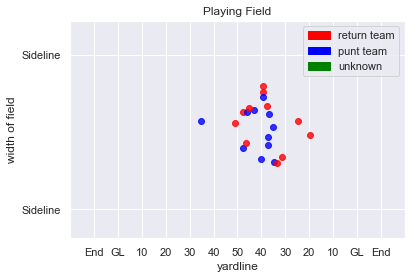

250
Play Description: (12:41) B.Wing punts 61 yards to NYJ 11, Center-Z.DeOssie. J.Ross to NYJ 23 for 12 yards (C.Taylor; Z.DeOssie).


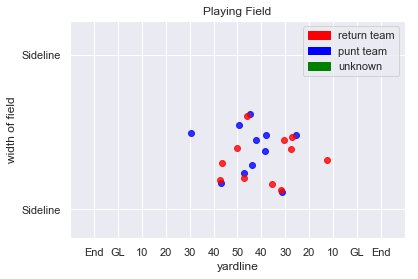

251
Play Description: (9:14) L.Edwards punts 46 yards to NYG 13, Center-T.Purdum. B.Rainey to NYG 14 for 1 yard (R.Miles). PENALTY on NYG-T.King, Illegal Block Above the Waist, 7 yards, enforced at NYG 14.


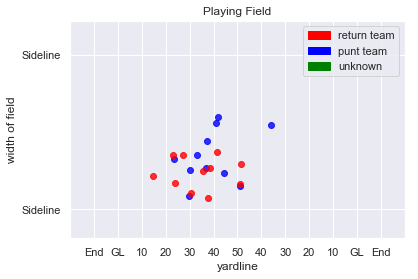

252
Play Description: (7:32) B.Wing punts 45 yards to NYJ 48, Center-Z.DeOssie. J.Ross to NYJ 48 for no gain (C.Taylor; J.Adams).


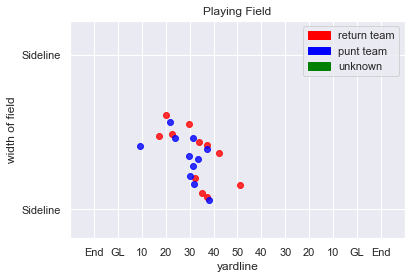

253
Play Description: (4:29) B.Wing punts 53 yards to NYJ 25, Center-Z.DeOssie. J.Ross to NYJ 33 for 8 yards (Z.DeOssie; J.Adams).


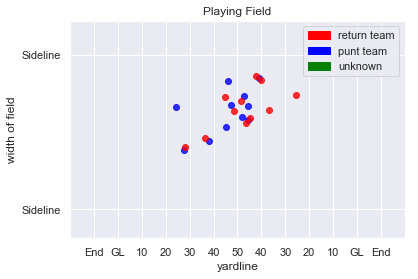

254
Play Description: (2:49) L.Edwards punts 49 yards to NYG 17, Center-T.Purdum. B.Rainey to NYG 38 for 21 yards (B.Bostick). PENALTY on NYJ-B.Bostick, Face Mask (15 Yards), 15 yards, enforced at NYG 38.


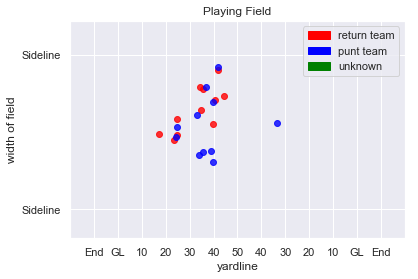

255
Play Description: (12:18) P.McAfee punts 56 yards to PHI 17, Center-M.Overton. K.Barner to PHI 42 for 25 yards (D.Southward).


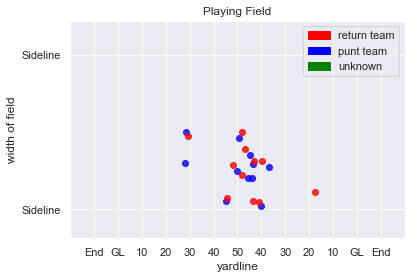

256
Play Description: (4:43) (Punt formation) D.Jones punts 52 yards to IND 14, Center-J.Dorenbos. C.Rogers pushed ob at IND 48 for 34 yards (D.Jones). PENALTY on IND-D.Anthrop, Illegal Block Above the Waist, 10 yards, enforced at IND 23. Penalty on IND-C.Maggitt, Illegal Blindside Block, declined.


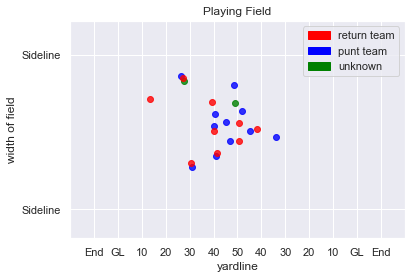

257
Play Description: (4:13) (Punt formation) P.McAfee punts 48 yards to PHI 39, Center-M.Overton. K.Barner to PHI 47 for 8 yards (L.Hightower).


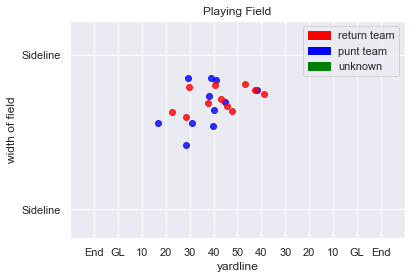

258
Play Description: (:20) T.Morstead punts 61 yards to PIT 11, Center-J.Drescher. E.Rogers to PIT 27 for 16 yards (K.Crawley).


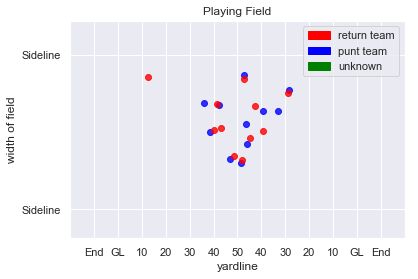

259
Play Description: (11:58) T.Morstead punts 41 yards to PIT 20, Center-J.Drescher. D.Ayers to PIT 25 for 5 yards (T.Steward).


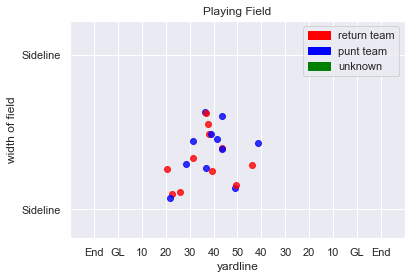

260
Play Description: (9:34) W.Monday punts 40 yards to NO 36, Center-G.Warren. T.Lewis ran ob at NO 37 for 1 yard.


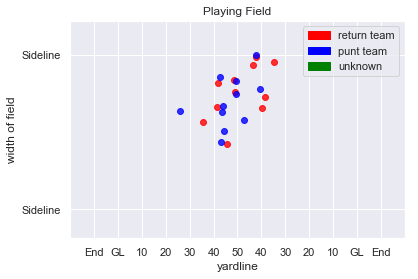

261
Play Description: (7:55) T.Morstead punts 52 yards to PIT 23, Center-J.Drescher. D.Ayers to PIT 26 for 3 yards (C.Manhertz).


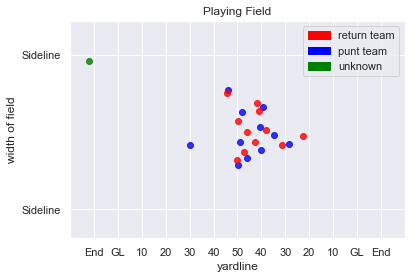

262
Play Description: (6:29) (Punt formation) M.Darr punts 44 yards to ATL 35, Center-J.Denney. E.Weems to ATL 40 for 5 yards (B.McCain; M.Hull).


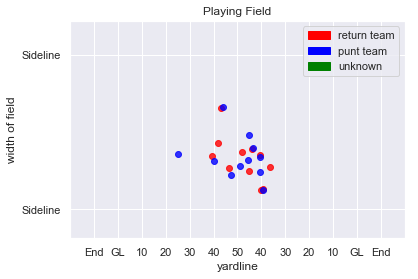

263
Play Description: (10:01) (Punt formation) M.Darr punts 41 yards to ATL 38, Center-J.Denney. E.Weems to ATL 41 for 3 yards (M.Gray).


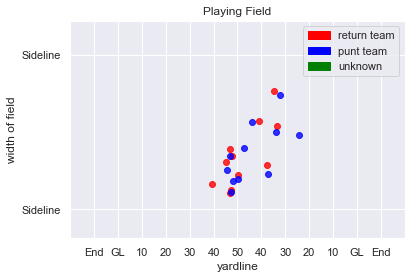

264
Play Description: (8:36) (Punt formation) M.Bosher punts 43 yards to MIA 9, Center-J.Harris. J.Grant to MIA 26 for 17 yards (J.Harris).


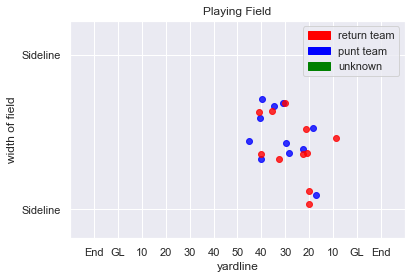

265
Play Description: (11:44) (Punt formation) M.Darr punts 58 yards to ATL 22, Center-R.DiSalvo. J.McKissic to ATL 31 for 9 yards (A.Hendy).


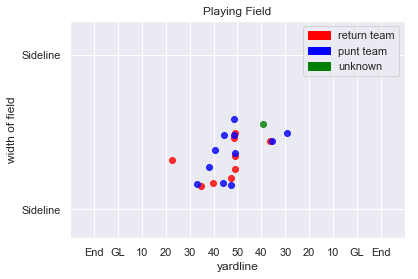

266
Play Description: (13:27) (Punt formation) A.Lee punts 53 yards to TB 20, Center-C.Hughlett. B.Reedy pushed ob at TB 28 for 8 yards (D.Kindred).


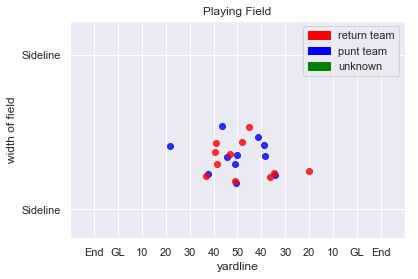

267
Play Description: (7:15) (Punt formation) A.Lee punts 58 yards to TB 7, Center-C.Hughlett. B.Reedy to TB 15 for 8 yards (D.Jennings; T.Carder).


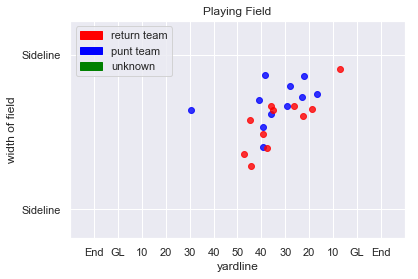

268
Play Description: (3:12) (Punt formation) B.Anger punts 51 yards to CLV 27, Center-A.DePaola. C.Coleman pushed ob at CLV 37 for 10 yards (M.Awe).


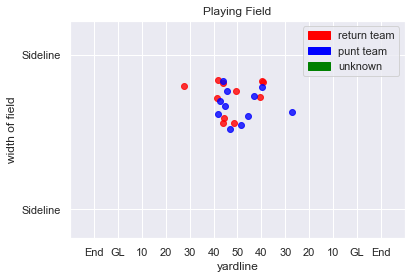

269
Play Description: (:47) (Punt formation) J.Schum punts 39 yards to CLV 15, Center-A.DePaola. C.Coleman to CLV 15 for no gain (R.Shepard).


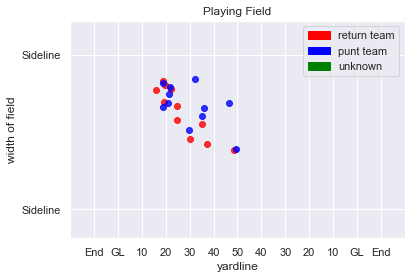

270
Play Description: (9:32) (Punt formation) B.Anger punts 55 yards to CLV 35, Center-A.DePaola. T.Gabriel to CLV 39 for 4 yards (L.Rhodes). PENALTY on CLV-T.Watson, Illegal Block Above the Waist, 10 yards, enforced at CLV 39.


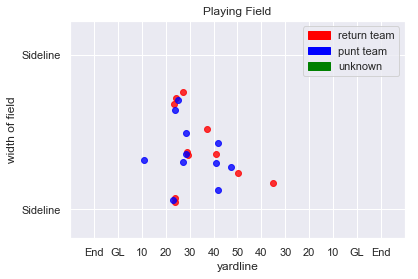

271
Play Description: (2:55) (Punt formation) J.Schum punts 52 yards to CLV 12, Center-A.DePaola. T.Gabriel to CLV 24 for 12 yards (I.Johnson). PENALTY on CLV-C.Johnson, Illegal Block Above the Waist, 9 yards, enforced at CLV 18.


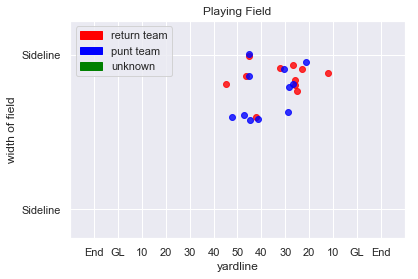

272
Play Description: (:12) (Punt formation) A.Lee punts 54 yards to TB 23, Center-C.Hughlett. B.Reedy to CLV 34 for 43 yards (M.Johnson).


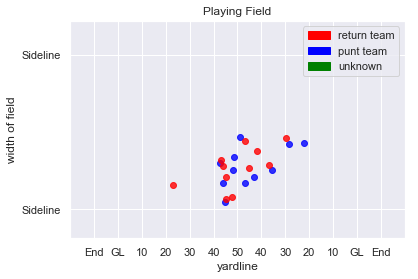

273
Play Description: (13:48) B.Nortman punts 53 yards to ATL 28, Center-C.Tinker. J.McKissic to ATL 36 for 8 yards (B.Koyack).


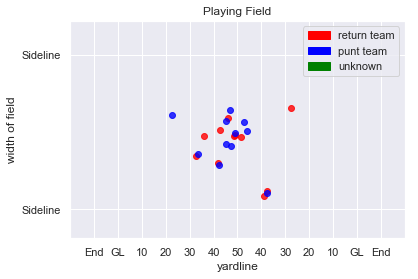

274
Play Description: (2:03) B.Nortman punts 64 yards to ATL 15, Center-C.Tinker. N.Williams pushed ob at ATL 40 for 25 yards (S.Evans). PENALTY on JAX, Illegal Formation, 5 yards, enforced at ATL 40.


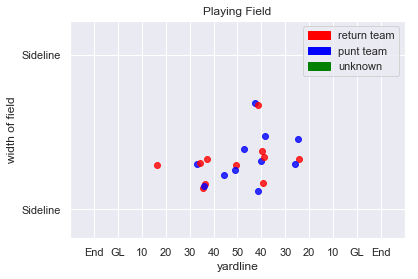

275
Play Description: (13:45) M.Bosher punts 45 yards to JAX 26, Center-J.Harris. S.Wynn to JAX 31 for 5 yards (S.Neasman). PENALTY on JAX-B.Boddy-Calhoun, Unsportsmanlike Conduct, 15 yards, enforced at JAX 31.


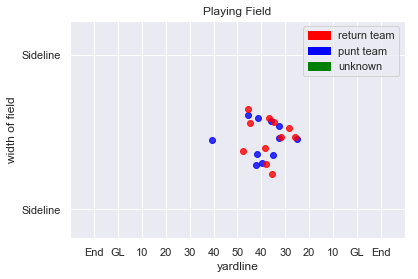

276
Play Description: (13:14) M.Bosher punts 54 yards to JAX 18, Center-J.Harris. S.Wynn ran ob at JAX 35 for 17 yards (J.Perkins).


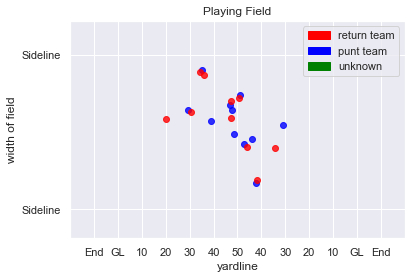

277
Play Description: (9:25) (Punt formation) J.Locke punts 47 yards to LA 12, Center-K.McDermott. P.McRoberts to LA 26 for 14 yards (B.Watts).


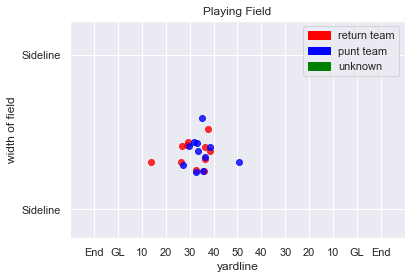

278
Play Description: (1:47) (Punt formation) J.Hekker punts 51 yards to MIN 18, Center-J.McQuaide. M.Sherels to MIN 36 for 18 yards (N.Grigsby). PENALTY on LA-A.Green, Player Out of Bounds on Punt, 5 yards, enforced at MIN 36.


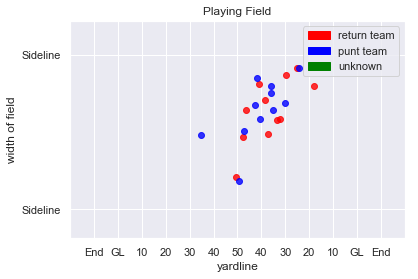

279
Play Description: (14:20) (Punt formation) J.Locke punts 51 yards to LA 22, Center-K.McDermott. P.McRoberts to LA 36 for 14 yards (K.Carter).


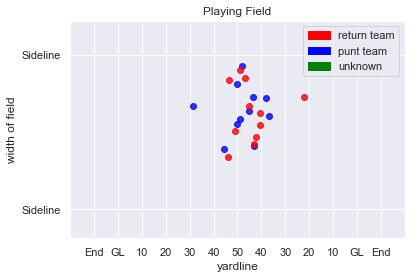

280
Play Description: (8:38) (Punt formation) J.Locke punts 50 yards to LA 5, Center-K.McDermott. P.McRoberts to LA 20 for 15 yards (A.Harris).


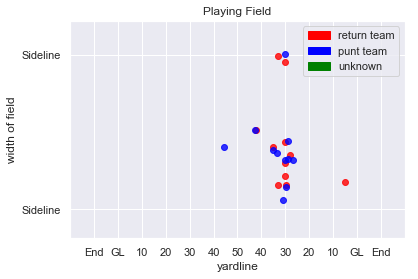

281
Play Description: (12:25) J.Locke punts 37 yards to LA 18, Center-K.McDermott. P.McRoberts to LA 25 for 7 yards (T.Roberson).


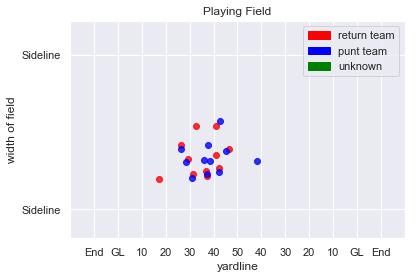

282
Play Description: (:52) (Punt formation) J.Locke punts 47 yards to LA 21, Center-K.McDermott. C.Reynolds to LA 39 for 18 yards (T.Roberson).


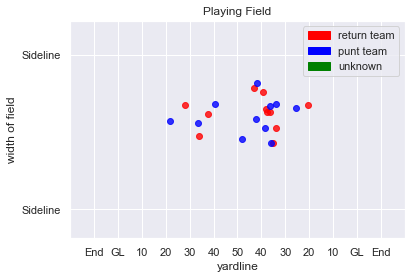

283
Play Description: (13:50) B.Wing punts 53 yards to NE 32, Center-Z.DeOssie. D.Foster to NE 43 for 11 yards (Z.DeOssie, J.Thomas).


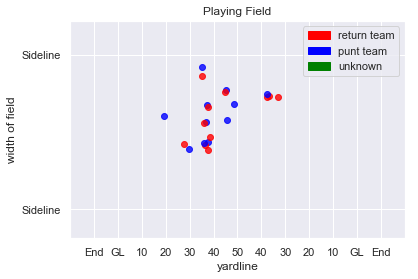

284
Play Description: (6:39) B.Wing punts 46 yards to NE 44, Center-Z.DeOssie. D.Foster pushed ob at NE 49 for 5 yards (J.Adams).


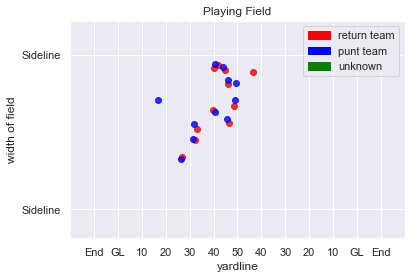

285
Play Description: (8:23) R.Allen punts 46 yards to NYG 40, Center-J.Cardona. B.Rainey pushed ob at NE 47 for 13 yards (C.Harbor).


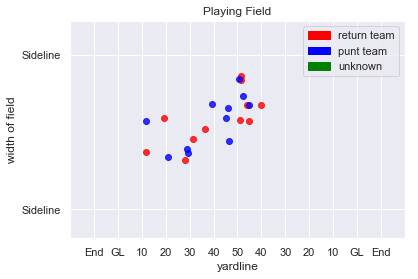

286
Play Description: (12:10) B.Wing punts 51 yards to NE 6, Center-Z.DeOssie. C.Jones to NE 40 for 34 yards (O.Darkwa).


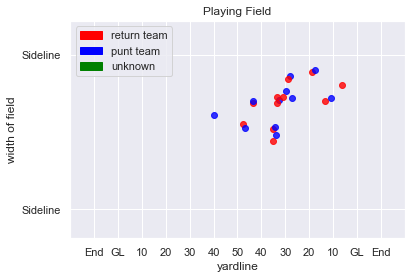

287
Play Description: (10:04) R.Allen punts 35 yards to NYG 18, Center-J.Cardona. B.Rainey to NYG 21 for 3 yards (K.Grugier-Hill).


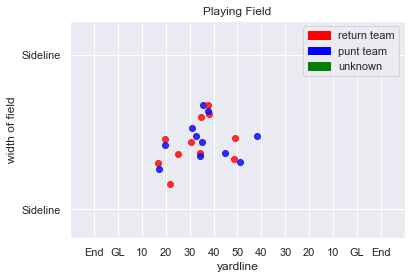

288
Play Description: (13:33) L.Edwards punts 44 yards to PHI 26, Center-T.Purdum. P.Turner to PHI 38 for 12 yards (L.Mauldin).


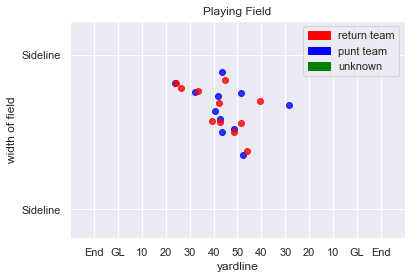

289
Play Description: (1:55) (Punt formation) L.Edwards punts 55 yards to PHI 9, Center-T.Purdum. P.Turner to PHI 15 for 6 yards (R.Miles).


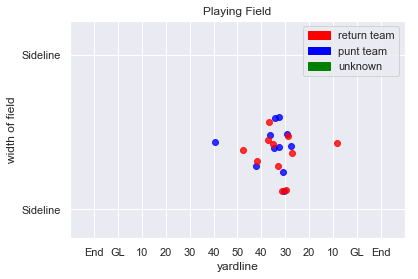

290
Play Description: (1:02) D.Jones punts 41 yards to NYJ 42, Center-J.Dorenbos. J.Marshall to NYJ 46 for 4 yards (B.Braman).


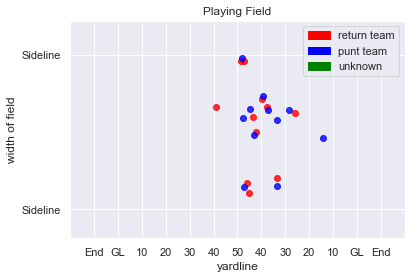

291
Play Description: (2:53) (Punt formation) L.Edwards punts 60 yards to PHI 20, Center-T.Purdum. P.Turner to PHI 31 for 11 yards (J.Howsare).


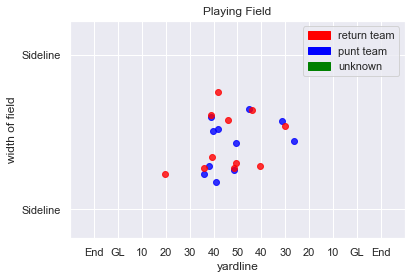

292
Play Description: (1:16) (Punt formation) D.Jones punts 42 yards to NYJ 41, Center-J.Dorenbos. C.Worthy to NYJ 39 for -2 yards (Q.Gause).


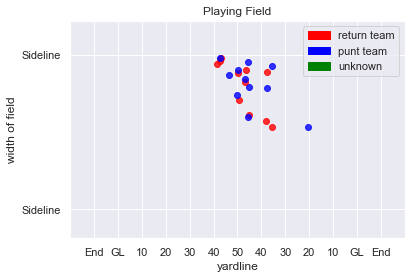

293
Play Description: (9:57) J.Berry punts 45 yards to CAR 31, Center-G.Warren. D.Byrd to CAR 46 for 15 yards (S.Davis).


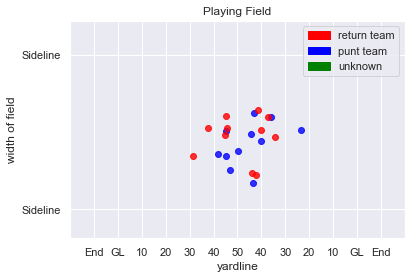

294
Play Description: (1:50) J.Berry punts 54 yards to CAR 6, Center-G.Warren. D.Byrd to CAR 18 for 12 yards (T.Matakevich).


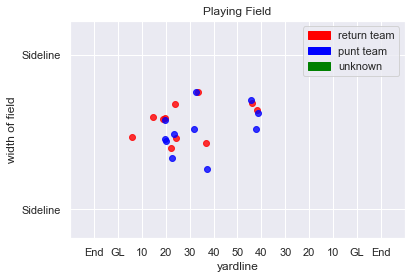

295
Play Description: (13:03) J.Berry punts 46 yards to CAR 29, Center-G.Warren. D.Byrd to CAR 37 for 8 yards (F.Toussaint).


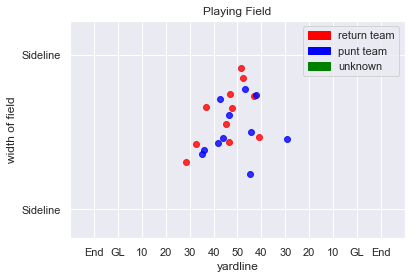

296
Play Description: (6:02) J.Berry punts 51 yards to CAR 39, Center-G.Warren. D.Byrd to PIT 37 for 24 yards (T.Matakevich; F.Toussaint).


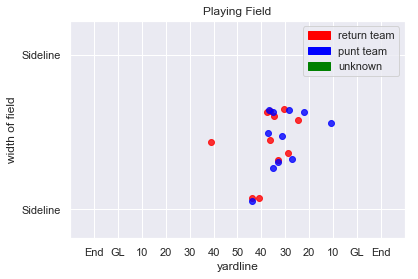

297
Play Description: (5:38) B.Pinion punts 38 yards to SD 34, Center-K.Nelson. I.Burse to SD 33 for -1 yards (K.Nelson).


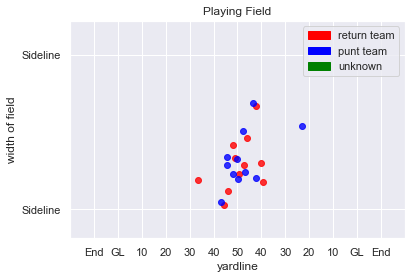

298
Play Description: (9:07) D.Kaser punts 49 yards to SF 40, Center-M.Windt. D.White pushed ob at SF 46 for 6 yards (C.Swain).


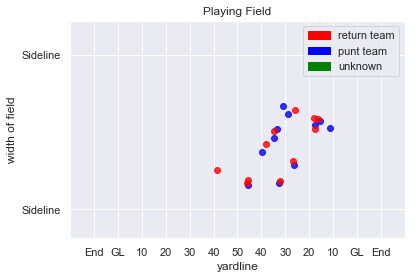

299
Play Description: (7:07) J.Ryan punts 45 yards to OAK 34, Center-N.Frese. D.Washington to OAK 37 for 3 yards (C.Prosise). PENALTY on OAK-K.Durden, Offensive Holding, 10 yards, enforced at OAK 34.


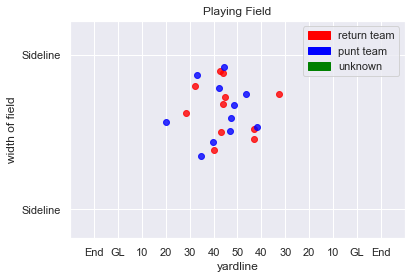

300
Play Description: (8:26) J.Ryan punts 48 yards to OAK 45, Center-N.Frese. D.Washington to SEA 42 for 13 yards (K.Palacio; E.Pinkins). PENALTY on OAK-D.Bates, Offensive Holding, 10 yards, enforced at SEA 42.


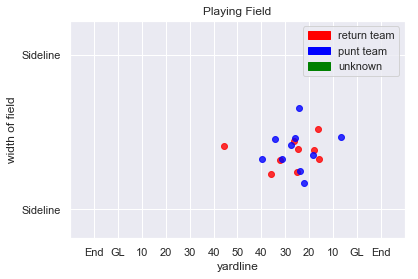

301
Play Description: (13:07) J.Ryan punts 44 yards to OAK 33, Center-N.Frese. J.Richard to SEA 42 for 25 yards (K.Lambert).


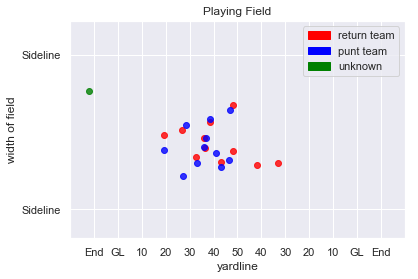

302
Play Description: (2:24) J.Ryan punts 45 yards to OAK 48, Center-N.Frese. D.Washington to SEA 41 for 11 yards (K.Lambert, A.Goodley).


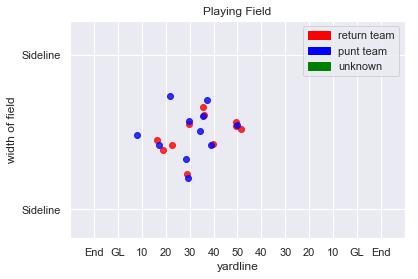

303
Play Description: (13:27) J.Ryan punts 58 yards to OAK 16, Center-N.Frese. J.Mickens to OAK 28 for 12 yards (B.Bryant; S.Longa).


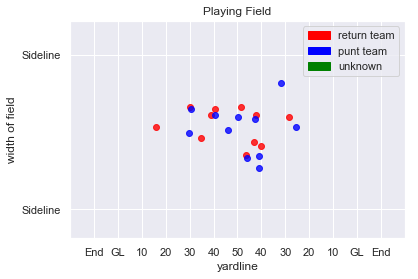

304
Play Description: (8:53) M.King punts 43 yards to SEA 34, Center-J.Condo. T.Simon to SEA 37 for 3 yards (De.McDonald).


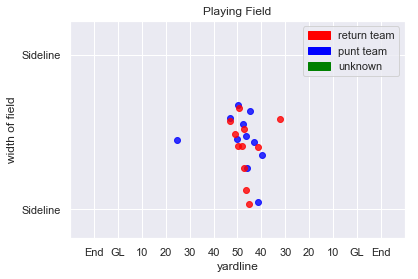

305
Play Description: (11:49) (Punt formation) M.Darr punts 51 yards to TEN 4, Center-J.Denney. K.Byard to TEN 18 for 14 yards (S.Gary).


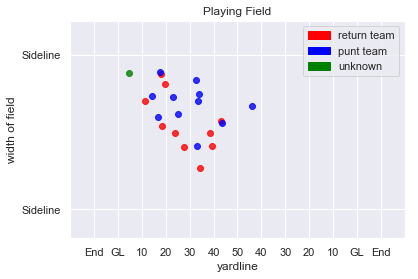

306
Play Description: (6:31) (Punt formation) M.Darr punts 52 yards to TEN 27, Center-J.Denney. K.Byard to TEN 33 for 6 yards (T.Gray).


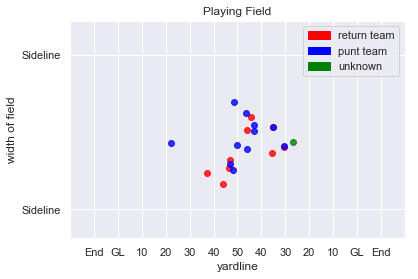

307
Play Description: (8:05) (Punt formation) B.Anger punts 50 yards to WAS 20, Center-A.DePaola. R.Ross to WAS 19 for -1 yards (I.Johnson).


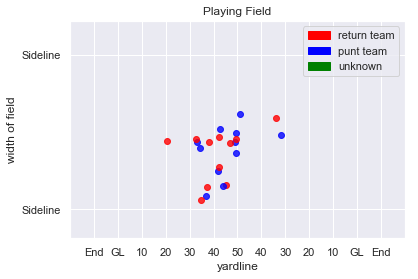

308
Play Description: (14:54) (Punt formation) B.Anger punts 51 yards to WAS 36, Center-A.DePaola. R.Ross to WAS 43 for 7 yards (H.Jones).


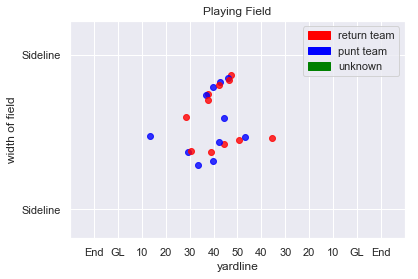

309
Play Description: (12:43) (Punt formation) B.Anger punts 52 yards to WAS 29, Center-A.DePaola. R.Ross to WAS 29 for no gain (J.Robinson). Penalty on WAS-M.Wakefield, Defensive Offside, declined.


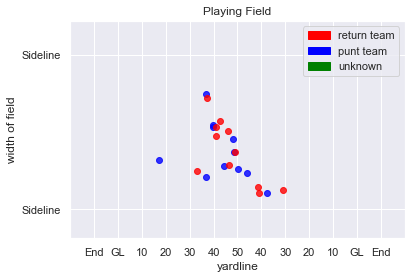

310
Play Description: (6:28) (Punt formation) B.Anger punts 53 yards to WAS 13, Center-A.DePaola. R.Ross to WAS 20 for 7 yards (I.Johnson).


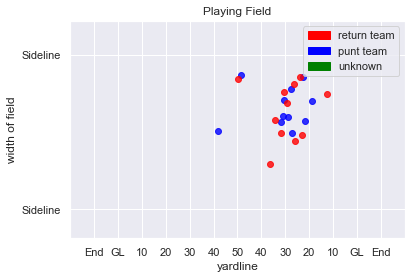

311
Play Description: (2:28) (Punt formation) B.Anger punts 48 yards to WAS 46, Center-A.DePaola. R.Ross to TB 46 for 8 yards (D.Vitale; H.Jones). PENALTY on TB, Player Out of Bounds on Punt, 5 yards, enforced at TB 46.


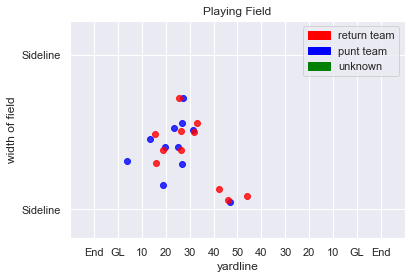

312
Play Description: (3:24) (Punt formation) T.Way punts 53 yards to TB 22, Center-N.Sundberg. J.Krause to TB 24 for 2 yards (D.Everett, J.Kerridge).


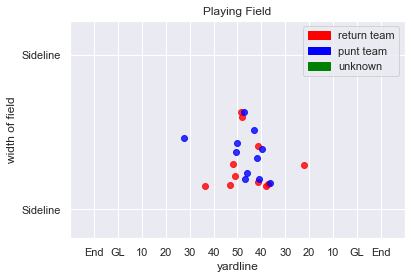

313
Play Description: (7:24) S.Koch punts 49 yards to NO 40, Center-M.Cox. M.Murphy to BLT 27 for 33 yards (P.Onwuasor). PENALTY on NO-C.McCain, Illegal Block Above the Waist, 10 yards, enforced at NO 47.


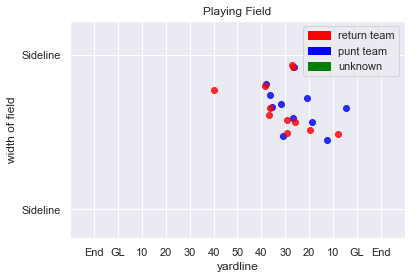

314
Play Description: (1:55) (Punt formation) T.Morstead punts 59 yards to BLT 26, Center-J.Drescher. M.Campanaro to BLT 35 for 9 yards (E.Harris).


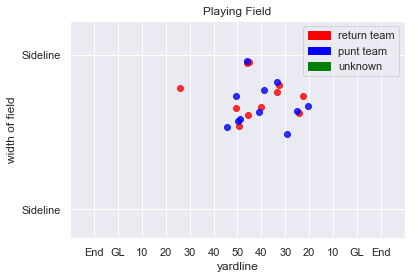

315
Play Description: (:38) C.Schmidt punts 46 yards to DET 8, Center-G.Sanborn. J.Billingsley to DET 13 for 5 yards (M.Lawson). PENALTY on DET-D.Walls, Illegal Block Above the Waist, 3 yards, enforced at DET 7.


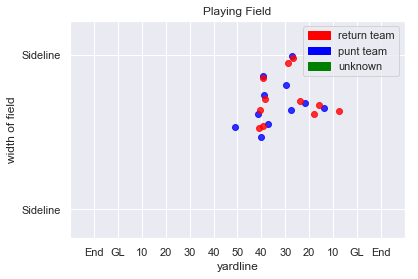

316
Play Description: (1:59) C.Schmidt punts 41 yards to DET 34, Center-G.Sanborn. J.Billingsley to DET 43 for 9 yards (G.Sanborn).


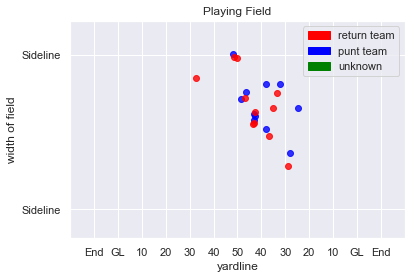

317
Play Description: (12:06) C.Schmidt punts 50 yards to DET 25, Center-G.Sanborn. J.Billingsley to DET 28 for 3 yards (G.Sanborn).


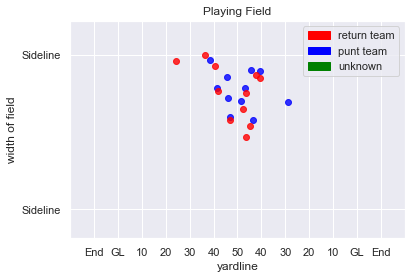

318
Play Description: (10:28) S.Martin punts 45 yards to BUF 23, Center-D.Muhlbach. W.Powell to BUF 25 for 2 yards (A.Barnes). PENALTY on DET-O.Charles, Ineligible Downfield Kick, 5 yards, enforced at BUF 25.


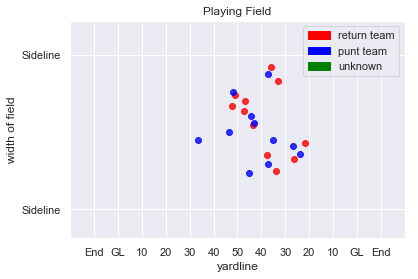

319
Play Description: (3:47) S.Martin punts 46 yards to BUF 39, Center-D.Muhlbach. W.Powell to DET 47 for 14 yards (Q.Davis). PENALTY on BUF-K.Colter, Illegal Block Above the Waist, 10 yards, enforced at BUF 46.


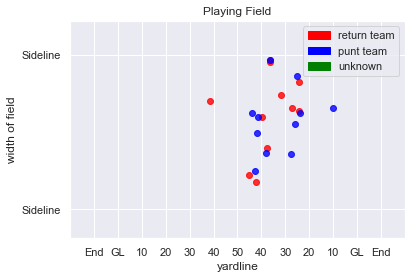

320
Play Description: (12:07) P.O'Donnell punts 53 yards to CLV 17, Center-P.Scales. C.Coleman to CLV 20 for 3 yards (J.Bellamy; S.McManis). CHI-S.McManis was injured during the play. His return is Probable. CHI-J.Bellamy was injured during the play. His return is Probable.  PENALTY on CLV-D.Jennings, Illegal Block Above the Waist, 10 yards, enforced at CLV 20.


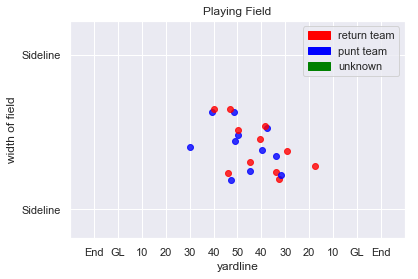

321
Play Description: (8:20) (Punt formation) P.O'Donnell punts 53 yards to CLV 31, Center-A.Brewer. T.Gabriel to CLV 35 for 4 yards (D.Houston-Carson).


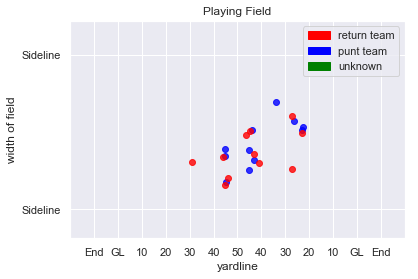

322
Play Description: (9:06) (Punt formation) P.O'Donnell punts 53 yards to CLV 13, Center-P.Scales. T.Gabriel ran ob at 50 for 37 yards.


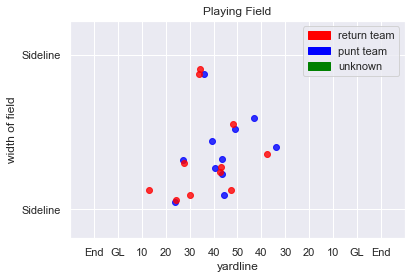

323
Play Description: (13:39) D.Butler punts 49 yards to DEN 21, Center-K.Canaday. K.Raymond to DEN 25 for 4 yards (B.Williams).


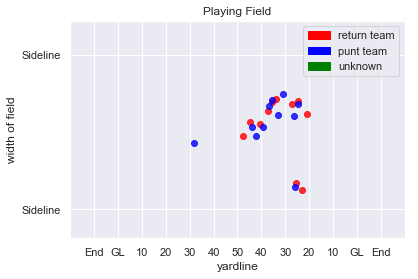

324
Play Description: (8:04) R.Dixon punts 36 yards to ARZ 24, Center-C.Kreiter. J.Shipley to ARZ 30 for 6 yards (Z.Anderson). PENALTY on ARZ-T.Hartfield, Illegal Block Above the Waist, 10 yards, enforced at ARZ 24.


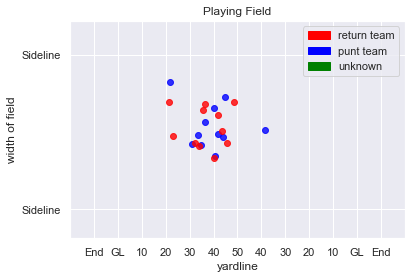

325
Play Description: (1:14) D.Butler punts 38 yards to DEN 45, Center-K.Canaday. K.Raymond to DEN 45 for no gain (R.Zamort). PENALTY on ARZ-R.Zamort, Interference with Opportunity to Catch, 15 yards, enforced at DEN 45.


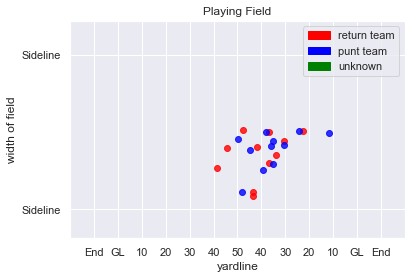

326
Play Description: (11:15) D.Colquitt punts 57 yards to GB 34, Center-J.Winchester. J.Abbrederis to GB 43 for 9 yards (T.Smith).


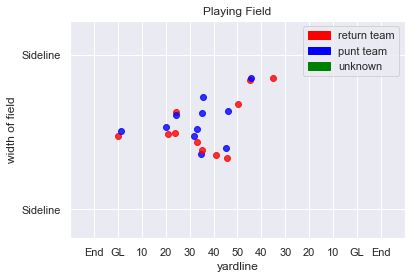

327
Play Description: (7:41) D.Colquitt punts 56 yards to GB 26, Center-J.Winchester. J.Abbrederis to GB 32 for 6 yards (D.Robinson).


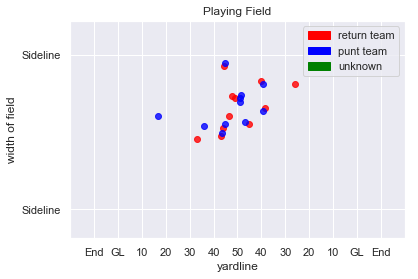

328
Play Description: (10:19) J.Schum punts 51 yards to KC 34, Center-R.Lovato. D.Thomas to KC 42 for 8 yards (C.Bradford).


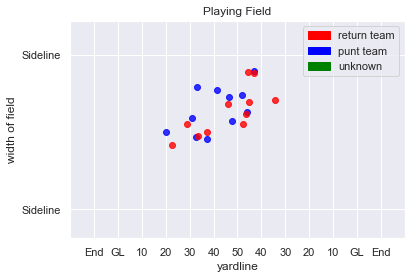

329
Play Description: (2:30) D.Colquitt punts 60 yards to GB 37, Center-J.Winchester. J.Abbrederis ran ob at KC 49 for 14 yards.


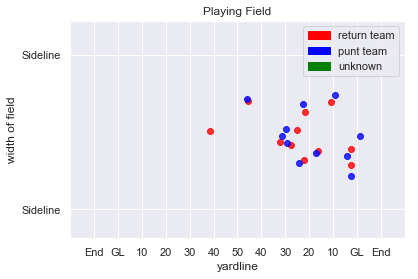

330
Play Description: (10:59) J.Schum punts 37 yards to KC 20, Center-R.Lovato. F.Hammond to KC 20 for no gain (D.Goodson).


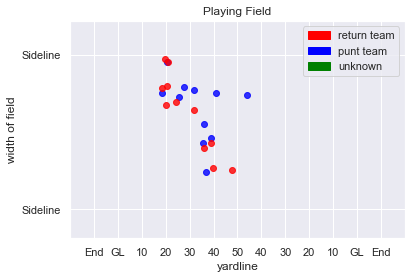

331
Play Description: (1:24) D.Colquitt punts 48 yards to GB 12, Center-J.Winchester. J.Abbrederis pushed ob at KC 46 for 42 yards (D.Colquitt). PENALTY on KC-D.White, Illegal Motion, 5 yards, enforced at KC 46.


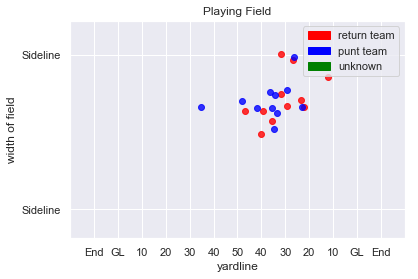

332
Play Description: (10:02) J.Schum punts 46 yards to KC 38, Center-R.Lovato. F.Hammond to 50 for 12 yards (J.Schum). GB-M.Evans was injured during the play.  PENALTY on KC-S.Randolph, Offensive Holding, 10 yards, enforced at KC 37. Penalty on KC-T.Smith, Illegal Blindside Block, declined.


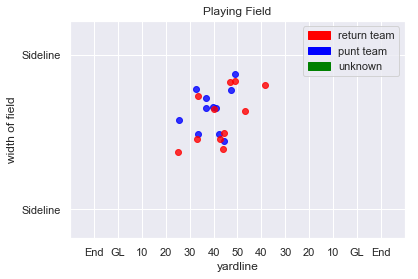

333
Play Description: (5:16) J.Schum punts 52 yards to KC 32, Center-R.Lovato. D.Robinson to KC 38 for 6 yards (L.Gunter).


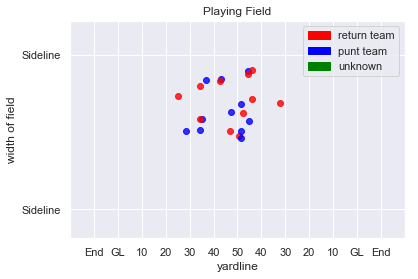

334
Play Description: (13:12) (Punt formation) M.Wile punts 58 yards to HST 20, Center-L.Ladouceur. W.Williams pushed ob at HST 37 for 17 yards (A.Traylor; R .Smith).


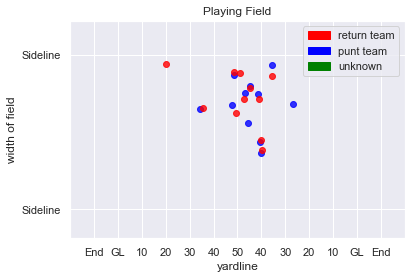

335
Play Description: (1:46) (Punt formation) S.Lechler punts 48 yards to DAL 38, Center-J.Weeks. D.Swanson to DAL 43 for 5 yards (C.James).


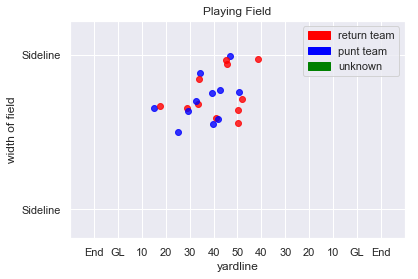

336
Play Description: (2:58) (Punt formation) M.Wile punts 48 yards to HST 22, Center-L.Ladouceur. W.Williams to HST 22 for no gain (A.Brown).


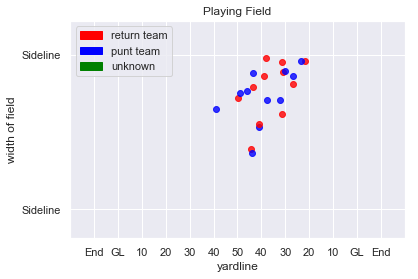

337
Play Description: (3:23) P.McAfee punts 59 yards to CIN 14, Center-M.Overton. A.Erickson to CIN 28 for 14 yards (T.Glover-Wright).


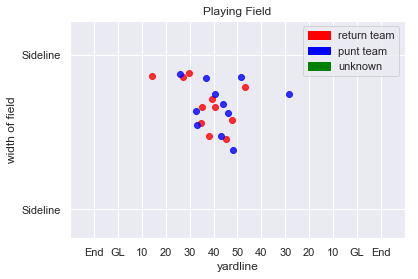

338
Play Description: (8:51) P.McAfee punts 48 yards to CIN 12, Center-M.Overton. A.Erickson to CIN 16 for 4 yards (J.Todman; A.Morrison).


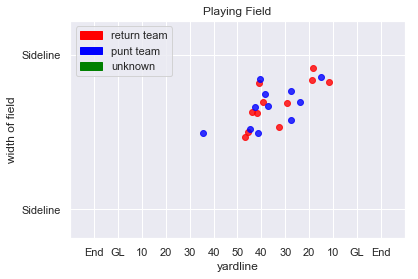

339
Play Description: (1:55) R.Dixon punts 44 yards to CAR 28, Center-C.Kreiter. T.Ginn to CAR 32 for 4 yards (C.Latimer). PENALTY on CAR-D.Worley, Offensive Holding, 10 yards, enforced at CAR 32.


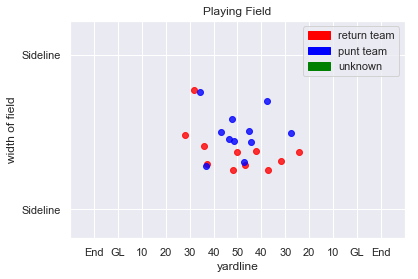

340
Play Description: (7:46) A.Lee punts 76 yards to DEN 13, Center-J.Jansen. J.Norwood to DEN 24 for 11 yards. PENALTY on DEN-C.Nelson, Illegal Block Above the Waist, 10 yards, enforced at DEN 24.


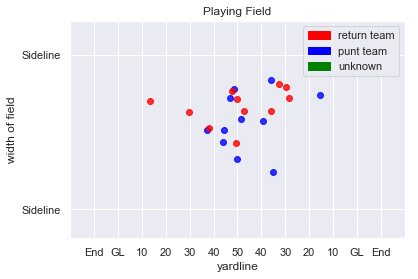

341
Play Description: (5:51) R.Dixon punts 54 yards to CAR 31, Center-C.Kreiter. T.Ginn to CAR 39 for 8 yards (K.Webster).


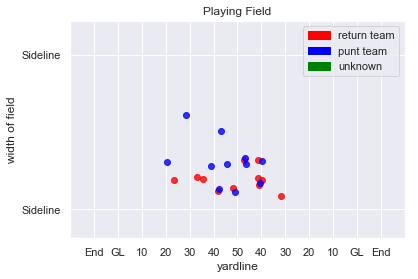

342
Play Description: (4:10) A.Lee punts 61 yards to DEN 7, Center-J.Jansen. J.Norwood pushed ob at DEN 22 for 15 yards (D.Mayo).


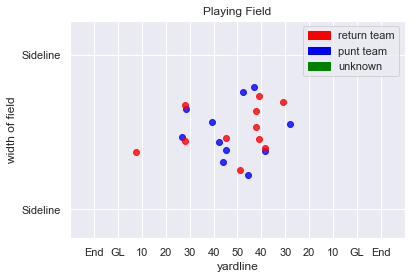

343
Play Description: (5:46) B.Anger punts 45 yards to ATL 23, Center-A.DePaola. E.Weems to ATL 36 for 13 yards (A.Glanton).


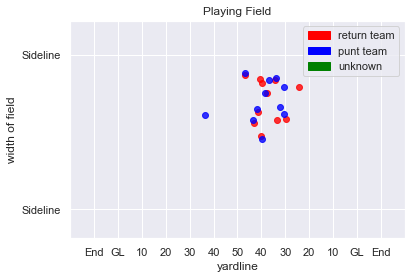

344
Play Description: (10:02) B.Anger punts 57 yards to ATL 31, Center-A.DePaola. E.Weems to ATL 40 for 9 yards (A.Glanton).


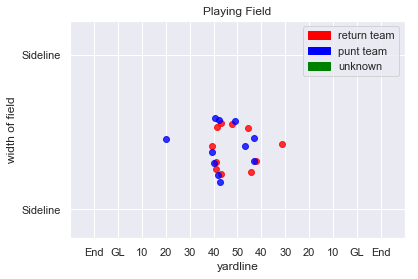

345
Play Description: (9:42) (Punt formation) C.Schmidt punts 50 yards to BLT 26, Center-G.Sanborn. D.Hester to BLT 34 for 8 yards (C.Graham).


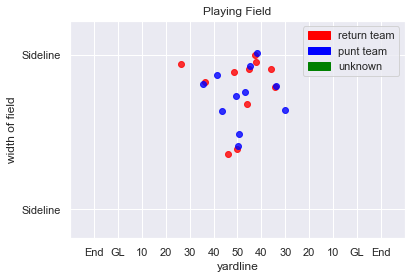

346
Play Description: (7:43) (Punt formation) S.Koch punts 46 yards to BUF 7, Center-M.Cox. B.Tate to BUF 28 for 21 yards (M.Cox).


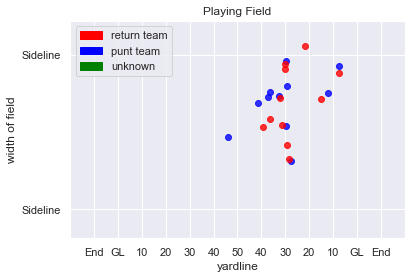

347
Play Description: (4:43) (Punt formation) C.Schmidt punts 43 yards to BLT 43, Center-G.Sanborn. D.Hester to BLT 36 for -7 yards (C.Graham).


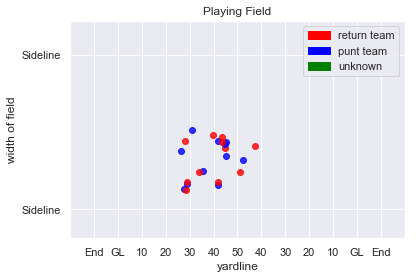

348
Play Description: (4:30) S.Lechler punts 49 yards to CHI 29, Center-J.Weeks. E.Royal pushed ob at HST 40 for 31 yards (S.Lechler).


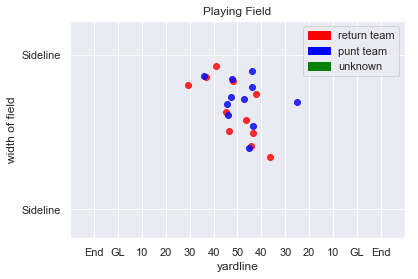

349
Play Description: (8:15) P.O'Donnell punts 47 yards to HST 30, Center-P.Scales. T.Ervin to HST 39 for 9 yards (L.Paulsen).


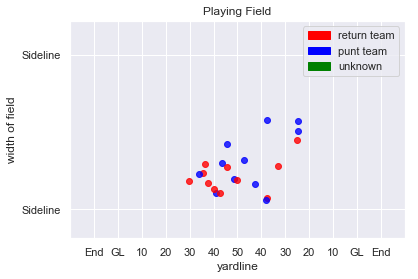

350
Play Description: (:50) S.Lechler punts 60 yards to CHI 25, Center-J.Weeks. E.Royal to CHI 25 for no gain (C.James, B.Peters).


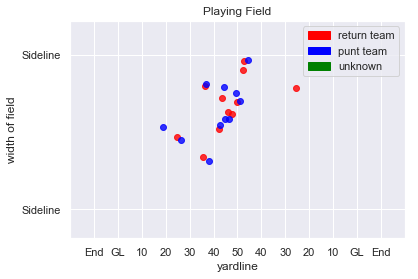

351
Play Description: (10:04) S.Lechler punts 41 yards to CHI 32, Center-J.Weeks. E.Royal to CHI 39 for 7 yards (C.James).


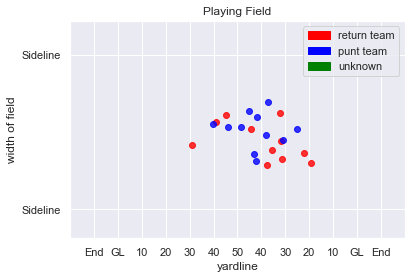

352
Play Description: (3:43) S.Lechler punts 58 yards to CHI 12, Center-J.Weeks. E.Royal to CHI 14 for 2 yards (E.Pleasant).


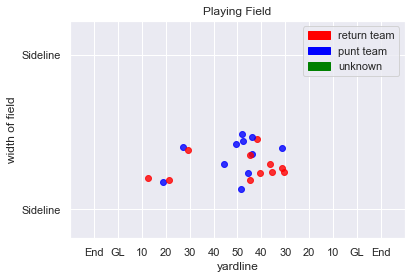

353
Play Description: (9:10) P.O'Donnell punts 43 yards to HST 21, Center-P.Scales. T.Ervin to HST 34 for 13 yards (C.Jones; J.Anderson).


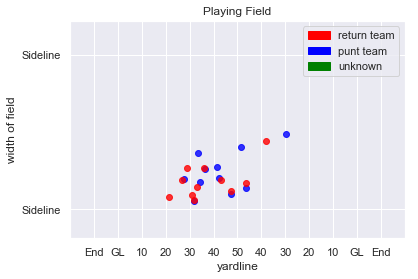

354
Play Description: (4:56) P.O'Donnell punts 44 yards to HST 32, Center-P.Scales. T.Ervin pushed ob at HST 39 for 7 yards (C.Jones). PENALTY on HST-J.Prosch, Taunting, 15 yards, enforced at HST 39. Penalty on HST-E.Pleasant, Offensive Holding, declined.


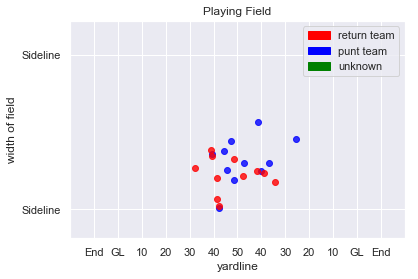

355
Play Description: (5:16) J.Schum punts 56 yards to JAX 38, Center-B.Goode. R.Greene to GB 48 for 14 yards (B.Martinez).


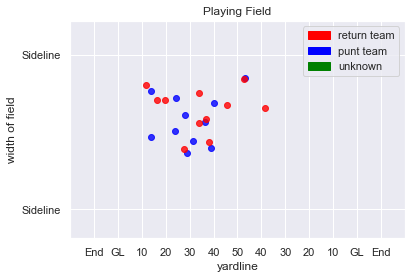

356
Play Description: (11:35) D.Colquitt punts 38 yards to KC 45, Center-J.Winchester. T.Benjamin pushed ob at KC 38 for 7 yards (T.Hill).


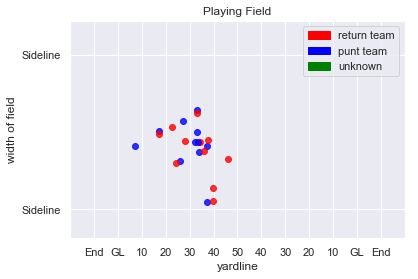

357
Play Description: (12:35) D.Kaser punts 35 yards to KC 13, Center-M.Windt. T.Hill to KC 32 for 19 yards (J.Attaochu; J.Brown). PENALTY on KC-J.O'Shaughnessy, Illegal Block Above the Waist, 10 yards, enforced at KC 21.


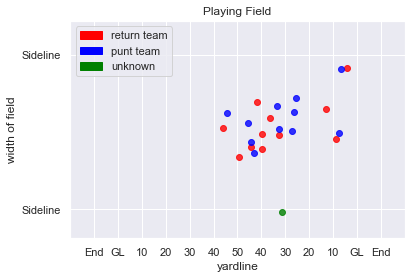

358
Play Description: (10:11) D.Colquitt punts 39 yards to KC 46, Center-J.Winchester. T.Benjamin ran ob at KC 45 for 1 yard (E.Murray).


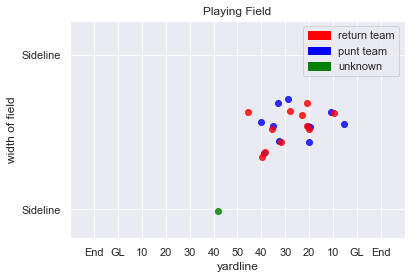

359
Play Description: (7:00) D.Kaser punts 47 yards to KC 9, Center-M.Windt. T.Hill pushed ob at KC 23 for 14 yards (T.Williams).


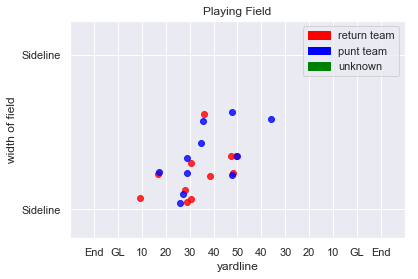

360
Play Description: (:08) D.Kaser punts 48 yards to KC 17, Center-M.Windt. T.Hill pushed ob at KC 30 for 13 yards (D.Stuckey).


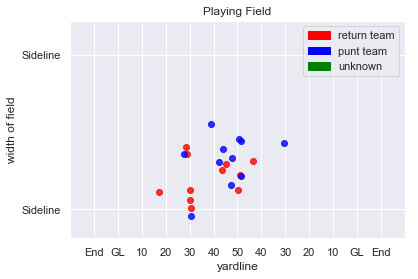

361
Play Description: (2:52) M.King punts 41 yards to NO 26, Center-J.Condo. M.Murphy to NO 32 for 6 yards (J.Olawale).


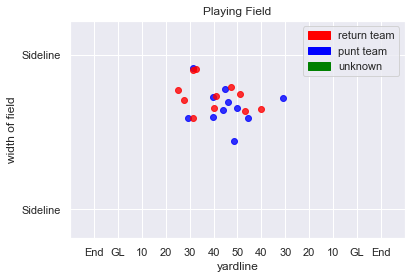

362
Play Description: (1:20) T.Morstead punts 44 yards to OAK 8, Center-J.Drescher. T.Carrie to OAK 18 for 10 yards (D.Lasco).


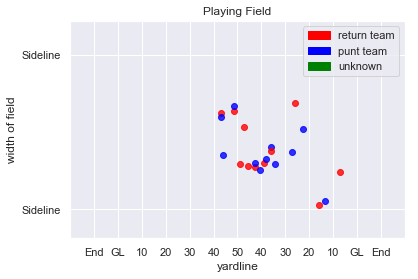

363
Play Description: (13:41) M.King punts 53 yards to NO 15, Center-J.Condo. M.Murphy to NO 26 for 11 yards (D.Bates). PENALTY on NO-K.Crawley, Illegal Block Above the Waist, 10 yards, enforced at NO 20. INJURY UPDATE - Oakland #71 M. Watson, QUESTIONABLE to return.


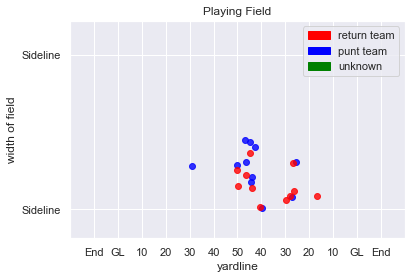

364
Play Description: (11:37) T.Morstead punts 51 yards to OAK 34, Center-J.Drescher. J.Richard pushed ob at NO 40 for 26 yards (D.Lasco). PENALTY on OAK-B.Trawick, Offensive Holding, 10 yards, enforced at OAK 40. INJURY UPDATE - NO #40 D.Breaux, leg, PROBABLE.


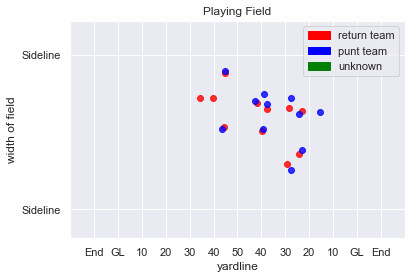

365
Play Description: (12:42) K.Huber punts 58 yards to NYJ 14, Center-C.Harris. J.Marshall to NYJ 22 for 8 yards (J.Wright).


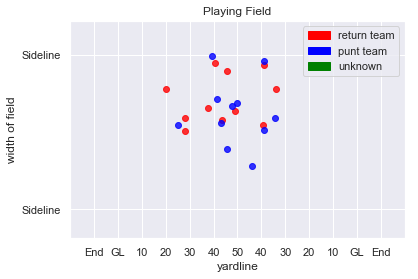

366
Play Description: (13:46) L.Edwards punts 54 yards to CIN 7, Center-T.Purdum. A.Erickson to CIN 22 for 15 yards (E.Henderson; K.Davis).


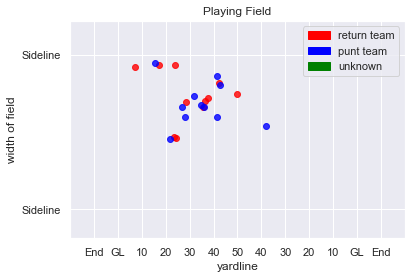

367
Play Description: (12:00) L.Edwards punts 47 yards to CIN 30, Center-T.Purdum. A.Jones to CIN 36 for 6 yards (J.Martin).


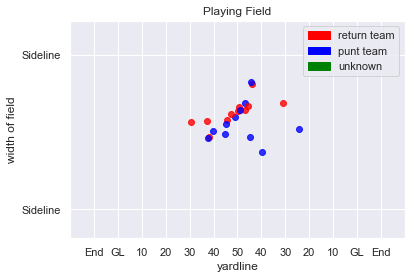

368
Play Description: (10:07) K.Huber punts 56 yards to NYJ 13, Center-C.Harris. J.Marshall to NYJ 16 for 3 yards (J.Wright; J.Shaw).


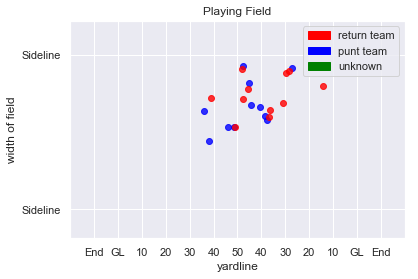

369
Play Description: (8:44) B.Colquitt punts 49 yards to PHI 21, Center-C.Hughlett. D.Sproles to PHI 26 for 5 yards (C.Hughlett).


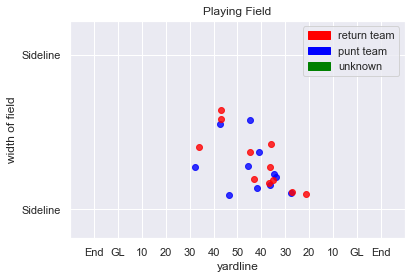

370
Play Description: (4:30) B.Colquitt punts 59 yards to PHI 18, Center-C.Hughlett. D.Sproles to CLV 42 for 40 yards (I.Campbell).


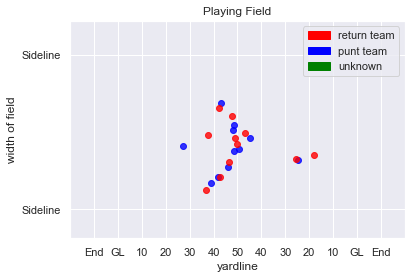

371
Play Description: (3:34) B.Colquitt punts 42 yards to PHI 15, Center-C.Hughlett. D.Sproles to PHI 21 for 6 yards (D.Alexander).


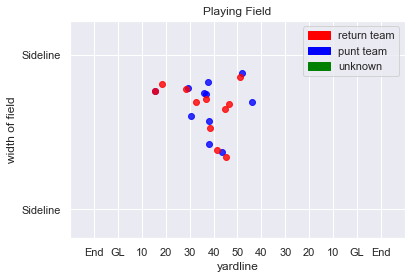

372
Play Description: (10:08) B.Colquitt punts 58 yards to PHI 21, Center-C.Hughlett. D.Sproles to PHI 29 for 8 yards (I.Crowell).


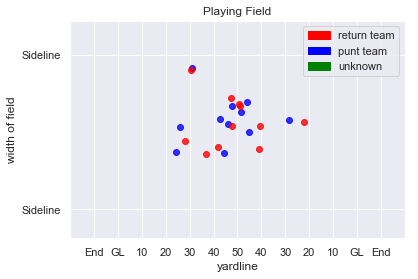

373
Play Description: (9:22) (Punt formation) J.Locke punts 51 yards to TEN 23, Center-K.McDermott. M.Mariani to TEN 37 for 14 yards (A.Thielen; E.Lamur).


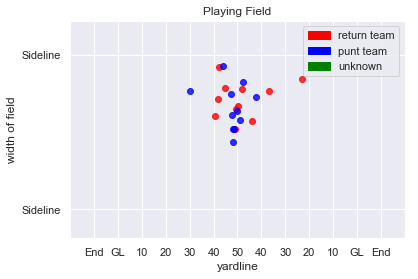

374
Play Description: (:35) (Punt formation) B.Kern punts 52 yards to MIN 24, Center-B.Brinkley. M.Sherels to MIN 22 for -2 yards. Lateral to C.Patterson to MIN 31 for 9 yards (W.Woodyard).


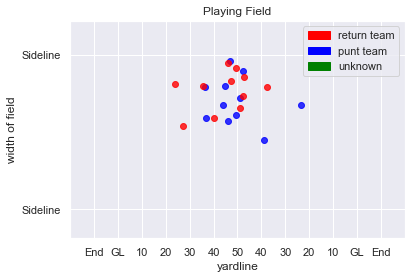

375
Play Description: (7:22) (Punt formation) B.Kern punts 64 yards to MIN 31, Center-B.Brinkley. M.Sherels to MIN 43 for 12 yards (A.Blake; N.Palmer).


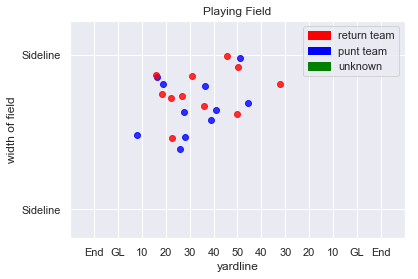

376
Play Description: (14:20) J.Ryan punts 42 yards to MIA 32, Center-N.Frese. J.Grant to MIA 39 for 7 yards (C.Marsh). PENALTY on MIA, Illegal Block Above the Waist, 10 yards, enforced at MIA 39.


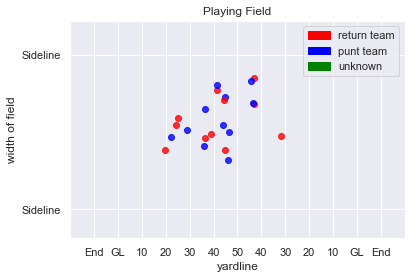

377
Play Description: (12:40) M.Darr punts 46 yards to SEA 23, Center-J.Denney. T.Lockett to SEA 43 for 20 yards (M.Thomas). PENALTY on SEA-B.Coyle, Illegal Block Above the Waist, 10 yards, enforced at SEA 28.


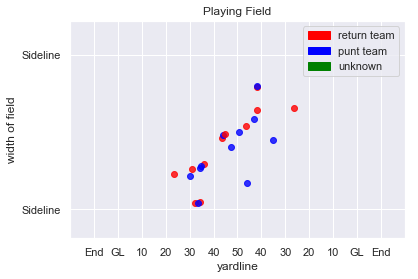

378
Play Description: (5:52) J.Ryan punts 48 yards to MIA 11, Center-N.Frese. J.Landry to MIA 27 for 16 yards (T.Powell; B.Williams).


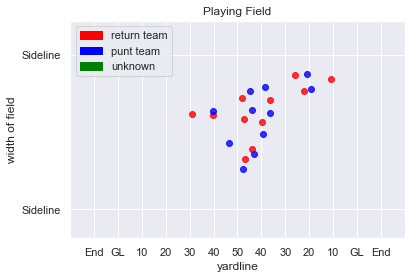

379
Play Description: (3:38) J.Ryan punts 49 yards to MIA 33, Center-N.Frese. J.Grant to MIA 38 for 5 yards (C.Marsh; M.Morgan).


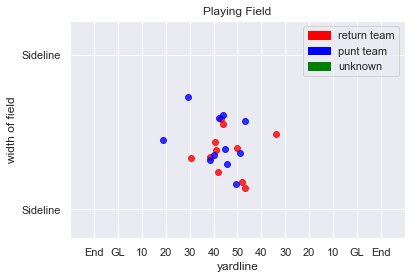

380
Play Description: (12:56) M.Darr punts 53 yards to SEA 6, Center-J.Denney. T.Lockett to SEA 19 for 13 yards (M.Gray; M.Hull).


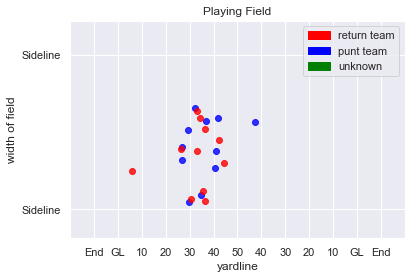

381
Play Description: (9:33) J.Ryan punts 50 yards to MIA 32, Center-N.Frese. J.Grant pushed ob at MIA 48 for 16 yards (C.Marsh). PENALTY on MIA-D.Williams, Illegal Block Above the Waist, 10 yards, enforced at MIA 36.


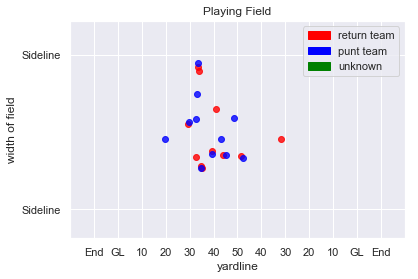

382
Play Description: (8:10) M.Darr punts 45 yards to SEA 27, Center-J.Denney. T.Lockett to SEA 49 for 22 yards (S.Paysinger).


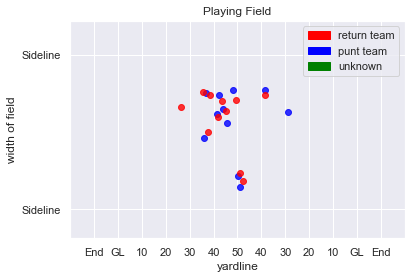

383
Play Description: (8:48) (Punt formation) B.Wing punts 55 yards to DAL 31, Center-Z.DeOssie. L.Whitehead to DAL 40 for 9 yards (Z.DeOssie).


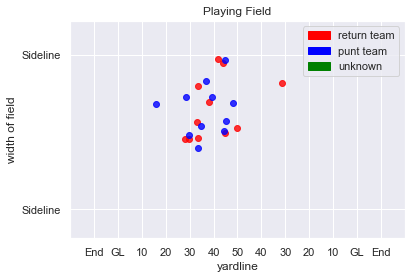

384
Play Description: (4:12) (Punt formation) B.Wing punts 50 yards to DAL 18, Center-Z.DeOssie. L.Whitehead to DAL 25 for 7 yards (N.Berhe).


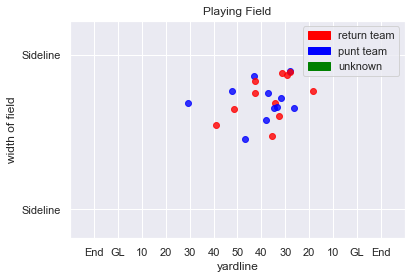

385
Play Description: (10:25) (Punt formation) C.Jones punts 56 yards to NYG 29, Center-L.Ladouceur. D.Harris pushed ob at NYG 46 for 17 yards (G.Escobar).


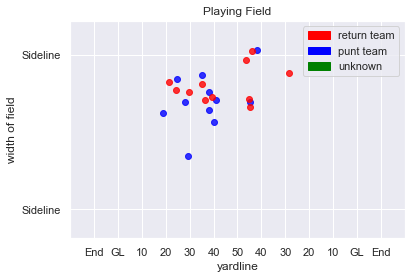

386
Play Description: (3:18) P.McAfee punts 52 yards to DET 21, Center-M.Overton. A.Roberts to DET 20 for -1 yards (D.Morris).


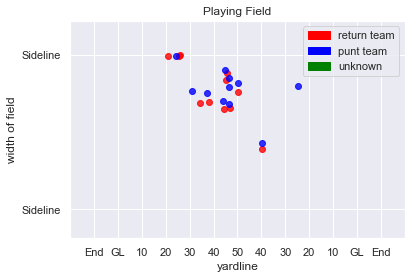

387
Play Description: (2:00) S.Martin punts 57 yards to IND 19, Center-D.Muhlbach. Q.Bray to IND 23 for 4 yards (D.Carey; J.Bademosi).


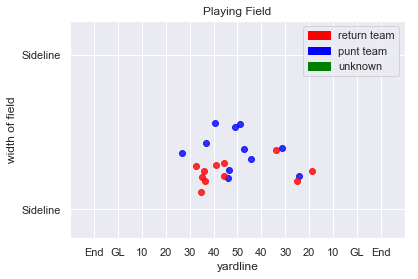

388
Play Description: (6:37) S.Martin punts 59 yards to IND 29, Center-D.Muhlbach. Q.Bray to IND 38 for 9 yards (A.Williams).


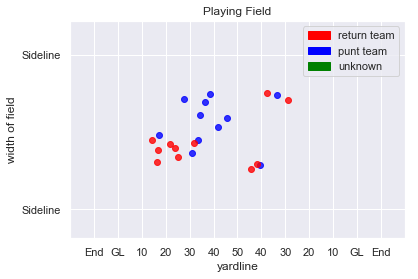

389
Play Description: (11:59) D.Butler punts 38 yards to NE 18, Center-K.Canaday. D.Amendola to NE 26 for 8 yards (D.Bucannon).


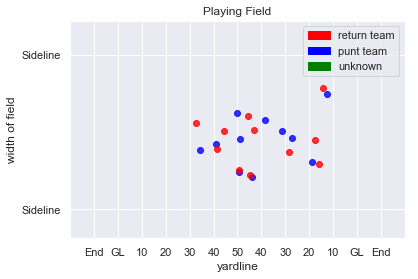

390
Play Description: (2:00) R.Allen punts 44 yards to ARZ 30, Center-J.Cardona. P.Peterson ran ob at ARZ 38 for 8 yards (B.Bolden).


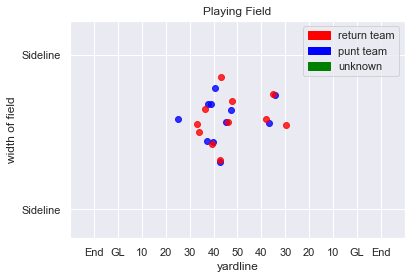

391
Play Description: (1:34) D.Butler punts 41 yards to NE 21, Center-K.Canaday. C.Jones to NE 31 for 10 yards (Ja.Brown).


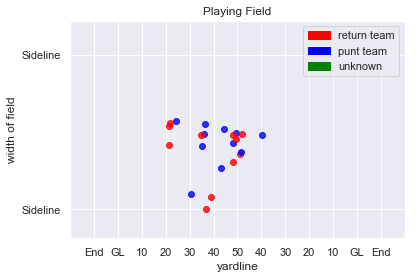

392
Play Description: (:31) J.Berry punts 61 yards to WAS 6, Center-G.Warren. J.Crowder to WAS 23 for 17 yards (V.Williams; J.Dangerfield).


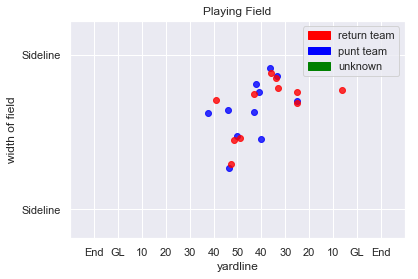

393
Play Description: (6:53) J.Hekker punts 54 yards to SF 41, Center-J.McQuaide. J.Kerley to SF 48 for 7 yards (C.Reynolds).


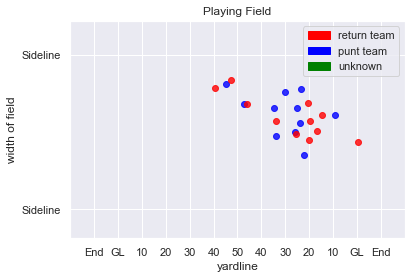

394
Play Description: (1:16) B.Pinion punts 40 yards to LA 37, Center-K.Nelson. T.Austin to LA 39 for 2 yards (A.Burbridge).


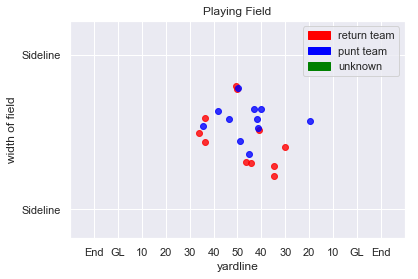

395
Play Description: (13:16) B.Pinion punts 52 yards to LA 33, Center-K.Nelson. T.Austin to LA 41 for 8 yards (J.Tartt).


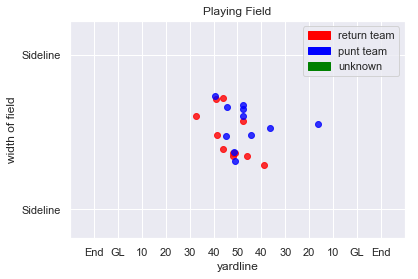

396
Play Description: (10:26) B.Pinion punts 52 yards to LA 27, Center-K.Nelson. T.Austin to LA 35 for 8 yards (J.Tartt). PENALTY on LA-J.Forrest, Offensive Holding, 10 yards, enforced at LA 27.


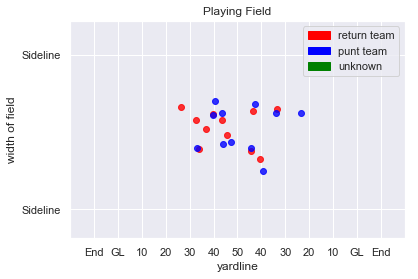

397
Play Description: (9:21) J.Hekker punts 47 yards to SF 31, Center-J.McQuaide. J.Kerley to SF 35 for 4 yards (C.Reynolds).


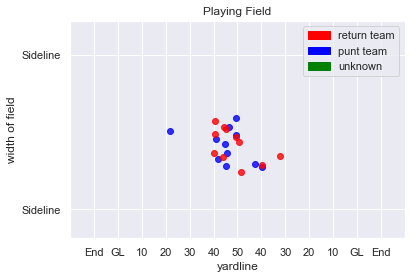

398
Play Description: (4:07) B.Pinion punts 48 yards to LA 34, Center-K.Nelson. T.Austin pushed ob at SF 38 for 28 yards (J.Tartt).


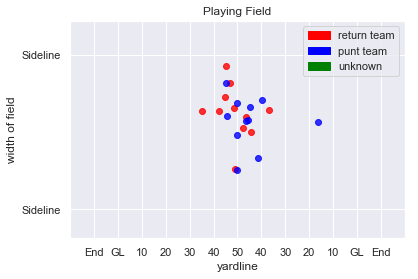

399
Play Description: (9:42) L.Edwards punts 47 yards to BUF 25, Center-T.Purdum. B.Tate pushed ob at BUF 33 for 8 yards (J.Howsare).


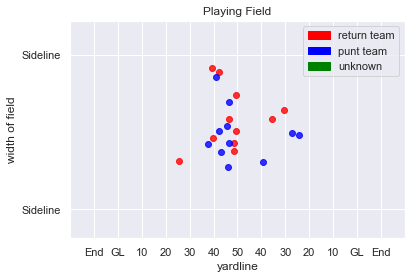

400
Play Description: (:53) B.Pinion punts 54 yards to CAR 40, Center-K.Nelson. T.Ginn pushed ob at CAR 46 for 6 yards (S.Draughn).


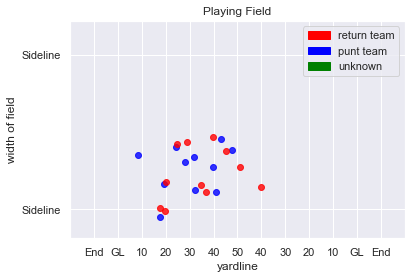

401
Play Description: (13:43) B.Pinion punts 54 yards to CAR 15, Center-K.Nelson. T.Ginn to CAR 31 for 16 yards (V.McDonald; J.Tartt).


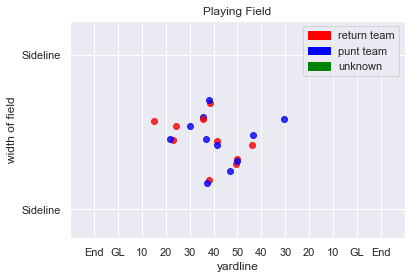

402
Play Description: (8:02) B.Pinion punts 54 yards to CAR 19, Center-K.Nelson. T.Ginn to CAR 25 for 6 yards (N.Bellore).


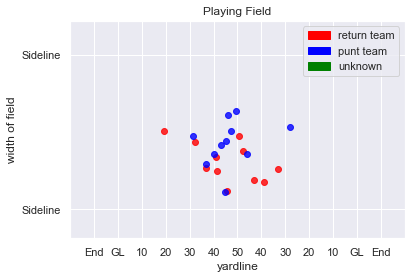

403
Play Description: (9:20) (Punt formation) B.Colquitt punts 52 yards to BLT 30, Center-C.Hughlett. D.Hester ran ob at BLT 45 for 15 yards.


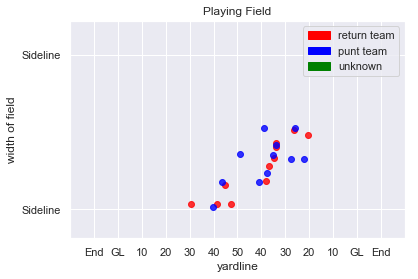

404
Play Description: (1:42) (Punt formation) S.Koch punts 60 yards to CLV 19, Center-M.Cox. J.Haden to CLV 32 for 13 yards (Z.Orr).


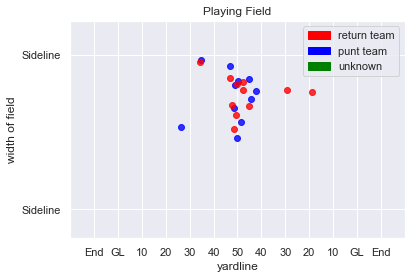

405
Play Description: (8:11) (Punt formation) B.Colquitt punts 41 yards to BLT 29, Center-C.Hughlett. D.Hester to BLT 36 for 7 yards (J.Poyer).


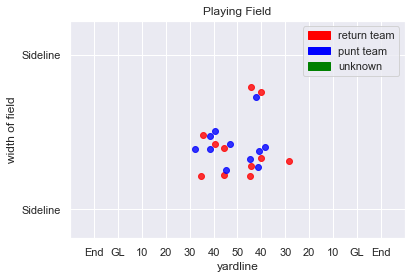

406
Play Description: (:26) B.Kern punts 51 yards to DET 24, Center-B.Brinkley. A.Roberts to DET 34 for 10 yards (K.Byard).


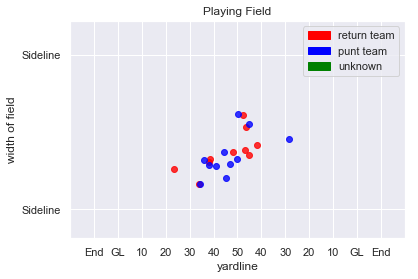

407
Play Description: (12:30) S.Martin punts 51 yards to TEN 10, Center-D.Muhlbach. M.Mariani to TEN 24 for 14 yards (T.Armbrister). PENALTY on TEN-B.McCain, Illegal Block Above the Waist, 6 yards, enforced at TEN 12.


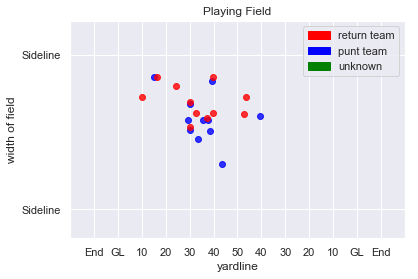

408
Play Description: (8:52) B.Kern punts 54 yards to DET 23, Center-B.Brinkley. A.Roberts pushed ob at DET 36 for 13 yards (B.Brinkley).


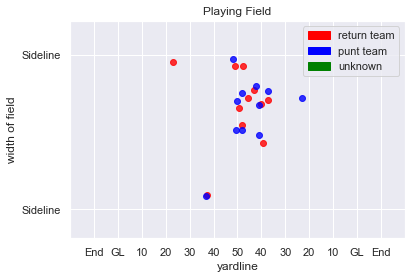

409
Play Description: (4:33) S.Lechler punts 62 yards to KC 20, Center-J.Weeks. T.Hill pushed ob at KC 36 for 16 yards (B.Peters).


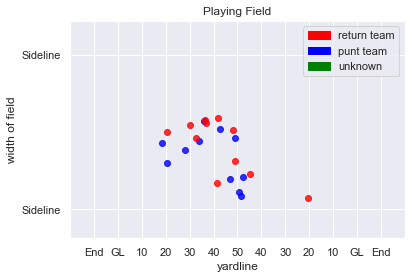

410
Play Description: (3:26) D.Colquitt punts 48 yards to HST 17, Center-J.Winchester. T.Ervin pushed ob at HST 23 for 6 yards (D.Sorensen).


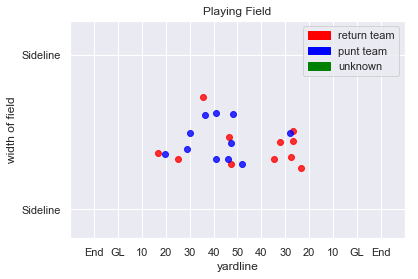

411
Play Description: (1:27) S.Lechler punts 48 yards to KC 34, Center-J.Weeks. T.Hill pushed ob at HST 34 for 32 yards (A.Blue).


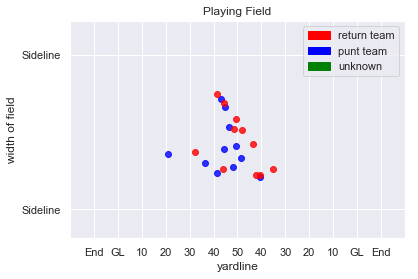

412
Play Description: (12:56) D.Colquitt punts 56 yards to HST 7, Center-J.Winchester. T.Ervin to HST 6 for -1 yards (T.Hill).


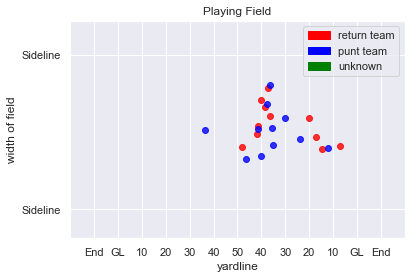

413
Play Description: (8:56) S.Lechler punts 44 yards to KC 24, Center-J.Weeks. T.Hill to KC 37 for 13 yards (T.Ervin; J.Grimes). PENALTY on KC-R.Travis, Illegal Block Above the Waist, 10 yards, enforced at KC 37.


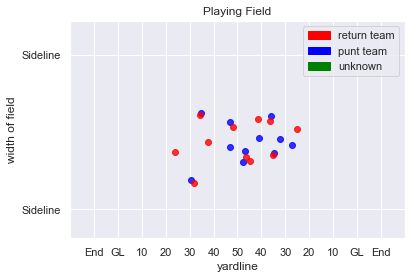

414
Play Description: (7:06) D.Colquitt punts 38 yards to HST 40, Center-J.Winchester. T.Ervin to HST 46 for 6 yards (T.Hill; J.O'Shaughnessy).


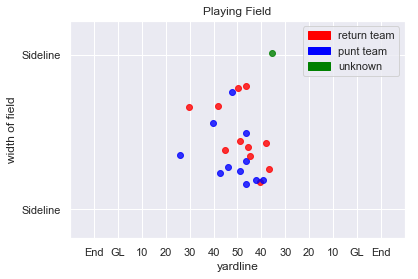

415
Play Description: (5:34) S.Lechler punts 46 yards to KC 12, Center-J.Weeks. T.Hill to KC 14 for 2 yards (M.Bullough).


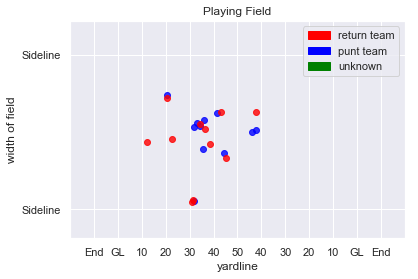

416
Play Description: (3:53) D.Colquitt punts 57 yards to HST 28, Center-J.Winchester. T.Ervin to HST 29 for 1 yard (D.Robinson).


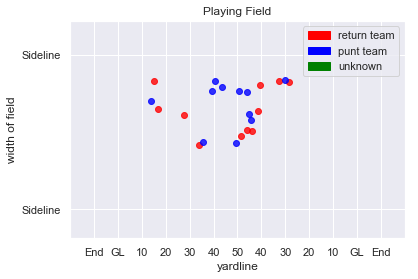

417
Play Description: (9:42) M.Darr punts 49 yards to NE 18, Center-J.Denney. D.Amendola to NE 25 for 7 yards (N.Hewitt).


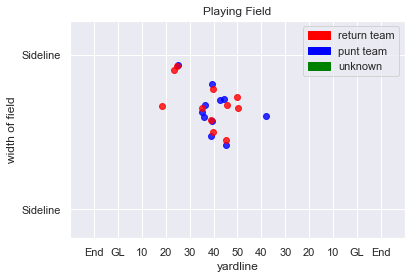

418
Play Description: (11:44) M.Darr punts 52 yards to NE 33, Center-J.Denney. D.Amendola to MIA 48 for 19 yards (S.Paysinger; M.Gray).


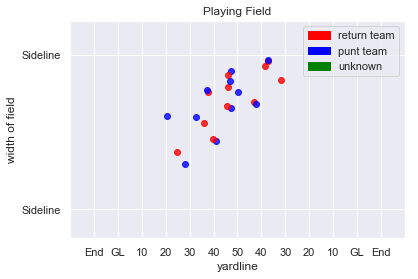

419
Play Description: (8:19) M.Darr punts 56 yards to NE 24, Center-J.Denney. D.Amendola to NE 31 for 7 yards (M.Hull).


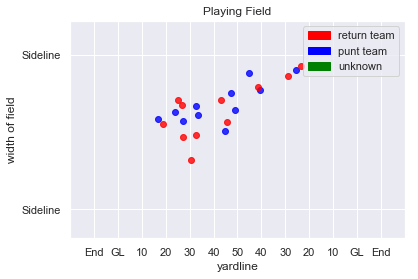

420
Play Description: (11:16) B.Wing punts 63 yards to NO 11, Center-Z.DeOssie. T.Lewis pushed ob at NO 32 for 21 yards (K.Sheppard).


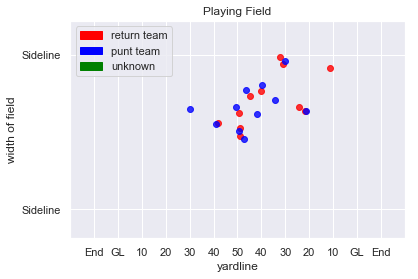

421
Play Description: (8:55) T.Morstead punts 46 yards to NYG 7, Center-J.Drescher. D.Harris to NYG 16 for 9 yards (M.Mauti).


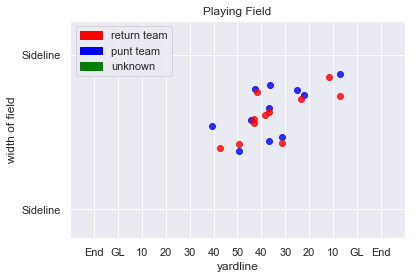

422
Play Description: (6:19) B.Wing punts 53 yards to NO 20, Center-Z.DeOssie. T.Lewis to NO 26 for 6 yards (M.Herzlich).


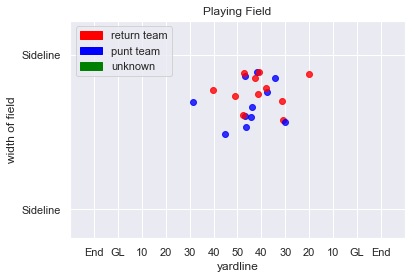

423
Play Description: (10:17) (Punt formation) K.Huber punts 51 yards to PIT 10, Center-C.Harris. E.Rogers to PIT 16 for 6 yards (M.Flowers, J.Wright).


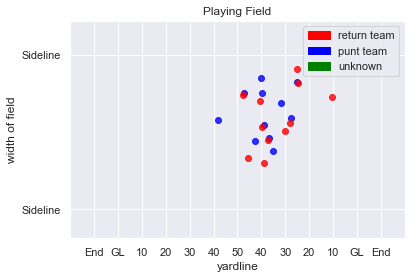

424
Play Description: (5:39) (Punt formation) K.Huber punts 54 yards to PIT 20, Center-C.Harris. A.Brown to PIT 34 for 14 yards (J.Shaw).


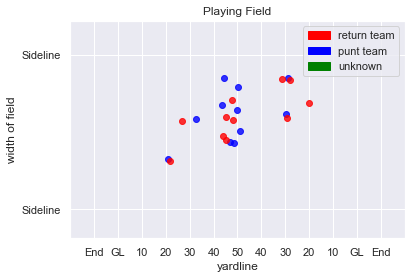

425
Play Description: (10:26) (Punt formation) K.Huber punts 55 yards to PIT 33, Center-C.Harris. A.Brown to PIT 37 for 4 yards (C.Harris; R.Burkhead).


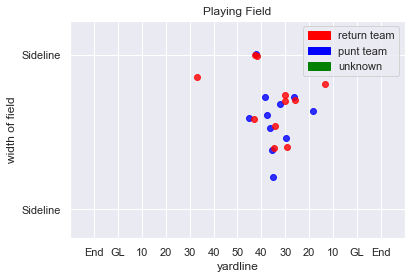

426
Play Description: (8:43) (Punt formation) J.Berry punts 58 yards to CIN 11, Center-G.Warren. A.Jones to CIN 18 for 7 yards (L.Fort). Penalty on CIN-C.Fejedelem, Illegal Block Above the Waist, declined. Penalty on CIN-J.Wright, Offensive Holding, declined. PENALTY on CIN-M.Flowers, Illegal Block Above the Waist, 9 yards, enforced at CIN 18.


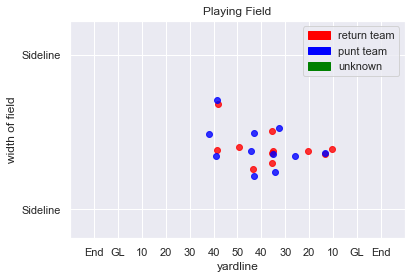

427
Play Description: (7:31) (Punt formation) K.Huber punts 48 yards to PIT 34, Center-C.Harris. E.Rogers to PIT 49 for 15 yards (T.Kroft).


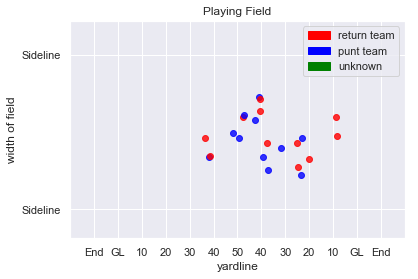

428
Play Description: (:18) (Punt formation) J.Berry punts 45 yards to CIN 9, Center-G.Warren. A.Erickson to CIN 9 for no gain (S.Thomas).


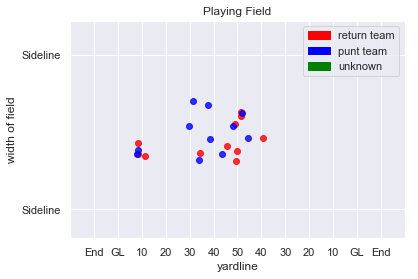

429
Play Description: (3:12) (Punt formation) J.Berry punts 58 yards to CIN 13, Center-G.Warren. A.Jones to CIN 25 for 12 yards (T.Matakevich; R.Golden).


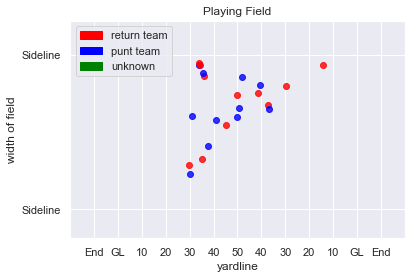

430
Play Description: (10:52) C.Jones punts 56 yards to WAS 4, Center-L.Ladouceur. J.Crowder to WAS 25 for 21 yards (K.Smith).


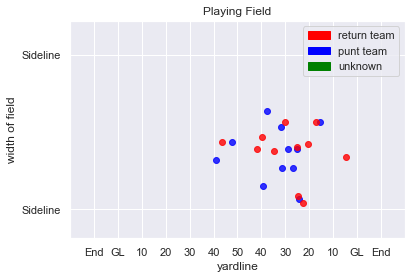

431
Play Description: (9:14) T.Way punts 43 yards to DAL 37, Center-N.Sundberg. L.Whitehead pushed ob at DAL 44 for 7 yards (D.Everett).


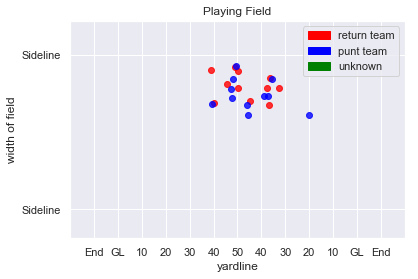

432
Play Description: (13:00) C.Jones punts 54 yards to WAS 12, Center-L.Ladouceur. J.Crowder to WAS 21 for 9 yards (J.Heath).


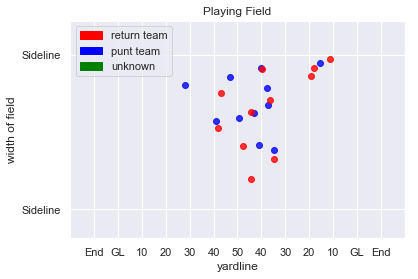

433
Play Description: (13:20) D.Butler punts 48 yards to TB 16, Center-K.Canaday. A.Humphries to TB 17 for 1 yard (J.Bethel).


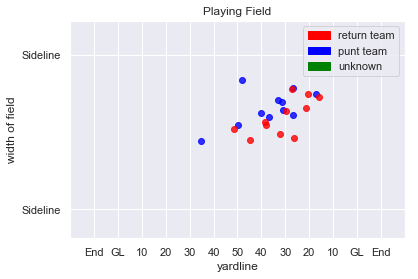

434
Play Description: (8:58) D.Butler punts 50 yards to TB 7, Center-K.Canaday. A.Humphries to TB 7 for no gain (J.Bethel).


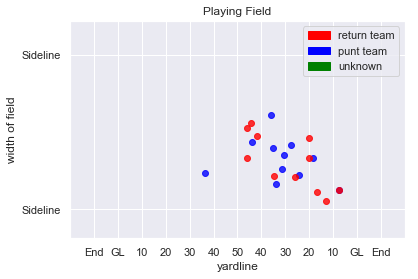

435
Play Description: (5:17) B.Anger punts 38 yards to ARZ 26, Center-A.DePaola. J.Brown pushed ob at ARZ 33 for 7 yards (B.Myers).


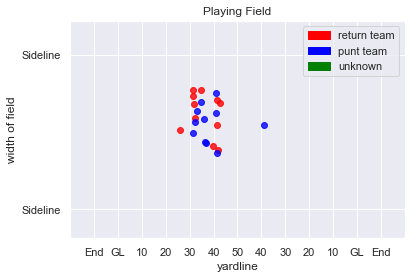

436
Play Description: (1:18) D.Butler punts 44 yards to TB 34, Center-K.Canaday. A.Humphries pushed ob at ARZ 41 for 25 yards (J.Bethel).


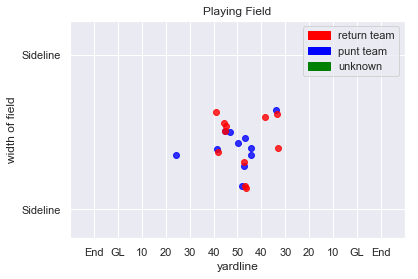

437
Play Description: (10:34) J.Ryan punts 44 yards to LA 23, Center-N.Frese. T.Austin to LA 38 for 15 yards (T.Powell).


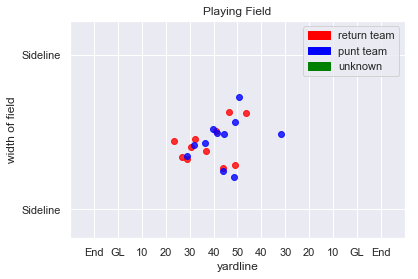

438
Play Description: (12:54) J.Ryan punts 39 yards to LA 32, Center-N.Frese. T.Austin to LA 32 for no gain (D.Shead).


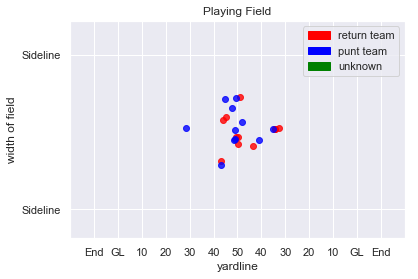

439
Play Description: (6:41) J.Ryan punts 40 yards to LA 21, Center-N.Frese. T.Austin to LA 21 for no gain (S.Terrell). PENALTY on LA-C.Harkey, Offensive Holding, 10 yards, enforced at LA 21.


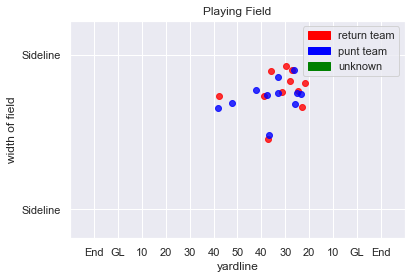

440
Play Description: (:02) P.McAfee punts 51 yards to DEN 19, Center-M.Overton. J.Norwood to DEN 31 for 12 yards (M.Farley).


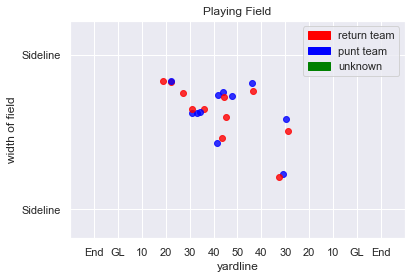

441
Play Description: (10:07) P.McAfee punts 53 yards to DEN 17, Center-M.Overton. J.Norwood to DEN 31 for 14 yards (E.Jackson).


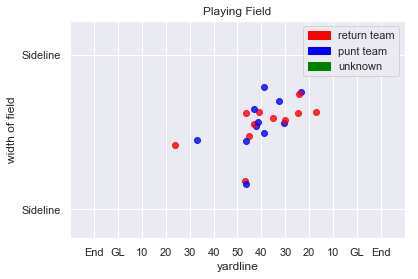

442
Play Description: (7:28) M.King punts 64 yards to ATL 7, Center-J.Condo. E.Weems to ATL 8 for 1 yard (B.Trawick; D.Bates). PENALTY on ATL-L.Reynolds, Offensive Holding, 3 yards, enforced at ATL 7.


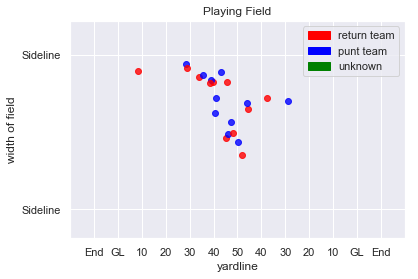

443
Play Description: (4:27) M.Bosher punts 43 yards to OAK 36, Center-J.Harris. J.Richard to OAK 36 for no gain (C.Goodwin).


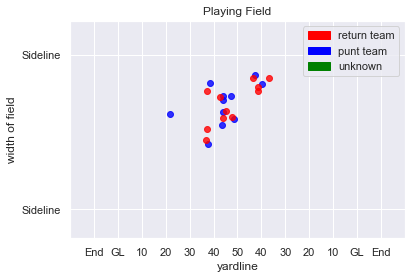

444
Play Description: (1:53) M.King punts 55 yards to ATL 9, Center-J.Condo. E.Weems to OAK 18 for 73 yards (M.King). PENALTY on OAK-M.King, Horse Collar Tackle, 9 yards, enforced at OAK 18.


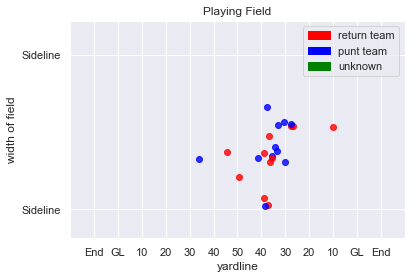

445
Play Description: (5:16) D.Kaser punts 48 yards to JAX 6, Center-M.Windt. R.Greene to JAX 14 for 8 yards (C.Mager).


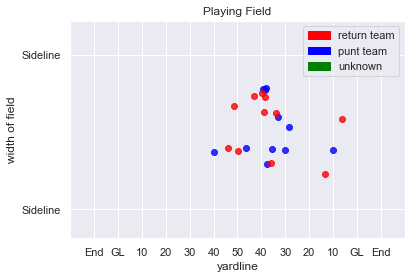

446
Play Description: (1:06) D.Kaser punts 56 yards to JAX 15, Center-M.Windt. R.Greene to JAX 16 for 1 yard (J.Attaochu). PENALTY on JAX-J.Johnson, Illegal Block Above the Waist, 8 yards, enforced at JAX 16.


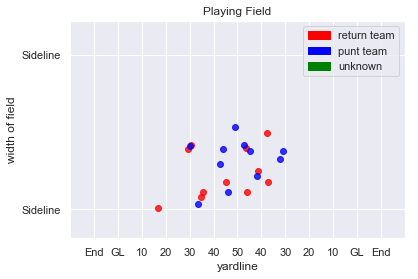

447
Play Description: (12:35) B.Nortman punts 39 yards to SD 36, Center-C.Tinker. T.Benjamin pushed ob at SD 45 for 9 yards (N.Sterling).


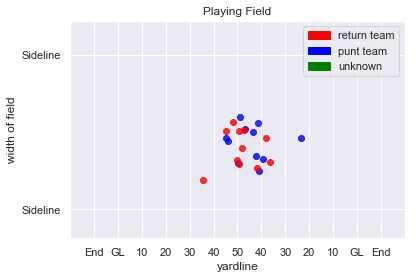

448
Play Description: (9:52) B.Nortman punts 56 yards to SD 7, Center-C.Tinker. T.Benjamin ran ob at SD 19 for 12 yards (B.Koyack).


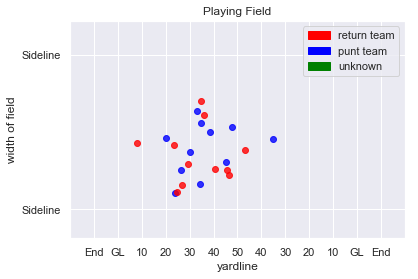

449
Play Description: (11:51) S.Lechler punts 46 yards to NE 43, Center-J.Weeks. D.Amendola to HST 47 for 10 yards (J.Weeks).


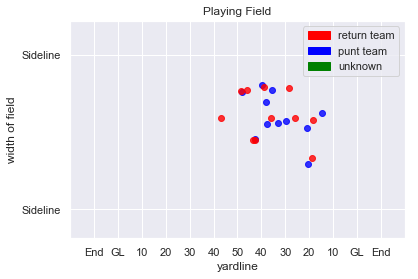

450
Play Description: (12:47) C.Schmidt punts 45 yards to 50, Center-G.Sanborn. Jo.Brown to BUF 38 for 12 yards (P.Brown).


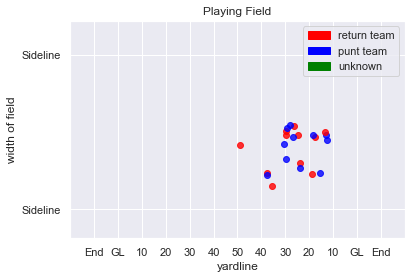

451
Play Description: (7:28) D.Butler punts 50 yards to BUF 14, Center-K.Canaday. B.Tate to BUF 22 for 8 yards (J.Bethel).


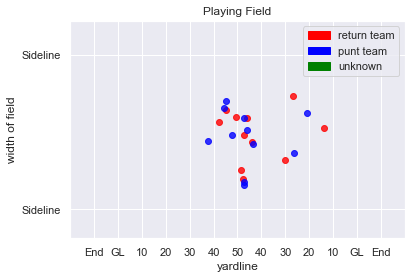

452
Play Description: (:02) D.Butler punts 40 yards to BUF 30, Center-K.Canaday. B.Tate to ARZ 39 for 31 yards (D.Bucannon, D.Butler). ARZ-K.Canaday was injured during the play. 


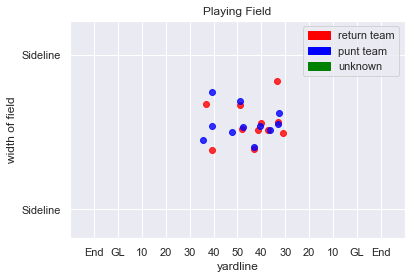

453
Play Description: (8:12) J.Locke punts 44 yards to CAR 47, Center-K.McDermott. T.Ginn to CAR 48 for 1 yard (A.Harris). PENALTY on MIN-J.Kearse, Illegal Use of Hands, 10 yards, enforced at CAR 48.


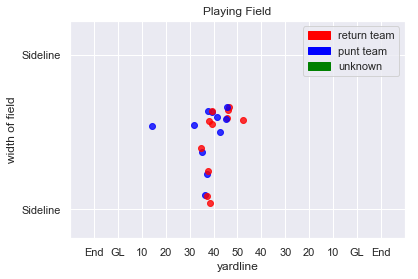

454
Play Description: (2:40) J.Locke punts 50 yards to CAR 35, Center-K.McDermott. T.Ginn to CAR 34 for -1 yards (C.Patterson).


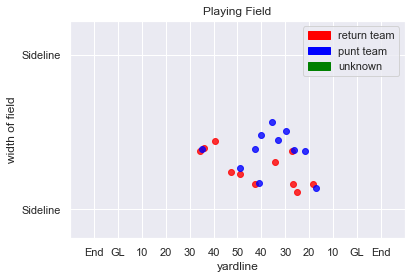

455
Play Description: (11:18) A.Lee punts 58 yards to MIN 34, Center-J.Jansen. M.Sherels to MIN 38 for 4 yards (D.Mayo).


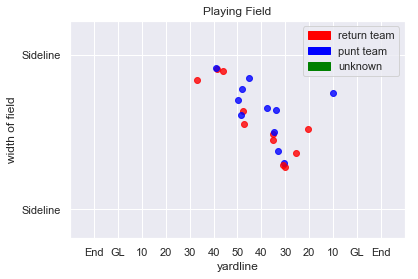

456
Play Description: (13:00) K.Huber punts 50 yards to DEN 14, Center-C.Harris. J.Norwood to DEN 25 for 11 yards (J.Shaw; J.Wright).


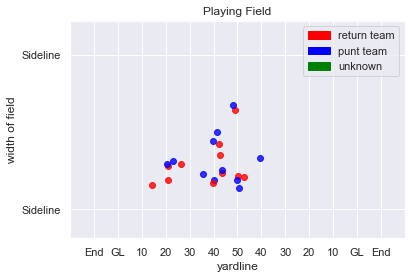

457
Play Description: (8:22) R.Dixon punts 53 yards to CIN 20, Center-C.Kreiter. A.Erickson to CIN 24 for 4 yards (S.Barrett; D.Watson).


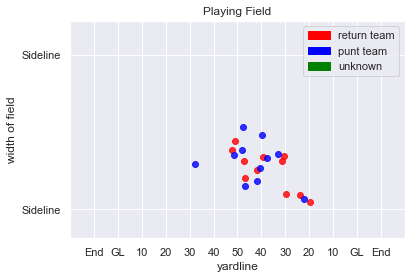

458
Play Description: (9:34) J.Schum punts 40 yards to DET 12, Center-B.Goode. A.Roberts to DET 13 for 1 yard (J.Elliott).


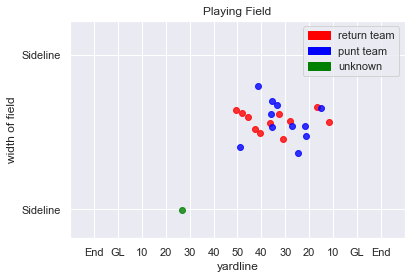

459
Play Description: (6:52) S.Martin punts 49 yards to GB 35, Center-D.Muhlbach. T.Davis to DET 31 for 34 yards (J.Bademosi, D.Muhlbach). Penalty on GB-J.Hawkins, Offensive Holding, declined. PENALTY on GB-M.Evans, Illegal Block Above the Waist, 10 yards, enforced at GB 36.


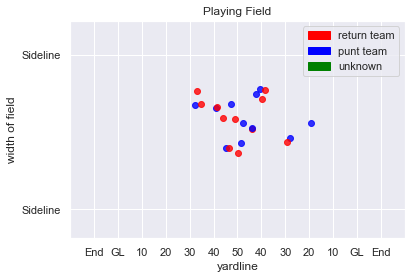

460
Play Description: (5:15) J.Schum punts 43 yards to DET 23, Center-B.Goode. A.Roberts to DET 38 for 15 yards (J.Janis, B.Martinez).


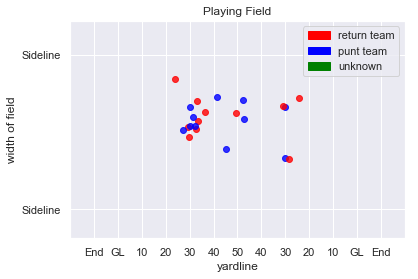

461
Play Description: (13:02) S.Koch punts 42 yards to JAX 24, Center-M.Cox. R.Greene to JAX 30 for 6 yards (C.Carter).


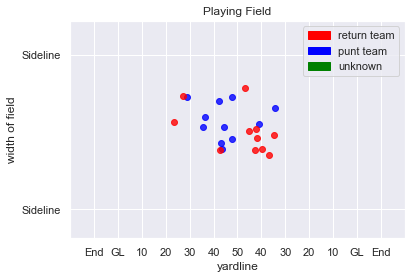

462
Play Description: (9:01) (Punt formation) S.Koch punts 44 yards to JAX 42, Center-M.Cox. R.Greene to JAX 40 for -2 yards (T.Young). PENALTY on JAX-D.House, Illegal Block Above the Waist, 10 yards, enforced at JAX 40.


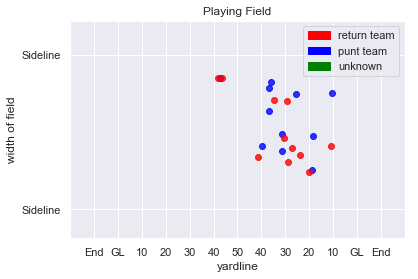

463
Play Description: (6:00) S.Koch punts 54 yards to JAX 21, Center-M.Cox. R.Greene to BLT 37 for 42 yards (A.Levine).


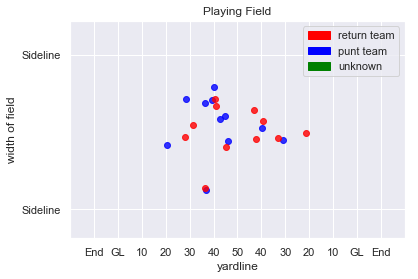

464
Play Description: (3:33) S.Koch punts 50 yards to JAX 28, Center-M.Cox. R.Greene to JAX 25 for -3 yards (M.Canady).


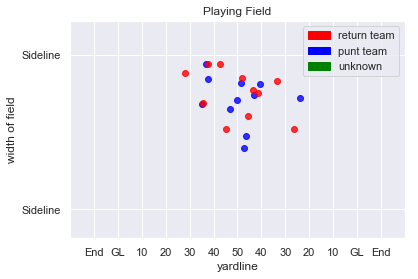

465
Play Description: (12:05) (Punt formation) S.Koch punts 53 yards to JAX 13, Center-M.Cox. R.Greene to JAX 19 for 6 yards (T.Young).


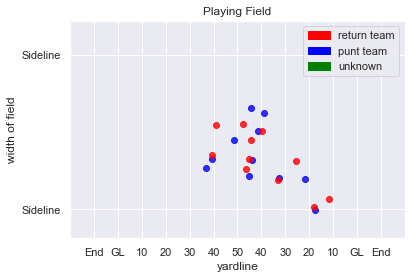

466
Play Description: (6:28) (Punt formation) M.Darr punts 55 yards to CLV 12, Center-J.Denney. J.Poyer to CLV 29 for 17 yards (M.Thomas). PENALTY on CLV-T.Carder, Offensive Holding, 6 yards, enforced at CLV 12.


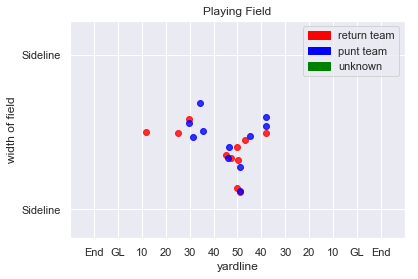

467
Play Description: (9:54) (Punt formation) B.Colquitt punts 44 yards to MIA 43, Center-C.Hughlett. J.Landry to CLV 44 for 13 yards (J.Poyer; C.Hughlett).


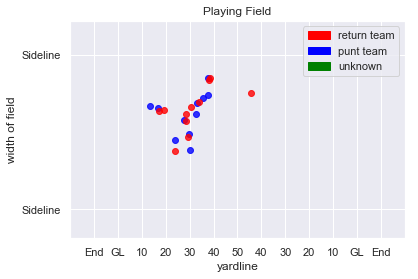

468
Play Description: (12:59) B.Wing punts 56 yards to WAS 14, Center-Z.DeOssie. J.Crowder to NYG 36 for 50 yards (D.Harris).


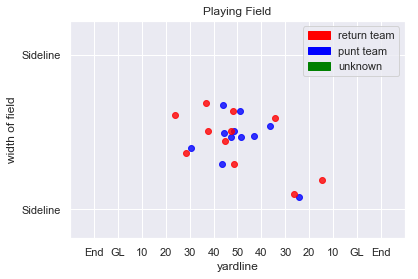

469
Play Description: (13:22) T.Way punts 56 yards to NYG 11, Center-N.Sundberg. D.Harris pushed ob at NYG 27 for 16 yards (W.Compton). PENALTY on NYG-P.Perkins, Illegal Block Above the Waist, 10 yards, enforced at NYG 25. Officially, a return for 14 yards. 


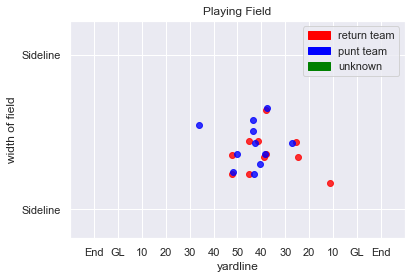

470
Play Description: (11:13) B.Wing punts 42 yards to WAS 42, Center-Z.DeOssie. J.Crowder to 50 for 8 yards (T.Wade, K.Robinson).


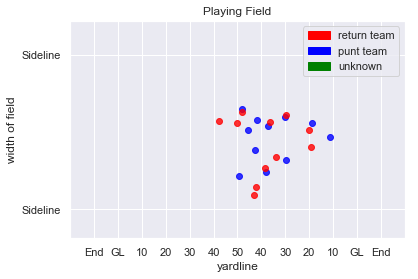

471
Play Description: (:13) (Punt formation) B.Kern punts 43 yards to OAK 14, Center-B.Brinkley. J.Richard to OAK 26 for 12 yards (A.Blake; W.Woodyard).


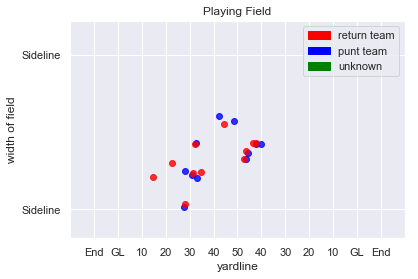

472
Play Description: (4:54) (Punt formation) M.King punts 60 yards to TEN 13, Center-J.Condo. M.Mariani to TEN 23 for 10 yards (C.James; B.Trawick).


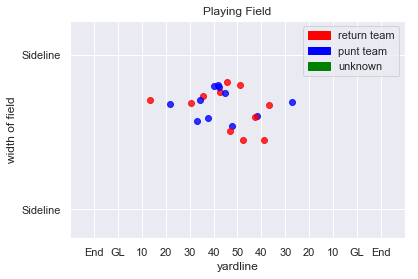

473
Play Description: (10:13) (Punt formation) B.Kern punts 56 yards to OAK 15, Center-B.Brinkley. J.Richard to OAK 27 for 12 yards (A.Andrews; S.Spence).


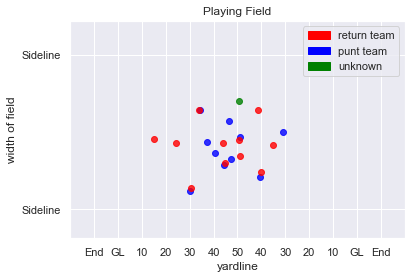

474
Play Description: (4:32) (Punt formation) B.Kern punts 57 yards to OAK 12, Center-B.Brinkley. J.Richard to OAK 26 for 14 yards (N.Palmer; K.Byard).


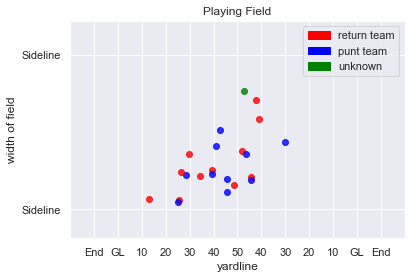

475
Play Description: (12:45) B.Pinion punts 54 yards to SEA 14, Center-K.Nelson. T.Lockett to SEA 28 for 14 yards (A.Burbridge; D.Johnson). PENALTY on SF-K.Nelson, Offensive Holding, 10 yards, enforced at SEA 28.


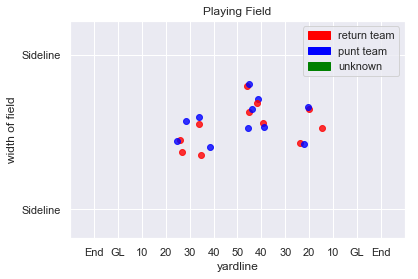

476
Play Description: (:23) J.Ryan punts 57 yards to SF 14, Center-N.Frese. J.Kerley pushed ob at SF 34 for 20 yards (K.McCray).


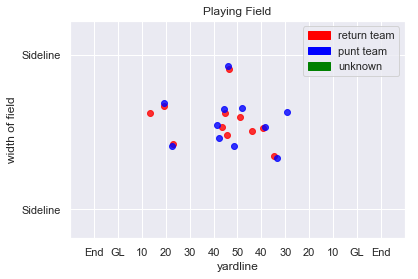

477
Play Description: (:53) B.Pinion punts 45 yards to SEA 32, Center-K.Nelson. T.Lockett to SEA 26 for -6 yards (K.Nelson).


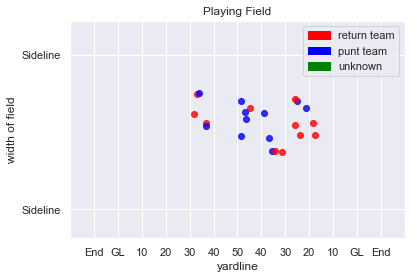

478
Play Description: (11:20) B.Pinion punts 41 yards to SEA 12, Center-K.Nelson. T.Lockett to SF 26 for 62 yards (A.Burbridge).


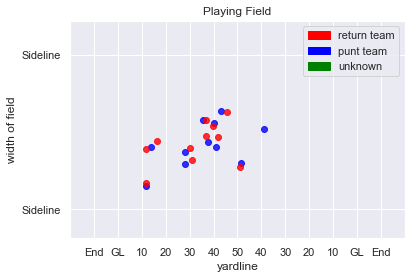

479
Play Description: (10:08) (Punt formation) B.Anger punts 55 yards to LA 21, Center-A.DePaola. T.Austin ran ob at LA 29 for 8 yards (J.Keyes).


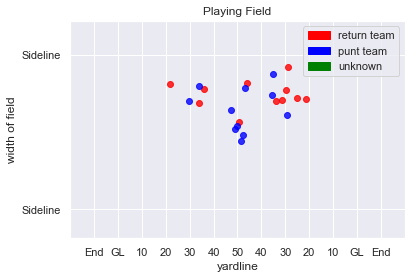

480
Play Description: (10:10) (Punt formation) J.Hekker punts 64 yards to TB 16, Center-J.McQuaide. A.Humphries ran ob at TB 29 for 13 yards (C.Littleton).


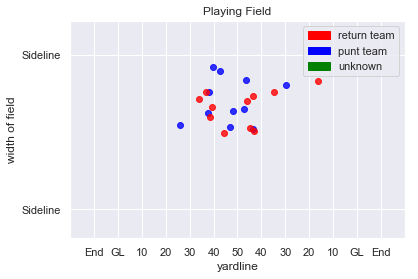

481
Play Description: (8:37) (Punt formation) B.Anger punts 50 yards to LA 16, Center-A.DePaola. T.Austin to LA 20 for 4 yards (J.Rodgers).


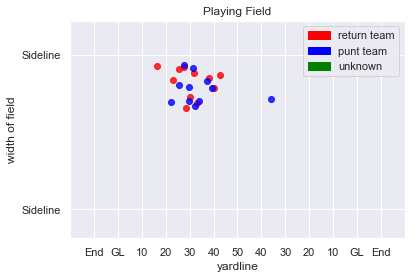

482
Play Description: (1:52) (Punt formation) J.Hekker punts 64 yards to TB 31, Center-J.McQuaide. A.Humphries ran ob at TB 44 for 13 yards (B.Hager).


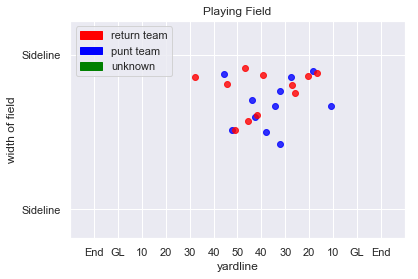

483
Play Description: (1:42) D.Kaser punts 39 yards to IND 32, Center-M.Windt. Q.Bray to IND 32 for no gain (T.Williams).


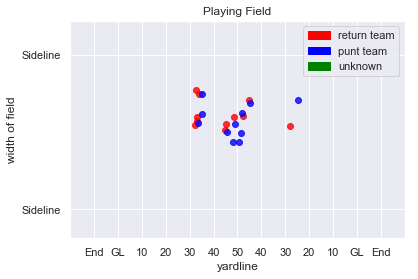

484
Play Description: (12:21) L.Edwards punts 35 yards to KC 7, Center-T.Purdum. T.Hill pushed ob at KC 17 for 10 yards (J.Martin).


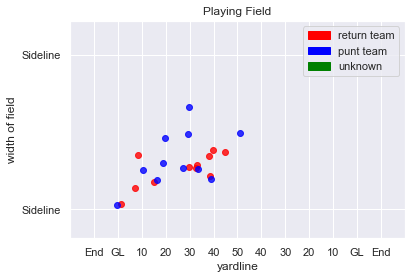

485
Play Description: (9:27) L.Edwards punts 51 yards to KC 18, Center-T.Purdum. T.Hill ran ob at KC 37 for 19 yards.


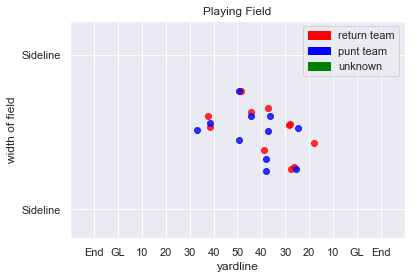

486
Play Description: (4:21) D.Colquitt punts 46 yards to NYJ 29, Center-J.Winchester. J.Marshall to NYJ 41 for 12 yards (T.Hill; D.Alexander).


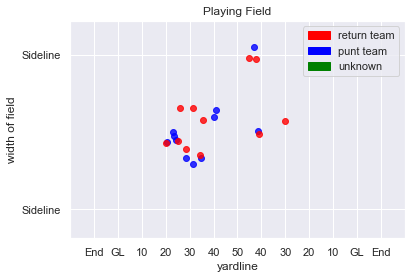

487
Play Description: (1:46) J.Berry punts 63 yards to PHI 6, Center-G.Warren. D.Sproles to PHI 20 for 14 yards (S.Thomas).


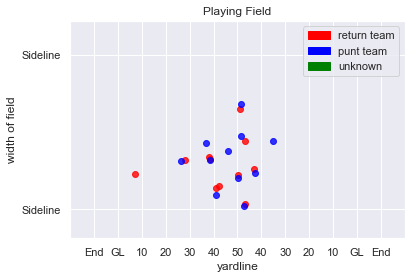

488
Play Description: (:38) D.Jones punts 47 yards to PIT 12, Center-J.Dorenbos. E.Rogers to PIT 15 for 3 yards (C.Maragos).


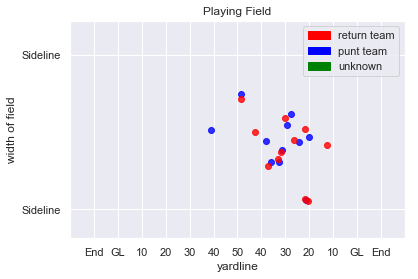

489
Play Description: (:47) J.Berry punts 47 yards to PHI 18, Center-G.Warren. D.Sproles to PHI 20 for 2 yards (D.Heyward-Bey).


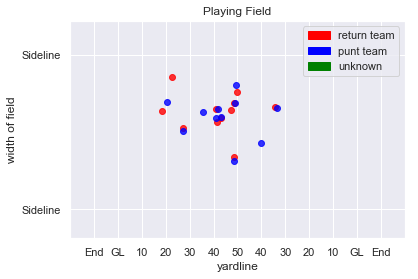

490
Play Description: (13:15) (Punt formation) P.O'Donnell punts 42 yards to DAL 29, Center-P.Scales. L.Whitehead to DAL 32 for 3 yards (J.Anderson). Injury update: La'el Collins has a foot sprain and will not return to the game.


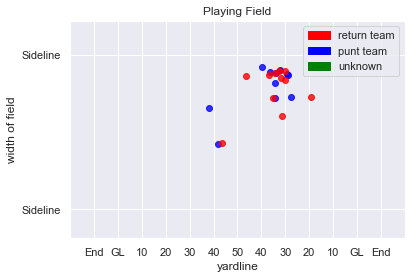

491
Play Description: (5:20) (Punt formation) C.Jones punts 51 yards to CHI 15, Center-L.Ladouceur. E.Royal to CHI 24 for 9 yards (R.Smith). PENALTY on DAL-R.Smith, Face Mask (15 Yards), 15 yards, enforced at CHI 24.


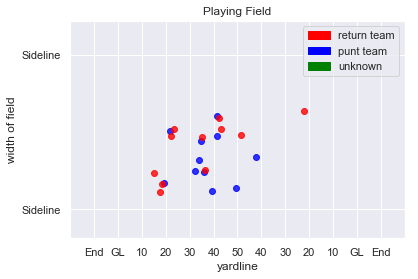

492
Play Description: (1:49) (Punt formation) C.Jones punts 47 yards to CHI 8, Center-L.Ladouceur. E.Royal pushed ob at CHI 16 for 8 yards (B.Jones).


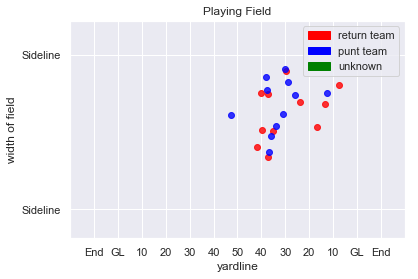

493
Play Description: (7:45) K.Huber punts 48 yards to MIA 21, Center-C.Harris. J.Grant pushed ob at MIA 22 for 1 yard (J.Shaw).


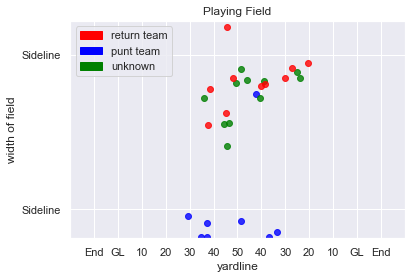

494
Play Description: (14:24) K.Huber punts 50 yards to MIA 32, Center-C.Harris. J.Grant pushed ob at MIA 43 for 11 yards (C.Harris; N.Vigil).


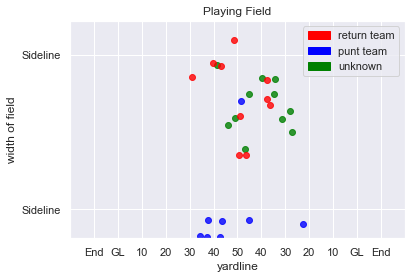

495
Play Description: (:29) M.Darr punts 53 yards to CIN 15, Center-J.Denney. A.Erickson to CIN 27 for 12 yards (M.Gray).


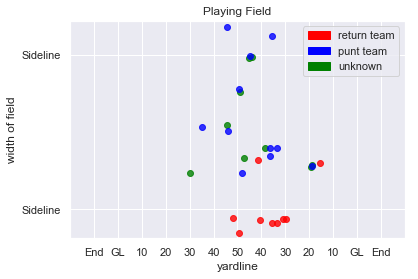

496
Play Description: (4:09) M.Darr punts 57 yards to CIN 18, Center-J.Denney. A.Erickson to CIN 26 for 8 yards (M.Thomas).


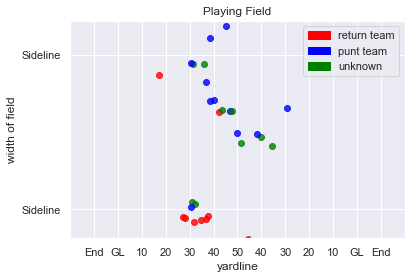

497
Play Description: (12:19) M.Darr punts 44 yards to CIN 35, Center-J.Denney. A.Erickson to CIN 38 for 3 yards (M.Thomas; W.Aikens).


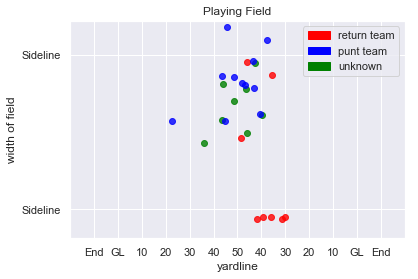

498
Play Description: (3:53) K.Huber punts 46 yards to MIA 24, Center-C.Harris. J.Grant to MIA 25 for 1 yard (M.Flowers).


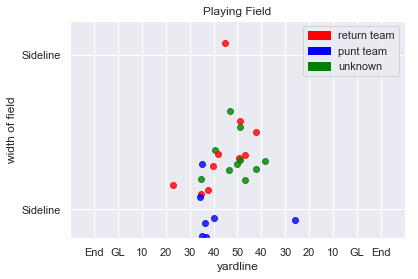

499
Play Description: (13:41) (Punt formation) P.McAfee punts 49 yards to JAX 18, Center-M.Overton. R.Greene ran ob at JAX 30 for 12 yards (J.Todman).


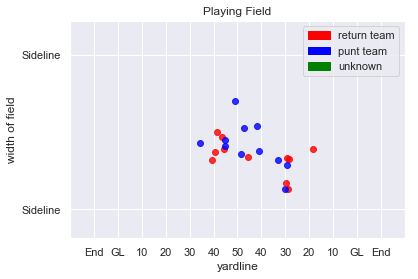

500
Play Description: (:14) (Punt formation) B.Nortman punts 50 yards to IND 21, Center-C.Tinker. Q.Bray pushed ob at IND 25 for 4 yards (H.Pullard).


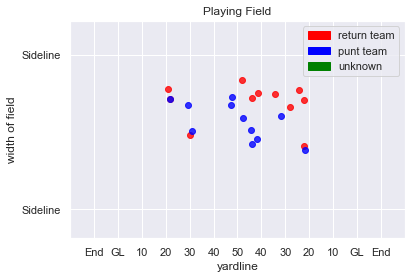

501
Play Description: (9:51) (Punt formation) P.McAfee punts 54 yards to JAX 21, Center-M.Overton. R.Greene to JAX 29 for 8 yards (C.Geathers). PENALTY on JAX-J.Johnson, Offensive Holding, 10 yards, enforced at JAX 21.


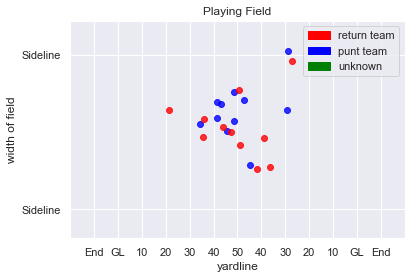

502
Play Description: (12:50) (Punt formation) B.Nortman punts 58 yards to IND 8, Center-C.Tinker. Q.Bray to IND 22 for 14 yards (P.Thompson).


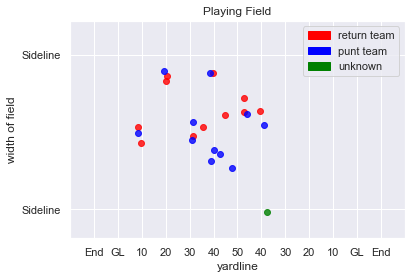

503
Play Description: (11:41) A.Lee punts 53 yards to ATL 21, Center-J.Jansen. E.Weems pushed ob at ATL 39 for 18 yards (J.Webb). PENALTY on ATL-J.Hardy, Offensive Holding, 10 yards, enforced at ATL 39.


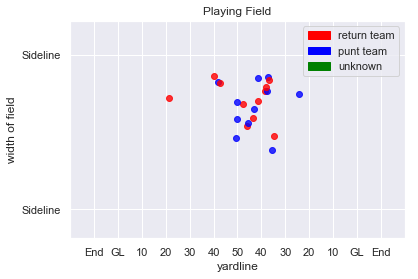

504
Play Description: (1:53) M.Bosher punts 56 yards to CAR 18, Center-J.Harris. T.Ginn to CAR 26 for 8 yards (J.Harris).


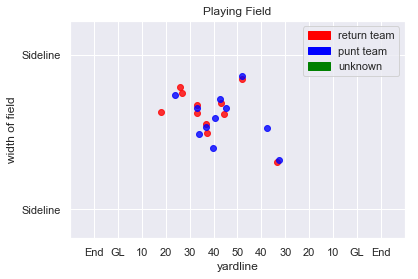

505
Play Description: (8:27) A.Lee punts 56 yards to ATL 16, Center-J.Jansen. E.Weems to ATL 26 for 10 yards (J.Norris). PENALTY on ATL-B.Poole, Offensive Holding, 8 yards, enforced at ATL 16.


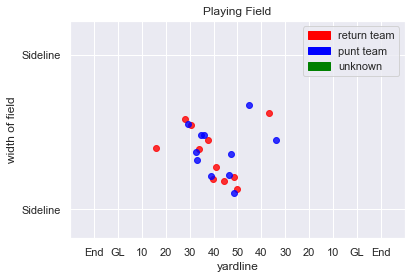

506
Play Description: (3:46) A.Lee punts 49 yards to ATL 22, Center-J.Jansen. E.Weems to ATL 29 for 7 yards (R.McClain).


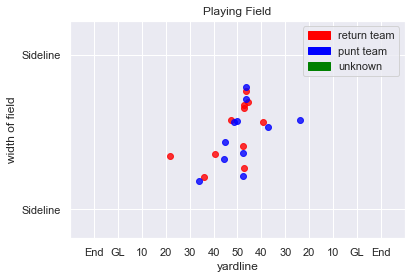

507
Play Description: (1:37) M.Bosher punts 59 yards to CAR 16, Center-J.Harris. T.Ginn ran ob at CAR 24 for 8 yards (L.Reynolds).


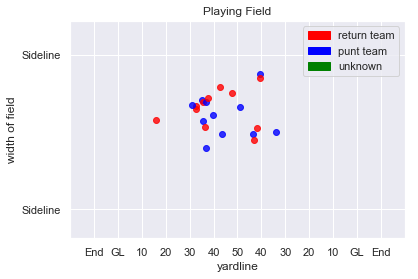

508
Play Description: (10:37) (Punt formation) S.Koch punts 56 yards to OAK 11, Center-M.Cox. J.Richard to OAK 31 for 20 yards (A.Levine).


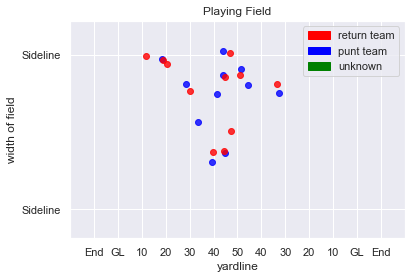

509
Play Description: (6:58) (Punt formation) S.Koch punts 59 yards to OAK 20, Center-M.Cox. J.Richard to OAK 25 for 5 yards (C.Moore).


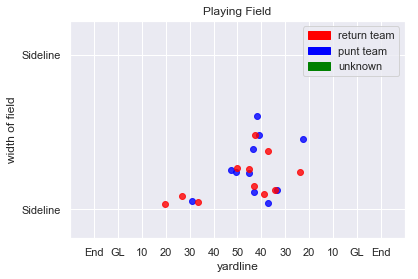

510
Play Description: (1:49) (Punt formation) S.Koch punts 47 yards to OAK 47, Center-M.Cox. J.Richard pushed ob at BLT 6 for 47 yards (S.Koch).


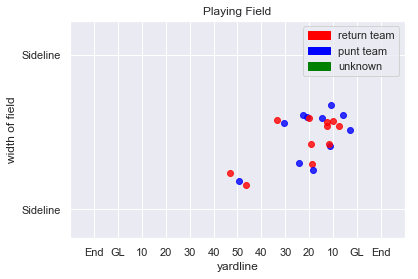

511
Play Description: (11:12) (Punt formation) M.King punts 55 yards to BLT 18, Center-J.Condo. D.Hester pushed ob at BLT 27 for 9 yards (B.Heeney).


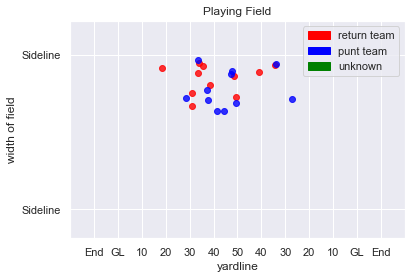

512
Play Description: (3:11) (Punt formation) S.Koch punts 56 yards to OAK 25, Center-M.Cox. T.Carrie to OAK 43 for 18 yards (A.McClellan).


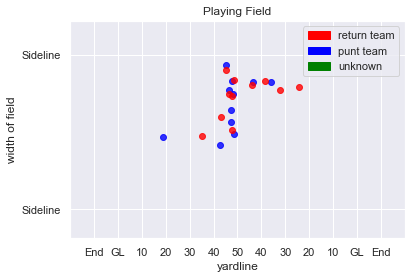

513
Play Description: (9:53) (Punt formation) M.King punts 62 yards to BLT 15, Center-J.Condo. D.Hester to BLT 28 for 13 yards (A.Holmes).


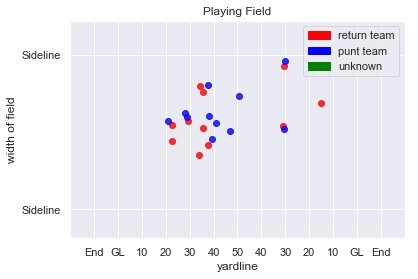

514
Play Description: (6:50) (Punt formation) M.King punts 53 yards to BLT 23, Center-J.Condo. D.Hester pushed ob at BLT 43 for 20 yards (A.Holmes). PENALTY on OAK-A.Holmes, Player Out of Bounds on Punt, 5 yards, enforced between downs.


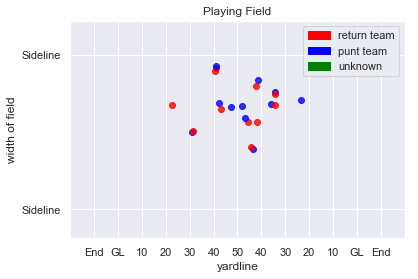

515
Play Description: (11:50) (Punt formation) S.Martin punts 53 yards to CHI 20, Center-D.Muhlbach. E.Royal pushed ob at CHI 40 for 20 yards (T.Armbrister). PENALTY on CHI-D.Houston-Carson, Illegal Block Above the Waist, 10 yards, enforced at CHI 27.


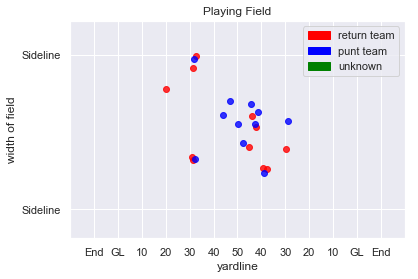

516
Play Description: (6:10) (Punt formation) S.Martin punts 51 yards to CHI 41, Center-D.Muhlbach. E.Royal to CHI 43 for 2 yards (D.Carey).


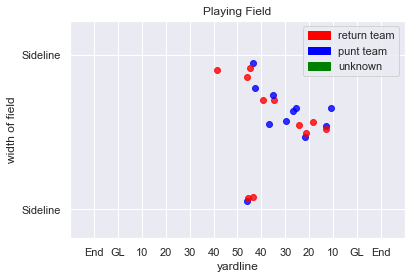

517
Play Description: (12:01) (Punt formation) P.O'Donnell punts 51 yards to DET 19, Center-P.Scales. A.Roberts pushed ob at DET 34 for 15 yards (C.Prosinski).


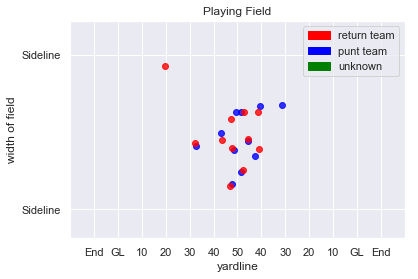

518
Play Description: (11:06) (Punt formation) S.Martin punts 50 yards to CHI 12, Center-D.Muhlbach. E.Royal pushed ob at CHI 20 for 8 yards (B.Copeland).


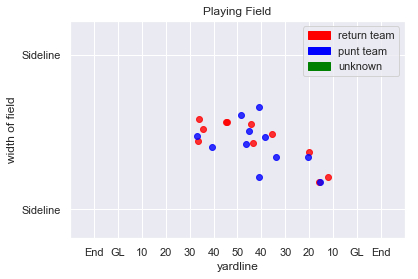

519
Play Description: (1:25) S.Lechler punts 45 yards to TEN 11, Center-J.Weeks. M.Mariani to TEN 12 for 1 yard (C.James). (The Punt Hangtime Was 4.84 seconds.)


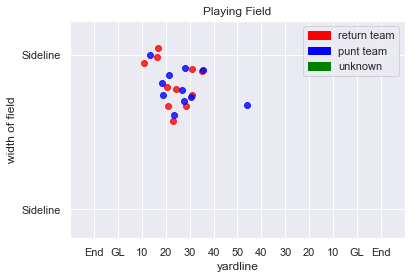

520
Play Description: (:58) B.Kern punts 55 yards to HST 30, Center-B.Brinkley. T.Ervin pushed ob at HST 46 for 16 yards (A.Wallace). PENALTY on TEN-A.Blake, Offensive Holding, 10 yards, enforced at HST 46.


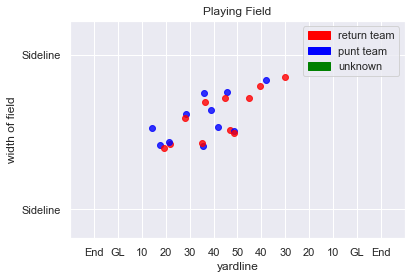

521
Play Description: (14:19) B.Kern punts 46 yards to HST 22, Center-B.Brinkley. T.Ervin to HST 23 for 1 yard (A.Blake).


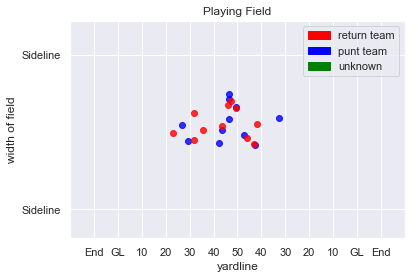

522
Play Description: (12:46) S.Lechler punts 47 yards to TEN 24, Center-J.Weeks. M.Mariani to TEN 33 for 9 yards (J.Weeks, E.Pleasant).


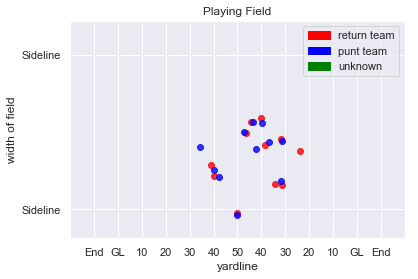

523
Play Description: (:14) S.Lechler punts 58 yards to TEN 8, Center-J.Weeks. M.Mariani pushed ob at TEN 25 for 17 yards (A.Blue).


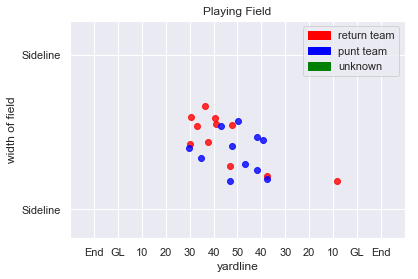

524
Play Description: (12:48) R.Allen punts 47 yards to BUF 35, Center-J.Cardona. B.Tate to BUF 35 for no gain (M.Slater).


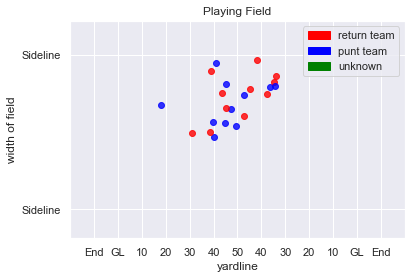

525
Play Description: (12:34) R.Allen punts 56 yards to BUF 10, Center-J.Cardona. B.Tate to BUF 20 for 10 yards (M.Slater; N.Ebner). PENALTY on BUF-S.Gilmore, Unsportsmanlike Conduct, 5 yards, enforced at BUF 10.


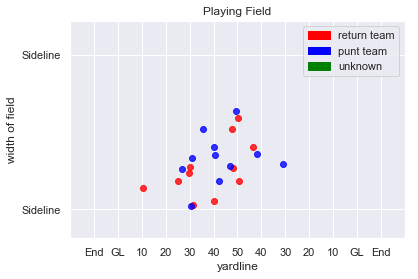

526
Play Description: (1:13) C.Schmidt punts 43 yards to NE 15, Center-G.Sanborn. D.Amendola to NE 20 for 5 yards (L.Alexander; G.Sanborn).


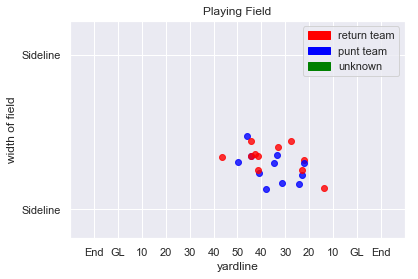

527
Play Description: (14:18) C.Schmidt punts 48 yards to NE 25, Center-G.Sanborn. D.Amendola to NE 24 for -1 yards (R.Humber).


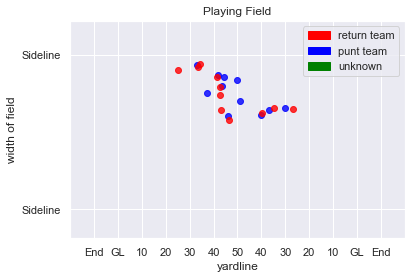

528
Play Description: (5:06) R.Allen punts 49 yards to BUF 12, Center-J.Cardona. B.Tate to BUF 30 for 18 yards (B.Mingo).


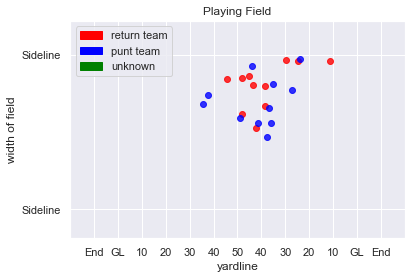

529
Play Description: (7:52) L.Edwards punts 41 yards to SEA 44, Center-T.Purdum. T.Lockett to SEA 45 for 1 yard (M.Williams; J.Burris).


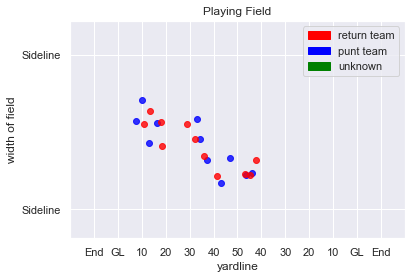

530
Play Description: (11:22) L.Edwards punts 52 yards to SEA 18, Center-T.Purdum. T.Lockett to SEA 25 for 7 yards (J.Martin; B.Carter).


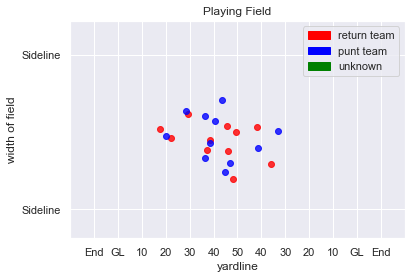

531
Play Description: (5:59) T.Way punts 59 yards to CLV 5, Center-N.Sundberg. D.Johnson to CLV 23 for 18 yards (D.Bruton; Q.Dunbar).


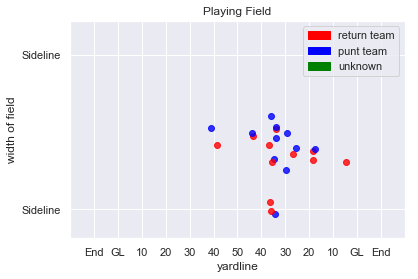

532
Play Description: (1:48) T.Way punts 39 yards to CLV 17, Center-N.Sundberg. J.Poyer ran ob at CLV 19 for 2 yards.


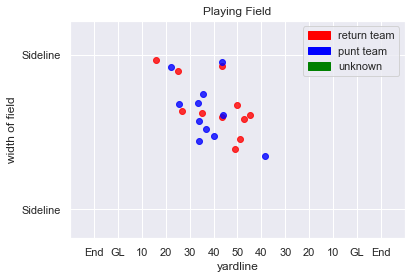

533
Play Description: (14:10) (Punt formation) R.Dixon punts 57 yards to TB 17, Center-C.Kreiter. A.Humphries pushed ob at TB 28 for 11 yards (J.Taylor).


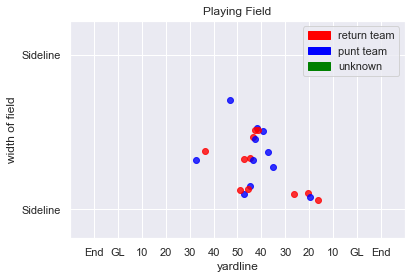

534
Play Description: (6:07) (Punt formation) R.Dixon punts 43 yards to TB 35, Center-C.Kreiter. A.Humphries to 50 for 15 yards (C.Nelson).


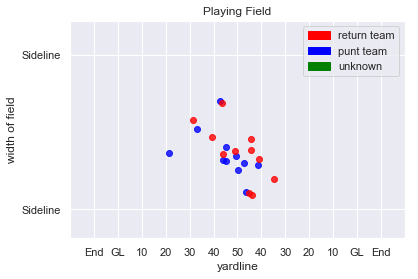

535
Play Description: (1:31) (Punt formation) B.Anger punts 52 yards to DEN 21, Center-A.DePaola. J.Norwood to DEN 33 for 12 yards (J.Robinson).


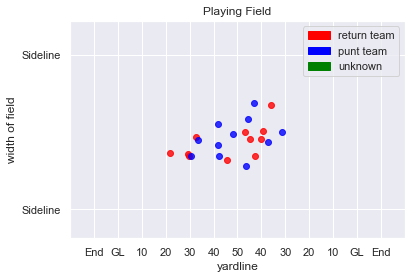

536
Play Description: (5:40) (Punt formation) B.Anger punts 44 yards to DEN 38, Center-A.DePaola. J.Norwood to DEN 35 for -3 yards. Lateral to C.Latimer to TB 43 for 22 yards (J.Keyes). PENALTY on DEN-K.Webster, Offensive Holding, 10 yards, enforced at DEN 35.


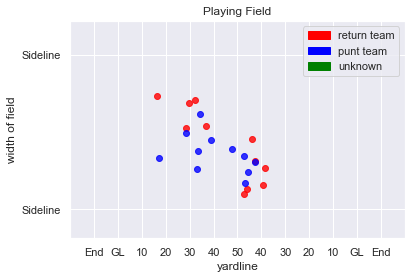

537
Play Description: (14:57) (Punt formation) R.Dixon punts 54 yards to TB 5, Center-C.Kreiter. A.Humphries to TB 16 for 11 yards (A.Janovich).


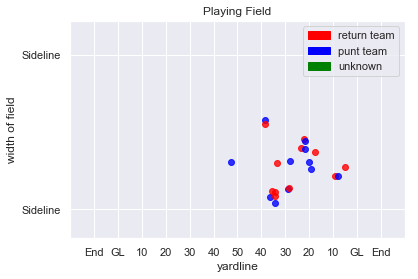

538
Play Description: (4:23) J.Hekker punts 55 yards to ARZ 36, Center-J.McQuaide. Jo.Brown to LA 45 for 19 yards (C.Davis).


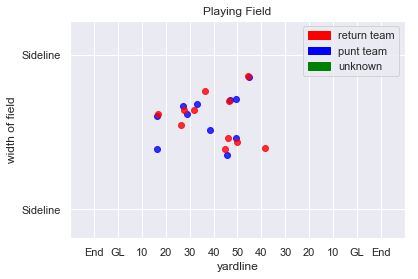

539
Play Description: (5:17) J.Hekker punts 43 yards to ARZ 21, Center-J.McQuaide. Jo.Brown to ARZ 25 for 4 yards (J.McQuaide).


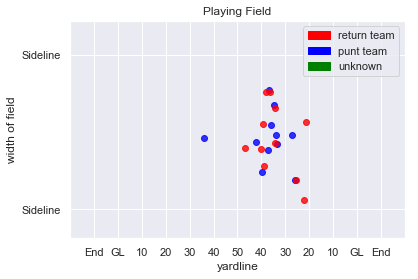

540
Play Description: (5:26) R.Quigley punts 51 yards to LA 19, Center-A.Brewer. T.Austin to ARZ 34 for 47 yards (I.Momah). PENALTY on ARZ-I.Momah, Face Mask (15 Yards), 15 yards, enforced at ARZ 34.


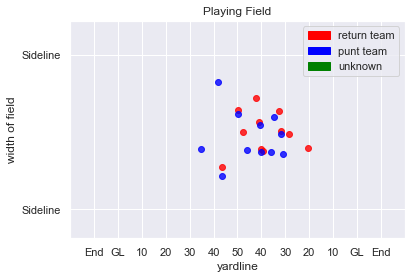

541
Play Description: (1:14) J.Hekker punts 41 yards to ARZ 16, Center-J.McQuaide. Jo.Brown to ARZ 16 for no gain (M.Brown). PENALTY on LA-M.Brown, Horse Collar Tackle, 15 yards, enforced at ARZ 16.


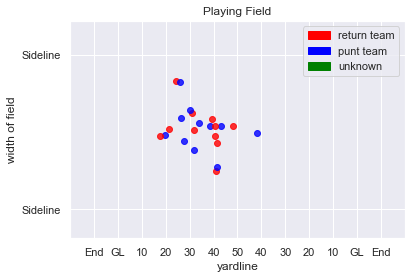

542
Play Description: (8:44) D.Kaser punts 49 yards to NO 14, Center-M.Windt. T.Lewis ran ob at NO 21 for 7 yards (J.Perry).


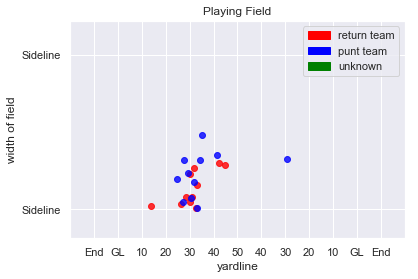

543
Play Description: (4:56) T.Morstead punts 52 yards to SD 20, Center-J.Drescher. T.Benjamin to SD 38 for 18 yards (T.Morstead).


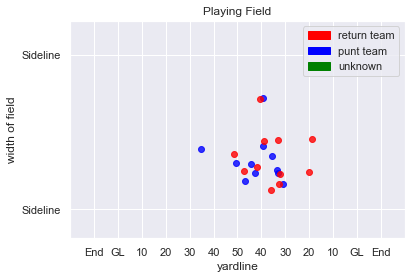

544
Play Description: (2:36) T.Morstead punts 47 yards to NO 49, Center-J.Drescher. T.Benjamin ran ob at NO 47 for 2 yards (D.Harris).


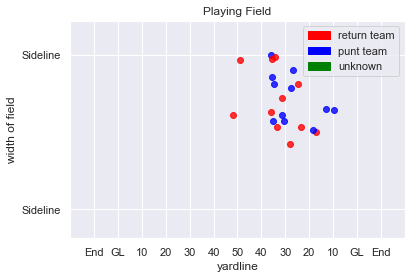

545
Play Description: (13:28) D.Kaser punts 47 yards to NO 47, Center-M.Windt. T.Lewis pushed ob at SD 48 for 5 yards (D.Stuckey).


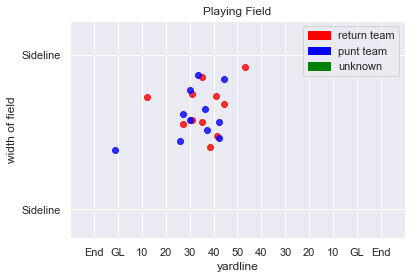

546
Play Description: (3:48) T.Morstead punts 59 yards to SD 11, Center-J.Drescher. T.Benjamin ran ob at SD 21 for 10 yards (N.Stupar). PENALTY on NO-D.Harris, Player Out of Bounds on Punt, 5 yards, enforced at SD 21.


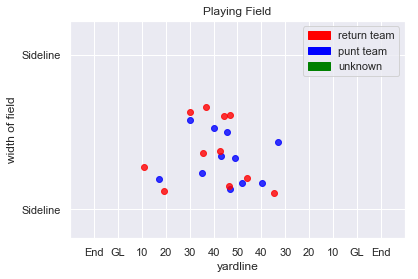

547
Play Description: (7:06) B.Pinion punts 60 yards to DAL 23, Center-K.Nelson. L.Whitehead to DAL 34 for 11 yards (G.Hodges).


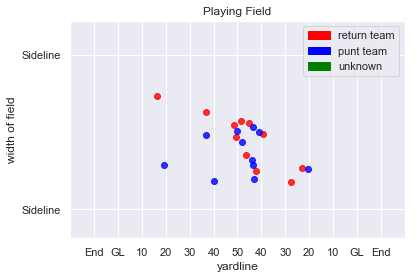

548
Play Description: (7:09) B.Pinion punts 65 yards to DAL 8, Center-K.Nelson. L.Whitehead to DAL 22 for 14 yards (D.Johnson, S.Skov).


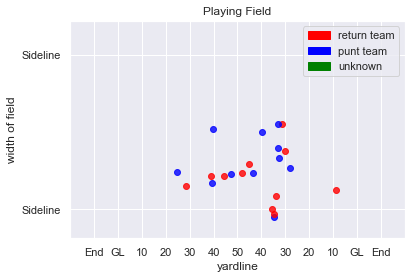

549
Play Description: (11:05) C.Jones punts 57 yards to SF 19, Center-L.Ladouceur. J.Kerley pushed ob at SF 45 for 26 yards (C.Jones).


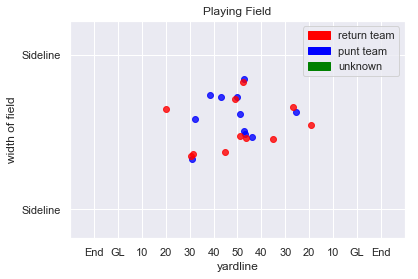

550
Play Description: (9:06) (Punt formation) J.Berry punts 40 yards to KC 10, Center-G.Warren. T.Hill to KC 24 for 14 yards (V.Williams).


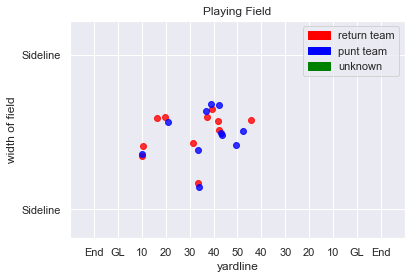

551
Play Description: (:32) (Punt formation) D.Colquitt punts 58 yards to PIT 12, Center-J.Winchester. A.Brown to PIT 17 for 5 yards (E.Murray). PENALTY on PIT-A.Burns, Illegal Block Above the Waist, 8 yards, enforced at PIT 16.


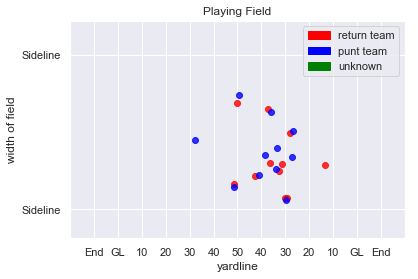

552
Play Description: (1:02) (Punt formation) B.Wing punts 53 yards to MIN 28, Center-Z.DeOssie. M.Sherels pushed ob at MIN 33 for 5 yards (D.Harris).


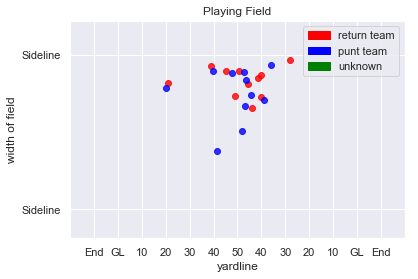

553
Play Description: (13:10) (Punt formation) B.Wing punts 45 yards to MIN 27, Center-Z.DeOssie. M.Sherels to MIN 35 for 8 yards (Z.DeOssie).


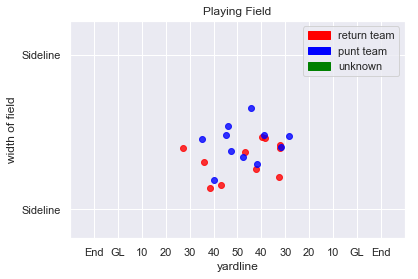

554
Play Description: (:49) B.Pinion punts 57 yards to ARZ 24, Center-K.Nelson. Jo.Brown to ARZ 24 for no gain (M.Cromartie).


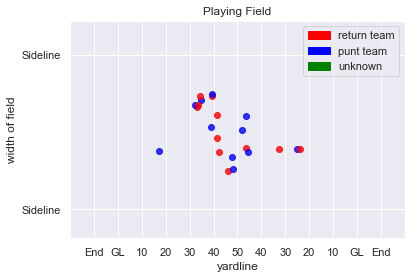

555
Play Description: (13:52) R.Quigley punts 45 yards to SF 25, Center-A.Brewer. J.Kerley to SF 22 for -3 yards (T.Jefferson).


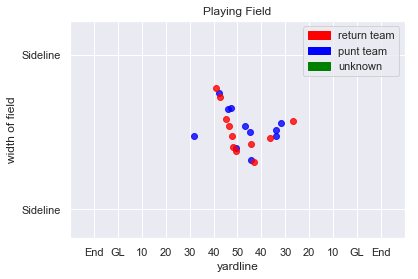

556
Play Description: (1:17) B.Pinion punts 46 yards to ARZ 35, Center-K.Nelson. Jo.Brown to ARZ 43 for 8 yards (N.Bellore).


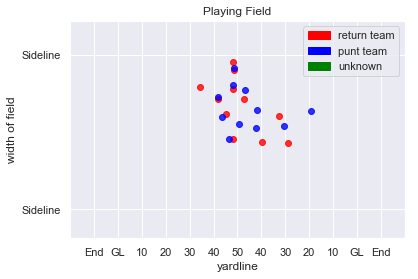

557
Play Description: (11:06) B.Pinion punts 52 yards to ARZ 19, Center-K.Nelson. Jo.Brown to ARZ 29 for 10 yards (S.Skov, M.Wilhoite).


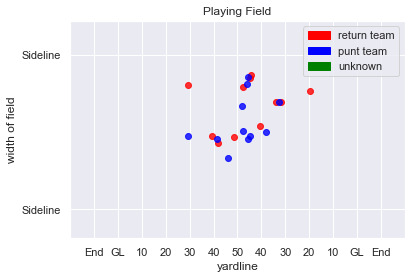

558
Play Description: (:41) R.Quigley punts 55 yards to SF 14, Center-A.Brewer. J.Kerley pushed ob at SF 19 for 5 yards (I.Momah). Penalty on SF-Q.Patton, Offensive Holding, offsetting, enforced at SF 14. Penalty on ARZ-B.Golden, Unnecessary Roughness, offsetting. J.Kerley credited with return for 0-yds.


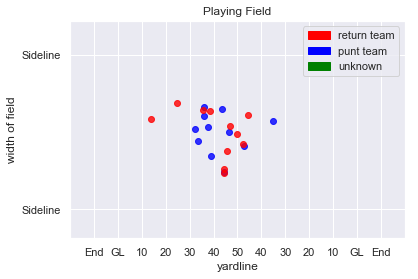

559
Play Description: (5:44) (Punt formation) S.Koch punts 54 yards to WAS 17, Center-M.Cox. J.Crowder to WAS 21 for 4 yards (K.Aiken). PENALTY on WAS-R.Kelley, Illegal Block Above the Waist, 10 yards, enforced at WAS 21.


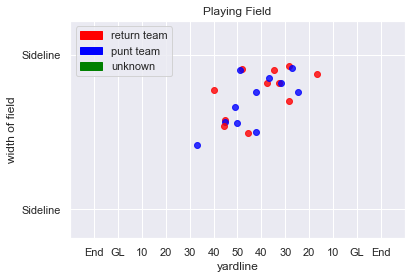

560
Play Description: (2:45) (Punt formation) T.Way punts 47 yards to BLT 28, Center-N.Sundberg. D.Hester to BLT 44 for 16 yards (D.Everett). PENALTY on BLT-A.Levine, Illegal Block Above the Waist, 10 yards, enforced at BLT 27.


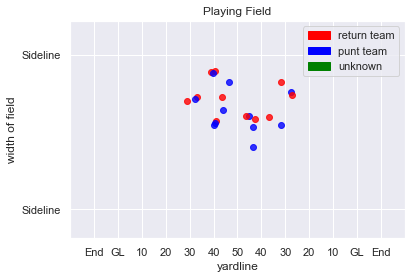

561
Play Description: (3:10) (Punt formation) R.Allen punts 46 yards to CLV 12, Center-J.Cardona. D.Johnson to CLV 20 for 8 yards (B.Mingo; J.Develin).


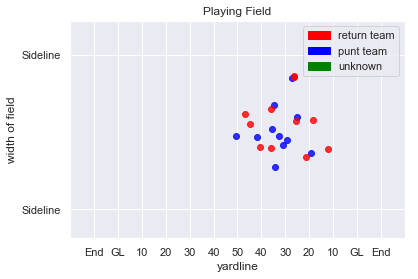

562
Play Description: (2:05) (Punt formation) B.Colquitt punts 49 yards to NE 26, Center-C.Hughlett. J.Edelman to NE 38 for 12 yards (D.Alexander; C.Hughlett).


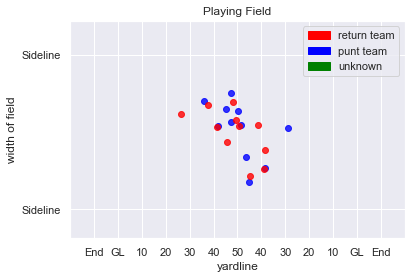

563
Play Description: (6:53) (Punt formation) R.Allen punts 52 yards to CLV 18, Center-J.Cardona. D.Johnson to CLV 32 for 14 yards (N.Ebner). PENALTY on CLV, Offensive Holding, 10 yards, enforced at CLV 30.


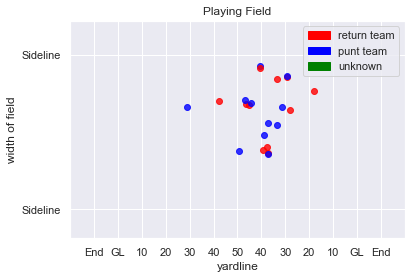

564
Play Description: (5:55) (Punt formation) B.Colquitt punts 50 yards to NE 25, Center-C.Hughlett. J.Edelman to NE 25 for no gain (J.Schobert).


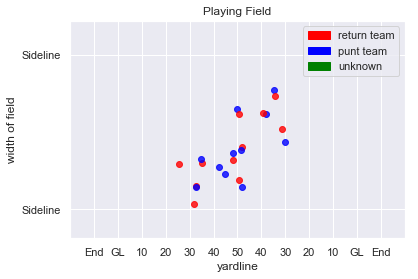

565
Play Description: (2:36) (Punt formation) R.Allen punts 46 yards to CLV 15, Center-J.Cardona. J.Haden to CLV 20 for 5 yards (N.Ebner).


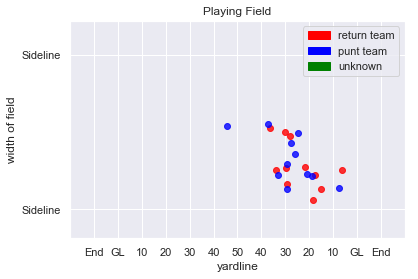

566
Play Description: (5:11) S.Martin punts 55 yards to PHI 17, Center-D.Muhlbach. D.Sproles to PHI 23 for 6 yards (D.Carey).


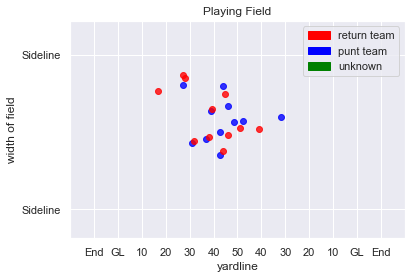

567
Play Description: (11:15) P.O'Donnell punts 46 yards to IND 12, Center-P.Scales. Q.Bray to IND 32 for 20 yards (S.Acho).


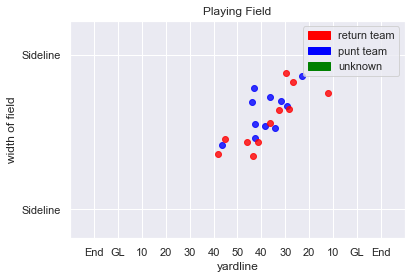

568
Play Description: (8:23) (Punt formation) M.Darr punts 57 yards to TEN 17, Center-J.Denney. M.Mariani to TEN 19 for 2 yards (B.McCain).


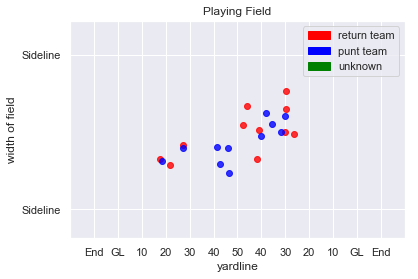

569
Play Description: (3:23) (Punt formation) M.Darr punts 46 yards to TEN 30, Center-J.Denney. M.Mariani to TEN 39 for 9 yards (W.Aikens; M.Thomas).


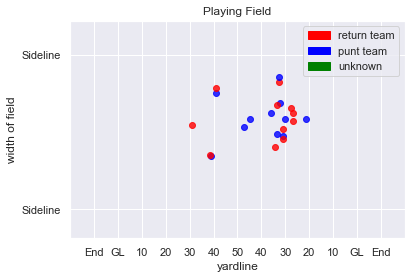

570
Play Description: (14:56) (Punt formation) M.Darr punts 57 yards to TEN 9, Center-J.Denney. M.Mariani to TEN 18 for 9 yards (M.Thomas).


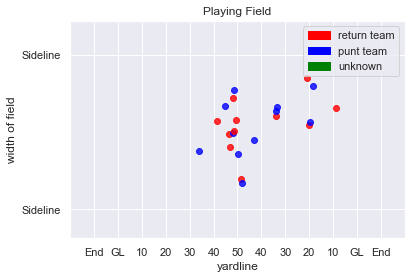

571
Play Description: (13:32) (Punt formation) M.Darr punts 57 yards to TEN 34, Center-J.Denney. M.Mariani to MIA 48 for 18 yards (M.Darr). Penalty on TEN-A.Blake, Offensive Holding, offsetting, enforced at TEN 34. Penalty on MIA-M.Darr, Unnecessary Roughness, offsetting.


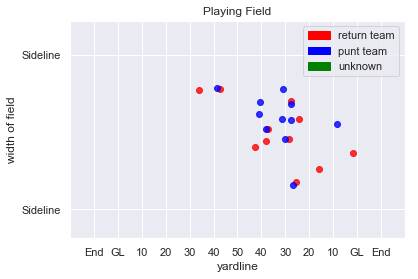

572
Play Description: (3:06) (Punt formation) B.Kern punts 26 yards to MIA 11, Center-B.Brinkley. J.Landry to MIA 23 for 12 yards (S.Spence).


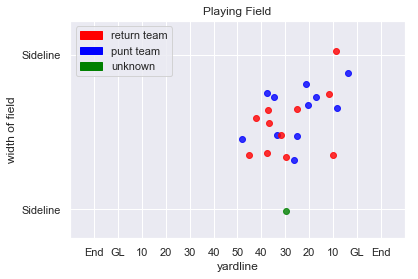

573
Play Description: (10:30) (Punt formation) S.Lechler punts 47 yards to MIN 33, Center-J.Weeks. M.Sherels to MIN 45 for 12 yards (M.Bullough).


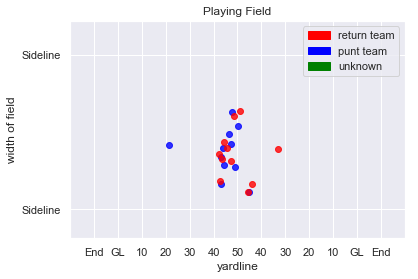

574
Play Description: (5:13) (Punt formation) S.Lechler punts 54 yards to MIN 16, Center-J.Weeks. M.Sherels pushed ob at MIN 30 for 14 yards (B.Scarlett). PENALTY on MIN-J.Trattou, Offensive Holding, 8 yards, enforced at MIN 16.


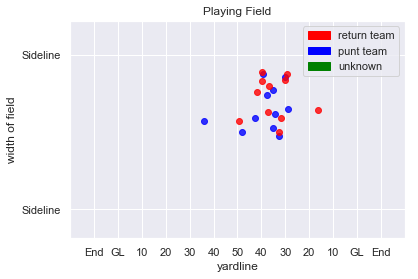

575
Play Description: (2:52) (Punt formation) J.Locke punts 55 yards to HST 44, Center-K.McDermott. T.Ervin to MIN 38 for 18 yards (C.Patterson).


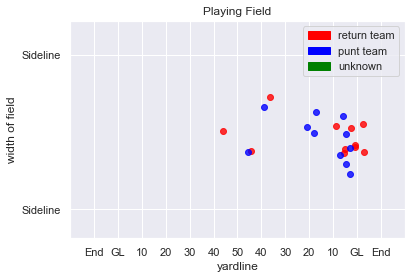

576
Play Description: (13:54) S.Lechler punts 53 yards to MIN 12, Center-J.Weeks. M.Sherels pushed ob at MIN 21 for 9 yards (K.Dillon).


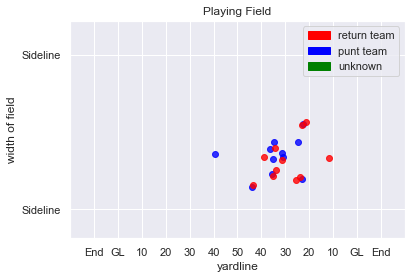

577
Play Description: (10:43) (Punt formation) J.Locke punts 52 yards to HST 10, Center-K.McDermott. T.Ervin to HST 25 for 15 yards (A.Cole).


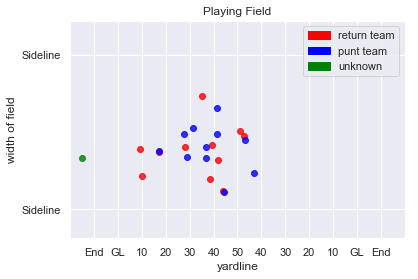

578
Play Description: (8:27) (Punt formation) J.Locke punts 51 yards to HST 11, Center-K.McDermott. W.Fuller to HST 25 for 14 yards (E.Lamur; T.Waynes).


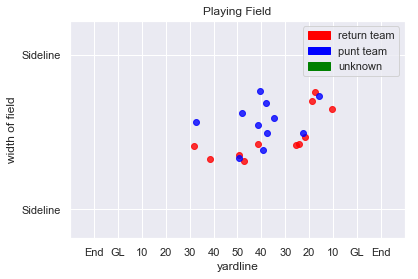

579
Play Description: (11:36) (Punt formation) L.Edwards punts 52 yards to PIT 36, Center-T.Purdum. A.Brown to NYJ 31 for 33 yards (C.Pryor).


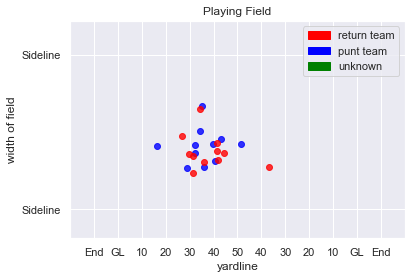

580
Play Description: (9:17) (Punt formation) L.Edwards punts 50 yards to PIT 16, Center-T.Purdum. A.Brown ran ob at PIT 34 for 18 yards (C.Pryor).


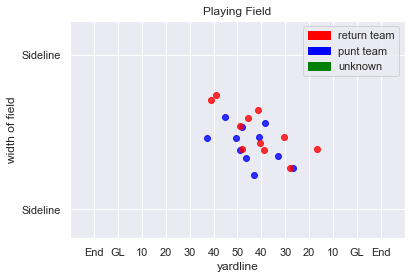

581
Play Description: (2:15) R.Dixon punts 42 yards to ATL 30, Center-C.Kreiter. E.Weems to ATL 37 for 7 yards (S.Keo, Z.Anderson).


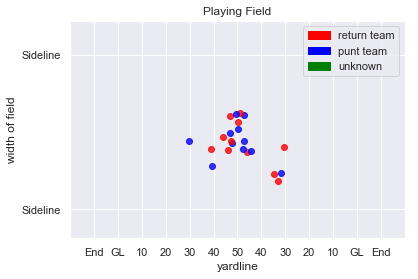

582
Play Description: (:46) M.Bosher punts 58 yards to DEN 26, Center-J.Harris. J.Norwood to DEN 43 for 17 yards (L.Toilolo).


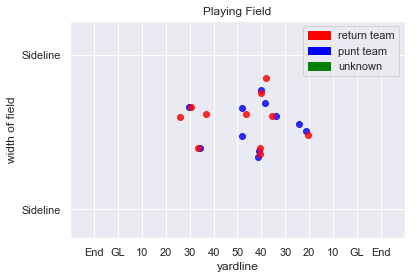

583
Play Description: (8:20) (Punt formation) K.Huber punts 44 yards to DAL 10, Center-C.Harris. L.Whitehead to DAL 20 for 10 yards (M.Flowers).


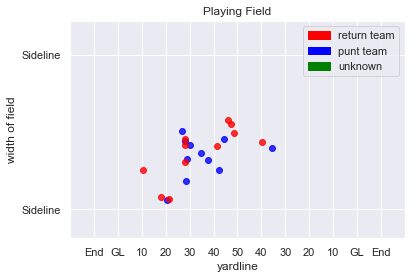

584
Play Description: (7:51) (Punt formation) C.Jones punts 51 yards to CIN 23, Center-L.Ladouceur. A.Jones pushed ob at CIN 23 for no gain (J.Wilcox).


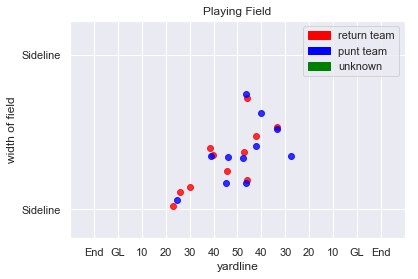

585
Play Description: (12:25) J.Hekker punts 57 yards to BUF 13, Center-J.McQuaide. B.Tate to BUF 11 for -2 yards (M.Thomas).


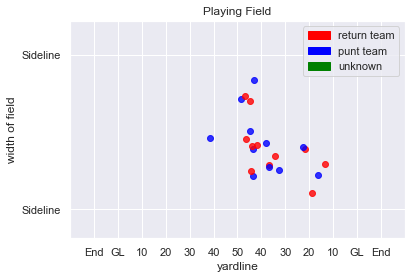

586
Play Description: (6:49) C.Schmidt punts 52 yards to LA 31, Center-G.Sanborn. T.Austin to LA 36 for 5 yards (C.Anderson).


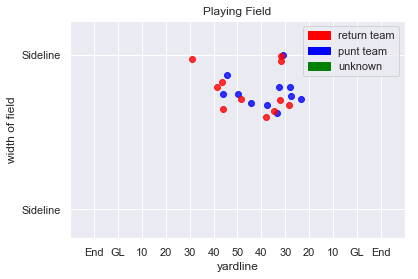

587
Play Description: (5:32) C.Schmidt punts 39 yards to LA 17, Center-G.Sanborn. T.Austin to LA 14 for -3 yards (C.Anderson).


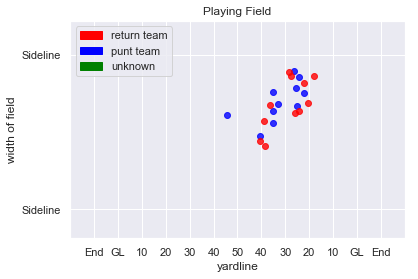

588
Play Description: (1:58) J.Hekker punts 52 yards to BUF 37, Center-J.McQuaide. B.Tate to BUF 37 for no gain (T.Hill).


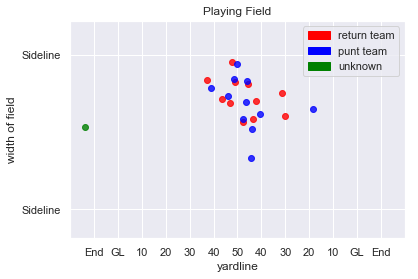

589
Play Description: (4:18) M.King punts 40 yards to SD 27, Center-J.Condo. D.McCluster to SD 33 for 6 yards (S.Calhoun).


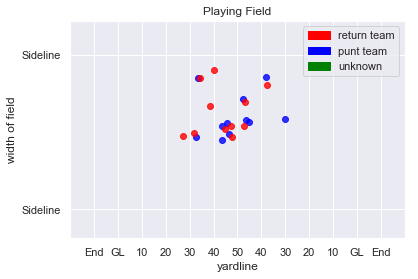

590
Play Description: (:20) M.King punts 51 yards to SD 12, Center-J.Condo. D.McCluster to SD 21 for 9 yards (J.Holton).


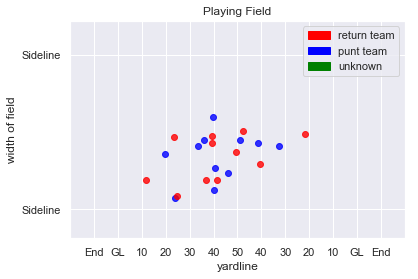

591
Play Description: (1:38) J.Schum punts 42 yards to NYG 33, Center-B.Goode. D.Harris to NYG 39 for 6 yards (C.Banjo).


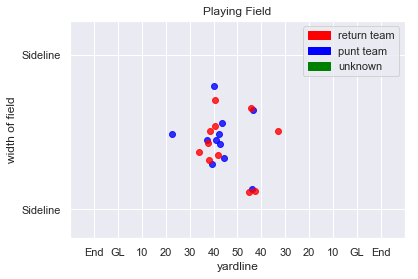

592
Play Description: (3:45) B.Wing punts 40 yards to GB 17, Center-Z.DeOssie. T.Davis to GB 20 for 3 yards (D.Kennard).


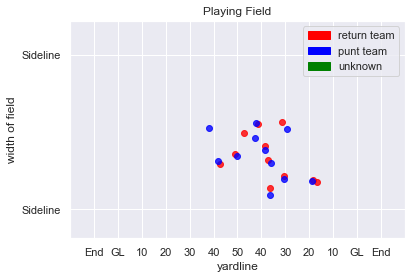

593
Play Description: (7:59) B.Anger punts 46 yards to CAR 26, Center-A.DePaola. T.Ginn pushed ob at CAR 32 for 6 yards (K.Tandy).


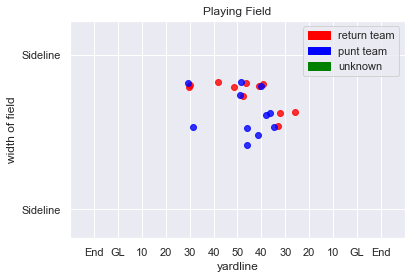

594
Play Description: (3:35) A.Lee punts 52 yards to TB 19, Center-J.Jansen. A.Humphries to TB 31 for 12 yards (J.Norris; E.Dickson).


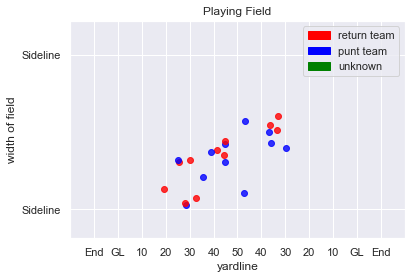

595
Play Description: (3:43) D.Kaser punts 60 yards to DEN 10, Center-M.Windt. J.Norwood to DEN 16 for 6 yards (K.Toomer).


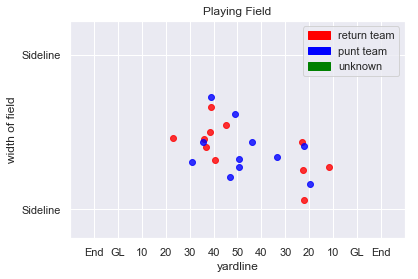

596
Play Description: (2:28) R.Dixon punts 42 yards to SD 33, Center-C.Kreiter. D.McCluster pushed ob at SD 49 for 16 yards (C.Kreiter).


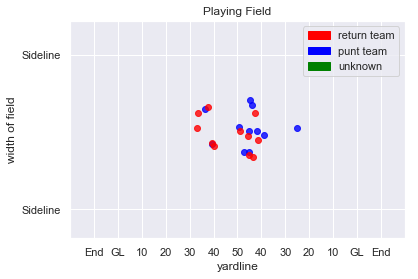

597
Play Description: (13:03) R.Dixon punts 42 yards to SD 42, Center-C.Kreiter. D.McCluster to SD 46 for 4 yards (K.Webster).


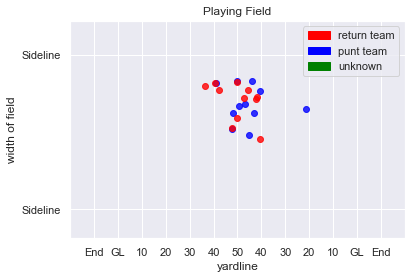

598
Play Description: (6:34) R.Dixon punts 42 yards to SD 28, Center-C.Kreiter. D.McCluster to SD 36 for 8 yards (C.Nelson).


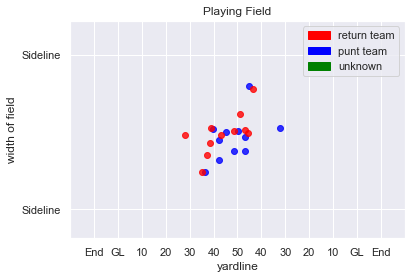

599
Play Description: (6:00) D.Kaser punts 59 yards to DEN 27, Center-M.Windt. J.Norwood to DEN 37 for 10 yards (T.Williams).


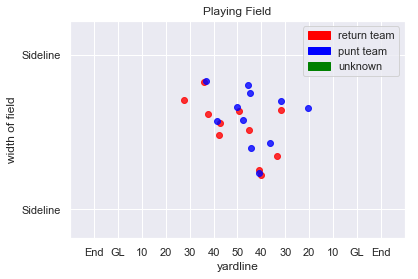

600
Play Description: (3:14) D.Kaser punts 47 yards to DEN 15, Center-M.Windt. A.Talib to DEN 16 for 1 yard (D.Stuckey).


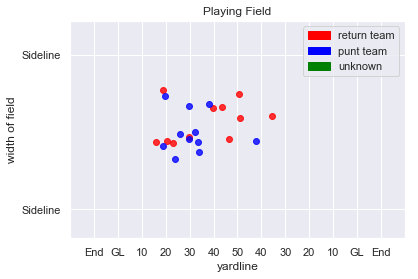

601
Play Description: (13:21) C.Schmidt punts 54 yards to SF 19, Center-G.Sanborn. J.Kerley to SF 31 for 12 yards (M.Gillislee).


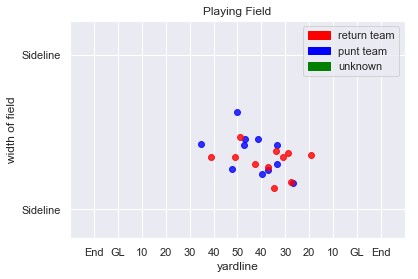

602
Play Description: (7:54) B.Pinion punts 47 yards to BUF 32, Center-K.Nelson. B.Tate pushed ob at BUF 45 for 13 yards (S.Skov).


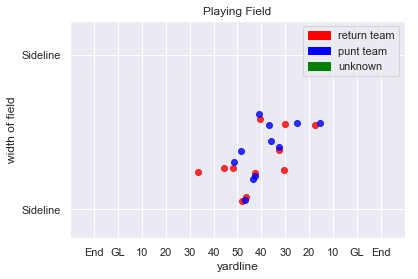

603
Play Description: (9:18) B.Pinion punts 48 yards to BUF 34, Center-K.Nelson. B.Tate pushed ob at BUF 37 for 3 yards (A.Burbridge). PENALTY on BUF-L.McCray, Illegal Block Above the Waist, 10 yards, enforced at BUF 37.


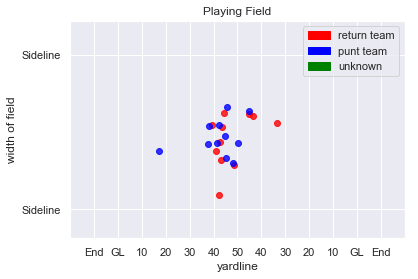

604
Play Description: (12:11) (Punt formation) B.Nortman punts 60 yards to CHI 9, Center-C.Tinker. E.Royal to CHI 14 for 5 yards (H.Pullard).


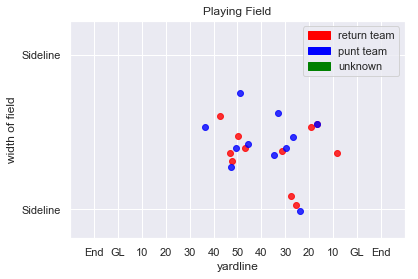

605
Play Description: (14:02) (Punt formation) B.Nortman punts 58 yards to CHI 19, Center-C.Tinker. E.Royal to CHI 30 for 11 yards (M.Jack). PENALTY on CHI-J.Glenn, Illegal Block Above the Waist, 10 yards, enforced at CHI 19.


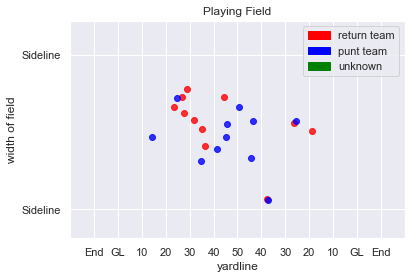

606
Play Description: (12:05) (Punt formation) P.O'Donnell punts 50 yards to JAX 18, Center-P.Scales. M.Lee to JAX 21 for 3 yards (J.Bellamy).


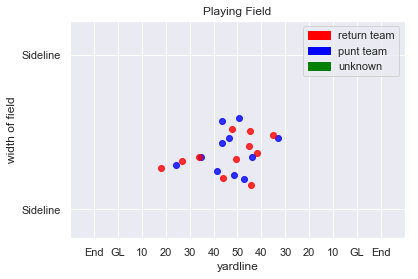

607
Play Description: (10:23) (Punt formation) B.Nortman punts 53 yards to CHI 19, Center-C.Tinker. E.Royal pushed ob at CHI 28 for 9 yards (A.Benn).


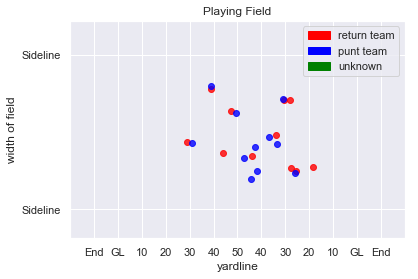

608
Play Description: (5:07) S.Martin punts 56 yards to LA 18, Center-D.Muhlbach. T.Austin to LA 20 for 2 yards (T.Armbrister).


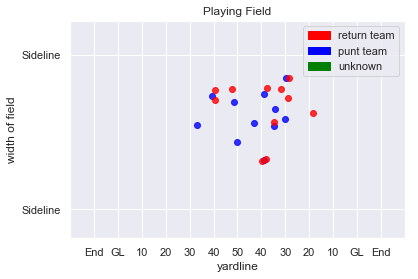

609
Play Description: (5:13) J.Hekker punts 40 yards to DET 35, Center-J.McQuaide. A.Roberts to DET 39 for 4 yards (C.Reynolds).


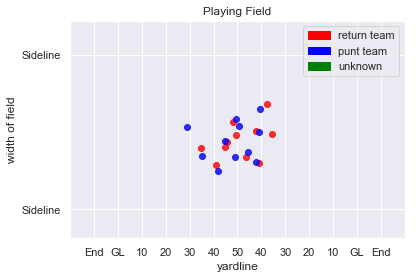

610
Play Description: (12:22) (Punt formation) J.Berry punts 38 yards to MIA 24, Center-G.Warren. J.Landry pushed ob at MIA 35 for 11 yards (S.Johnson).


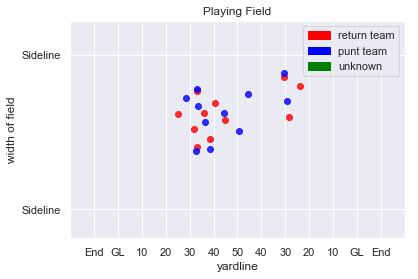

611
Play Description: (:39) (Punt formation) J.Berry punts 49 yards to MIA 33, Center-G.Warren. J.Grant to MIA 48 for 15 yards (T.Matakevich). PIT-V.Williams was injured during the play. His return is Questionable. 


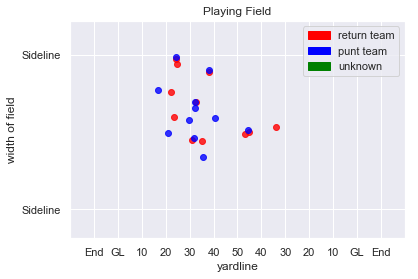

612
Play Description: (6:47) R.Allen punts 44 yards to CIN 39, Center-J.Cardona. A.Erickson pushed ob at CIN 40 for 1 yard (B.King).


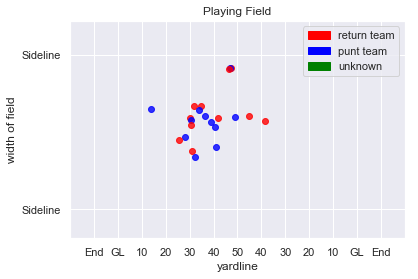

613
Play Description: (:07) K.Huber punts 52 yards to NE 23, Center-C.Harris. J.Edelman to NE 40 for 17 yards (N.Vigil).


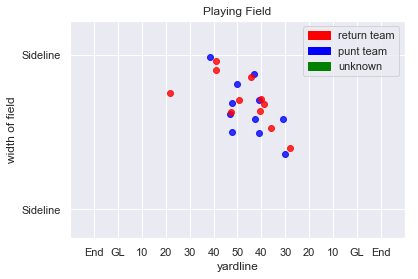

614
Play Description: (8:22) R.Allen punts 52 yards to CIN 5, Center-J.Cardona. A.Erickson to CIN 16 for 11 yards (N.Ebner; J.Cardona).


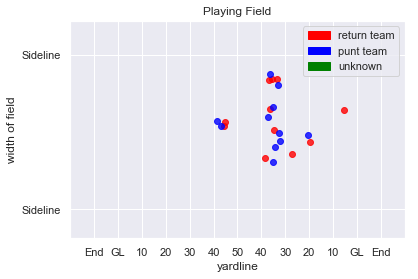

615
Play Description: (4:44) K.Huber punts 37 yards to NE 38, Center-C.Harris. J.Edelman to NE 47 for 9 yards (V.Rey; T.Kroft).


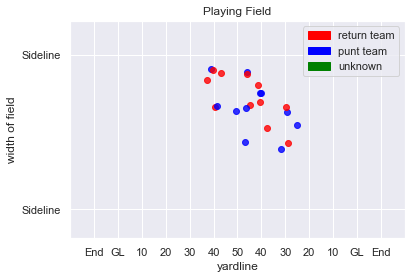

616
Play Description: (3:43) K.Huber punts 45 yards to NE 27, Center-C.Harris. J.Edelman to 50 for 23 yards (C.Fejedelem).


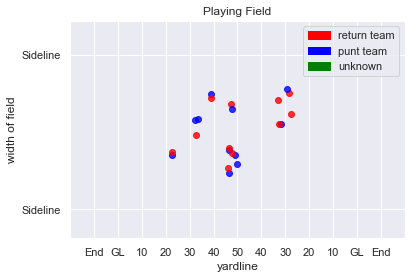

617
Play Description: (4:24) T.Morstead punts 61 yards to CAR 27, Center-J.Drescher. T.Ginn to CAR 40 for 13 yards (J.Lampman).


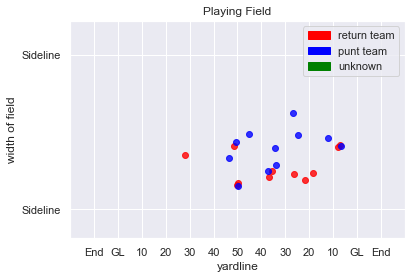

618
Play Description: (:52) A.Lee punts 61 yards to NO 12, Center-J.Jansen. T.Lewis to CAR 29 for 59 yards (A.Lee).


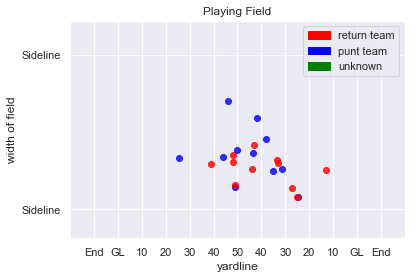

619
Play Description: (2:37) T.Morstead punts 48 yards to CAR 33, Center-J.Drescher. T.Ginn to CAR 37 for 4 yards (J.Lampman).


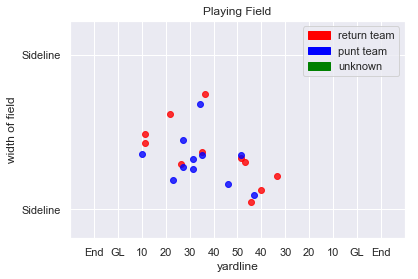

620
Play Description: (13:34) A.Lee punts 54 yards to NO 8, Center-J.Jansen. T.Lewis pushed ob at NO 12 for 4 yards (M.Griffin).


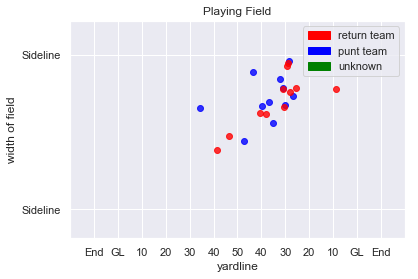

621
Play Description: (11:56) T.Morstead punts 48 yards to CAR 36, Center-J.Drescher. T.Ginn to CAR 40 for 4 yards (J.Lampman).


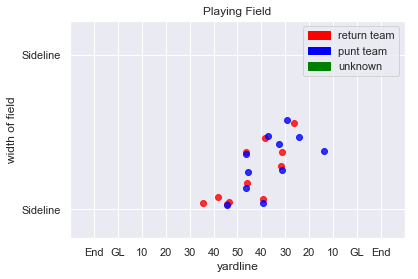

622
Play Description: (1:07) T.Morstead punts 54 yards to CAR 39, Center-J.Drescher. T.Ginn to 50 for 11 yards (D.Lasco).


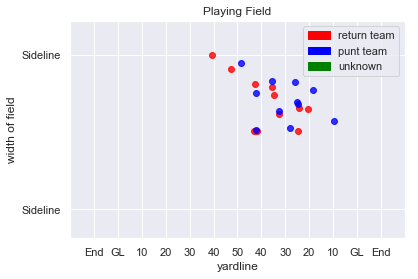

623
Play Description: (6:00) B.Wing punts 48 yards to BLT 25, Center-Z.DeOssie. L.Webb to BLT 28 for 3 yards (B.Rainey). PENALTY on NYG-Z.DeOssie, Illegal Use of Hands, 10 yards, enforced at BLT 28.


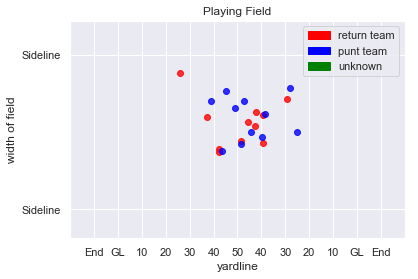

624
Play Description: (7:21) S.Koch punts 60 yards to NYG 15, Center-M.Cox. D.Harris to NYG 20 for 5 yards (P.Onwuasor, M.Cox).


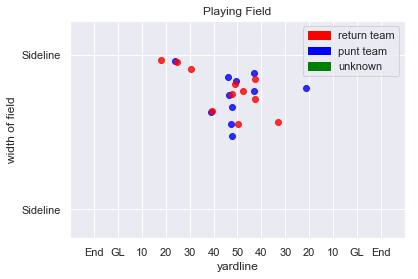

625
Play Description: (1:09) S.Koch punts 34 yards to NYG 23, Center-M.Cox. D.Harris to NYG 23 for no gain (D.Waller). NYG-D.Harris was injured during the play. NYG-T.Wade was injured during the play.  PENALTY on BLT-M.Huff, Illegal Block Above the Waist, 10 yards, enforced at NYG 23.


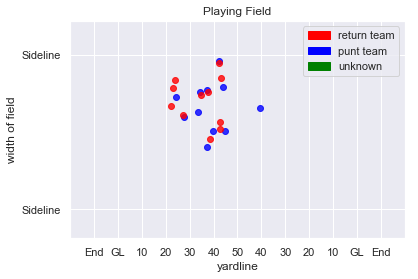

626
Play Description: (6:03) S.Koch punts 55 yards to NYG 5, Center-M.Cox. D.Harris to NYG 11 for 6 yards (M.Huff).


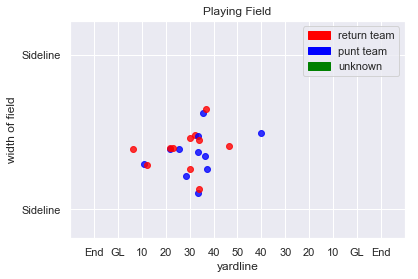

627
Play Description: (7:18) (Punt formation) B.Kern punts 47 yards to CLV 21, Center-B.Brinkley. D.Johnson pushed ob at TEN 26 for 53 yards (J.Fowler). PENALTY on CLV-R.Higgins, Illegal Block Above the Waist, 10 yards, enforced at CLV 21.


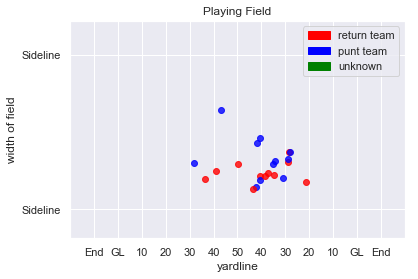

628
Play Description: (:52) (Punt formation) B.Kern punts 51 yards to CLV 16, Center-B.Brinkley. D.Johnson to CLV 22 for 6 yards (A.Andrews).


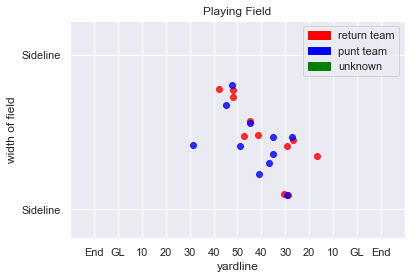

629
Play Description: (14:19) (Punt formation) B.Colquitt punts 49 yards to TEN 34, Center-C.Hughlett. M.Mariani to TEN 41 for 7 yards (J.Schobert; D.Alexander).


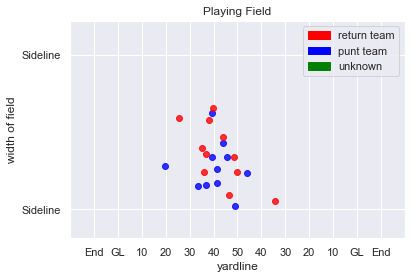

630
Play Description: (10:11) (Punt formation) B.Colquitt punts 44 yards to TEN 45, Center-C.Hughlett. M.Mariani to TEN 49 for 4 yards (J.Poyer).


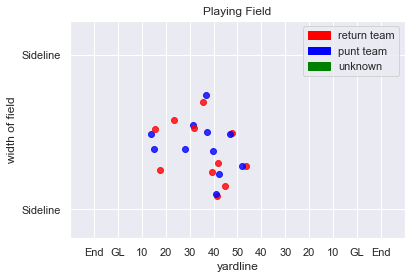

631
Play Description: (6:49) (Punt formation) B.Colquitt punts 45 yards to TEN 44, Center-C.Hughlett. M.Mariani to CLV 46 for 10 yards (T.Carder). PENALTY on TEN-A.Andrews, Illegal Blindside Block, 15 yards, enforced at TEN 45.


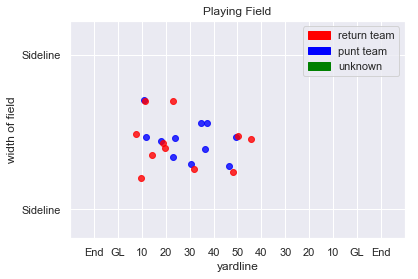

632
Play Description: (13:21) (Punt formation) B.Colquitt punts 54 yards to TEN 20, Center-C.Hughlett. M.Mariani to TEN 30 for 10 yards (T.Carder).


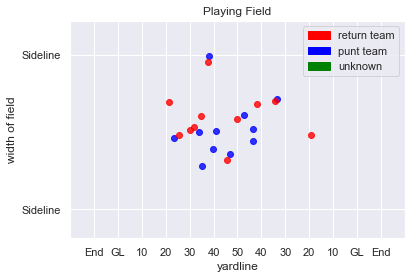

633
Play Description: (8:01) (Punt formation) B.Colquitt punts 52 yards to TEN 19, Center-C.Hughlett. M.Mariani pushed ob at TEN 27 for 8 yards (T.Howard).


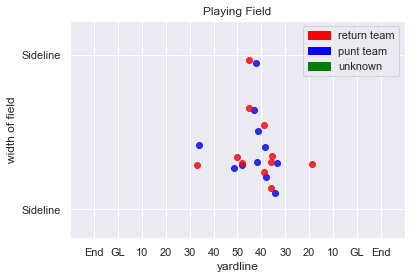

634
Play Description: (11:26) D.Jones punts 41 yards to WAS 17, Center-J.Dorenbos. J.Crowder to WAS 21 for 4 yards (J.Huff).


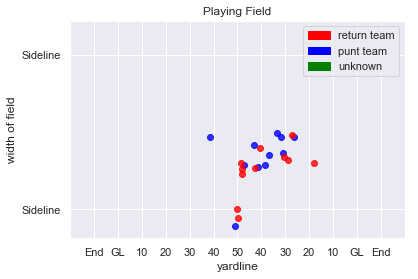

635
Play Description: (7:13) D.Jones punts 55 yards to WAS 25, Center-J.Dorenbos. J.Crowder to WAS 35 for 10 yards (K.Grugier-Hill). PENALTY on WAS-M.Spaight, Illegal Block Above the Waist, 10 yards, enforced at WAS 33.


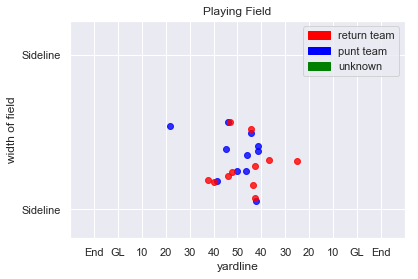

636
Play Description: (5:18) T.Way punts 48 yards to PHI 21, Center-N.Sundberg. D.Sproles pushed ob at PHI 35 for 14 yards (M.Spaight).


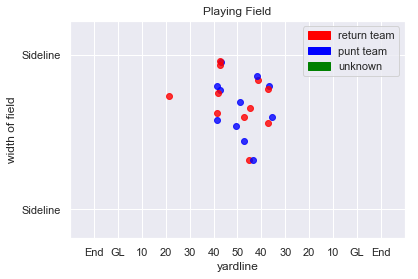

637
Play Description: (4:10) D.Jones punts 47 yards to WAS 14, Center-J.Dorenbos. J.Crowder to WAS 15 for 1 yard (J.Huff; C.Maragos).


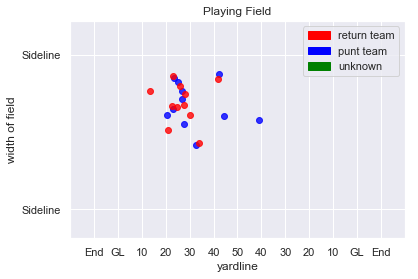

638
Play Description: (1:57) T.Way punts 50 yards to PHI 7, Center-N.Sundberg. D.Sproles pushed ob at PHI 10 for 3 yards (H.Bates).


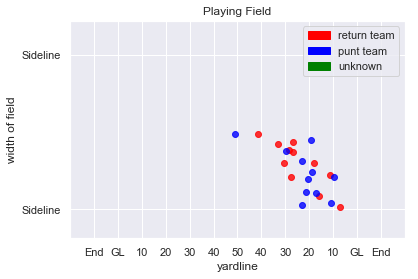

639
Play Description: (4:17) T.Way punts 58 yards to PHI 16, Center-N.Sundberg. D.Sproles to PHI 30 for 14 yards (M.Spaight; W.Compton).


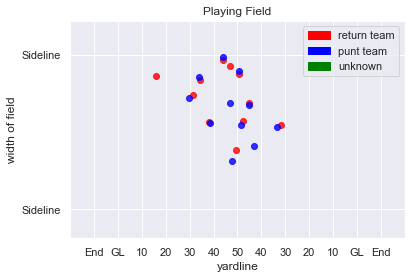

640
Play Description: (8:39) D.Colquitt punts 40 yards to OAK 15, Center-J.Winchester. T.Carrie pushed ob at OAK 19 for 4 yards (T.Hill).


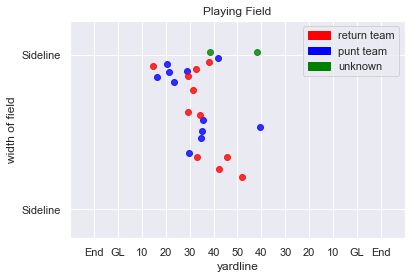

641
Play Description: (10:53) M.King punts 58 yards to KC 9, Center-J.Condo. T.Hill to OAK 41 for 50 yards (B.Trawick). PENALTY on OAK, Illegal Formation, 5 yards, enforced at OAK 41.


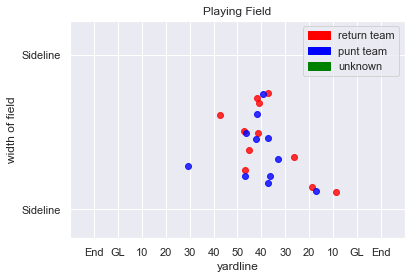

642
Play Description: (3:43) D.Colquitt punts 46 yards to OAK 20, Center-J.Winchester. T.Carrie to OAK 29 for 9 yards (J.O'Shaughnessy).


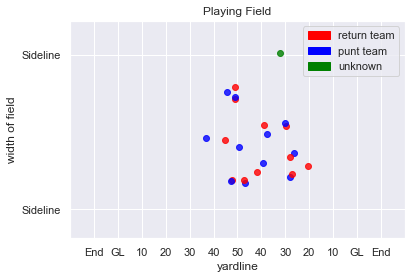

643
Play Description: (1:51) C.Jones punts 41 yards to GB 21, Center-L.Ladouceur. T.Davis to GB 46 for 25 yards (K.Smith).


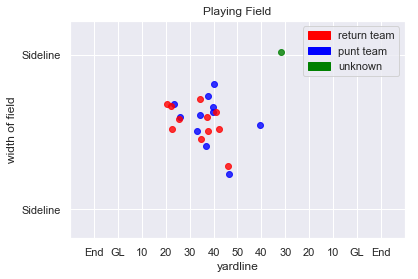

644
Play Description: (15:00) M.Bosher punts 44 yards to SEA 17, Center-J.Harris. T.Lockett to SEA 19 for 2 yards (E.Weems; L.Toilolo).


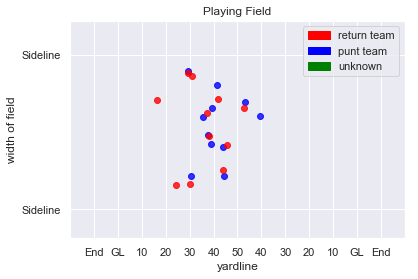

645
Play Description: (2:09) M.Bosher punts 39 yards to SEA 46, Center-J.Harris. T.Lockett pushed ob at 50 for 4 yards (C.Goodwin). PENALTY on ATL-T.Gabriel, Player Out of Bounds on Punt, 5 yards, enforced at 50.


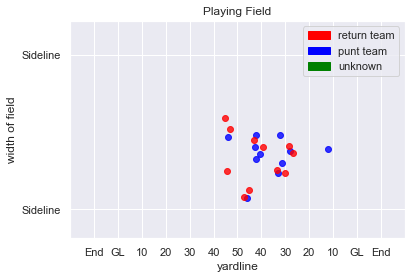

646
Play Description: (9:44) J.Ryan punts 58 yards to ATL 10, Center-N.Frese. E.Weems pushed ob at ATL 21 for 11 yards (K.Pierre-Louis).


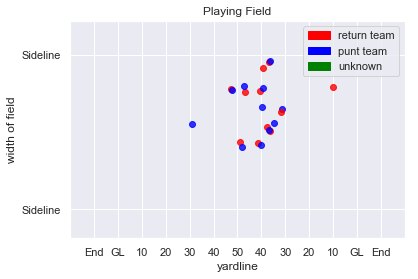

647
Play Description: (8:46) M.Bosher punts 45 yards to SEA 25, Center-J.Harris. T.Lockett to SEA 40 for 15 yards (E.Weems; L.Reynolds). PENALTY on SEA-K.Pierre-Louis, Illegal Block Above the Waist, 10 yards, enforced at SEA 40.


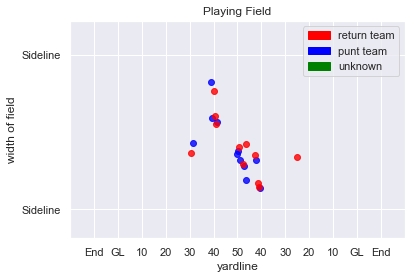

648
Play Description: (13:24) S.Lechler punts 41 yards to IND 39, Center-J.Weeks. Q.Bray to IND 46 for 7 yards (C.James).


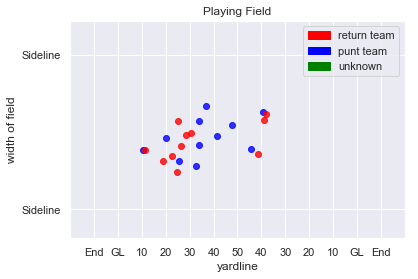

649
Play Description: (12:33) S.Lechler punts 52 yards to IND 10, Center-J.Weeks. C.Rogers to IND 16 for 6 yards (T.Ervin).


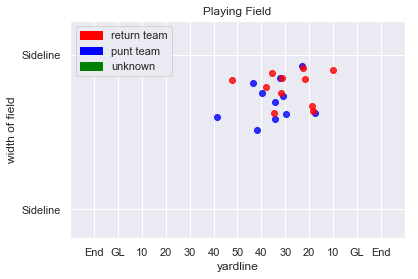

650
Play Description: (2:00) P.McAfee punts 49 yards to HST 41, Center-M.Overton. T.Ervin pushed ob at HST 47 for 6 yards (E.Jackson).


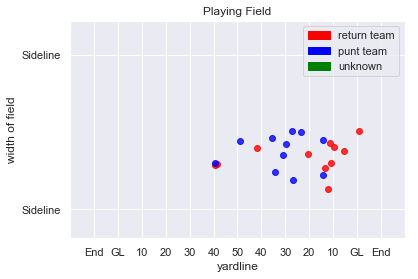

651
Play Description: (11:42) P.McAfee punts 41 yards to HST 16, Center-M.Overton. T.Ervin to HST 33 for 17 yards (J.McNary; M.Farley). HST-K.Dillon was injured during the play. 


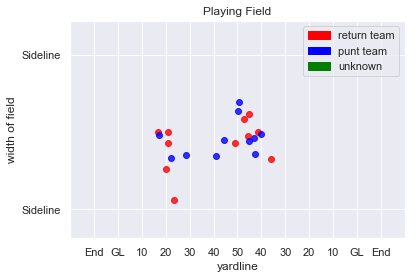

652
Play Description: (7:30) L.Edwards punts 49 yards to ARZ 18, Center-T.Purdum. Jo.Brown to ARZ 24 for 6 yards (B.Carter).


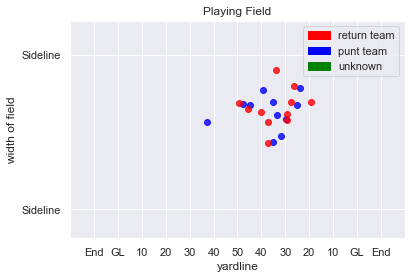

653
Play Description: (2:03) L.Edwards punts 49 yards to ARZ 35, Center-T.Purdum. Jo.Brown to ARZ 32 for -3 yards (C.Peake).


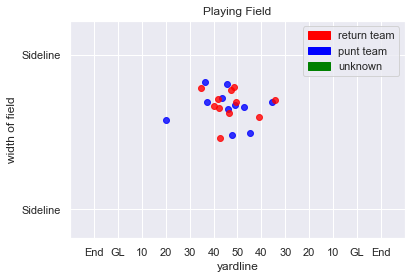

654
Play Description: (13:10) L.Edwards punts 38 yards to ARZ 31, Center-T.Purdum. P.Peterson to ARZ 32 for 1 yard (J.Burris).


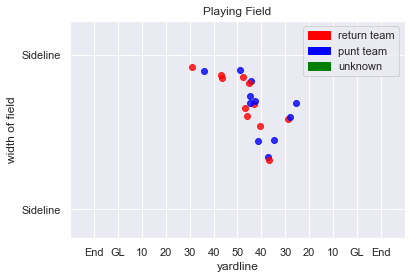

655
Play Description: (1:33) (Punt formation) J.Hekker punts 60 yards to NYG 30, Center-J.McQuaide. D.Harris to NYG 39 for 9 yards (B.Hager).


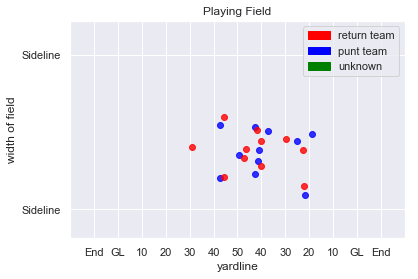

656
Play Description: (:49) (Punt formation) B.Wing punts 47 yards to LA 11, Center-Z.DeOssie. T.Austin to LA 23 for 12 yards (O.Darkwa).


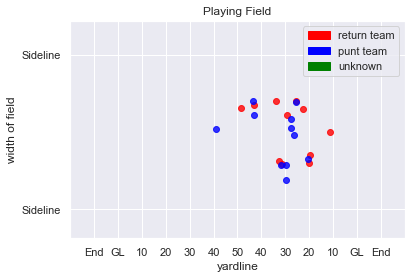

657
Play Description: (:12) (Punt formation) J.Hekker punts 47 yards to NYG 15, Center-J.McQuaide. D.Harris to NYG 18 for 3 yards (C.Littleton). NYG-D.Harris was injured during the play. His return is Probable. 


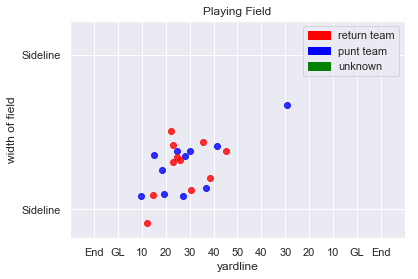

658
Play Description: (11:20) (Punt formation) J.Hekker punts 50 yards to NYG 10, Center-J.McQuaide. O.Beckham to NYG 10 for no gain (C.Reynolds; B.Marquez). PENALTY on NYG-C.Sensabaugh, Defensive Holding, 5 yards, enforced at NYG 10.


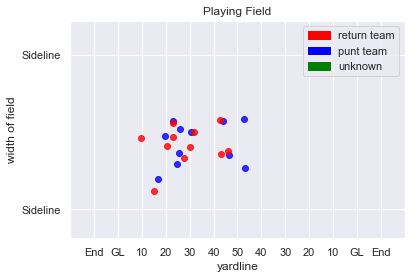

659
Play Description: (14:55) (Punt formation) J.Hekker punts 57 yards to NYG 10, Center-J.McQuaide. D.Harris to NYG 11 for 1 yard (C.Davis).


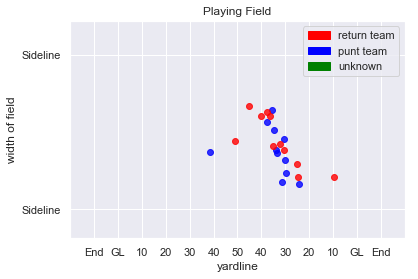

660
Play Description: (12:35) (Punt formation) B.Wing punts 46 yards to LA 13, Center-Z.DeOssie. T.Austin ran ob at LA 32 for 19 yards (J.Casillas).


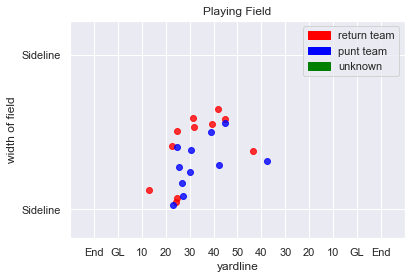

661
Play Description: (12:11) K.Huber punts 48 yards to CLV 27, Center-C.Harris. D.Johnson Jr. to CLV 30 for 3 yards (J.Wright; R.Burkhead).


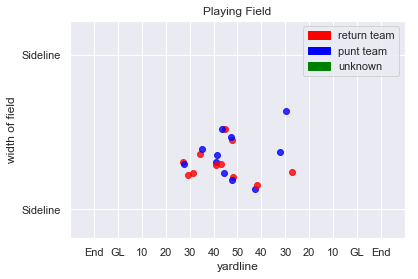

662
Play Description: (15:00) B.Colquitt punts 54 yards to CIN 9, Center-C.Hughlett. A.Erickson to CIN 9 for no gain (J.Schobert). PENALTY on CIN-J.Wright, Unsportsmanlike Conduct, 5 yards, enforced at CIN 9.


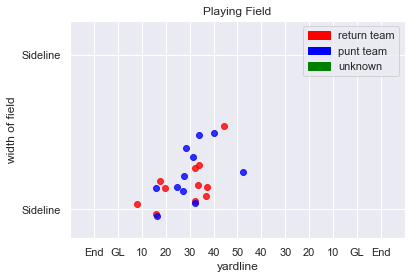

663
Play Description: (3:28) S.Martin punts 58 yards to WAS 13, Center-D.Muhlbach. W.Blackmon to WAS 29 for 16 yards (Z.Zenner).


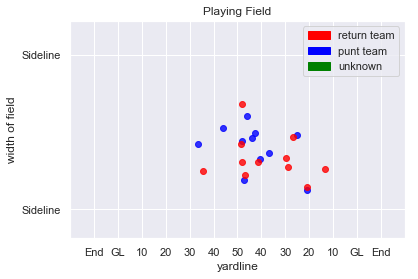

664
Play Description: (13:37) M.King punts 57 yards to JAX 14, Center-J.Condo. R.Greene to JAX 22 for 8 yards (N.Allen; J.Holton).


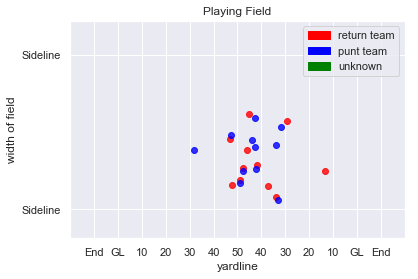

665
Play Description: (12:34) B.Nortman punts 56 yards to OAK 20, Center-C.Tinker. J.Richard to OAK 30 for 10 yards (D.Robinson).


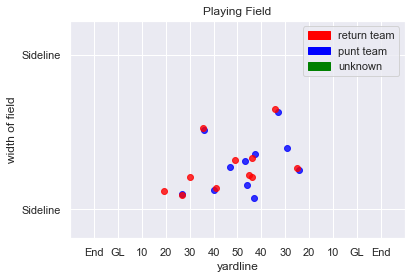

666
Play Description: (9:38) M.King punts 60 yards to JAX 1, Center-J.Condo. R.Greene to JAX 7 for 6 yards (J.Holton).


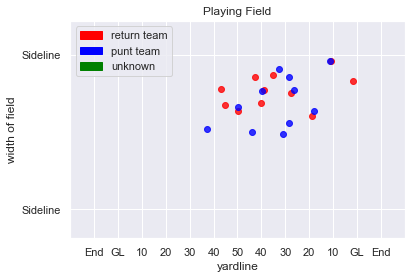

667
Play Description: (8:19) B.Nortman punts 55 yards to OAK 36, Center-C.Tinker. J.Richard to OAK 41 for 5 yards (A.Brown).


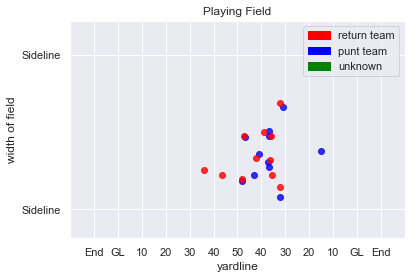

668
Play Description: (6:54) M.King punts 60 yards to JAX 13, Center-J.Condo. R.Greene to JAX 22 for 9 yards (J.Holton). PENALTY on JAX-J.Ramsey, Offensive Holding, 7 yards, enforced at JAX 13.


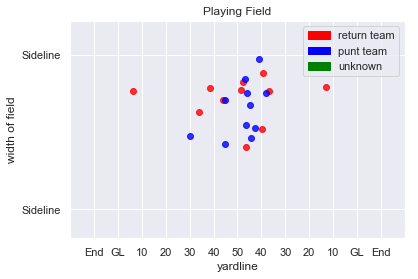

669
Play Description: (4:55) B.Nortman punts 42 yards to JAX 47, Center-C.Tinker. J.Richard to JAX 37 for 10 yards (J.Wilson; P.Thompson).


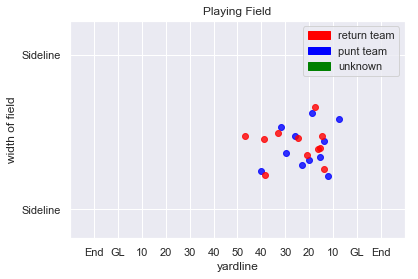

670
Play Description: (:33) B.Nortman punts 42 yards to OAK 38, Center-C.Tinker. J.Richard to JAX 20 for 42 yards (J.Wilson). Penalty on OAK-A.Hamilton, Offensive Holding, declined. PENALTY on OAK-S.Calhoun, Offensive Holding, 10 yards, enforced at OAK 38.


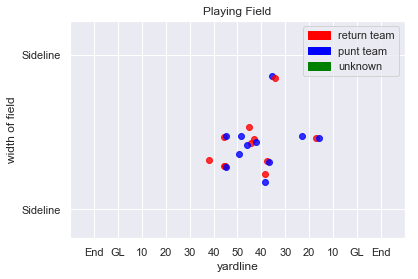

671
Play Description: (9:33) B.Nortman punts 44 yards to OAK 16, Center-C.Tinker. J.Richard to OAK 32 for 16 yards (J.Wilson).


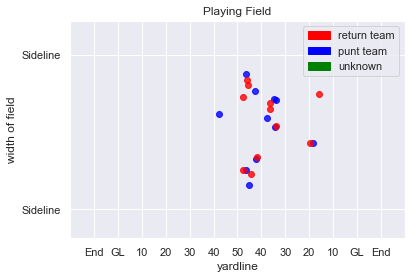

672
Play Description: (7:26) M.King punts 56 yards to JAX 11, Center-J.Condo. R.Greene to JAX 17 for 6 yards (J.Holton).


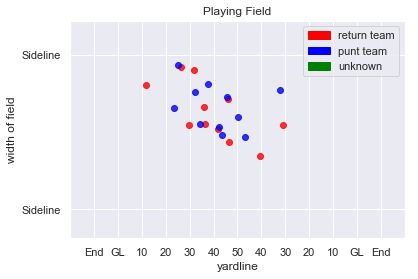

673
Play Description: (4:55) T.Morstead punts 49 yards to KC 11, Center-J.Drescher. T.Hill to KC 11 for no gain (B.Dixon).


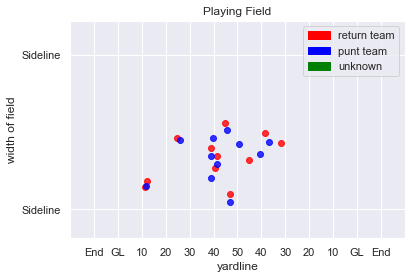

674
Play Description: (12:21) D.Colquitt punts 39 yards to NO 22, Center-J.Winchester. T.Lewis pushed ob at NO 33 for 11 yards (J.Winchester).


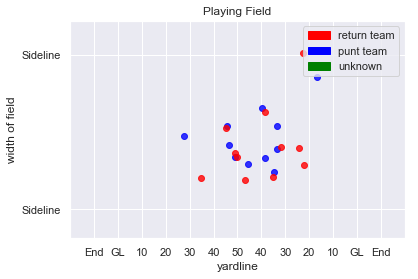

675
Play Description: (4:49) (Punt formation) C.Schmidt punts 45 yards to MIA 22, Center-G.Sanborn. J.Grant to MIA 25 for 3 yards (M.Gillislee). PENALTY on MIA-W.Aikens, Offensive Holding, 10 yards, enforced at MIA 22.


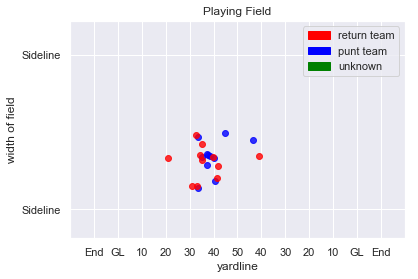

676
Play Description: (3:01) (Punt formation) M.Darr punts 45 yards to BUF 40, Center-J.Denney. B.Tate to MIA 30 for 30 yards (W.Aikens).


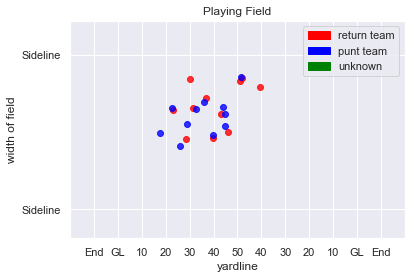

677
Play Description: (12:53) (Punt formation) C.Schmidt punts 47 yards to MIA 23, Center-G.Sanborn. J.Grant to MIA 31 for 8 yards (R.Blanton).


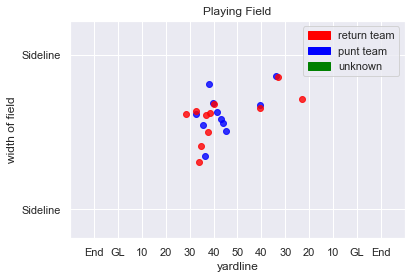

678
Play Description: (7:42) (Punt formation) C.Schmidt punts 43 yards to MIA 29, Center-G.Sanborn. J.Grant pushed ob at MIA 32 for 3 yards (M.Gillislee).


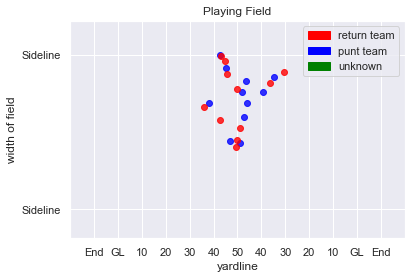

679
Play Description: (7:55) (Punt formation) C.Schmidt punts 57 yards to MIA 28, Center-G.Sanborn. J.Landry to MIA 36 for 8 yards (L.Alexander).


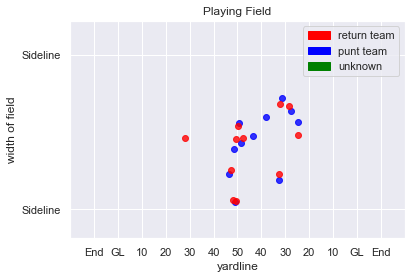

680
Play Description: (3:38) (Punt formation) C.Schmidt punts 54 yards to MIA 21, Center-G.Sanborn. J.Landry to MIA 30 for 9 yards (R.Humber; G.Sanborn).


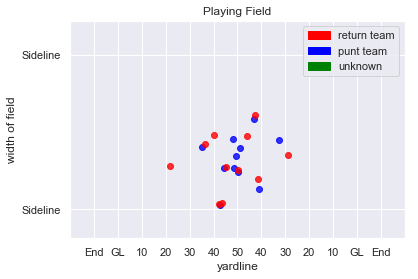

681
Play Description: (12:52) S.Koch punts 59 yards to NYJ 5, Center-M.Cox. J.Marshall to NYJ 9 for 4 yards (M.Huff).


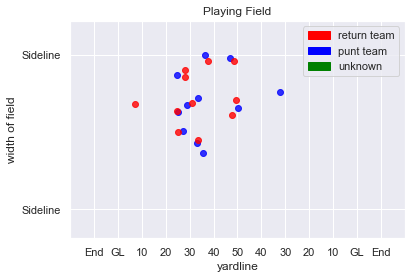

682
Play Description: (14:57) S.Koch punts 59 yards to NYJ 11, Center-M.Cox. J.Marshall pushed ob at NYJ 27 for 16 yards (Z.Orr).


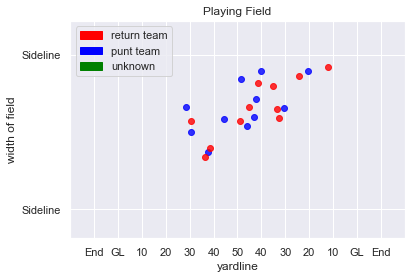

683
Play Description: (7:49) L.Edwards punts 52 yards to BLT 19, Center-T.Purdum. D.Hester to BLT 19 for no gain (C.Peake; J.Martin).


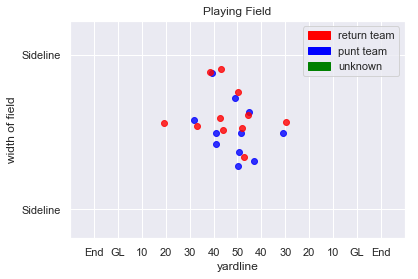

684
Play Description: (6:21) S.Koch punts 48 yards to NYJ 34, Center-M.Cox. J.Marshall to NYJ 32 for -2 yards (D.Waller).


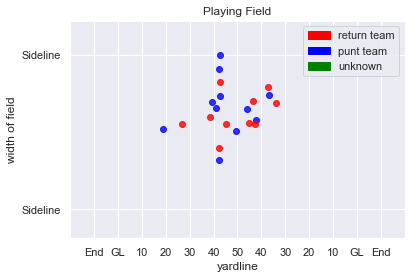

685
Play Description: (13:18) D.Jones punts 60 yards to MIN 10, Center-J.Dorenbos. M.Sherels to MIN 19 for 9 yards (T.Burton).


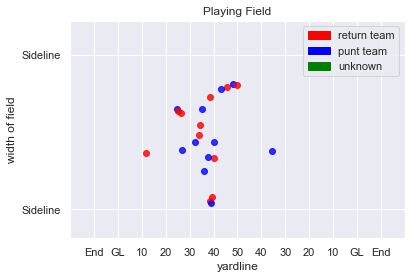

686
Play Description: (3:27) (Punt formation) B.Kern punts 49 yards to IND 21, Center-B.Brinkley. C.Rogers to IND 28 for 7 yards (B.Brinkley). PENALTY on IND-P.Robinson, Offensive Holding, 10 yards, enforced at IND 28.


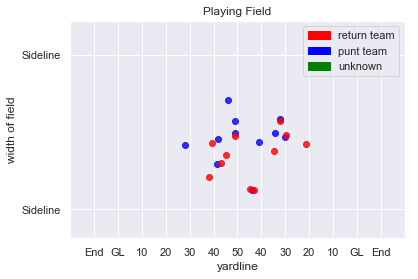

687
Play Description: (2:21) (Punt formation) P.McAfee punts 60 yards to TEN 17, Center-M.Overton. M.Mariani to TEN 24 for 7 yards (J.Todman; M.Farley).


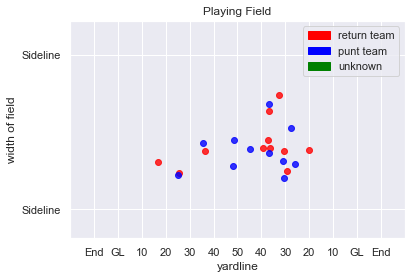

688
Play Description: (10:01) (Punt formation) B.Kern punts 62 yards to IND 1, Center-B.Brinkley. C.Rogers ran ob at IND 12 for 11 yards.


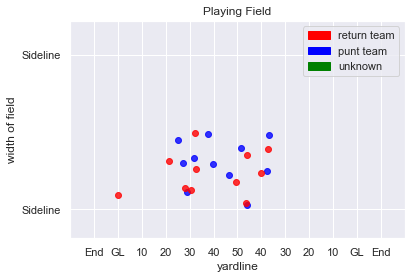

689
Play Description: (12:21) (Punt formation) D.Kaser punts 48 yards to ATL 34, Center-M.Windt. E.Weems to ATL 43 for 9 yards (To.Williams; J.Perry). PENALTY on ATL-J.Hardy, Offensive Holding, 10 yards, enforced at ATL 34.


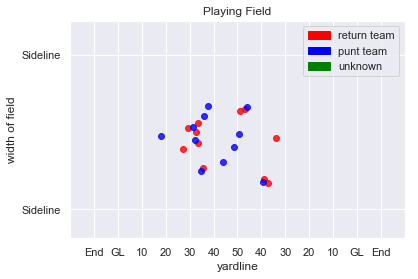

690
Play Description: (13:02) (Punt formation) J.Berry punts 45 yards to NE 22, Center-G.Warren. J.Edelman to NE 32 for 10 yards (T.Matakevich).


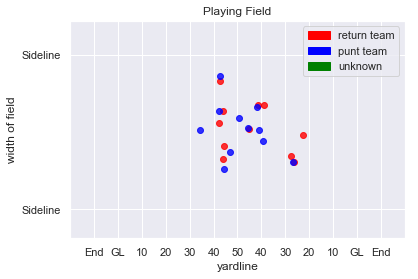

691
Play Description: (5:29) (Punt formation) J.Berry punts 52 yards to NE 31, Center-G.Warren. D.Amendola to NE 37 for 6 yards (S.Johnson).


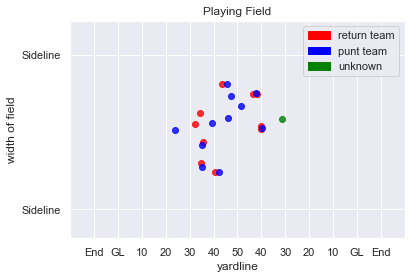

692
Play Description: (:40) J.Ryan punts 41 yards to SEA 46, Center-N.Frese. P.Peterson to SEA 33 for 13 yards (K.McCray).


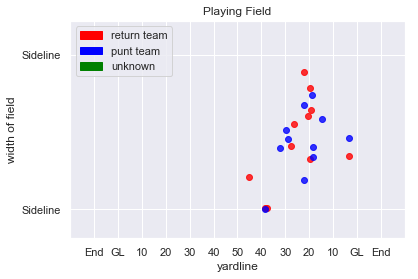

693
Play Description: (11:48) J.Ryan punts 45 yards to ARZ 11, Center-N.Frese. B.Golden to ARZ 19 for 8 yards (D.Elliott).


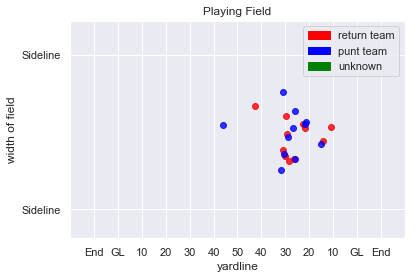

694
Play Description: (1:40) J.Ryan punts 58 yards to ARZ 18, Center-N.Frese. B.Golden to ARZ 25 for 7 yards (N.Thorpe).


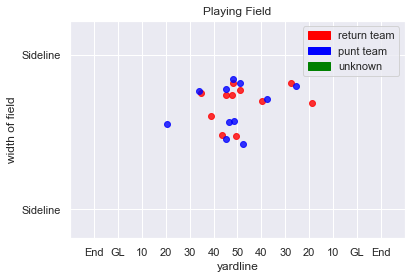

695
Play Description: (2:57) J.Ryan punts 53 yards to ARZ 22, Center-N.Frese. B.Golden to ARZ 20 for -2 yards (D.Elliott).


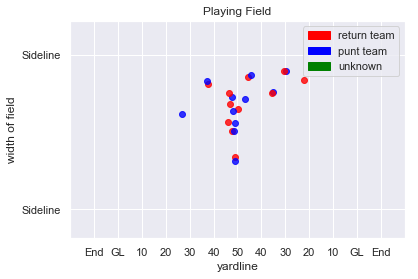

696
Play Description: (7:23) J.Ryan punts 54 yards to ARZ 32, Center-N.Frese. B.Golden to ARZ 39 for 7 yards (D.McDonald).


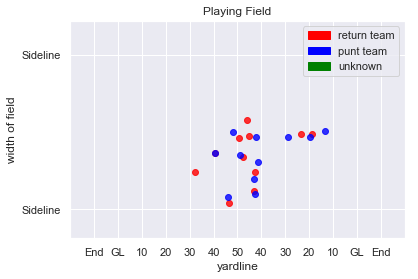

697
Play Description: (1:16) R.Quigley punts 31 yards to SEA 23, Center-A.Brewer. T.Lockett to SEA 23 for no gain (J.Bethel).


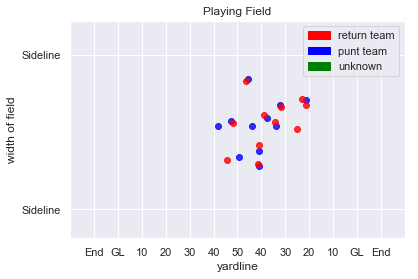

698
Play Description: (13:49) S.Lechler punts 62 yards to DEN 8, Center-J.Weeks. J.Norwood to DEN 24 for 16 yards (M.Bullough).


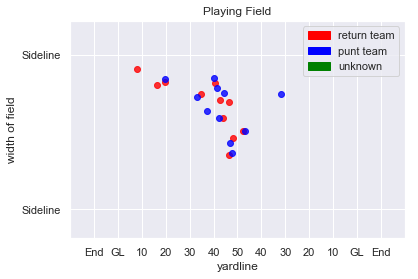

699
Play Description: (12:44) R.Dixon punts 46 yards to HST 30, Center-C.Kreiter. T.Ervin to HST 40 for 10 yards (C.Nelson).


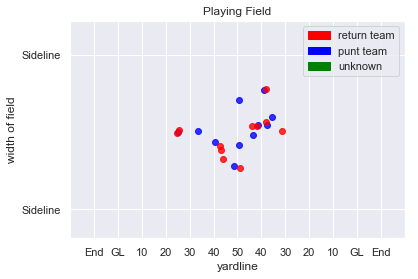

700
Play Description: (9:38) R.Dixon punts 43 yards to HST 41, Center-C.Kreiter. T.Ervin to HST 42 for 1 yard (C.Nelson).


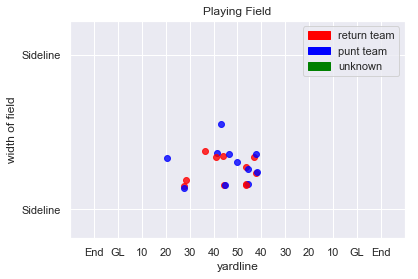

701
Play Description: (7:41) S.Lechler punts 48 yards to DEN 28, Center-J.Weeks. J.Norwood to DEN 32 for 4 yards (D.Jones).


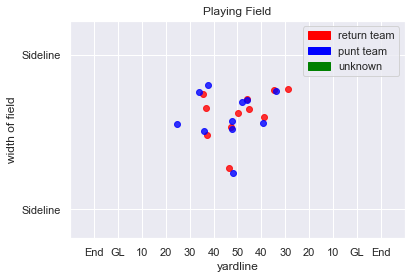

702
Play Description: (1:04) S.Lechler punts 58 yards to DEN 10, Center-J.Weeks. J.Norwood to DEN 23 for 13 yards (R.Nelson).


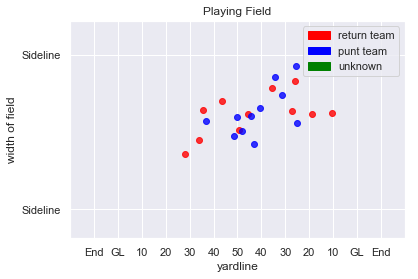

703
Play Description: (9:17) (Punt formation) B.Nortman punts 56 yards to TEN 23, Center-C.Tinker. M.Mariani to TEN 32 for 9 yards (J.Wilson; H.Pullard).


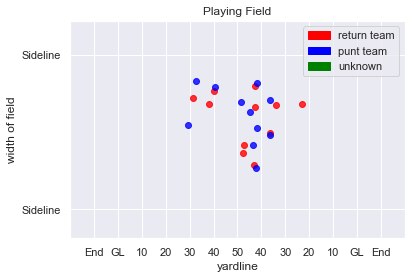

704
Play Description: (5:29) (Punt formation) B.Kern punts 34 yards to JAX 42, Center-B.Brinkley. B.Walters to JAX 42 for no gain (K.Byard; S.Spence).


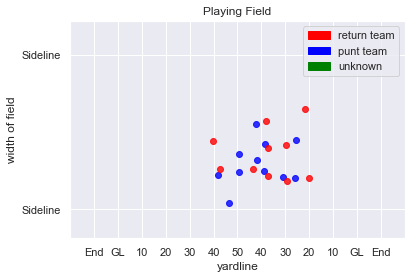

705
Play Description: (12:30) (Punt formation) K.Huber punts 59 yards to WAS 21, Center-C.Harris. J.Crowder to WAS 35 for 14 yards (C.Harris). Penalty on WAS-M.Harris, Offensive Holding, offsetting, enforced at WAS 21. Penalty on CIN-M.Flowers, Unnecessary Roughness, offsetting.


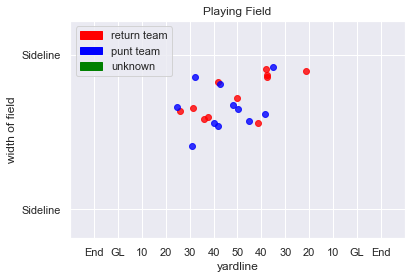

706
Play Description: (9:25) (Punt formation) T.Way punts 42 yards to CIN 34, Center-N.Sundberg. A.Jones to CIN 36 for 2 yards (T.Murphy).


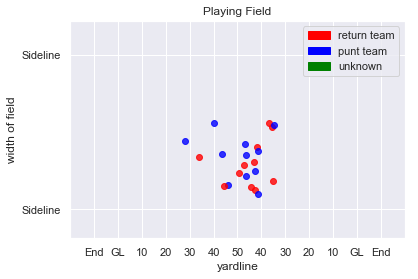

707
Play Description: (3:27) (Punt formation) K.Huber punts 58 yards to WAS 10, Center-C.Harris. J.Crowder to WAS 33 for 23 yards (R.Burkhead).


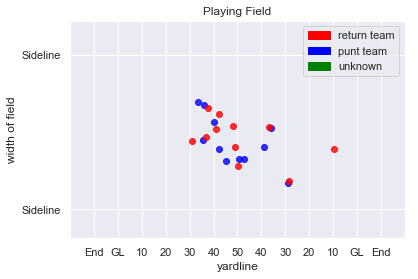

708
Play Description: (12:02) (Punt formation) T.Way punts 35 yards to CIN 10, Center-N.Sundberg. A.Erickson pushed ob at CIN 17 for 7 yards (H.Bates).


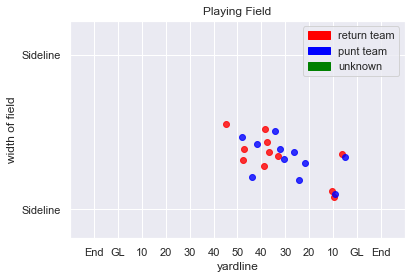

709
Play Description: (7:25) J.Schum punts 58 yards to ATL 22, Center-B.Goode. E.Weems to ATL 33 for 11 yards (M.Hyde). PENALTY on ATL-K.Ishmael, Offensive Holding, 10 yards, enforced at ATL 32. Penalty on ATL-C.Goodwin, Offensive Holding, declined.


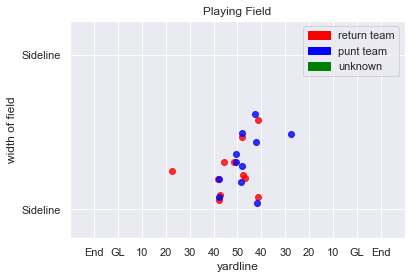

710
Play Description: (6:02) M.Bosher punts 49 yards to GB 30, Center-J.Harris. T.Davis to ATL 15 for 55 yards (K.Ishmael).


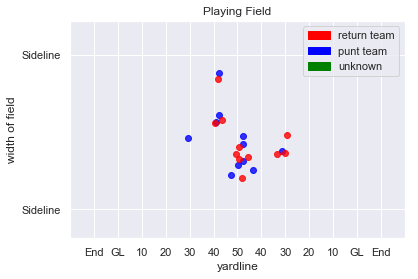

711
Play Description: (15:00) J.Schum punts 50 yards to ATL 15, Center-B.Goode. E.Weems to ATL 33 for 18 yards (J.Elliott).


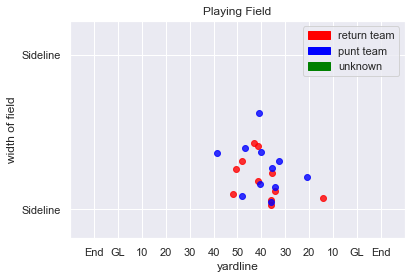

712
Play Description: (12:43) M.Bosher punts 52 yards to GB 23, Center-J.Harris. T.Davis to GB 28 for 5 yards (K.Ishmael). PENALTY on GB-K.Brice, Face Mask (15 Yards), 14 yards, enforced at GB 28.


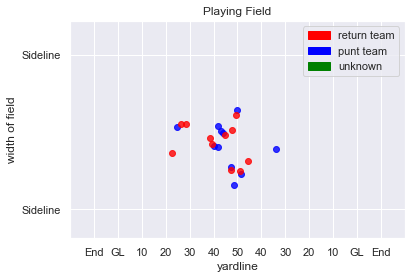

713
Play Description: (15:00) C.Schmidt punts 42 yards to NE 30, Center-G.Sanborn. J.Edelman pushed ob at NE 39 for 9 yards (P.Brown).


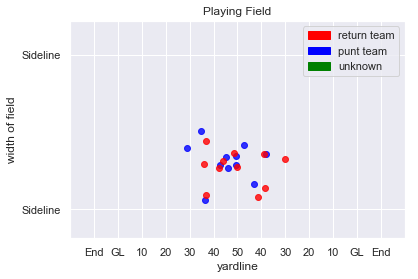

714
Play Description: (14:05) R.Allen punts 41 yards to BUF 27, Center-J.Cardona. B.Tate to BUF 29 for 2 yards (N.Ebner).


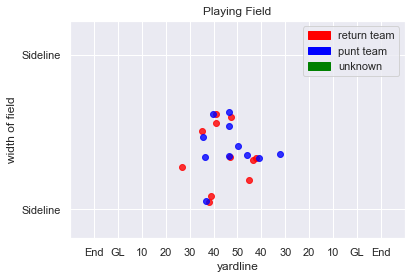

715
Play Description: (10:20) C.Schmidt punts 56 yards to NE 8, Center-G.Sanborn. J.Edelman pushed ob at NE 18 for 10 yards (K.Seymour).


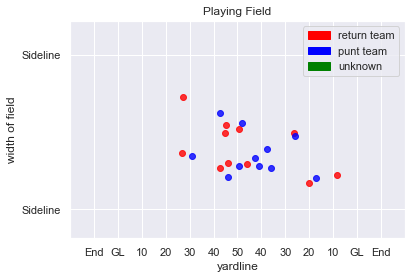

716
Play Description: (8:13) (Punt formation) B.Colquitt punts 41 yards to NYJ 40, Center-C.Hughlett. J.Marshall to NYJ 40 for no gain (C.Kirksey).


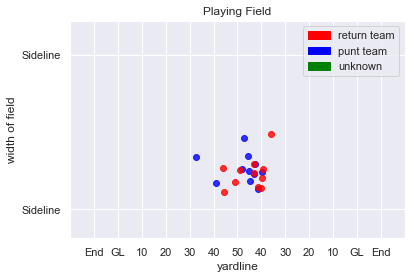

717
Play Description: (7:05) L.Edwards punts 57 yards to CLV 5, Center-T.Purdum. D.Johnson Jr. to CLV 18 for 13 yards (J.Stanford; C.Peake).


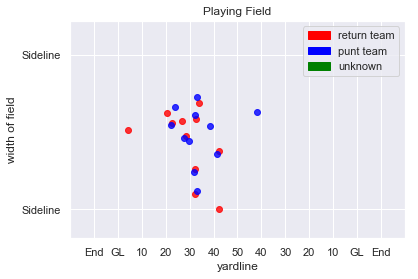

718
Play Description: (11:53) (Punt formation) B.Colquitt punts 52 yards to NYJ 19, Center-C.Hughlett. J.Marshall pushed ob at NYJ 34 for 15 yards (G.Atkinson III).


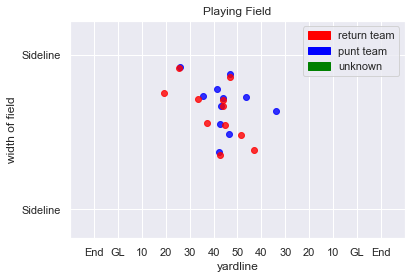

719
Play Description: (10:50) (Punt formation) L.Edwards punts 57 yards to CLV 13, Center-T.Purdum. D.Johnson Jr. to CLV 28 for 15 yards (T.Jones).


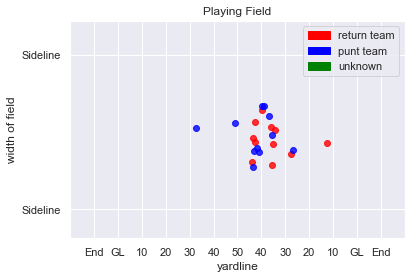

720
Play Description: (9:26) S.Lechler punts 54 yards to DET 11, Center-J.Weeks. A.Roberts to DET 28 for 17 yards (D.Jones). PENALTY on DET-A.Barnes, Offensive Holding, 5 yards, enforced at DET 11.


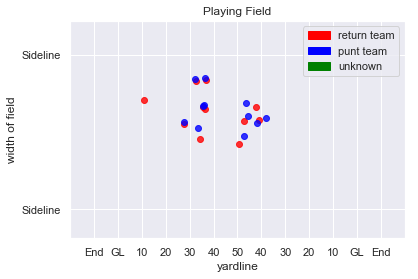

721
Play Description: (11:52) S.Martin punts 52 yards to HST 32, Center-D.Muhlbach. T.Ervin to HST 47 for 15 yards (M.Killebrew).


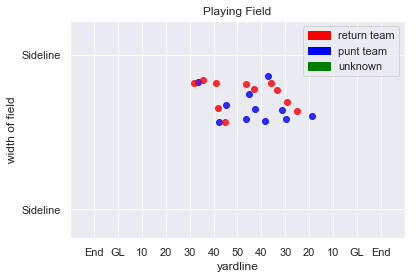

722
Play Description: (4:21) S.Martin punts 44 yards to HST 21, Center-D.Muhlbach. W.Fuller pushed ob at HST 24 for 3 yards (M.Killebrew).


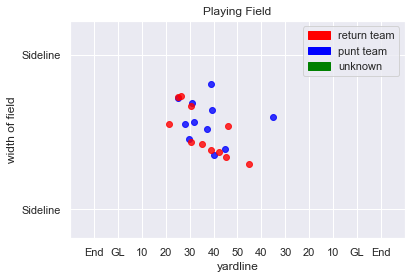

723
Play Description: (1:32) S.Martin punts 43 yards to HST 48, Center-D.Muhlbach. T.Ervin to DET 44 for 8 yards (D.Carey).


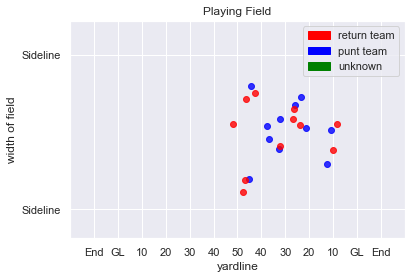

724
Play Description: (12:37) S.Lechler punts 50 yards to DET 18, Center-J.Weeks. A.Roberts to DET 15 for -3 yards (R.Nelson, A.Dent).


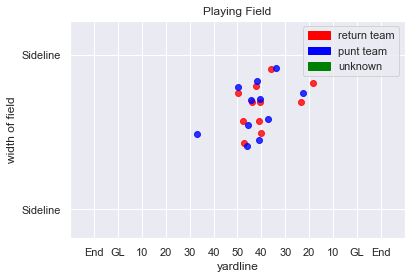

725
Play Description: (10:32) S.Martin punts 42 yards to HST 30, Center-D.Muhlbach. T.Ervin to HST 39 for 9 yards (Z.Zenner, A.Williams).


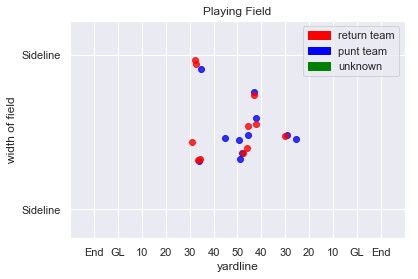

726
Play Description: (12:51) S.Lechler punts 59 yards to DET 14, Center-J.Weeks. A.Roberts to DET 22 for 8 yards (D.Jones).


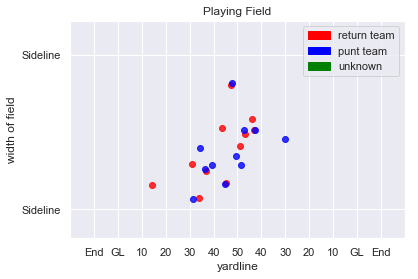

727
Play Description: (1:44) P.McAfee punts 57 yards to KC 15, Center-M.Overton. T.Hill pushed ob at KC 28 for 13 yards (J.Todman).


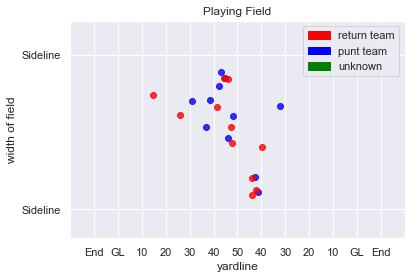

728
Play Description: (13:14) P.McAfee punts 49 yards to KC 9, Center-M.Overton. T.Hill to KC 25 for 16 yards (J.Doyle).


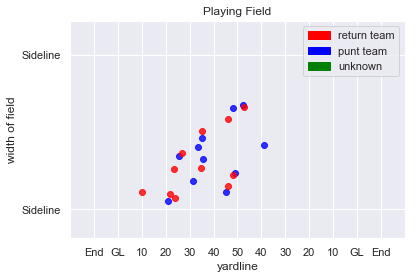

729
Play Description: (14:51) D.Colquitt punts 44 yards to IND 9, Center-J.Winchester. T.Hilton ran ob at IND 14 for 5 yards (D.Thomas).


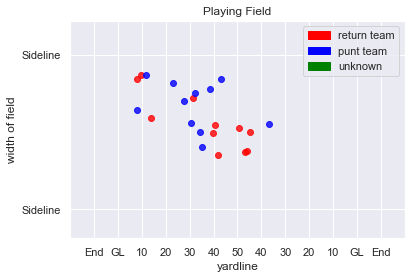

730
Play Description: (13:22) P.McAfee punts 58 yards to KC 22, Center-M.Overton. T.Hill pushed ob at 50 for 28 yards (J.Doyle).


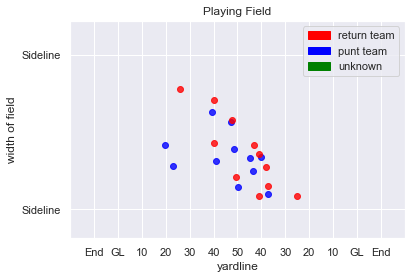

731
Play Description: (12:20) T.Morstead punts 44 yards to SEA 17, Center-J.Drescher. T.Lockett to SEA 28 for 11 yards (J.Hill).


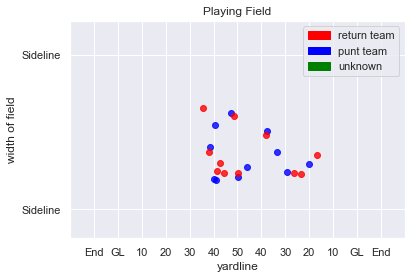

732
Play Description: (6:18) T.Morstead punts 48 yards to SEA 32, Center-J.Drescher. T.Lockett to SEA 35 for 3 yards (C.Robertson).


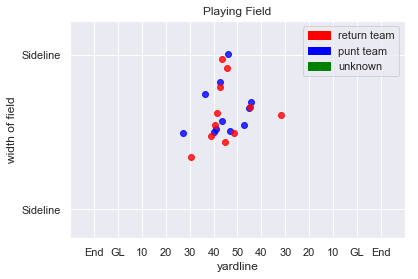

733
Play Description: (10:38) (Punt formation) M.King punts 67 yards to TB 20, Center-J.Condo. A.Humphries to TB 39 for 19 yards (J.Condo). PENALTY on TB-A.Glanton, Offensive Holding, 10 yards, enforced at TB 20.


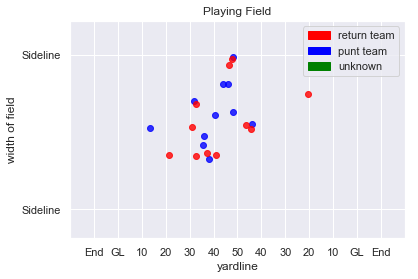

734
Play Description: (10:35) (Punt formation) B.Anger punts 49 yards to OAK 30, Center-A.DePaola. J.Richard to OAK 39 for 9 yards (C.Lynch). PENALTY on OAK-D.Hayden, Offensive Holding, 10 yards, enforced at OAK 39.


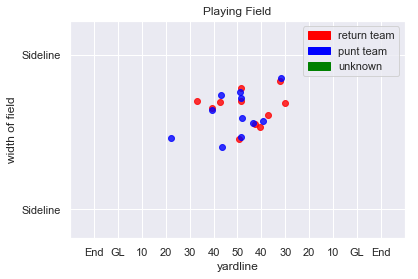

735
Play Description: (3:21) (Punt formation) B.Anger punts 55 yards to OAK 10, Center-A.DePaola. J.Richard to OAK 14 for 4 yards (R.Shepard).


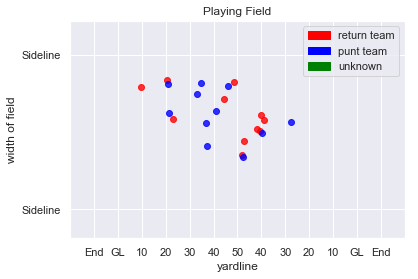

736
Play Description: (:58) (Punt formation) B.Anger punts 46 yards to OAK 25, Center-A.DePaola. J.Richard pushed ob at OAK 45 for 20 yards (B.Anger).


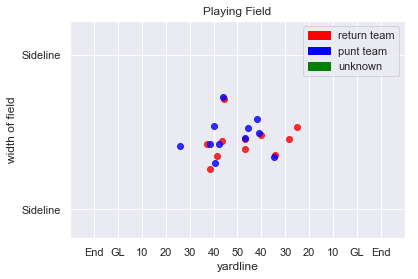

737
Play Description: (3:29) (Punt formation) B.Anger punts 42 yards to OAK 40, Center-A.DePaola. J.Richard to OAK 40 for no gain (J.Robinson).


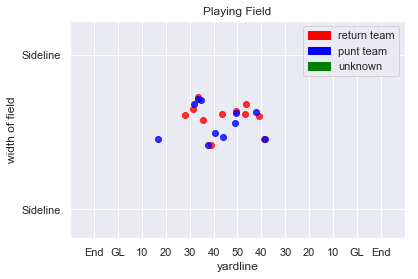

738
Play Description: (6:06) R.Dixon punts 44 yards to SD 23, Center-C.Kreiter. D.McCluster to SD 27 for 4 yards (D.Watson).


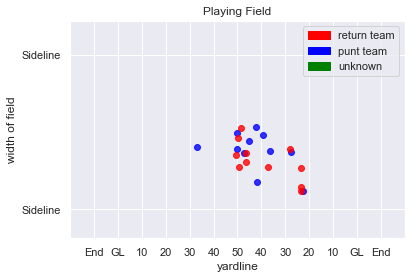

739
Play Description: (4:28) D.Kaser punts 62 yards to DEN 5, Center-M.Windt. J.Norwood to DEN 21 for 16 yards (J.Brown). PENALTY on DEN-L.Doss, Illegal Block Above the Waist, 5 yards, enforced at DEN 10.


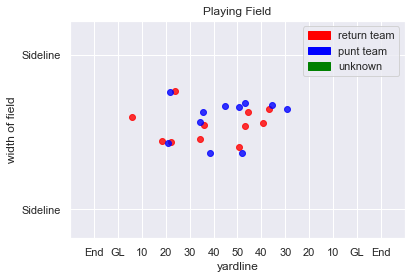

740
Play Description: (3:10) R.Dixon punts 44 yards to SD 49, Center-C.Kreiter. D.McCluster to DEN 45 for 6 yards (Z.Anderson).


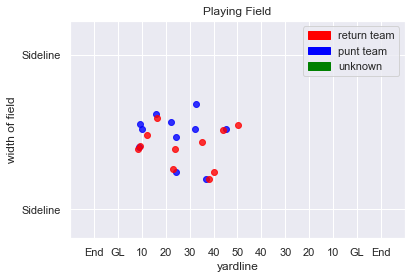

741
Play Description: (2:19) R.Dixon punts 68 yards to SD 29, Center-C.Kreiter. D.McCluster to SD 33 for 4 yards (Z.Anderson, D.Watson).


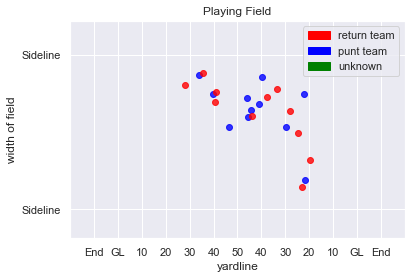

742
Play Description: (8:13) A.Lee punts 56 yards to ARZ 18, Center-J.Jansen. B.Golden to ARZ 22 for 4 yards (J.Webb).


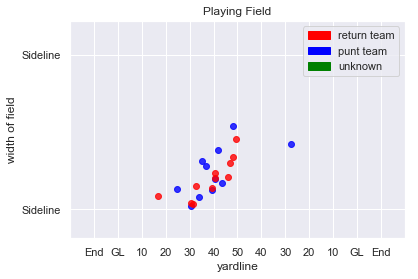

743
Play Description: (14:53) R.Quigley punts 39 yards to CAR 35, Center-A.Brewer. T.Ginn ran ob at CAR 35 for no gain.


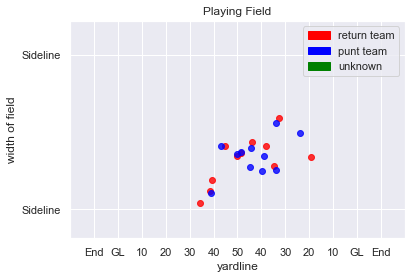

744
Play Description: (10:04) A.Lee punts 60 yards to ARZ 14, Center-J.Jansen. P.Peterson pushed ob at ARZ 16 for 2 yards (A.Klein). PENALTY on ARZ-B.Williams, Offensive Holding, 8 yards, enforced at ARZ 16.


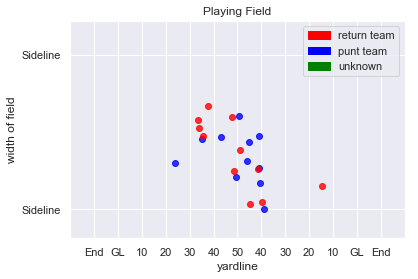

745
Play Description: (10:34) (Punt formation) D.Jones punts 62 yards to DAL 3, Center-J.Dorenbos. L.Whitehead to DAL 20 for 17 yards (N.Bradham). PENALTY on DAL-R.Smith, Offensive Holding, 5 yards, enforced at DAL 10. Whitehead got to the 20 yard line prior to the penalty


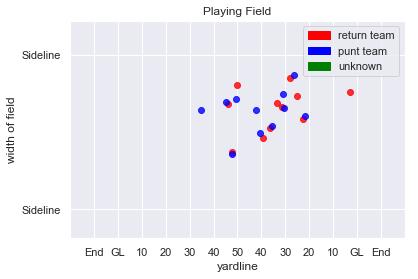

746
Play Description: (8:58) (Punt formation) C.Jones punts 41 yards to PHI 46, Center-L.Ladouceur. D.Sproles to DAL 45 for 9 yards (J.Heath; G.Escobar).


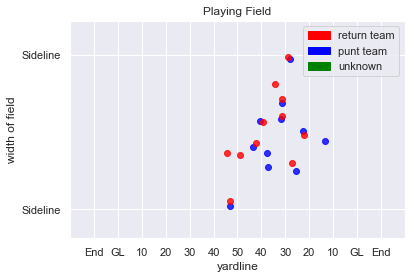

747
Play Description: (12:53) (Punt formation) D.Jones punts 61 yards to DAL 25, Center-J.Dorenbos. L.Whitehead to DAL 37 for 12 yards (B.Braman).


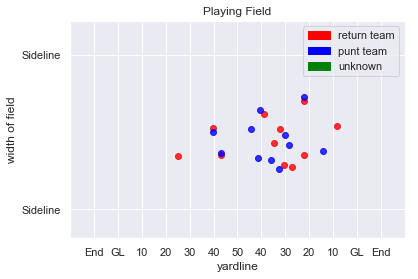

748
Play Description: (3:22) (Punt formation) P.O'Donnell punts 51 yards to MIN 28, Center-P.Scales. A.Thielen to MIN 32 for 4 yards (H.Jones-Quartey).


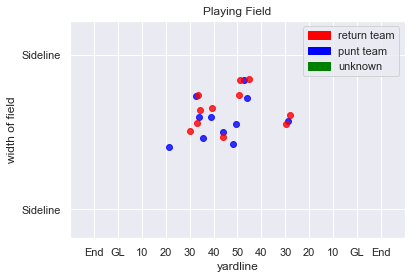

749
Play Description: (1:27) (Punt formation) J.Locke punts 40 yards to CHI 19, Center-K.McDermott. C.LeBlanc to CHI 26 for 7 yards (C.Patterson).


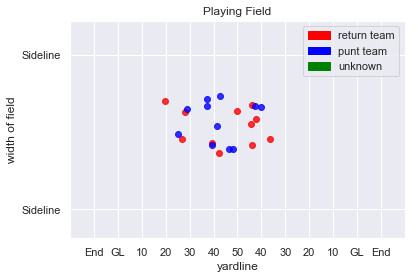

750
Play Description: (11:35) (Punt formation) J.Locke punts 41 yards to CHI 44, Center-K.McDermott. C.LeBlanc to MIN 43 for 13 yards (T.Waynes).


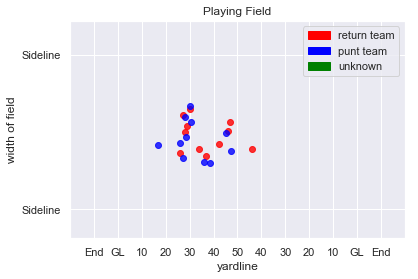

751
Play Description: (7:12) (Punt formation) J.Locke punts 43 yards to CHI 21, Center-K.McDermott. C.LeBlanc to CHI 27 for 6 yards (K.Brothers).


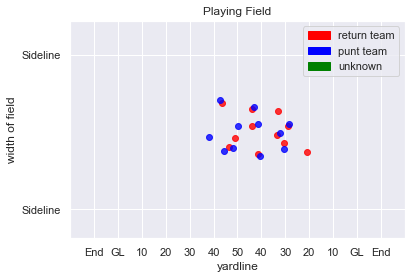

752
Play Description: (9:00) (Punt formation) P.O'Donnell punts 53 yards to MIN 10, Center-P.Scales. S.Diggs to MIN 17 for 7 yards (S.McManis).


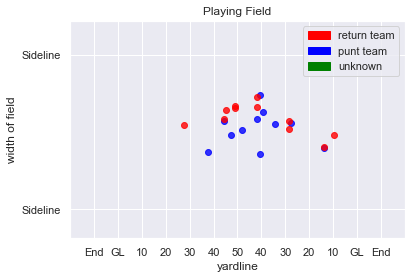

753
Play Description: (:15) (Punt formation) P.O'Donnell punts 37 yards to MIN -2, Center-P.Scales. S.Diggs to MIN 2 for 4 yards (N.Kwiatkoski).


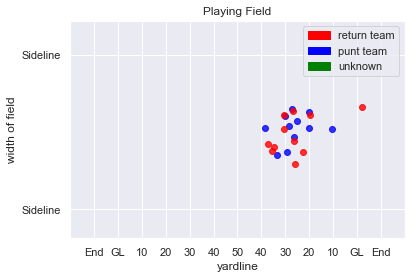

754
Play Description: (10:41) (Punt formation) B.Anger punts 53 yards to ATL 8, Center-A.DePaola. E.Weems to ATL 18 for 10 yards (H.Jones, C.Brate). Penalty on ATL-L.Reynolds, Illegal Block Above the Waist, declined. PENALTY on ATL-R.Therezie, Offensive Holding, 4 yards, enforced at ATL 8.


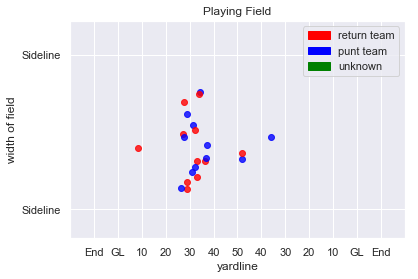

755
Play Description: (8:06) (Punt formation) B.Anger punts 50 yards to ATL 17, Center-A.DePaola. E.Weems to ATL 18 for 1 yard (R.Smith).


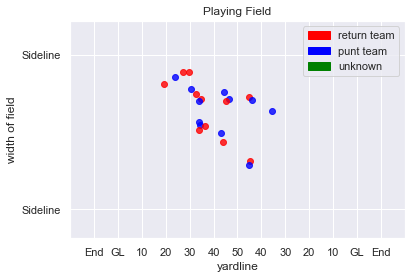

756
Play Description: (9:16) (Punt formation) J.Berry punts 61 yards to BLT 22, Center-G.Warren. D.Hester to BLT 36 for 14 yards (V.Williams).


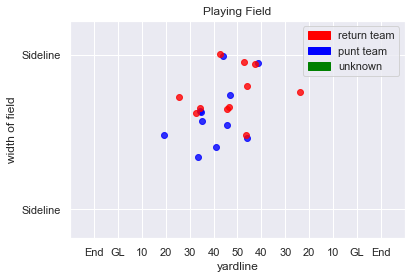

757
Play Description: (12:46) (Punt formation) S.Koch punts 48 yards to PIT 34, Center-M.Cox. A.Brown pushed ob at PIT 41 for 7 yards (P.Onwuasor).


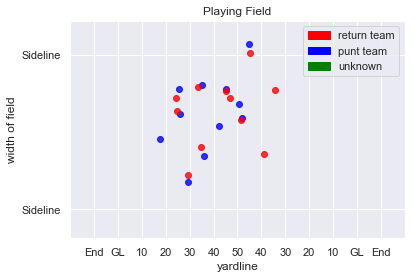

758
Play Description: (11:14) (Punt formation) J.Berry punts 42 yards to BLT 25, Center-G.Warren. D.Hester to BLT 37 for 12 yards (S.Davis). PENALTY on BLT-M.Huff, Unnecessary Roughness, 13 yards, enforced at BLT 25.


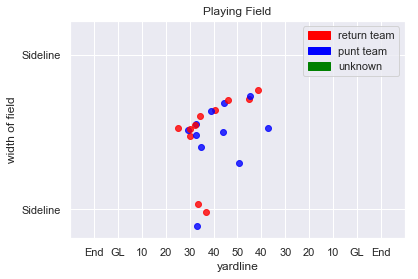

759
Play Description: (4:30) (Punt formation) J.Berry punts 56 yards to BLT 28, Center-G.Warren. D.Hester pushed ob at BLT 29 for 1 yard (C.Hamilton).


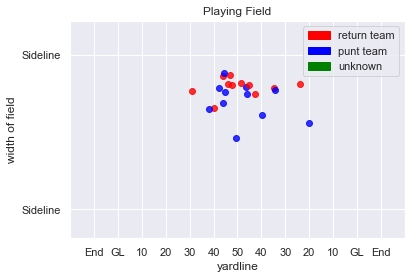

760
Play Description: (7:00) (Punt formation) S.Koch punts 43 yards to PIT 12, Center-M.Cox. A.Brown pushed ob at PIT 10 for -2 yards (D.Waller).


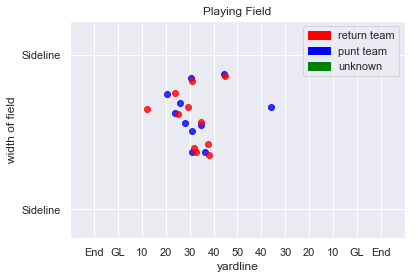

761
Play Description: (3:11) (Punt formation) C.Jones punts 50 yards to CLV 44, Center-L.Ladouceur. D.Johnson Jr. to CLV 46 for 2 yards (D.Wilson). CLV-D.Johnson Jr. was injured during the play. His return is Probable. 


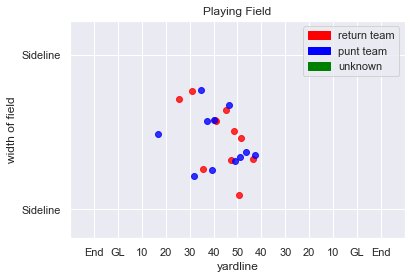

762
Play Description: (6:38) (Punt formation) B.Colquitt punts 38 yards to DAL 33, Center-C.Hughlett. L.Whitehead to DAL 33 for no gain (J.Schobert).


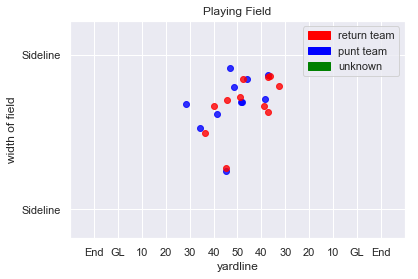

763
Play Description: (:25) (Punt formation) B.Colquitt punts 37 yards to DAL 33, Center-C.Hughlett. L.Whitehead ran ob at DAL 36 for 3 yards.


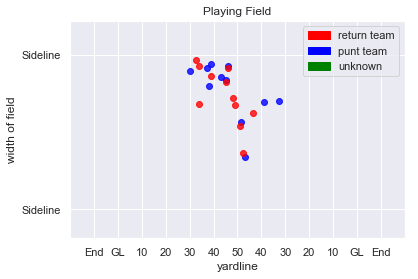

764
Play Description: (7:59) (Punt formation) B.Colquitt punts 52 yards to DAL 30, Center-C.Hughlett. L.Whitehead to DAL 45 for 15 yards (C.Hughlett).


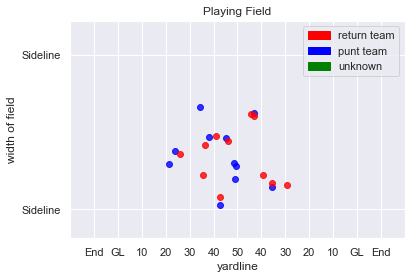

765
Play Description: (12:31) D.Colquitt punts 54 yards to JAX 13, Center-J.Winchester. B.Walters to JAX 19 for 6 yards (D.Sorensen).


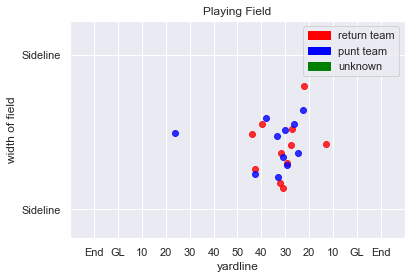

766
Play Description: (6:24) B.Nortman punts 47 yards to KC 10, Center-C.Tinker. T.Hill to KC 20 for 10 yards (D.Robinson).


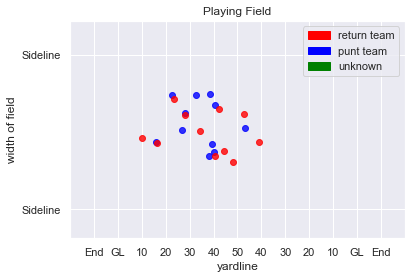

767
Play Description: (6:40) B.Nortman punts 42 yards to KC 24, Center-C.Tinker. T.Hill to JAX 40 for 36 yards (B.Nortman). PENALTY on JAX-C.Tinker, Offensive Holding, 10 yards, enforced at JAX 40.


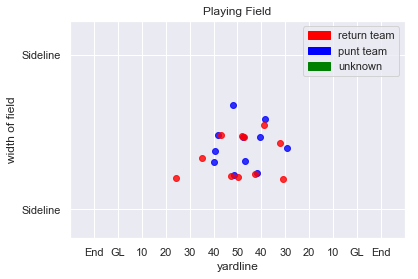

768
Play Description: (6:46) D.Colquitt punts 54 yards to JAX 31, Center-J.Winchester. B.Walters to JAX 39 for 8 yards (F.Zombo).


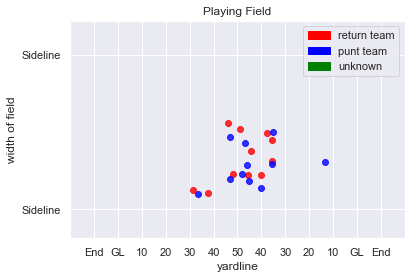

769
Play Description: (3:15) D.Colquitt punts 59 yards to JAX 23, Center-J.Winchester. B.Walters to JAX 35 for 12 yards (D.Alexander).


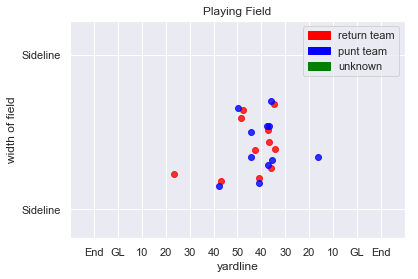

770
Play Description: (11:42) (Punt formation) M.Darr punts 47 yards to NYJ 17, Center-J.Denney. J.Marshall to NYJ 27 for 10 yards (M.Hull).


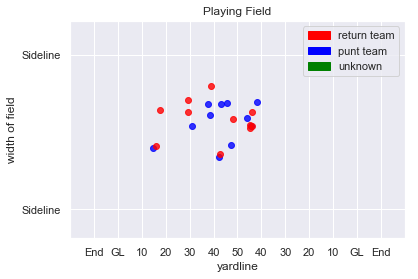

771
Play Description: (3:06) (Punt formation) L.Edwards punts 42 yards to MIA 37, Center-T.Purdum. J.Landry to MIA 46 for 9 yards (J.Burris).


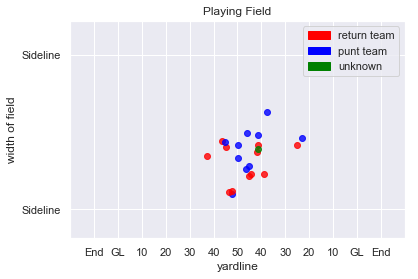

772
Play Description: (3:04) (Punt formation) S.Martin punts 55 yards to MIN 23, Center-D.Muhlbach. M.Sherels to MIN 25 for 2 yards (D.Carey).


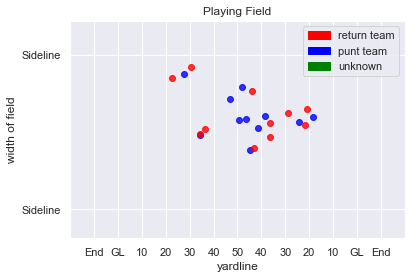

773
Play Description: (12:56) (Punt formation) S.Martin punts 49 yards to MIN 27, Center-D.Muhlbach. S.Diggs pushed ob at MIN 35 for 8 yards (B.Copeland).


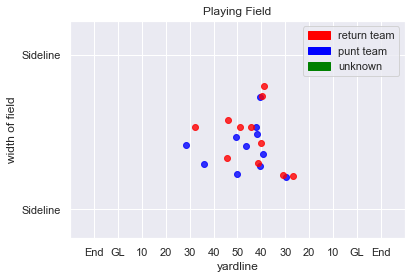

774
Play Description: (3:11) (Punt formation) S.Martin punts 54 yards to MIN 22, Center-D.Muhlbach. S.Diggs pushed ob at MIN 41 for 19 yards (M.Killebrew).


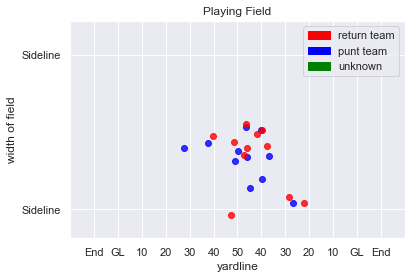

775
Play Description: (4:26) (Punt formation) S.Martin punts 53 yards to MIN 19, Center-D.Muhlbach. S.Diggs to MIN 21 for 2 yards (J.Bademosi).


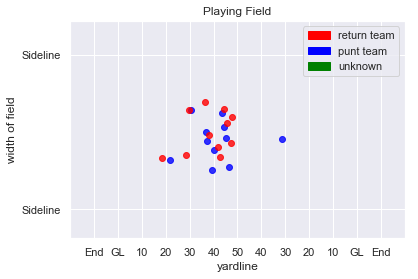

776
Play Description: (13:57) B.Wing punts 58 yards to PHI 20, Center-Z.DeOssie. D.Sproles pushed ob at PHI 30 for 10 yards (R.Lewis, J.Casillas).


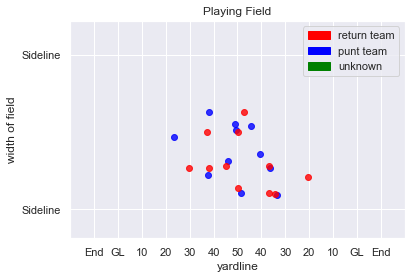

777
Play Description: (5:42) B.Wing punts 55 yards to PHI 19, Center-Z.DeOssie. D.Sproles pushed ob at NYG 15 for 66 yards (K.Robinson).


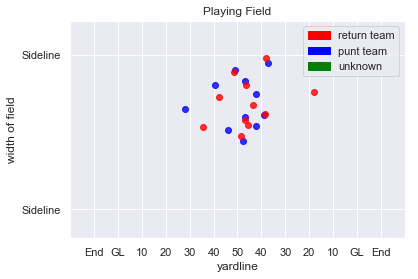

778
Play Description: (6:06) D.Jones punts 45 yards to NYG 30, Center-J.Dorenbos. D.Harris to NYG 40 for 10 yards (C.Maragos, N.Goode).


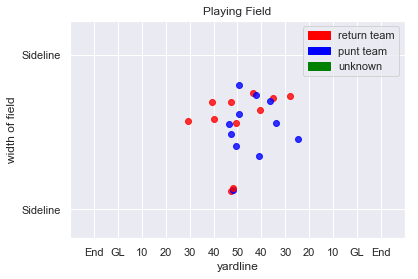

779
Play Description: (9:59) A.Lee punts 52 yards to LA 1, impetus ends at LA 1, Center-J.Jansen. T.Austin to LA 3 for 2 yards (C.Brown).


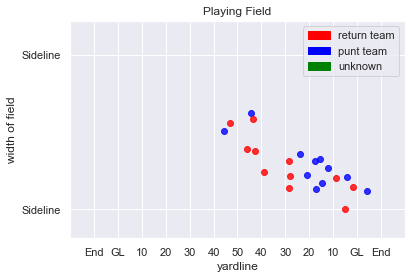

780
Play Description: (14:54) A.Lee punts 58 yards to LA 4, Center-J.Jansen. T.Austin to LA 18 for 14 yards (J.Cash).


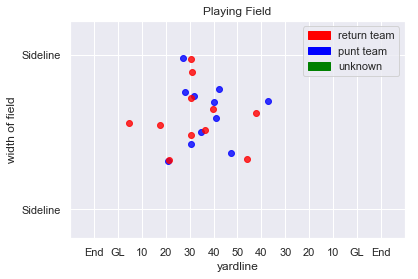

781
Play Description: (11:19) A.Lee punts 48 yards to LA 41, Center-J.Jansen. T.Austin to LA 46 for 5 yards (M.Griffin).


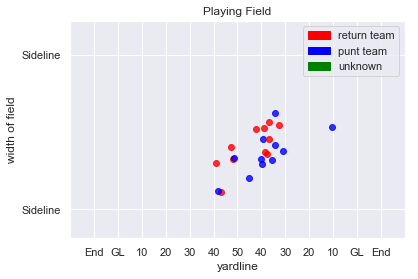

782
Play Description: (5:06) A.Lee punts 46 yards to LA 26, Center-J.Jansen. T.Austin to LA 48 for 22 yards (A.Klein; J.Cash). PENALTY on LA-C.Reynolds, Illegal Block Above the Waist, 10 yards, enforced at LA 45.


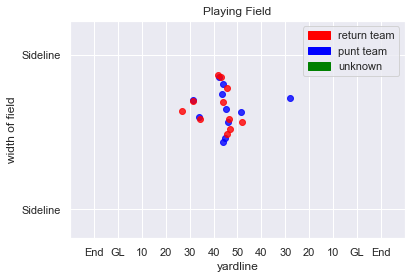

783
Play Description: (12:24) T.Morstead punts 56 yards to SF 13, Center-J.Drescher. J.Kerley to SF 24 for 11 yards (M.Mauti; B.Coleman).


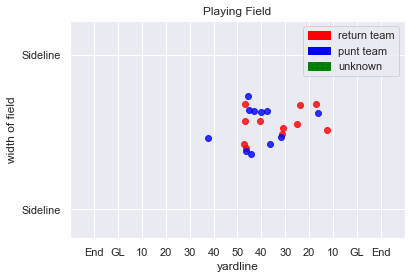

784
Play Description: (10:23) T.Morstead punts 59 yards to SF 33, Center-J.Drescher. J.Kerley to SF 43 for 10 yards (J.Lampman).


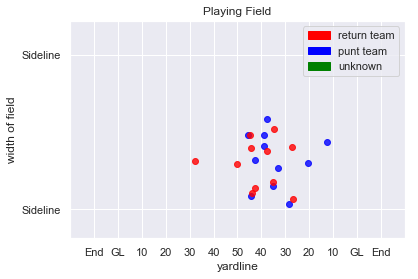

785
Play Description: (3:05) T.Morstead punts 54 yards to SF 16, Center-J.Drescher. J.Kerley to SF 18 for 2 yards (N.Stupar). PENALTY on SF-J.Tartt, Offensive Holding, 10 yards, enforced at SF 18.


KeyboardInterrupt: 

In [199]:
# Plot all positions at the time of specific event
plot_punt_events(punt_received_df, PR_unique_ids)

In [201]:
pr_proximities.head(1)

,GameKey,PlayID,PlayDescription,Poss_Team,YardLine,penalty on,punt distance,side ball lands,yardline received,yardage on play,...,Time,x,y,dis,o,dir,Event,Role,proximity_to_PR,team
0,3,455,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,...,2016-08-11 23:51:08.400,64.199997,9.53,0.91,8.75,101.239998,punt_received,PRW,32.232623,punt team


In [213]:
# Get set of unique_ids for the punts for the pr_proximities dataset
pr_proximities_unique_ids = pr_proximities.groupby(['GameKey','PlayID']).size()\
    .reset_index().rename(columns={0:'count'})

In [214]:
def calculate_closest_player(df, unique_ids, column):
    unique_ids['proximity'] = 0
    
    for i in range(len(unique_ids)):
        print(i)
        
        # Play information
        game_key = unique_ids.loc[i, 'GameKey']
        play_id = unique_ids.loc[i, 'PlayID']

        # Get one unique set of data points related to a single (GameKey, PlayID) pair
        where_condition = ((df['GameKey'] == game_key) &\
                           (df['PlayID'] == play_id))
        just_view = df[where_condition].reset_index(drop=True)
        
        # Take minimum of series
        unique_ids.loc[i, 'proximity'] = min(just_view[column])

In [215]:
calculate_closest_player(pr_proximities, pr_proximities_unique_ids, 'proximity_to_PR')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084


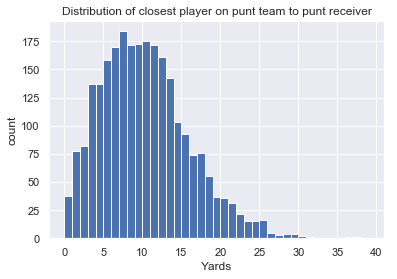

count    2573.000000
mean       10.298831
std         5.640910
min         0.092199
25%         6.096068
50%         9.794092
75%        13.640824
max        37.306654
Name: proximity, dtype: float64

In [248]:
'''Plot of distribution distance of closest player to punt receiver'''
bins = [i for i in range(0, 40, 1)]
plt.hist(pr_proximities_unique_ids['proximity'], bins=bins)

plt.title('Distribution of closest player on punt team to punt receiver')
plt.xlabel('Yards')
plt.ylabel('count')
plt.show()

pr_proximities_unique_ids['proximity'].describe()

In [221]:
# Combine Unique ID's appropriately
yard_and_proximity = pd.merge(pr_proximities_unique_ids, remainder_df,
                          how='inner',
                          on=['GameKey', 'PlayID'])
print(yard_and_proximity.shape)
yard_and_proximity.head()

(2573, 13)


,GameKey,PlayID,count,proximity,PlayDescription,Poss_Team,YardLine,penalty on,punt distance,side ball lands,yardline received,yardage on play,reward
0,3,455,21,7.248727,(6:44) (Punt formation) S.Koch punts 54 yards ...,BLT,BLT 32,0,54,CAR,14,9,0.104651
1,3,1542,20,1.998125,(2:54) (Punt formation) S.Koch punts 45 yards ...,BLT,BLT 34,1,45,CAR,21,-1,-0.012658
2,4,927,21,5.117831,"(1:53) A.Lee punts 40 yards to GB 27, Center-C...",CLV,CLV 33,0,40,GB,27,1,0.013699
3,4,1725,20,16.594451,"(2:48) A.Lee punts 66 yards to GB 15, Center-C...",CLV,CLV 19,0,66,GB,15,5,0.058824
4,4,2888,21,12.563117,"(3:29) T.Masthay punts 43 yards to GB 44, Cent...",GB,GB 1,1,43,GB,44,24,0.428571


### Let's Look at Yardage and Proximity

In [222]:
def build_that_histogram(x, title):
    bins = [i for i in range(min(x), max(x), 1)]
    plt.hist(x, bins=bins)

    plt.title(title)
    plt.xlabel('Yards')
    plt.ylabel('count')
    plt.show()

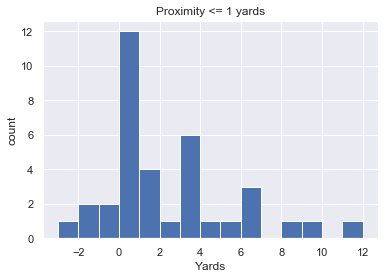

count    38.000000
mean      2.526316
std       3.998222
min      -3.000000
25%       0.000000
50%       1.000000
75%       3.750000
max      13.000000
Name: yardage on play, dtype: float64


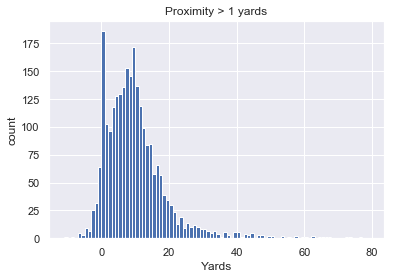

count    2535.000000
mean        9.420907
std         9.442759
min       -11.000000
25%         3.000000
50%         8.000000
75%        13.000000
max        80.000000
Name: yardage on play, dtype: float64
---
---


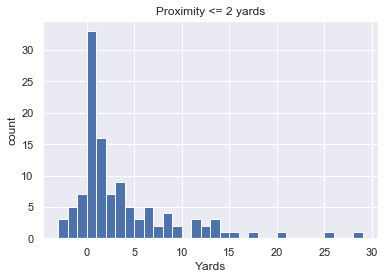

count    116.000000
mean       3.491379
std        6.038277
min       -3.000000
25%        0.000000
50%        1.000000
75%        5.000000
max       30.000000
Name: yardage on play, dtype: float64


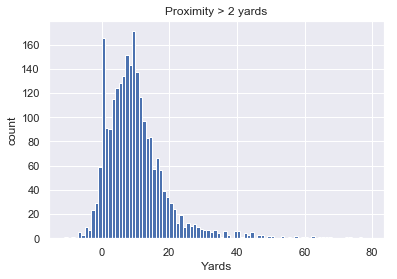

count    2457.000000
mean        9.594221
std         9.464455
min       -11.000000
25%         4.000000
50%         8.000000
75%        13.000000
max        80.000000
Name: yardage on play, dtype: float64
---
---


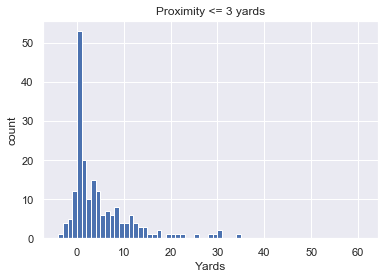

count    198.000000
mean       4.691919
std        7.881163
min       -4.000000
25%        0.000000
50%        2.000000
75%        7.000000
max       62.000000
Name: yardage on play, dtype: float64


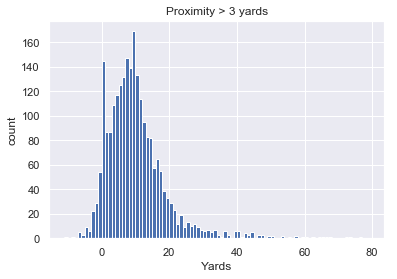

count    2375.000000
mean        9.704842
std         9.438492
min       -11.000000
25%         4.000000
50%         8.000000
75%        13.000000
max        80.000000
Name: yardage on play, dtype: float64
---
---


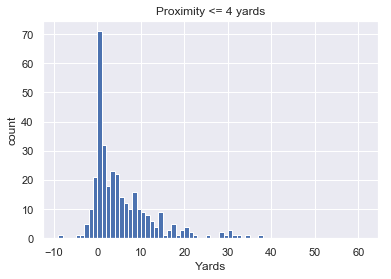

count    335.000000
mean       5.289552
std        7.871519
min       -9.000000
25%        0.000000
50%        3.000000
75%        8.000000
max       62.000000
Name: yardage on play, dtype: float64


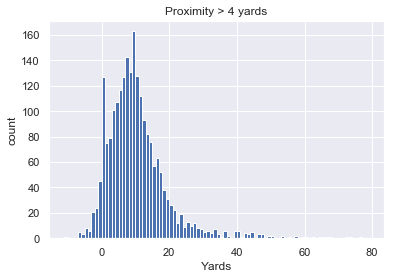

count    2238.000000
mean        9.922252
std         9.487739
min       -11.000000
25%         4.000000
50%         8.000000
75%        13.000000
max        80.000000
Name: yardage on play, dtype: float64
---
---


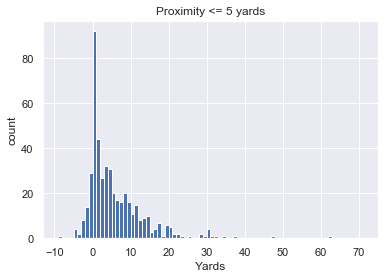

count    472.000000
mean       5.423729
std        8.295658
min       -9.000000
25%        0.000000
50%        3.000000
75%        8.000000
max       72.000000
Name: yardage on play, dtype: float64


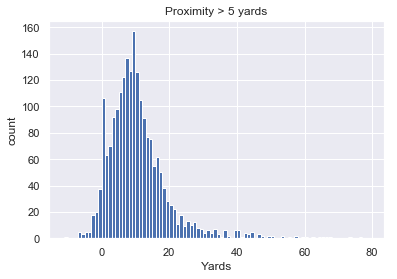

count    2101.000000
mean       10.194193
std         9.439854
min       -11.000000
25%         5.000000
50%         9.000000
75%        13.000000
max        80.000000
Name: yardage on play, dtype: float64
---
---


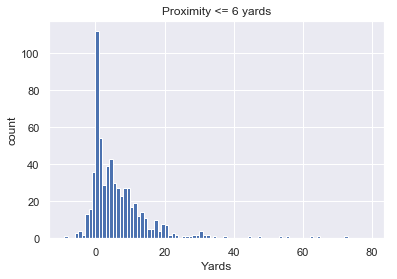

count    630.000000
mean       6.125397
std        9.407832
min       -9.000000
25%        0.000000
50%        4.000000
75%        9.000000
max       80.000000
Name: yardage on play, dtype: float64


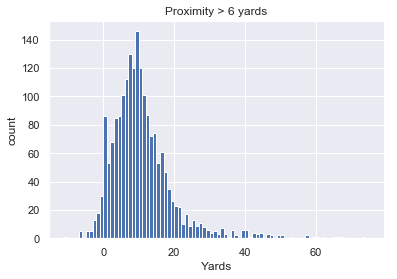

count    1943.000000
mean       10.354606
std         9.193443
min       -11.000000
25%         5.000000
50%         9.000000
75%        14.000000
max        76.000000
Name: yardage on play, dtype: float64
---
---


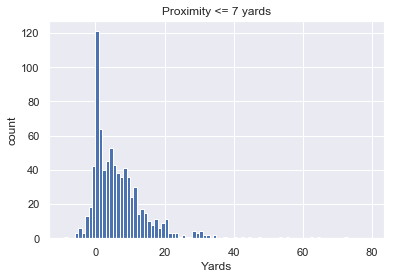

count    800.000000
mean       6.523750
std        9.095072
min       -9.000000
25%        0.000000
50%        4.000000
75%        9.000000
max       80.000000
Name: yardage on play, dtype: float64


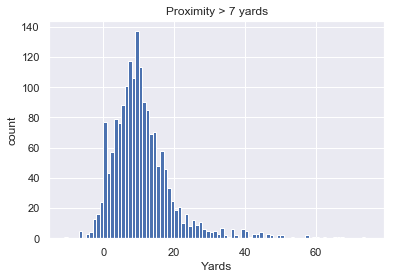

count    1773.000000
mean       10.580372
std         9.296708
min       -11.000000
25%         5.000000
50%         9.000000
75%        14.000000
max        76.000000
Name: yardage on play, dtype: float64
---
---


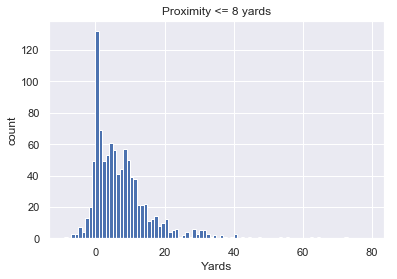

count    984.000000
mean       7.087398
std        9.188347
min       -9.000000
25%        1.000000
50%        5.000000
75%       10.000000
max       80.000000
Name: yardage on play, dtype: float64


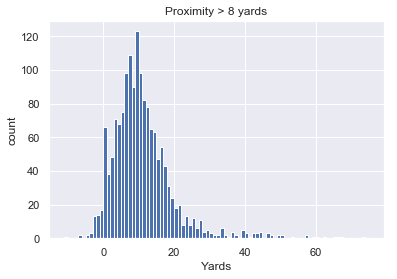

count    1589.00000
mean       10.70107
std         9.30152
min       -11.00000
25%         5.00000
50%         9.00000
75%        14.00000
max        76.00000
Name: yardage on play, dtype: float64
---
---


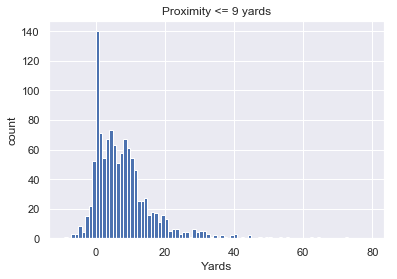

count    1156.000000
mean        7.439446
std         9.110992
min        -9.000000
25%         1.000000
50%         6.000000
75%        10.250000
max        80.000000
Name: yardage on play, dtype: float64


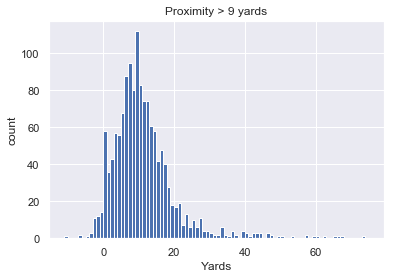

count    1417.000000
mean       10.852505
std         9.396484
min       -11.000000
25%         5.000000
50%         9.000000
75%        14.000000
max        76.000000
Name: yardage on play, dtype: float64
---
---


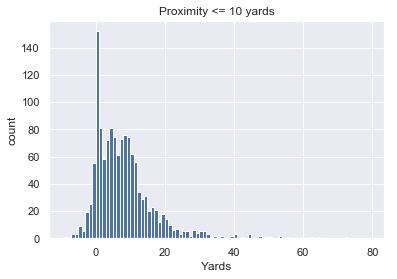

count    1329.000000
mean        7.587660
std         9.013796
min        -9.000000
25%         1.000000
50%         6.000000
75%        11.000000
max        80.000000
Name: yardage on play, dtype: float64


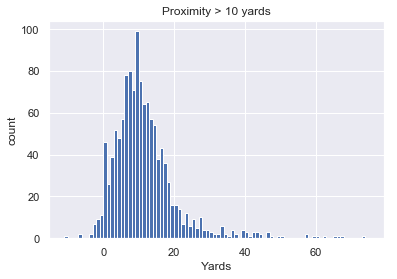

count    1244.000000
mean       11.168810
std         9.499907
min       -11.000000
25%         6.000000
50%         9.000000
75%        14.000000
max        76.000000
Name: yardage on play, dtype: float64
---
---


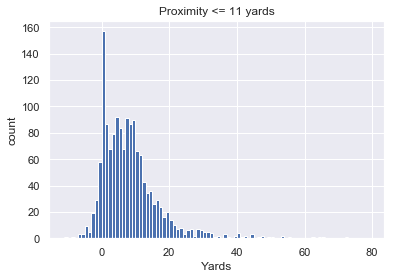

count    1504.000000
mean        7.859043
std         9.106018
min       -11.000000
25%         2.000000
50%         6.000000
75%        11.000000
max        80.000000
Name: yardage on play, dtype: float64


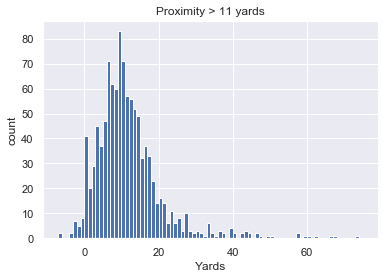

count    1069.000000
mean       11.373246
std         9.479530
min        -7.000000
25%         6.000000
50%        10.000000
75%        14.000000
max        76.000000
Name: yardage on play, dtype: float64
---
---


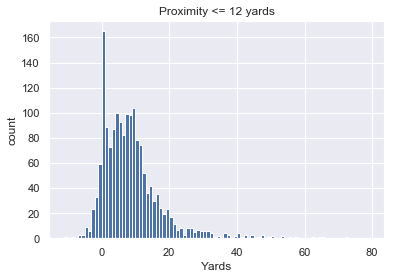

count    1676.000000
mean        8.110382
std         9.198656
min       -11.000000
25%         2.000000
50%         7.000000
75%        11.000000
max        80.000000
Name: yardage on play, dtype: float64


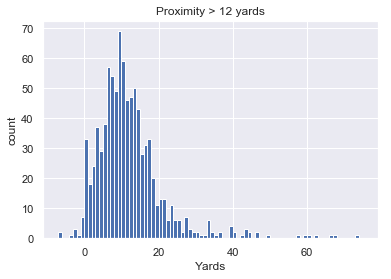

count    897.000000
mean      11.577480
std        9.423261
min       -7.000000
25%        6.000000
50%       10.000000
75%       15.000000
max       76.000000
Name: yardage on play, dtype: float64
---
---


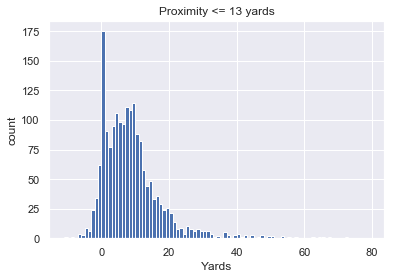

count    1837.000000
mean        8.303756
std         9.208446
min       -11.000000
25%         2.000000
50%         7.000000
75%        11.000000
max        80.000000
Name: yardage on play, dtype: float64


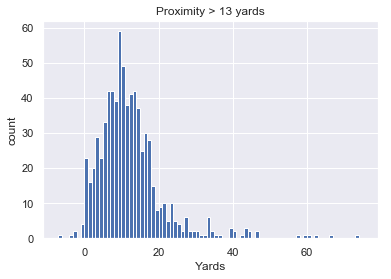

count    736.000000
mean      11.853261
std        9.476943
min       -7.000000
25%        6.000000
50%       10.000000
75%       15.000000
max       76.000000
Name: yardage on play, dtype: float64
---
---


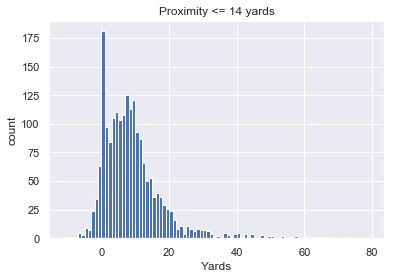

count    1979.000000
mean        8.479535
std         9.302574
min       -11.000000
25%         2.000000
50%         7.000000
75%        12.000000
max        80.000000
Name: yardage on play, dtype: float64


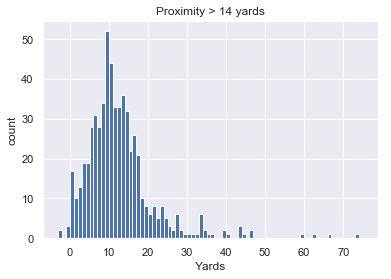

count    594.000000
mean      12.116162
std        9.283159
min       -3.000000
25%        7.000000
50%       10.000000
75%       15.000000
max       76.000000
Name: yardage on play, dtype: float64
---
---


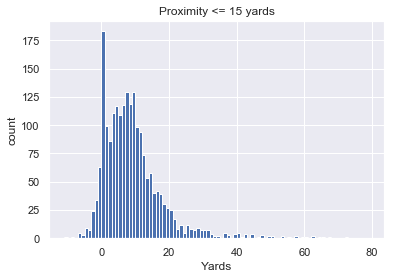

count    2082.000000
mean        8.614793
std         9.333252
min       -11.000000
25%         3.000000
50%         7.000000
75%        12.000000
max        80.000000
Name: yardage on play, dtype: float64


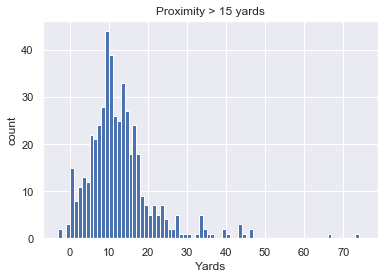

count    491.000000
mean      12.305499
std        9.217350
min       -3.000000
25%        7.000000
50%       11.000000
75%       15.000000
max       76.000000
Name: yardage on play, dtype: float64
---
---


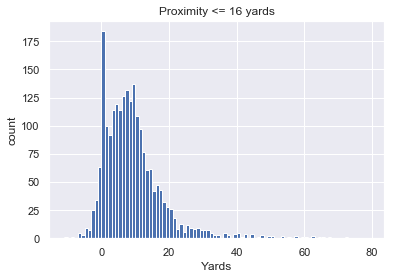

count    2175.000000
mean        8.719540
std         9.261183
min       -11.000000
25%         3.000000
50%         7.000000
75%        12.000000
max        80.000000
Name: yardage on play, dtype: float64


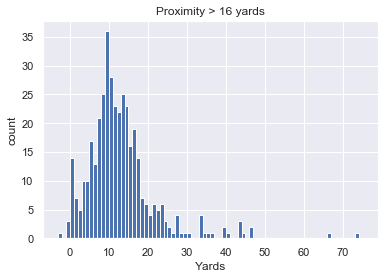

count    398.000000
mean      12.595477
std        9.627819
min       -3.000000
25%        7.000000
50%       11.000000
75%       15.000000
max       76.000000
Name: yardage on play, dtype: float64
---
---


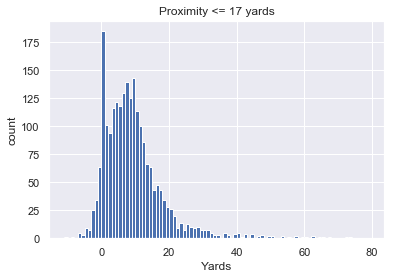

count    2249.000000
mean        8.827034
std         9.319357
min       -11.000000
25%         3.000000
50%         7.000000
75%        12.000000
max        80.000000
Name: yardage on play, dtype: float64


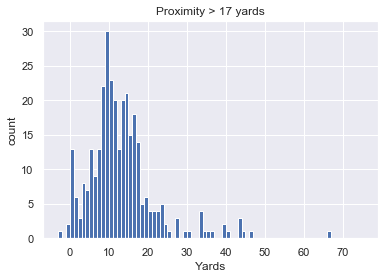

count    324.000000
mean      12.734568
std        9.434994
min       -3.000000
25%        8.000000
50%       11.000000
75%       16.000000
max       76.000000
Name: yardage on play, dtype: float64
---
---


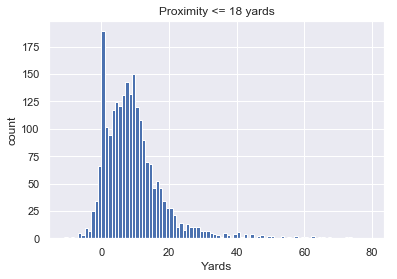

count    2325.000000
mean        8.915699
std         9.278894
min       -11.000000
25%         3.000000
50%         7.000000
75%        12.000000
max        80.000000
Name: yardage on play, dtype: float64


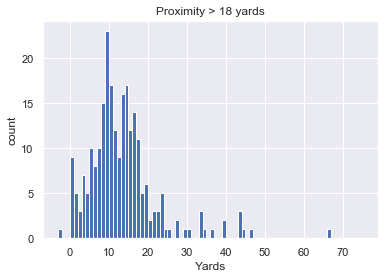

count    248.000000
mean      13.100806
std        9.918796
min       -3.000000
25%        8.000000
50%       11.000000
75%       16.000000
max       76.000000
Name: yardage on play, dtype: float64
---
---


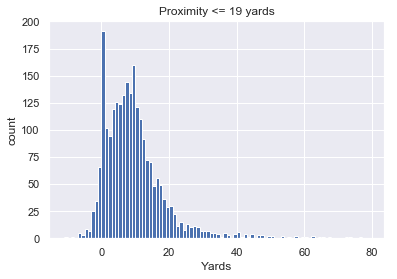

count    2380.000000
mean        9.055462
std         9.408051
min       -11.000000
25%         3.000000
50%         8.000000
75%        12.000000
max        80.000000
Name: yardage on play, dtype: float64


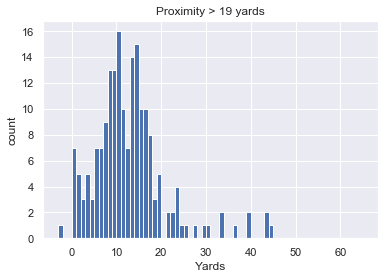

count    193.000000
mean      12.569948
std        8.997484
min       -3.000000
25%        8.000000
50%       11.000000
75%       15.000000
max       66.000000
Name: yardage on play, dtype: float64
---
---


In [244]:
# Let's look at what are the number of yards gained given how close the nearest opposing player
# to the punt receiver is
mean_dif = []
for i in range(1, 20):
    
    # Check for cases less than or equal to a certain distance
    where_condition = yard_and_proximity['proximity'] <= i
    title = 'Proximity <= ' + str(i) + ' yards'
    x = yard_and_proximity[where_condition]['yardage on play']
    build_that_histogram(x, title)
    print(x.describe())
    mean1 = x.describe()[1]
    
    # Check for cases greater than a certain distance
    where_condition = yard_and_proximity['proximity'] > i
    title = 'Proximity > ' + str(i) + ' yards'
    x = yard_and_proximity[where_condition]['yardage on play']
    build_that_histogram(x, title)
    print(x.describe())
    mean2 = x.describe()[1]
    
    mean_dif.append(mean2 - mean1)
    print('---')
    print('---')

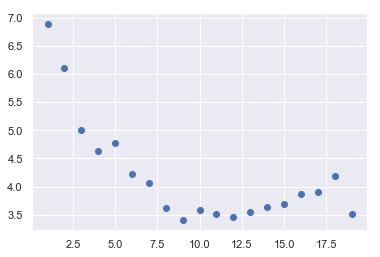

In [246]:
plt.scatter([i for i in range(1, 20)], mean_dif)

### Let's Look at Reward and Proximity

In [227]:
def build_that_histogram_rewards(x, title):
    bins = [i * 0.01 for i in range(-15, 100, 1)]
    plt.hist(x, bins=bins)

    plt.title(title)
    plt.xlabel('Reward')
    plt.ylabel('Count')
    plt.show()

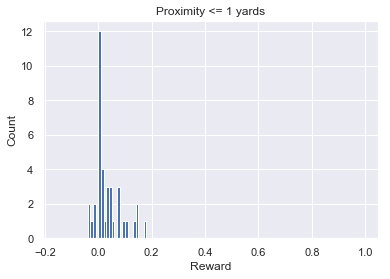

count    38.000000
mean      0.033296
std       0.052945
min      -0.037500
25%       0.000000
50%       0.014647
75%       0.049879
max       0.178082
Name: reward, dtype: float64


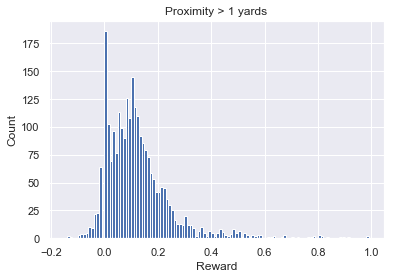

count    2535.000000
mean        0.124613
std         0.126305
min        -0.136364
25%         0.044118
50%         0.103448
75%         0.166667
max         0.986301
Name: reward, dtype: float64
---
---


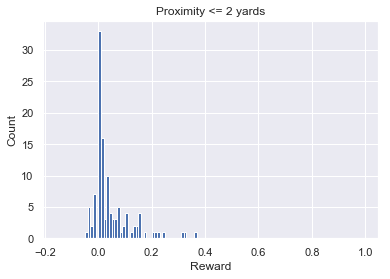

count    116.000000
mean       0.045230
std        0.076530
min       -0.046154
25%        0.000000
50%        0.013117
75%        0.069017
max        0.365854
Name: reward, dtype: float64


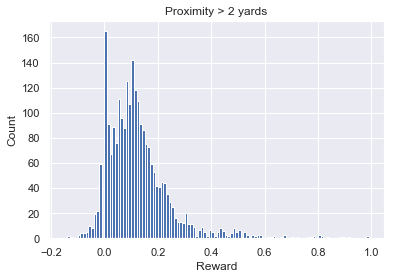

count    2457.000000
mean        0.126949
std         0.126703
min        -0.136364
25%         0.047619
50%         0.105263
75%         0.169014
max         0.986301
Name: reward, dtype: float64
---
---


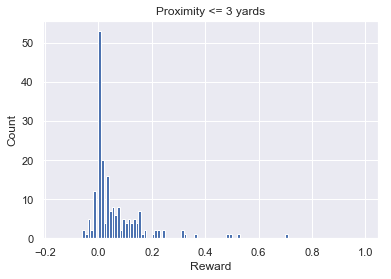

count    198.000000
mean       0.061491
std        0.103200
min       -0.058824
25%        0.000000
50%        0.029274
75%        0.092794
max        0.704545
Name: reward, dtype: float64


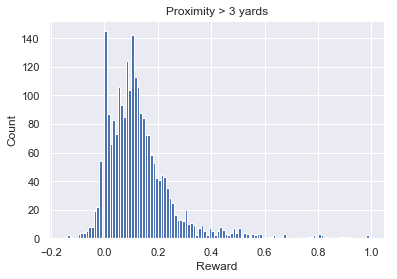

count    2375.000000
mean        0.128414
std         0.126391
min        -0.136364
25%         0.051948
50%         0.106383
75%         0.171875
max         0.986301
Name: reward, dtype: float64
---
---


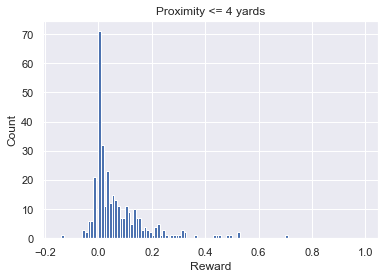

count    335.000000
mean       0.070751
std        0.106113
min       -0.136364
25%        0.000000
50%        0.036585
75%        0.109589
max        0.704545
Name: reward, dtype: float64


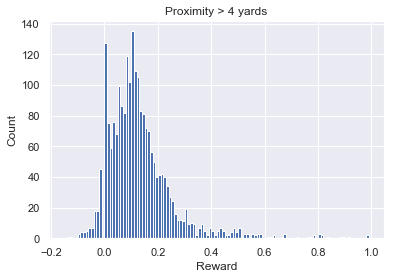

count    2238.000000
mean        0.131125
std         0.126889
min        -0.130952
25%         0.055556
50%         0.108434
75%         0.173768
max         0.986301
Name: reward, dtype: float64
---
---


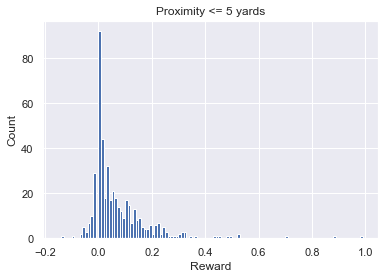

count    472.000000
mean       0.073297
std        0.115686
min       -0.136364
25%        0.000000
50%        0.036811
75%        0.111111
max        0.986301
Name: reward, dtype: float64


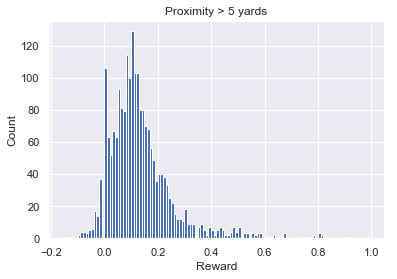

count    2101.000000
mean        0.134490
std         0.125535
min        -0.130952
25%         0.059524
50%         0.111111
75%         0.175676
max         0.981481
Name: reward, dtype: float64
---
---


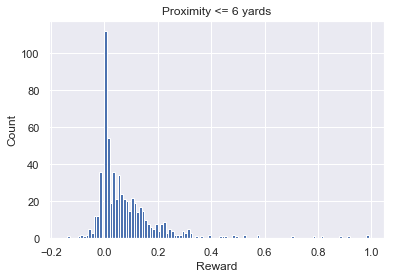

count    630.000000
mean       0.083691
std        0.131553
min       -0.136364
25%        0.000000
50%        0.048200
75%        0.119661
max        0.986301
Name: reward, dtype: float64


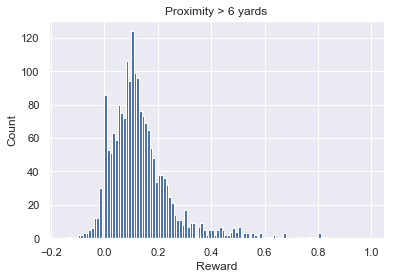

count    1943.000000
mean        0.136096
std         0.121458
min        -0.130952
25%         0.062500
50%         0.112676
75%         0.177317
max         0.890625
Name: reward, dtype: float64
---
---


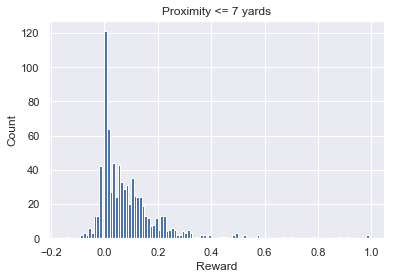

count    800.000000
mean       0.088893
std        0.127444
min       -0.136364
25%        0.000000
50%        0.057418
75%        0.126816
max        0.986301
Name: reward, dtype: float64


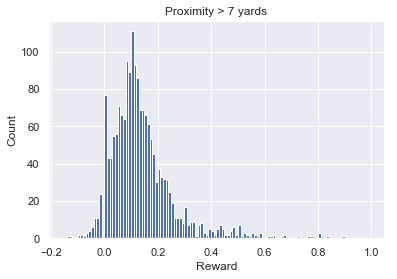

count    1773.000000
mean        0.138774
std         0.122271
min        -0.130952
25%         0.064935
50%         0.115789
75%         0.179487
max         0.890625
Name: reward, dtype: float64
---
---


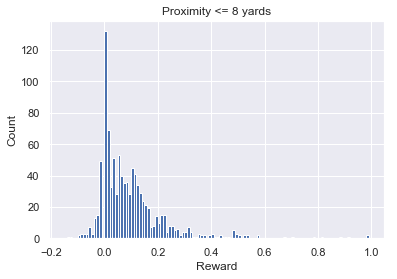

count    984.000000
mean       0.096095
std        0.127934
min       -0.136364
25%        0.011364
50%        0.066300
75%        0.133537
max        0.986301
Name: reward, dtype: float64


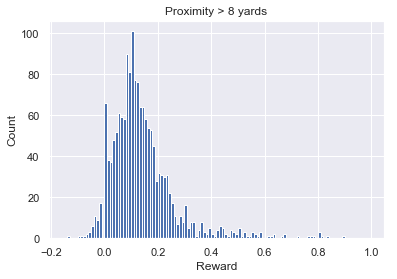

count    1589.000000
mean        0.140089
std         0.121845
min        -0.130952
25%         0.066667
50%         0.116883
75%         0.180328
max         0.890625
Name: reward, dtype: float64
---
---


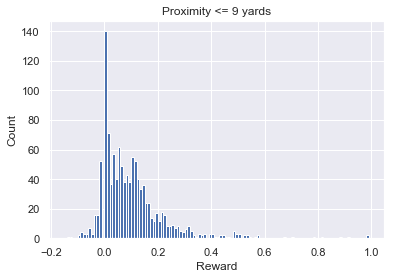

count    1156.000000
mean        0.100382
std         0.125191
min        -0.136364
25%         0.012821
50%         0.073802
75%         0.141063
max         0.986301
Name: reward, dtype: float64


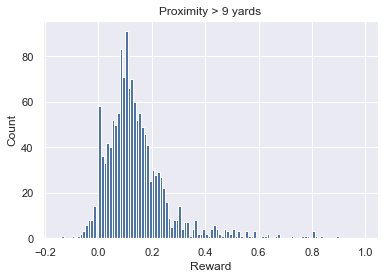

count    1417.000000
mean        0.141932
std         0.123621
min        -0.130952
25%         0.069767
50%         0.117647
75%         0.180851
max         0.890625
Name: reward, dtype: float64
---
---


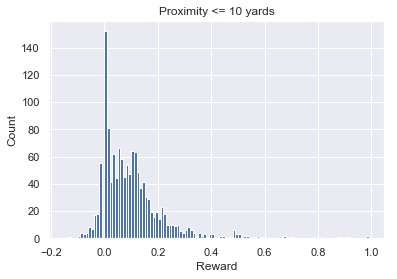

count    1329.000000
mean        0.101905
std         0.122954
min        -0.136364
25%         0.014493
50%         0.078947
75%         0.142857
max         0.986301
Name: reward, dtype: float64


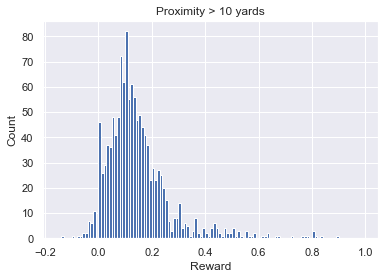

count    1244.000000
mean        0.146083
std         0.125284
min        -0.130952
25%         0.073938
50%         0.120482
75%         0.185317
max         0.890625
Name: reward, dtype: float64
---
---


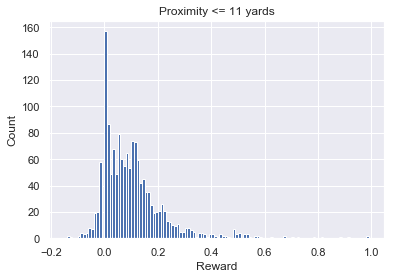

count    1504.000000
mean        0.105509
std         0.123801
min        -0.136364
25%         0.022663
50%         0.082904
75%         0.147059
max         0.986301
Name: reward, dtype: float64


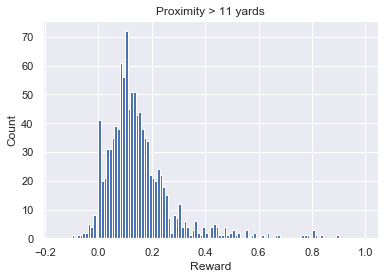

count    1069.000000
mean        0.148244
std         0.124910
min        -0.090909
25%         0.076087
50%         0.123288
75%         0.188406
max         0.890625
Name: reward, dtype: float64
---
---


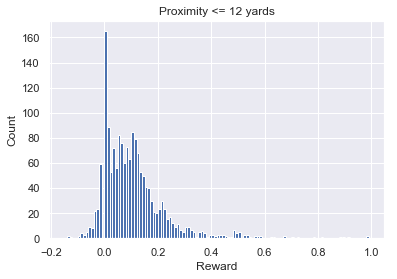

count    1676.000000
mean        0.108585
std         0.124941
min        -0.136364
25%         0.025000
50%         0.086688
75%         0.148273
max         0.986301
Name: reward, dtype: float64


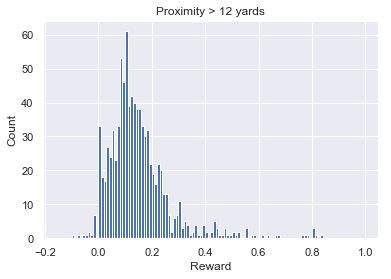

count    897.000000
mean       0.150693
std        0.123462
min       -0.090909
25%        0.081081
50%        0.126437
75%        0.189873
max        0.835165
Name: reward, dtype: float64
---
---


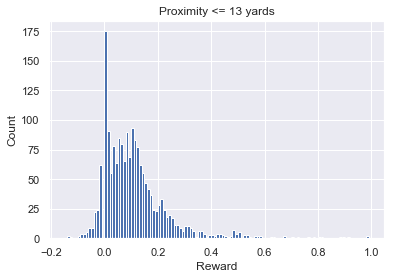

count    1837.000000
mean        0.111124
std         0.124854
min        -0.136364
25%         0.028571
50%         0.089286
75%         0.152174
max         0.986301
Name: reward, dtype: float64


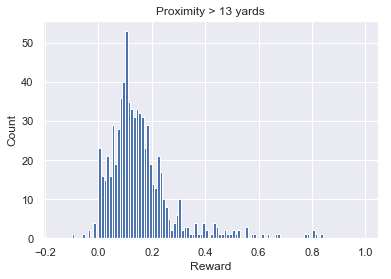

count    736.000000
mean       0.153565
std        0.123848
min       -0.090909
25%        0.082313
50%        0.128388
75%        0.190476
max        0.835165
Name: reward, dtype: float64
---
---


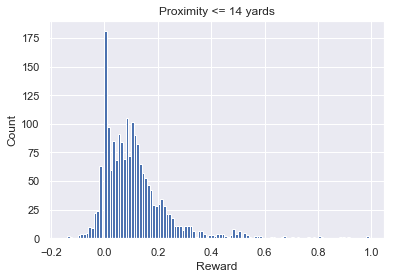

count    1979.000000
mean        0.113147
std         0.125513
min        -0.136364
25%         0.032258
50%         0.090909
75%         0.155364
max         0.986301
Name: reward, dtype: float64


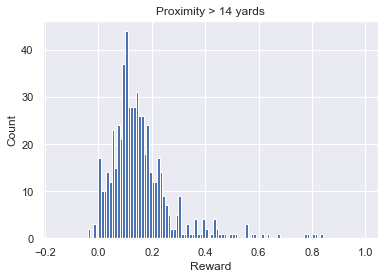

count    594.000000
mean       0.156972
std        0.121840
min       -0.037037
25%        0.089780
50%        0.132993
75%        0.192176
max        0.835165
Name: reward, dtype: float64
---
---


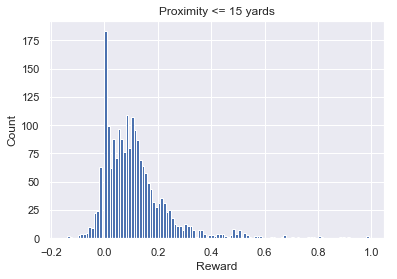

count    2082.000000
mean        0.114904
std         0.125669
min        -0.136364
25%         0.033946
50%         0.093023
75%         0.156149
max         0.986301
Name: reward, dtype: float64


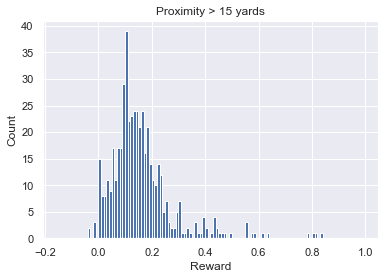

count    491.000000
mean       0.158714
std        0.121335
min       -0.037037
25%        0.090909
50%        0.136842
75%        0.194576
max        0.835165
Name: reward, dtype: float64
---
---


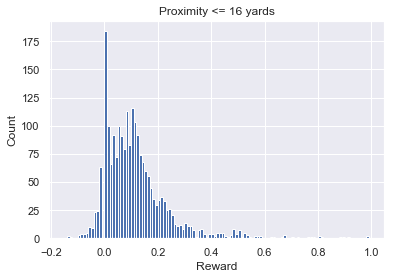

count    2175.000000
mean        0.116275
std         0.124772
min        -0.136364
25%         0.035191
50%         0.095238
75%         0.157895
max         0.986301
Name: reward, dtype: float64


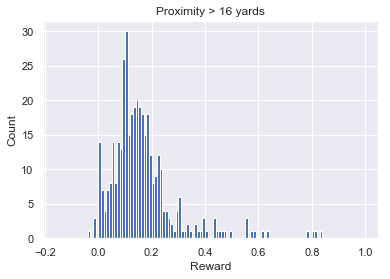

count    398.000000
mean       0.161462
std        0.126060
min       -0.035714
25%        0.092843
50%        0.138851
75%        0.194849
max        0.835165
Name: reward, dtype: float64
---
---


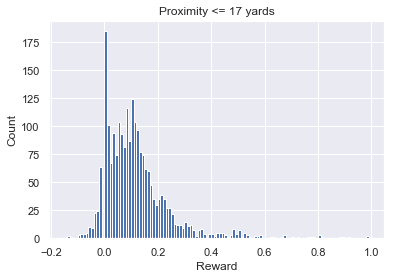

count    2249.000000
mean        0.117475
std         0.124929
min        -0.136364
25%         0.036145
50%         0.097561
75%         0.159091
max         0.986301
Name: reward, dtype: float64


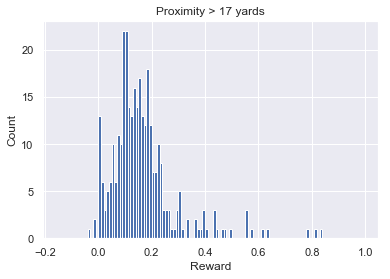

count    324.000000
mean       0.163454
std        0.126358
min       -0.035714
25%        0.093023
50%        0.140935
75%        0.195794
max        0.835165
Name: reward, dtype: float64
---
---


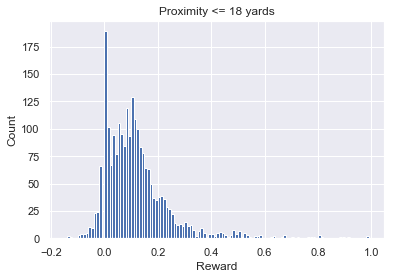

count    2325.000000
mean        0.118464
std         0.124471
min        -0.136364
25%         0.037037
50%         0.098592
75%         0.160494
max         0.986301
Name: reward, dtype: float64


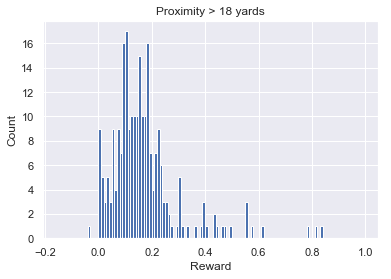

count    248.000000
mean       0.168265
std        0.131626
min       -0.035714
25%        0.093646
50%        0.147245
75%        0.200633
max        0.835165
Name: reward, dtype: float64
---
---


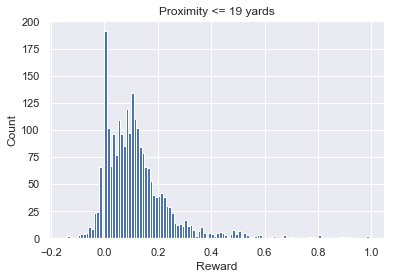

count    2380.000000
mean        0.120091
std         0.125529
min        -0.136364
25%         0.038462
50%         0.099451
75%         0.162162
max         0.986301
Name: reward, dtype: float64


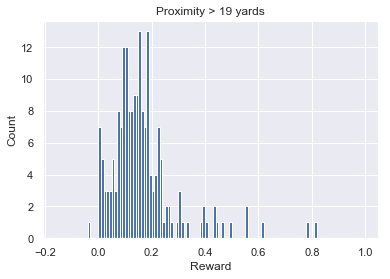

count    193.000000
mean       0.162400
std        0.125710
min       -0.035714
25%        0.093023
50%        0.141176
75%        0.191781
max        0.814815
Name: reward, dtype: float64
---
---


In [240]:
mean_dif = []
for i in range(1, 20):
    # Check for cases less than or equal to a certain distance
    where_condition = yard_and_proximity['proximity'] <= i
    title = 'Proximity <= ' + str(i) + ' yards'
    x = yard_and_proximity[where_condition]['reward']
    build_that_histogram_rewards(x, title)
    print(x.describe())
    mean1 = x.describe()[1]
    
    # Check for cases greater than than a certain distance
    where_condition = yard_and_proximity['proximity'] > i
    title = 'Proximity > ' + str(i) + ' yards'
    x = yard_and_proximity[where_condition]['reward']
    build_that_histogram_rewards(x, title)
    print(x.describe())
    mean2 = x.describe()[1]
    
    mean_dif.append(mean2 - mean1)
    print('---')
    print('---')

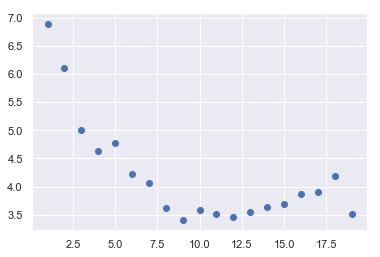

In [247]:
plt.scatter([i for i in range(1, 20)], mean_dif)

- So intuitively the further a punt team player is from the PR the higher the mean return distance and 'reward' value for return.
    - By looking at the plot of mean differences we can see at what yardage there is marginal gains in yardage between the distributions in proximities. This looks like about the distance of 8-9 yards.
- Considering this and that 18 of the concussions could have benefitted from a PR restricted zone of 8 yards, a rule for an 8 yard restricted zone for a PR is proposed.
- <b>PR Restricted Zone Rule:</b> The PR is given 8 yards to the nearest punt team player. If a punt team player infringes on this zone when the ball contacts a surface (player, field, ref) after the ball has been punted, the play is called dead and a 10 yard penalty is assesed from where the ball contacts a surface after the ball has been punted. A PR must be making attempt to catch the ball for this restricted zone to apply.

In [249]:
RB = 3
WR = 23
CB = 4
S = 2
salaries = [10250000, 634143, 555000, 622450, 2914000, 964443, 2792829, 705205, 
            1400000, 10000000, 1907000, 758915, 633944, 1400000, 1486143, 7000000, 
            1005000, 669998, 646555, 525000, 2820696, 769039, 540000, 480000, 
            741497, 2585497, 2340000, 905000, 1005000, 5500000, 6000000, 658961]
np.average(salaries)

2225509.84375

### Cost of Losing Punt Receiver
- 5 of 10 offensive players receiving a concussion are PR
    - PR Position Breakdown for current roster:
        - WR: 23, CB: 4, RB: 3, S: 2
    - Their value is ~2.2M/year and was calculated from:
        - https://www.ourlads.com/nfldepthcharts/depthchartpos/PR
        - https://www.spotrac.com/
    - 2013: 16 days on average off the field with a concussion
        - https://www.usatoday.com/story/sports/nfl/2013/07/31/concussions-keeping-nfl-players-off-the-field-longer/2604023/